In [1]:
#import things we need
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import umap
import seaborn as sns
from scipy.stats import zscore
from matplotlib.patches import Ellipse
import matplotlib.transforms as transforms

C:\Users\Kat\anaconda3\lib\site-packages\numpy\_distributor_init.py:30: UserWarning: loaded more than 1 DLL from .libs:
C:\Users\Kat\anaconda3\lib\site-packages\numpy\.libs\libopenblas.EL2C6PLE4ZYW3ECEVIV3OXXGRN2NRFM2.gfortran-win_amd64.dll
C:\Users\Kat\anaconda3\lib\site-packages\numpy\.libs\libopenblas.PYQHXLVVQ7VESDPUVUADXEVJOBGHJPAY.gfortran-win_amd64.dll
  warnings.warn("loaded more than 1 DLL from .libs:"


# Load data, rotate as needed, join dataframes together for ease of processing later

In [2]:
set_metric='euclidean'
set_stdevs=1 #standard deviations for ellipsoids
scrambled='no'

In [3]:
#import  data DAT-cre
DATcre66T = pd.read_excel(r'data/8dat-crebrains.xlsx')
#and import dat cre and gad2 also from 76 brain set
DATcre66T_gad2 = pd.read_excel(r'data/12datcre-and-gad2.xlsx')
#import coffee
caffeine_dat = pd.read_excel(r'data/Caffeine data.xlsx')
#import vglut2
VGlut2_cre = pd.read_excel(r'data/vGluT2-Cre.xlsx')

In [4]:
#import  data (all DA cells)
all_DA_cells = ['Cocaine','Control ketamine anesthesia','Control isoflurane anesthesia','Amphetamine',
                'Nicotine','Morphine','Fluoxetine','Ethanol','Stress',
                'GAD2-Cre isoflurane','GAD2-Cre Cocaine','GAD2-Cre isoflurane (lateral)','Toluene','Carbamazepine','Meth']
all_DA_cells_df = {} #empty dictionary
num_drugs=len(all_DA_cells) #get number of drugs/conditions
for drug in range(num_drugs):
    #read in the sheet with that drug name
    tempdf = pd.read_excel(r'data/organized drug and experience data for Bartas et al.xlsx',sheet_name=all_DA_cells[drug])
    #add id column with drug name and condition
    tempdf['condition']=all_DA_cells[drug]
    list1=list(tempdf['condition'])
    length=len(tempdf['condition'])
    list2=list(range(1,length+1))
    tempdf['condition_num']=[str(s) +'-'+ str(num) for s,num in zip(list1,list2)]
    tempdf.dropna(inplace=True)
    all_DA_cells_df[drug]=tempdf #put into dictionary at index

In [5]:
# #import NAcMed data
NAcMeds = ['cTRIO NAcMed cocaine 1 inj','NAcMed controls',
          'cTRIO NAcMed FC','cTRIO NAcMed ketamine anesthesi']
NAcMeds_df = {} #empty dictionary
num_drugs=len(NAcMeds) #get number of drugs/conditions
for drug in range(num_drugs):
    #read in the sheet with that drug name
    tempdf = pd.read_excel(r'data/organized drug and experience data for Bartas et al.xlsx',sheet_name=NAcMeds[drug])
    #add id column with drug name and condition
    tempdf['condition']=NAcMeds[drug]
    list1=list(tempdf['condition'])
    length=len(tempdf['condition'])
    list2=list(range(1,length+1))
    tempdf['condition_num']=[str(s) +'-'+ str(num) for s,num in zip(list1,list2)]
    tempdf.dropna(inplace=True)
    NAcMeds_df[drug]=tempdf #put into dictionary at index

In [6]:
NAcMed_data=pd.concat(
    NAcMeds_df,
    axis=0,
    join="outer",
    ignore_index=False,
    keys=None,
    levels=None,
    names=None,
    verify_integrity=False,
    copy=True,
)
NAcMed_data.rename(columns={"%Cortex": "%Anterior Cortex"},inplace=True) 
NAcMed_data = NAcMed_data[NAcMed_data.condition_num != "NAcMed controls-5"]
NAcMed_data = NAcMed_data[NAcMed_data.condition_num != "NAcMed controls-6"]

In [7]:
# #import NAcLat data
NAcLats = ['cTRIO NAcLat cocaine','NAcLat iso saline controls',
          'cTRIO NAcLat FC','cTRIO NAcLat ketamine anesthesi']
NAcLats_df = {} #empty dictionary
num_drugs=len(NAcLats) #get number of drugs/conditions
for drug in range(num_drugs):
    #read in the sheet with that drug name
    tempdf = pd.read_excel(r'data/organized drug and experience data for Bartas et al.xlsx',sheet_name=NAcLats[drug])
    #add id column with drug name and condition
    tempdf['condition']=NAcLats[drug]
    list1=list(tempdf['condition'])
    length=len(tempdf['condition'])
    list2=list(range(1,length+1))
    tempdf['condition_num']=[str(s) +'-'+ str(num) for s,num in zip(list1,list2)]
    tempdf.dropna(inplace=True)
    NAcLats_df[drug]=tempdf #put into dictionary at index

In [8]:
#combine NAcLat data
NAcLat_data=pd.concat(
    NAcLats_df,
    axis=0,
    join="outer",
    ignore_index=False,
    keys=None,
    levels=None,
    names=None,
    verify_integrity=False,
    copy=True,
) # NAcLat_data 'cTRIO NAcLat cocaine','NAcLat iso saline controls' 
NAcLat_data.rename(columns={"%Cortex": "%Anterior Cortex"},inplace=True)

In [9]:
# #import DLS data
DLSs = ['DLS_sal','DLS_coc1x','DLS_FC']
DLSs_df = {} #empty dictionary
num_drugs=len(DLSs) #get number of drugs/conditions
for drug in range(num_drugs):
    #read in the sheet with that drug name
    tempdf = pd.read_excel(r'data/organized drug and experience data for Bartas et al.xlsx',
                           sheet_name=DLSs[drug],skiprows=1)
    tempdf=tempdf.transpose()
    tempdf.columns = tempdf.iloc[0]
    tempdf = tempdf.iloc[1: , :]
    #add id column with drug name and condition
    tempdf['condition']=DLSs[drug]
    list1=list(tempdf['condition'])
    length=len(tempdf['condition'])
    list2=list(range(1,length+1))
    tempdf['condition_num']=[str(s) +'-'+ str(num) for s,num in zip(list1,list2)]
    tempdf.dropna(inplace=True)
    DLSs_df[drug]=tempdf #put into dictionary at index

In [10]:
#combine DLS data
DLS_data=pd.concat(
    DLSs_df,
    axis=0,
    join="outer",
    ignore_index=False,
    keys=None,
    levels=None,
    names=None,
    verify_integrity=False,
    copy=True,
)

In [11]:
# #import DLS data
DMSs = ['cTRIO DMS saline','cTRIO DMS cocaine']
DMSs_df = {} #empty dictionary
num_drugs=len(DMSs) #get number of drugs/conditions
for drug in range(num_drugs):
    #read in the sheet with that drug name
    tempdf = pd.read_excel(r'data/cTRIO DMS data.xlsx',
                           sheet_name=DMSs[drug])
    #add id column with drug name and condition
    tempdf['condition']=DMSs[drug]
    tempdf.dropna(inplace=True)
    tempdf.reset_index(inplace=True, drop=True)
    DMSs_df[drug]=tempdf #put into dictionary at index
#combine DLS data
DMS_data=pd.concat(
    DMSs_df,
    axis=0,
    join="outer",
    ignore_index=True,
    keys=None,
    levels=None,
    names=None,
    verify_integrity=False,
    copy=True,
)

In [12]:
# #import amygdala data
Amygs = ['cTRIO Amygdala cocaine 1 dose','cTRIO Amygdala isoflurane anest','cTRIO Amygdala AFC']
Amygs2= ['cTRIO Amygdala ketamine anesthe']
Amygs_df = {} #empty dictionary
num_drugs=len(Amygs) #get number of drugs/conditions
for drug in range(num_drugs):
    #read in the sheet with that drug name
    tempdf = pd.read_excel(r'data/organized drug and experience data for Bartas et al.xlsx',
                           sheet_name=Amygs[drug],skiprows=1)
    tempdf=tempdf.transpose()
    tempdf.columns = tempdf.iloc[0]
    tempdf = tempdf.iloc[1: , :]
    #add id column with drug name and condition
    tempdf['condition']=Amygs[drug]
    list1=list(tempdf['condition'])
    length=len(tempdf['condition'])
    list2=list(range(1,length+1))
    tempdf['condition_num']=[str(s) +'-'+ str(num) for s,num in zip(list1,list2)]
    tempdf.dropna(inplace=True)
    Amygs_df[drug]=tempdf #put into dictionary at index
for drug in range(1):
    #read in the sheet with that drug name
    tempdf = pd.read_excel(r'data/organized drug and experience data for Bartas et al.xlsx',sheet_name=Amygs2[drug])
    #add id column with drug name and condition
    tempdf['condition']=Amygs2[drug]
    list1=list(tempdf['condition'])
    length=len(tempdf['condition'])
    list2=list(range(1,length+1))
    tempdf['condition_num']=[str(s) +'-'+ str(num) for s,num in zip(list1,list2)]
    tempdf.dropna(inplace=True)
    Amygs_df[3]=tempdf #put into dictionary at index

In [13]:
#combine Amyg data
Amyg_data=pd.concat(
    Amygs_df,
    axis=0,
    join="outer",
    ignore_index=False,
    keys=None,
    levels=None,
    names=None,
    verify_integrity=False,
    copy=True,
)

In [14]:
Amyg_data.dropna(inplace=True,axis=1)

In [15]:
#import mPFC data
mPFCs = ['cTRIO mPFC isoflurane anesthesi','cTRIO mPFC cocaine 1 dose','cTRIO mPFC AFC']
mPFCs2= ['cTRIO mPFC ketamine anesthesia']
mPFCs_df = {} #empty dictionary
num_drugs=len(mPFCs) #get number of drugs/conditions
for drug in range(num_drugs):
    #read in the sheet with that drug name
    tempdf = pd.read_excel(r'data/organized drug and experience data for Bartas et al.xlsx',
                           sheet_name=mPFCs[drug],skiprows=1)
    tempdf=tempdf.transpose()
    tempdf.columns = tempdf.iloc[0]
    tempdf = tempdf.iloc[1: , :]
    #add id column with drug name and condition
    tempdf['condition']=mPFCs[drug]
    list1=list(tempdf['condition'])
    length=len(tempdf['condition'])
    list2=list(range(1,length+1))
    tempdf['condition_num']=[str(s) +'-'+ str(num) for s,num in zip(list1,list2)]
    tempdf.dropna(inplace=True)
    mPFCs_df[drug]=tempdf #put into dictionary at index
for drug in range(1):
    #read in the sheet with that drug name
    tempdf = pd.read_excel(r'data/organized drug and experience data for Bartas et al.xlsx',sheet_name=mPFCs2[drug])
    #add id column with drug name and condition
    tempdf['condition']=mPFCs2[drug]
    list1=list(tempdf['condition'])
    length=len(tempdf['condition'])
    list2=list(range(1,length+1))
    tempdf['condition_num']=[str(s) +'-'+ str(num) for s,num in zip(list1,list2)]
    tempdf.dropna(inplace=True)
    mPFCs_df[3]=tempdf #put into dictionary at index

In [16]:
# combine mPFC data
mPFC_data=pd.concat(
    mPFCs_df,
    axis=0,
    join="outer",
    ignore_index=False,
    keys=None,
    levels=None,
    names=None,
    verify_integrity=False,
    copy=True,
)

In [17]:
mPFC_data.dropna(inplace=True,axis=1)

In [18]:
all_data=pd.concat(
    all_DA_cells_df,
    axis=0,
    join="outer",
    ignore_index=False,
    keys=None,
    levels=None,
    names=None,
    verify_integrity=False,
    copy=True,
)

In [19]:

#DLSs = ['DLS_sal','DLS_coc1x','DLS_FC']
categories= pd.DataFrame({'group_name':['Psychostimulants','Ketamine','Controls',
                          'Psychostimulants','Other','Other','Fluoxetine','Other',
                          'Other','GAD2-Cre','GAD2-Cre','GAD2-Cre','Other','Other','Psychostimulants'],'condition5':all_DA_cells})
categories2= pd.DataFrame({'group_name':['Cocaine','Controls',
                          'FC','Ketamine'],'condition5':NAcMeds})
categories3= pd.DataFrame({'group_name':['Cocaine','Controls',
                          'FC','Ketamine'],'condition5':NAcLats})
categories4= pd.DataFrame({'group_name':['Cocaine','Controls','AFC',
                          'Ketamine'],'condition5':['cTRIO Amygdala cocaine 1 dose','cTRIO Amygdala isoflurane anest','cTRIO Amygdala AFC','cTRIO Amygdala ketamine anesthe']})
categories5= pd.DataFrame({'group_name':['Controls','Cocaine',
                          'AFC','Ketamine'],'condition5':['cTRIO mPFC isoflurane anesthesi','cTRIO mPFC cocaine 1 dose','cTRIO mPFC AFC','cTRIO mPFC ketamine anesthesia']})
categories6= pd.DataFrame({'group_name':['Controls','Controls','GAD2-Cre'],'condition5':['DAT-Cre', 'DAT-Cre 66T','Gad2-Cre']})
categories7= pd.DataFrame({'group_name':['vGluT2-Cre'],'condition5':['vGluT2-Cre']})
categories8= pd.DataFrame({'group_name':['Controls','Cocaine','Controls','Psychostimulants','Controls','Cocaine','Controls','Cocaine','Controls','Ketamine'],'condition5':['DLS_sal','DLS_coc1x','DLS_FC','Caffeine','cTRIO DMS saline','cTRIO DMS cocaine','cTRIO mPFC isoflurane anesthesi','cTRIO mPFC cocaine 1 dose','cTRIO mPFC AFC','cTRIO mPFC ketamine anesthesia']})

categories=pd.concat([categories,categories2,categories3,categories4,categories5,categories6,categories7,categories8])

In [20]:
all_data.replace({'GAD2-Cre isoflurane': 'Gad2-Cre', 'GAD2-Cre isoflurane (lateral)': 'Gad2-Cre'},inplace=True)

# calculate how many total mouse brains used in paper (NN)

In [21]:
dir()
# DLS_data ## not included?
# DMS_data ## not included 
# all_data[all_data["condition"] == 'caffeine'] #isovk=all_data[(all_data["condition"] == 'Control ketamine anesthesia')| 
        #        (all_data["condition"] == 'Control isoflurane anesthesia')]
#       'Amphetamine',  'Cocaine',
#       'Control isoflurane anesthesia', 'Control ketamine anesthesia',
#       'Fluoxetine', 'GAD2-Cre Cocaine', 'Gad2-Cre', 'Meth',
#       'Morphine', 'Nicotine'
##### excluding because not in final paper: 
#caffeine_dat 
#all_data: Ethanol Carbamazepine Stress Toluene 
#  FC condition from all ctrio
#excluded dms and dls
all1=len(all_data[(all_data["condition"] != 'Ethanol')&
                  (all_data["condition"] != 'Stress')&
                  (all_data["condition"] != 'Toluene')&
                  (all_data["condition"] != 'Carbamazepine')])
amyg=len(Amyg_data[Amyg_data["condition"] != 'cTRIO Amygdala AFC'])
vglu=len(VGlut2_cre)
gad2=len(DATcre66T_gad2)
mpfc=len(mPFC_data[mPFC_data["condition"] != 'cTRIO mPFC AFC']) 
nacl=len(NAcLat_data[NAcLat_data["condition"] != 'cTRIO NAcLat FC'])
nacm=len(NAcMed_data[NAcMed_data["condition"] != 'cTRIO NAcMed FC']) 
all1+amyg+vglu+gad2+mpfc+nacl+nacm

122

# Define some functions, variables, and other things we will use

In [22]:
uniq_colors=['mediumorchid','gray','royalblue','darkred','red','hotpink',
             'khaki','palegreen','seagreen','orange','lavender',
             'steelblue','navy','dodgerblue','thistle','violet',
             'deeppink','pink','slateblue','peru','darkorange',
             'magenta','cyan','lightcoral','lawngreen',
             'burlywood'] # to use later
uniq_colors2=['mediumorchid','gray','royalblue','darkred','hotpink',
             'khaki','palegreen','seagreen','orange','lavender',
             'steelblue','navy','dodgerblue','thistle','violet',
             'deeppink','pink','slateblue','peru','darkorange',
             'magenta','cyan','lightcoral','lawngreen',
             'burlywood','red'] # to use later
##1C8F37  blue old= new green #1C8F37,  grey old = new orange #E6752B, old purple = new blue #1C8F37
uniq_colors=['#2A6DA0','#E6752B','#1C8F37','darkred','red','hotpink',
             'khaki','palegreen','seagreen','orange','lavender',
             'steelblue','navy','dodgerblue','thistle','violet',
             'deeppink','pink','slateblue','peru','darkorange',
             'magenta','cyan','lightcoral','lawngreen',
             'burlywood'] # to use later
uniq_colors2=['#2A6DA0','#E6752B','#1C8F37','darkred','hotpink',
             'khaki','palegreen','seagreen','orange','lavender',
             'steelblue','navy','dodgerblue','thistle','violet',
             'deeppink','pink','slateblue','peru','darkorange',
             'magenta','cyan','lightcoral','lawngreen',
             'burlywood','red'] # to use later

In [23]:
#from https://matplotlib.org/devdocs/gallery/statistics/confidence_ellipse.html
def confidence_ellipse(x, y, ax, n_std=set_stdevs, facecolor='none', **kwargs):
    """
    Create a plot of the covariance confidence ellipse of *x* and *y*.

    Parameters
    ----------
    x, y : array-like, shape (n, )
        Input data.

    ax : matplotlib.axes.Axes
        The axes object to draw the ellipse into.

    n_std : float
        The number of standard deviations to determine the ellipse's radiuses.

    **kwargs
        Forwarded to `~matplotlib.patches.Ellipse`

    Returns
    -------
    matplotlib.patches.Ellipse
    """
    if x.size != y.size:
        raise ValueError("x and y must be the same size")

    cov = np.cov(x, y)
    pearson = cov[0, 1]/np.sqrt(cov[0, 0] * cov[1, 1])
    # Using a special case to obtain the eigenvalues of this
    # two-dimensionl dataset.
    ell_radius_x = np.sqrt(1 + pearson)
    ell_radius_y = np.sqrt(1 - pearson)
    ellipse = Ellipse((0, 0), width=ell_radius_x * 2, height=ell_radius_y * 2,
                      facecolor=facecolor, **kwargs)

    # Calculating the stdandard deviation of x from
    # the squareroot of the variance and multiplying
    # with the given number of standard deviations.
    scale_x = np.sqrt(cov[0, 0]) * n_std
    mean_x = np.mean(x)

    # calculating the stdandard deviation of y ...
    scale_y = np.sqrt(cov[1, 1]) * n_std
    mean_y = np.mean(y)

    transf = transforms.Affine2D() \
        .rotate_deg(45) \
        .scale(scale_x, scale_y) \
        .translate(mean_x, mean_y)

    ellipse.set_transform(transf + ax.transData)
    return ax.add_patch(ellipse)

In [24]:
def signif(x, p): #get p significant digits of all of a numpy array (why does base numpy not have this...)
    x = np.asarray(x)
    x_positive = np.where(np.isfinite(x) & (x != 0), np.abs(x), 10**(p-1))
    mags = 10 ** (p - 1 - np.floor(np.log10(x_positive)))
    return np.round(x * mags) / mags

In [25]:
def plot_components(components_df,figname4='figures/temp.svg'): #plot feature importance of the PCA components 1-5
    #code adapted from 
    #https://matplotlib.org/stable/gallery/images_contours_and_fields/image_annotated_heatmap.html
    fig, ax = plt.subplots(figsize=(6, 13))
    comptemp0=components_df.transpose()
    comptemp1=comptemp0.to_numpy()
    comptemp=signif(comptemp1,3)
    im = ax.imshow(comptemp)
    pca5=['PC 1', 'PC 2', 'PC 3', 'PC 4', 'PC 5']
    regions=components_df.columns
    # We want to show all ticks...
    ax.set_xticks(np.arange(len(pca5)))
    ax.set_yticks(np.arange(len(regions)))
    # ... and label them with the respective list entries
    ax.set_xticklabels(pca5)
    ax.set_yticklabels(regions)

    # Rotate the tick labels and set their alignment.
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
             rotation_mode="anchor")
    fig.colorbar(im)

    # Loop over data dimensions and create text annotations.
    for i in range(len(regions)):
        for j in range(len(pca5)):
            text = ax.text(j, i, comptemp[i, j],
                           ha="center", va="center", color="w")

    ax.set_title("Components and Feature Importance")
    fig.tight_layout()
    plt.savefig(figname4)
    plt.show()

In [26]:
def make_pca_plots(pc1,pc2,pc3,group,labels,grouped_elipse='yes',figname1='figures/temp.svg',figname2='figures/temp.svg',figname3='figures/temp.svg'): #makes plots of pc1v2, 1v3, and 2v3
    align_embed= pd.DataFrame({'pc1': pc1.values,'pc2': pc2.values,'pc3': pc3.values},index=labels)
    fig, ax = plt.subplots(figsize=(8, 6)) #init  fig
    if grouped_elipse=='no':
        for i,r in enumerate(np.unique(align_embed.index.values)):
            drug1=align_embed[align_embed.index == r]
            ax.scatter(drug1['pc1'],drug1['pc2'],c=uniq_colors[i],label=r)
            confidence_ellipse(drug1['pc1'],drug1['pc2'], ax, alpha=0.5, n_std=set_stdevs, facecolor=uniq_colors[i], edgecolor=uniq_colors[i], zorder=0)
            ax.set_xlabel('PC 1')
            ax.set_ylabel('PC 2')
        ax.legend(loc="right",bbox_to_anchor=(1.6, 0.5)) #make legend not on the plot
        plt.savefig(figname1)
        plt.show()
        fig, ax = plt.subplots(figsize=(8, 6)) #init  fig
        for i,r in enumerate(np.unique(align_embed.index.values)):
            drug1=align_embed[align_embed.index == r]
            ax.scatter(drug1['pc1'],drug1['pc3'],c=uniq_colors[i],label=r)
            confidence_ellipse(drug1['pc1'],drug1['pc3'], ax, alpha=0.5, n_std=set_stdevs, facecolor=uniq_colors[i], edgecolor=uniq_colors[i], zorder=0)
            ax.set_xlabel('PC 1')
            ax.set_ylabel('PC 3')
        ax.legend(loc="right",bbox_to_anchor=(1.6, 0.5)) #make legend not on the plot
        plt.savefig(figname2)
        plt.show()
        fig, ax = plt.subplots(figsize=(8, 6)) #init  fig
        for i,r in enumerate(np.unique(align_embed.index.values)):
            drug1=align_embed[align_embed.index == r]
            ax.scatter(drug1['pc2'],drug1['pc3'],c=uniq_colors[i],label=r)
            confidence_ellipse(drug1['pc2'],drug1['pc3'], ax, alpha=0.5, n_std=set_stdevs, facecolor=uniq_colors[i], edgecolor=uniq_colors[i], zorder=0)
            ax.set_xlabel('PC 2')
            ax.set_ylabel('PC 3')
    else:
        align_embed['condition5']=list(labels) #categories
        
        category_df=align_embed.merge(categories,on='condition5',copy=True).dropna() 
        for i,r in enumerate(np.unique(align_embed.index.values)):
            drug1=align_embed[align_embed.index == r]
            ax.scatter(drug1['pc1'],drug1['pc2'],c=uniq_colors[i],label=r)
            ax.set_xlabel('PC 1')
            ax.set_ylabel('PC 2')
        for i,r in enumerate(np.unique(category_df['group_name'])):
            drug1=category_df[category_df['group_name']== r]
            confidence_ellipse(drug1['pc1'],drug1['pc2'], ax, alpha=0.5, n_std=set_stdevs, facecolor=uniq_colors[i], edgecolor=uniq_colors[i], zorder=0,label=r)
        ax.legend(loc="right",bbox_to_anchor=(1.6, 0.5)) #make legend not on the plot
        plt.savefig(figname1)
        plt.show()
        fig, ax = plt.subplots(figsize=(8, 6)) #init  fig
        for i,r in enumerate(np.unique(align_embed.index.values)):
            drug1=align_embed[align_embed.index == r]
            ax.scatter(drug1['pc1'],drug1['pc3'],c=uniq_colors[i],label=r)
            ax.set_xlabel('PC 1')
            ax.set_ylabel('PC 3')
        for i,r in enumerate(np.unique(category_df['group_name'])):
            drug1=category_df[category_df['group_name']== r]
            confidence_ellipse(drug1['pc1'],drug1['pc3'], ax, alpha=0.5, n_std=set_stdevs, facecolor=uniq_colors[i], edgecolor=uniq_colors[i], zorder=0,label=r)
        ax.legend(loc="right",bbox_to_anchor=(1.6, 0.5)) #make legend not on the plot
        plt.savefig(figname2)
        plt.show()
        fig, ax = plt.subplots(figsize=(8, 6)) #init  fig
        for i,r in enumerate(np.unique(align_embed.index.values)):
            drug1=align_embed[align_embed.index == r]
            ax.scatter(drug1['pc2'],drug1['pc3'],c=uniq_colors[i],label=r)
            ax.set_xlabel('PC 2')
            ax.set_ylabel('PC 3')
        for i,r in enumerate(np.unique(category_df['group_name'])):
            drug1=category_df[category_df['group_name']== r]
            confidence_ellipse(drug1['pc2'],drug1['pc3'], ax, alpha=0.5, n_std=set_stdevs, facecolor=uniq_colors[i], edgecolor=uniq_colors[i], zorder=0,label=r)
    ax.legend(loc="right",bbox_to_anchor=(1.6, 0.5)) #make legend not on the plot
    plt.savefig(figname3)
    plt.show()

In [27]:
def get_feats_and_labels(dataframe): #gets features and conditions (drugs) and brain regions
    labels=dataframe['condition'].values
    condition_nums=dataframe['condition_num'].values
    features=dataframe.iloc[: , 2:24]
    if scrambled == 'yes':
        features = features.sample(frac=1).reset_index(drop=True)
    regions=features.columns
    return features, labels, condition_nums, regions

In [28]:
featuresDMS, labelsDMS, condition_numsDMS, regionsDMS =get_feats_and_labels(DMS_data)

In [29]:
gad2only2=all_data[(all_data["condition"] == 'Gad2-Cre')]
features4, labels4, condition_nums4, regions4 = get_feats_and_labels(gad2only2)

gad2only2.to_csv("data/fig1/fig1-gad2.csv",index=False)
DATcre66T_gad2.to_csv("data/fig1/fig1-DATcre_gad2.csv",index=False)
VGlut2_cre.to_csv("data/fig1/fig1-vglut2.csv",index=False)
gad2only2

animal id  total   %Cortex   %NAcMed   %NAcLat   %NAcCore      %DStr  \
9  0          1   4723  0.762227  4.382808  3.493542  12.005082   7.304679   
   1          2   4463  2.083800  3.562626  4.570916   4.705355   2.554336   
   2          3   1892  2.378436  2.695560  1.902748   7.293869   1.427061   
   3          4   7266  2.394715  3.550784  3.055326   5.202312   1.940545   
   4          5  13125  1.531429  9.028571  9.325714  13.714286  10.240000   
11 0          1   1042  1.439539  0.863724  0.863724   0.863724   0.000000   
   1          2   6016  1.296543  4.787234  3.939495   6.582447   6.432846   
   2          3   3216  2.332090  2.891791  3.264925   6.809701  13.526119   
   3          4   6222  1.639344  3.567985  5.834137  10.607522   7.039537   

            %VP       %PO   %Septum  ...      %MHb       %CeA       %LH  \
9  0   6.669490  6.034300  0.254076  ...  0.190557   3.620580  5.335592   
   1   1.008290  1.142729  0.000000  ...  0.134439   4.033162  9.141833   
   2   1.585624  3.964059  0.317125  ...  0.000000  12.526427  6.659619   
   3  11.560694  3.179191  0.206441  ...  0.454170   3.715937  8.711808   
   4   9.600000  3.268571  0.708571  ...  0.571429   2.605714  7.520000   
11 0   1.439539  0.575816  0.000000  ...  0.000000   7.197697  3.742802   
   1   6.881649  2.642952  0.149601  ...  0.000000   4.537899  6.382979   
   2   4.291045  2.332090  0.279851  ...  0.000000  12.033582  8.302239   
   3   6.027001  2.796528  0.096432  ...  0.192864   6.702025  6.412729   

            %ZI        %DR      %LDT       %PBN      %DCN  condition  \
9  0  10.988778   9.591361  2.498412   3.620580  1.715012   Gad2-Cre   
   1  10.687878  23.325118  2.733587  10.889536  3.293749   Gad2-Cre   
   2  13.953488  18.076110  1.374207   2.536998  3.488372   Gad2-Cre   
   3   8.876961  17.588770  1.238646   7.225434  1.197358   Gad2-Cre   
   4   5.714286   5.348571  0.365714   2.651429  1.257143   Gad2-Cre   
11 0  40.595010   8.061420  0.959693   3.454894  3.454894   Gad2-Cre   
   1   8.477394  15.658245  3.856383   5.285904  1.595745   Gad2-Cre   
   2  13.339552   8.208955  0.373134   2.798507  2.052239   Gad2-Cre   
   3   7.810993  12.921890  1.639344   8.341369  0.964320   Gad2-Cre   

                        condition_num  
9  0            GAD2-Cre isoflurane-1  
   1            GAD2-Cre isoflurane-2  
   2            GAD2-Cre isoflurane-3  
   3            GAD2-Cre isoflurane-4  
   4            GAD2-Cre isoflurane-5  
11 0  GAD2-Cre isoflurane (lateral)-1  
   1  GAD2-Cre isoflurane (lateral)-2  
   2  GAD2-Cre isoflurane (lateral)-3  
   3  GAD2-Cre isoflurane (lateral)-4  

[9 rows x 26 columns]

In [30]:
#modularized pieter's code
def umap_n_times(X_scaled,labels,n_neighbors,N = 20,metric='euclidean'):
    umap_distances = np.zeros((len(labels),len(labels),N,))
    for n in range(0,N):
        if scrambled == 'yes':
            X_scaled=np.random.permutation(X_scaled)
        embedding=umap.UMAP(n_neighbors=n_neighbors,metric=metric).fit_transform(X_scaled)
        for r1 in range(0,len(labels)):
            for r2 in range(0,len(labels)):
                d = np.sum((embedding[r1]-embedding[r2])**2)**(0.5)
                umap_distances[r1,r2,n]=d
        max_distance = np.max(umap_distances[:,:,n])
        umap_distances[:,:,n] = umap_distances[:,:,n]/max_distance
    umap_distances_means = np.mean(umap_distances,axis=2)
    return umap_distances_means

In [31]:
#modularized pieter's code
def umap_dist_heatmap(t1,indexed='no'):
    if indexed=='yes':
        labs=labels.values
        uniq=list(range(len(labels)))
        uniq_labels = [str(i) +'_'+ str(j) for i, j in zip(labs, uniq)]
    else:
        labs=labels.values
        uniq=[x[1] for x in labels.index.values]
        uniq_labels = [str(i) +'_'+ str(j) for i, j in zip(labs, uniq)]
    fig,ax =plt.subplots(figsize=(10,4))
    plt.pcolor(t1, cmap="RdYlBu_r")

    plt.yticks(np.arange(0.5, len(uniq_labels), 1),uniq_labels)
    plt.xticks(np.arange(0.5, len(uniq_labels), 1),uniq_labels)
    plt.colorbar()
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
             rotation_mode="anchor")
    plt.show()

In [32]:
#modularized pieter's code
def pca_distance(X_scaled,labels,N=20):
    pca_distances = np.zeros((len(labels),len(labels),N,))
    for n in range(0,N):
        pca = PCA(n_components=2)
        #PCA using the scaled drug data array made earlier - permutationd on axis 0
        if scrambled == 'yes':
            X_scaled=np.random.permutation(X_scaled)
        embedding= pca.fit_transform(X_scaled)
        for r1 in range(0,len(labels)):
            for r2 in range(0,len(labels)):
                d = np.sum((embedding[r1]-embedding[r2])**2)**(0.5)
                pca_distances[r1,r2,n]=d
        max_distance = np.max(pca_distances[:,:,n])
        pca_distances[:,:,n] = pca_distances[:,:,n]/max_distance
    pca_distances_means = np.mean(pca_distances,axis=2)
    return pca_distances_means

In [33]:
def umap_and_heatmap(X_scaled,labels,condition_nums,grouped_elipse='yes',figname1='figures/temp.svg',figname2='figures/temp.svg',figname3='figures/temp.svg',figname4='figures/temp.svg'):
    neighbors=int(len(labels)/3)
 
    metrics=set_metric
    reducer = umap.UMAP(metric=metrics,n_neighbors=neighbors,random_state=1) 
    embedding = reducer.fit_transform(X_scaled)

    align_embed= pd.DataFrame(embedding,index=labels,columns=['umap1','umap2'])
#     fig, ax = plt.subplots(figsize=(12, 10)) #init  fig
#     for i,r in enumerate(np.unique(align_embed.index.values)):
#         drug1=align_embed[align_embed.index == r]
#         ax.scatter(drug1['umap1'],drug1['umap2'],c=uniq_colors[i],label=r)
#     for i, txt in enumerate(condition_nums):
#         ax.annotate(txt, (embedding[i,0], embedding[i,1]))
#     ax.legend(loc="right",bbox_to_anchor=(1.6, 0.5))
#     ax.set_xlabel('UMAP 1')
#     ax.set_ylabel('UMAP 2')
#     plt.show()
    
    fig, ax = plt.subplots(figsize=(12, 10)) #init  fig
    if grouped_elipse=='no':
        for i,r in enumerate(np.unique(align_embed.index.values)):
            drug1=align_embed[align_embed.index == r]
            ax.scatter(drug1['umap1'],drug1['umap2'],c=uniq_colors[i],label=r)
            confidence_ellipse(drug1['umap1'],drug1['umap2'], ax, alpha=0.5, n_std=set_stdevs, facecolor=uniq_colors2[i], edgecolor=uniq_colors2[i], zorder=0)
    else:
        align_embed['condition5']=list(labels) #categories
        category_df=align_embed.merge(categories,on='condition5',copy=True).dropna()
        for i,r in enumerate(np.unique(align_embed.index.values)):
            drug1=align_embed[align_embed.index == r]
            ax.scatter(drug1['umap1'],drug1['umap2'],c=uniq_colors[i],label=r)
        for i,r in enumerate(np.unique(category_df['group_name'])):
            drug1=category_df[category_df['group_name']== r]
            confidence_ellipse(drug1['umap1'],drug1['umap2'], ax, alpha=0.5, n_std=set_stdevs, facecolor=uniq_colors2[i], edgecolor=uniq_colors2[i], zorder=0,label=r)
    leg2 = ax.legend(loc="right",bbox_to_anchor=(1.6, 0.5))
    ax.set_xlabel('UMAP 1')
    ax.set_ylabel('UMAP 2')
    plt.savefig(figname1)
    plt.show()

    #distance heatmap
    to_heatmap=umap_n_times(X_scaled,labels,metric=metrics,n_neighbors=neighbors) 
    means_df = pd.DataFrame(to_heatmap,index=condition_nums,columns=condition_nums)
    cm = sns.clustermap(means_df,yticklabels=True,xticklabels=True)
    cm.fig.suptitle("average umap relative distance")
    cm.fig.set_size_inches(18, 18)
    plt.savefig(figname2)
    plt.show()
    distance_to_other_points(to_heatmap,labels,condition_nums,' - UMAP',figname3=figname3,figname4=figname4) # umap

In [34]:
def distance_to_other_points(to_heatmap,labels,condition_nums,umap_or_pca,figname3='figures/temp.svg',figname4='figures/temp.svg'):
    means_df2 = pd.DataFrame(to_heatmap,index=labels,columns=condition_nums)
    labels2=[str(s) +'_average' for s in labels]
    means_df2['condition2']=labels2
    means_df2=means_df2.groupby(['condition2']).mean().transpose()
    cm = sns.clustermap(means_df2,yticklabels=True,xticklabels=True)
    cm.fig.suptitle("point distance - average by condition 1 axis"+umap_or_pca)
    cm.fig.set_size_inches(18, 18)
    plt.savefig(figname3)
    plt.show()
    means_df2['condition3']=labels2
    means_df2=means_df2.groupby(['condition3']).mean().transpose()
    cm = sns.clustermap(means_df2,yticklabels=True,xticklabels=True)
    cm.fig.suptitle("point distance - average by condition both axis"+umap_or_pca)
    cm.fig.set_size_inches(18, 18)
    plt.savefig(figname4)
    plt.show()

# all DA cells (below)
# ALL DATA INLUDED 

In [35]:
def get_feats_and_labels(dataframe):
    labels=dataframe['Experimental condition']
    condition_nums=dataframe['condition_nums']
    features=dataframe.iloc[: , 1:23]
    if scrambled == 'yes':
        features = features.sample(frac=1).reset_index(drop=True)
    regions=features.columns
    return features, labels, condition_nums, regions
features2, labels2, condition_nums2, regions2 = get_feats_and_labels(caffeine_dat)

In [36]:
def get_feats_and_labels(dataframe): #gets features and conditions (drugs) and brain regions
    labels=dataframe['condition'].values
    condition_nums=dataframe['condition_num'].values
    features=dataframe.iloc[: , 2:24]
    if scrambled == 'yes':
        features = features.sample(frac=1).reset_index(drop=True)
    regions=features.columns
    return features, labels, condition_nums, regions

In [37]:
features, labels, condition_nums, regions = get_feats_and_labels(all_data)
labels=list(labels)+list(labels2)
condition_nums=list(condition_nums)+list(condition_nums2)
#scale X 
X1=features.to_numpy().astype(float)
X2=features2.to_numpy().astype(float)
X=np.vstack((X1, X2))
#get rid of NAs before scaling
#X_scaled=StandardScaler().fit_transform(X) 
X_scaled=zscore(X,axis=0)
X_scaled.sum(axis=0)

array([-7.32747196e-15,  1.89431804e-14, -2.49522625e-14,  5.55111512e-16,
       -7.10542736e-15, -5.96189764e-14,  1.22124533e-15,  4.66293670e-15,
        1.19626531e-14,  1.54876112e-14,  8.88178420e-16,  1.89848137e-14,
       -1.75415238e-14, -4.39648318e-14, -5.55111512e-16, -1.64313008e-14,
        1.27675648e-15,  1.22124533e-15, -1.92068583e-14,  1.44328993e-14,
       -2.32036612e-14, -1.66533454e-15])

In [38]:
#can change n_components to more if you want to visualize in 3D 
pca = PCA(n_components=5)
#PCA using the scaled drug data array made earlier
principalComponents = pca.fit_transform(X_scaled)
#make into dataframe if you want to view with labels
principalDf = pd.DataFrame(data = principalComponents
             , columns = ['principal component 1', 'principal component 2', 'principal component 3', 'principal component 4', 'principal component 5'])
region_components=pd.DataFrame(data = pca.components_ , columns = regions)
#view df
print('Explained variance for each PC: 1, 2, 3')
print(pca.explained_variance_)
principalDf

Explained variance for each PC: 1, 2, 3
[5.26775131 4.77583344 2.23034025 1.76854427 1.264953  ]


,principal component 1,principal component 2,principal component 3,principal component 4,principal component 5
0,-2.438772,0.277301,1.147528,-0.177805,0.748741
1,0.362998,1.781013,-0.239563,-0.398861,-0.321504
2,0.049279,2.237324,-0.427209,-2.698350,-0.504689
3,2.366910,-2.302259,-1.791965,-0.951970,-1.208642
4,-1.492543,-2.990548,0.843706,-0.080979,-0.382860
...,...,...,...,...,...
66,-1.221975,-0.253167,-1.112855,-0.434051,0.772353
67,-1.577112,2.357076,-0.072130,1.423111,-1.553538
68,-0.147882,2.620141,-1.460404,1.395957,-1.703857
69,0.556119,-0.131958,-2.573847,2.309511,-0.064395


### PCA plots

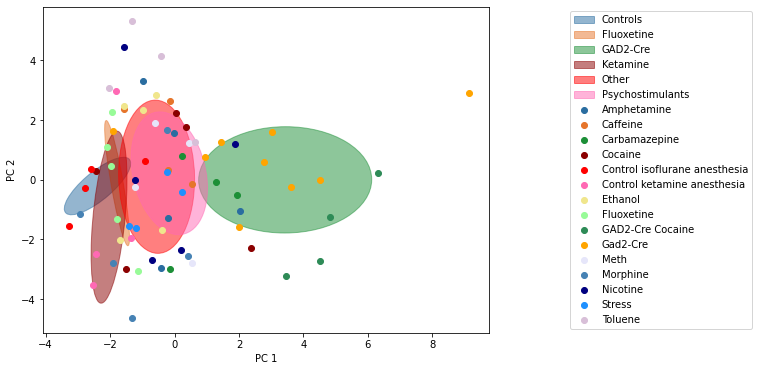

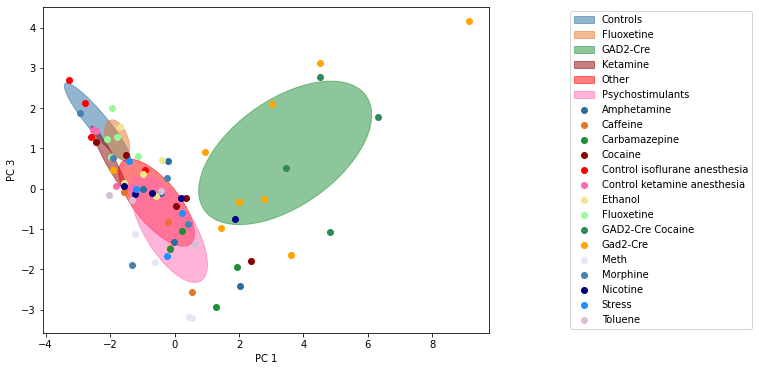

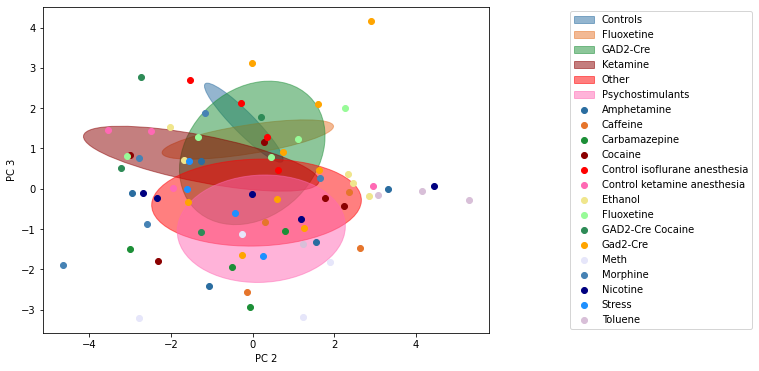

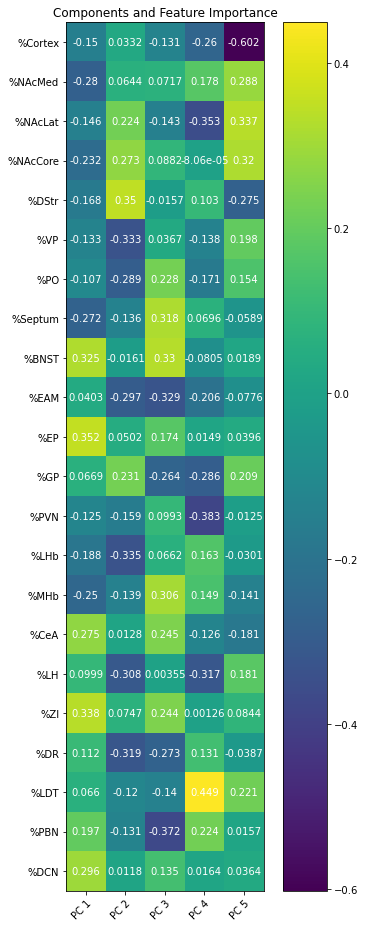

In [39]:
pc1=principalDf['principal component 1']
pc2=principalDf['principal component 2']
pc3=principalDf['principal component 3']
group = condition_nums 
make_pca_plots(pc1,pc2,pc3,group,labels,grouped_elipse='yes',figname1='figures/note0-in38-1.svg',figname2='figures/note0-in38-2.svg',figname3='figures/note0-in38-3.svg')
plot_components(region_components,figname4='figures/note0-in38-4.svg')

C:\Users\Kat\anaconda3\lib\site-packages\seaborn\matrix.py:619: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  linkage = hierarchy.linkage(self.array, method=self.method,


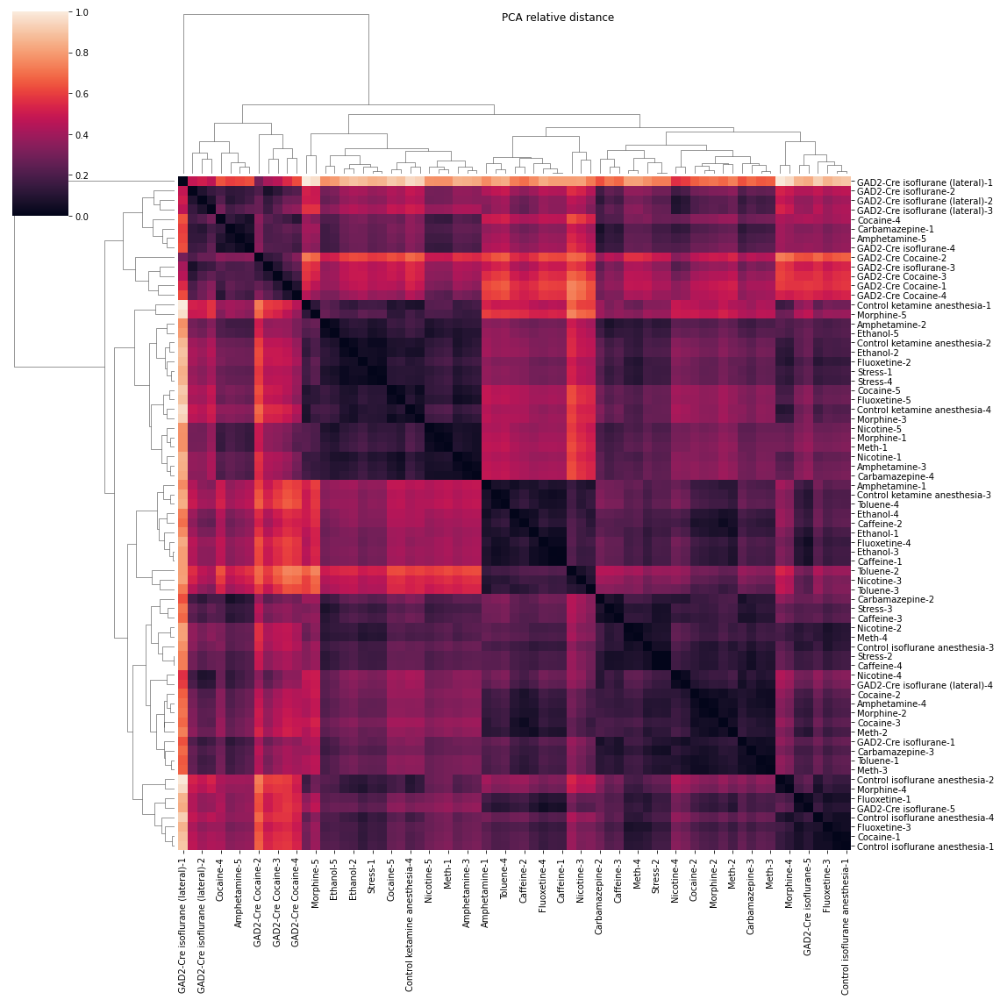

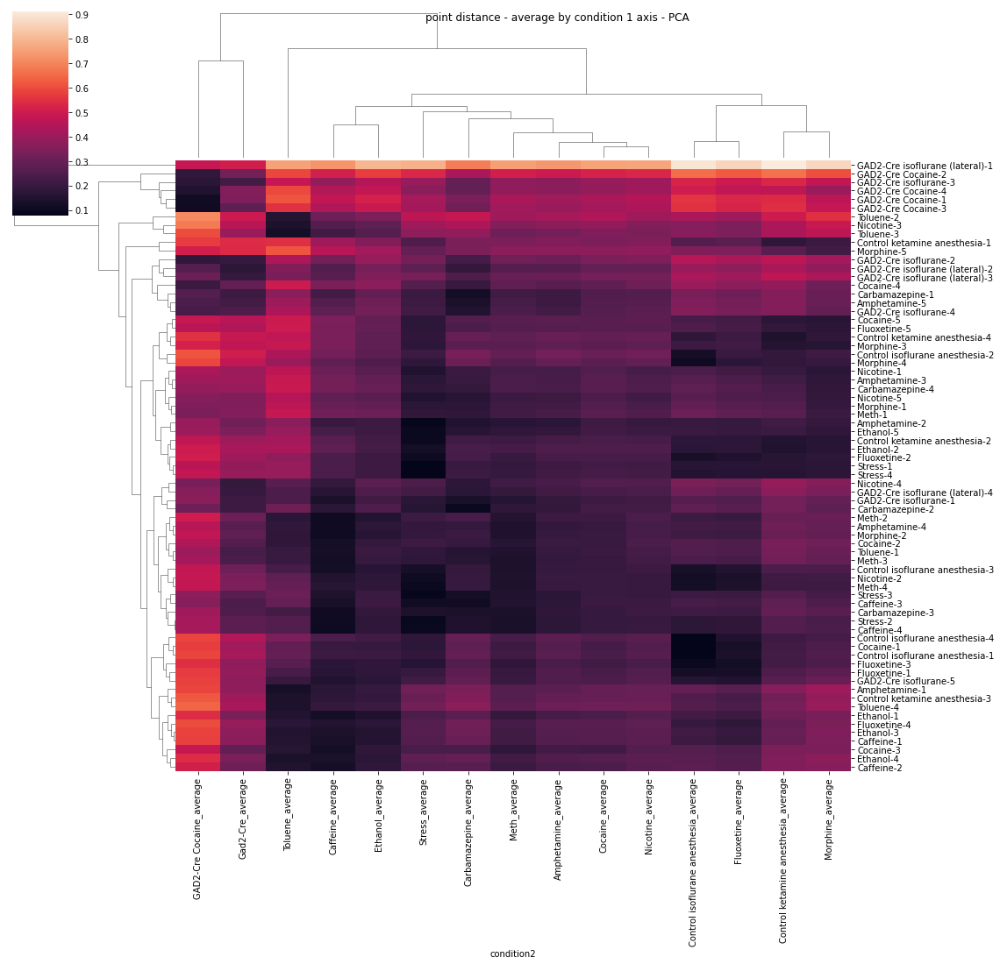

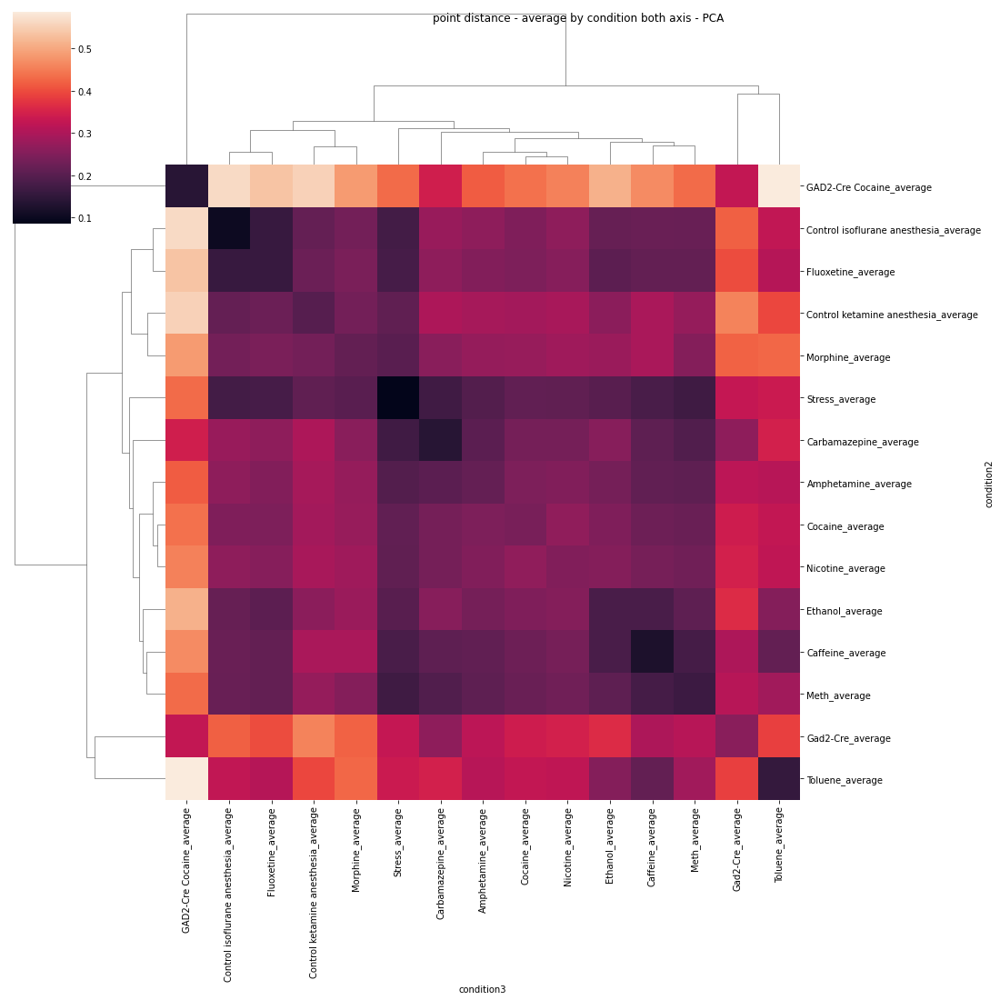

In [40]:
pca_dist=pca_distance(X_scaled,labels)
heatmapdf = pd.DataFrame(pca_dist,index=condition_nums,columns=condition_nums)
cm = sns.clustermap(heatmapdf,yticklabels=True)
cm.fig.suptitle("PCA relative distance")
cm.fig.set_size_inches(18, 18)
plt.show()
distance_to_other_points(pca_dist,labels,condition_nums,' - PCA') # pca 

### UMAP

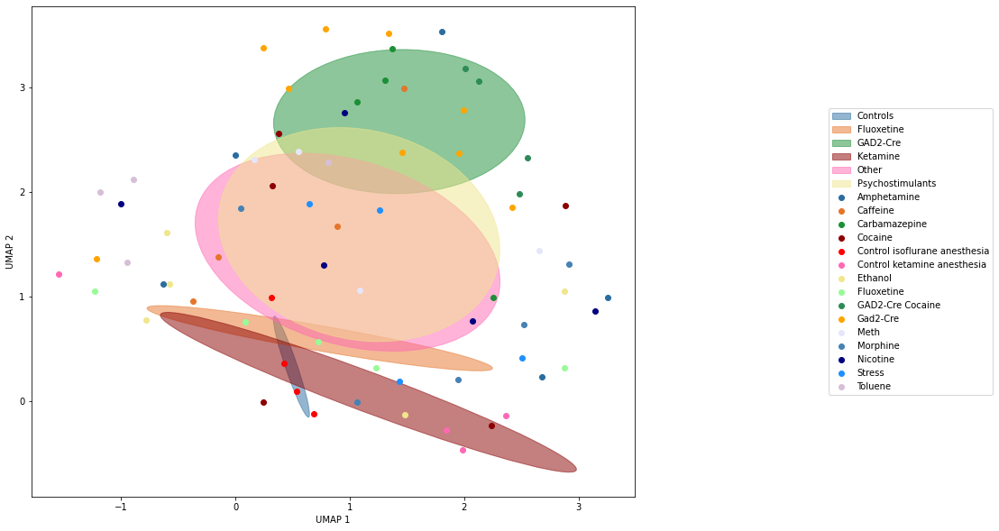

C:\Users\Kat\anaconda3\lib\site-packages\seaborn\matrix.py:619: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  linkage = hierarchy.linkage(self.array, method=self.method,


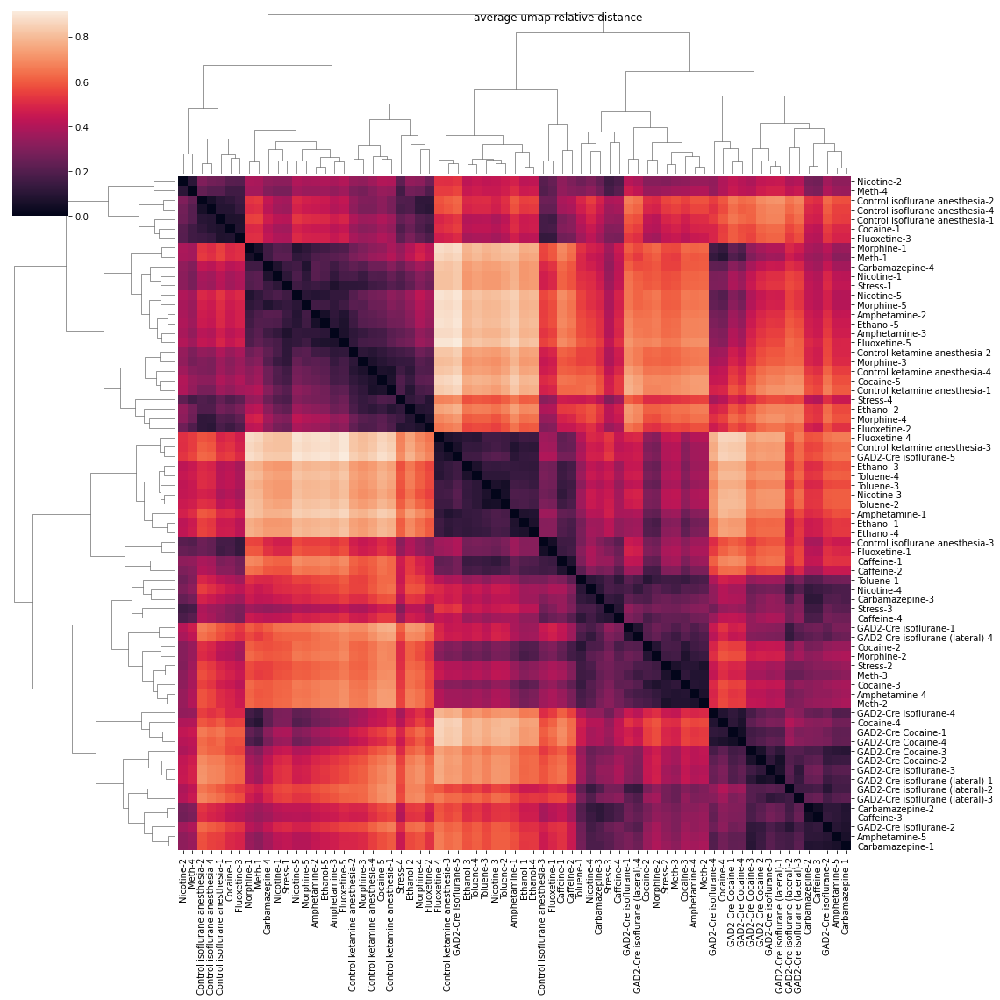

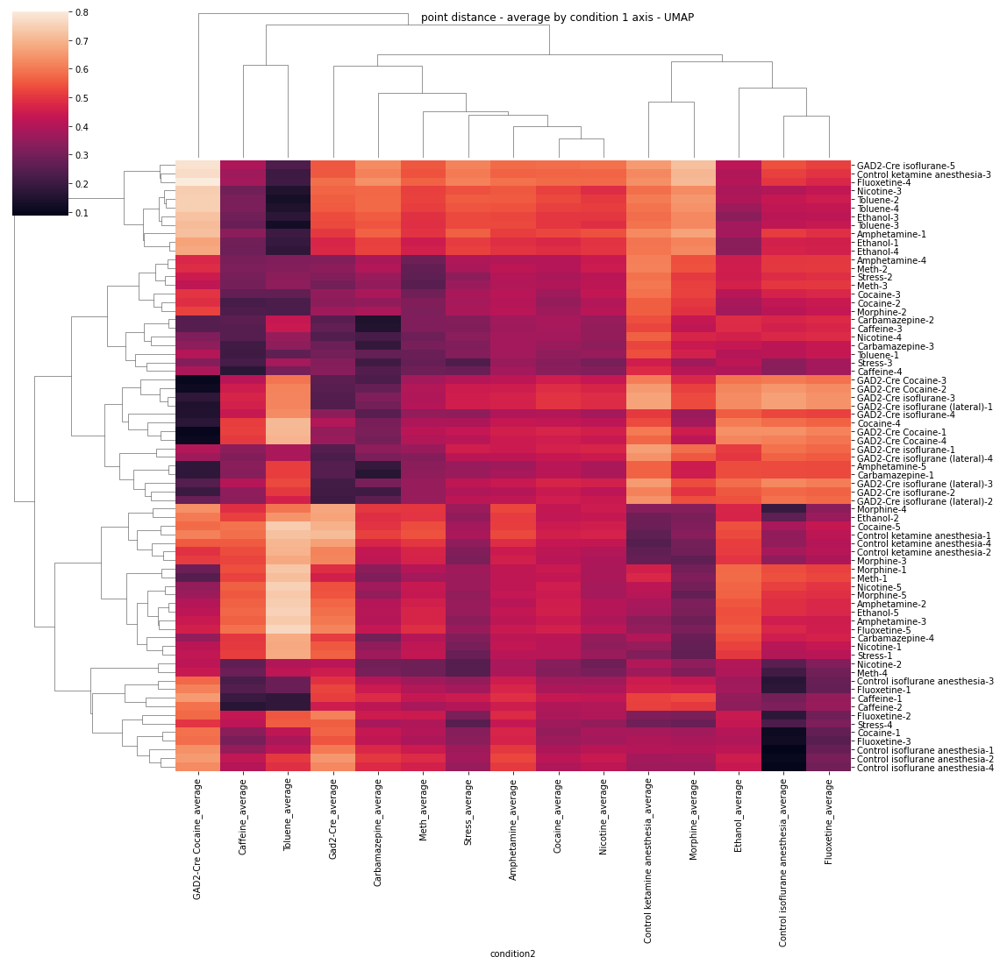

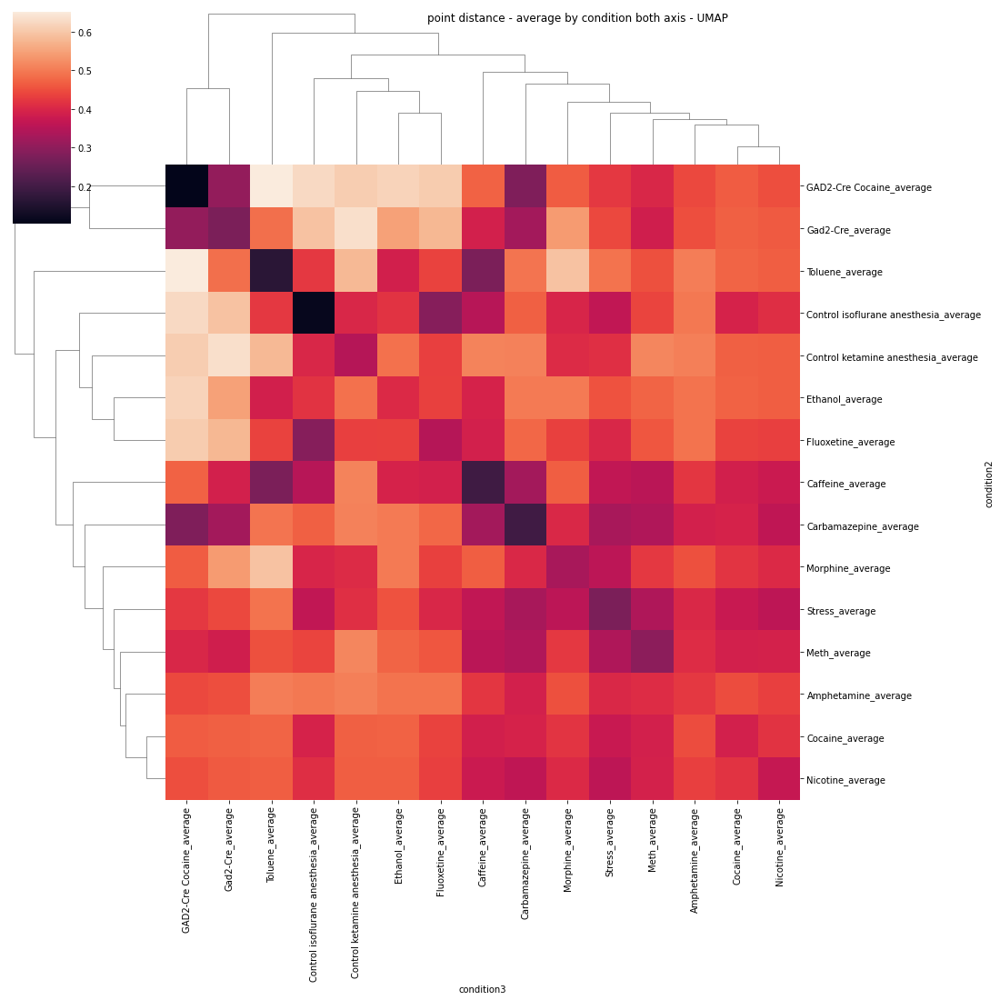

In [41]:
umap_and_heatmap(X_scaled,labels,condition_nums,grouped_elipse='yes',figname1='figures/note0-in40-1.svg',figname2='figures/note0-in40-2.svg',figname3='figures/note0-in40-3.svg',figname4='figures/note0-in40-4.svg')

# DA cells
# Isoflurane vs ketamine

In [42]:
isovk=all_data[(all_data["condition"] == 'Control ketamine anesthesia')| 
                (all_data["condition"] == 'Control isoflurane anesthesia')]
features, labels, regions, condition_nums = get_feats_and_labels(isovk)
#get rid of NAs before scaling 
X=features.to_numpy().astype(float)
#get rid of NAs before scaling

X_scaled=zscore(X,axis=0)

In [43]:
#can change n_components to more if you want to visualize in 3D 
pca = PCA(n_components=5)
#PCA using the scaled drug data array made earlier
principalComponents = pca.fit_transform(X_scaled)
#make into dataframe if you want to view with labels
principalDf = pd.DataFrame(data = principalComponents
             , columns = ['principal component 1', 'principal component 2', 'principal component 3', 'principal component 4', 'principal component 5'])
region_components=pd.DataFrame(data = pca.components_ , columns =condition_nums)
#view df
print('Explained variance for each PC: 1, 2, 3')
print(pca.explained_variance_)
principalDf

Explained variance for each PC: 1, 2, 3
[8.18893767 6.64138423 3.90484286 3.3330153  1.53101972]


,principal component 1,principal component 2,principal component 3,principal component 4,principal component 5
0,4.182205,-0.605287,0.773041,1.099002,0.071236
1,2.271930,1.755561,1.826526,-2.161862,-1.183834
2,-2.967244,5.183937,-0.996834,0.472618,-0.405914
3,3.395892,0.766908,-1.626289,-0.127281,1.322372
4,-1.936384,-1.091577,-1.446050,-0.691729,1.823047
5,-1.218191,-3.253519,-2.287561,-1.638706,-1.624195
6,-2.900951,-1.429109,3.518625,-0.644109,0.845890
7,-0.827256,-1.326914,0.238542,3.692068,-0.848602


### PCA Plots

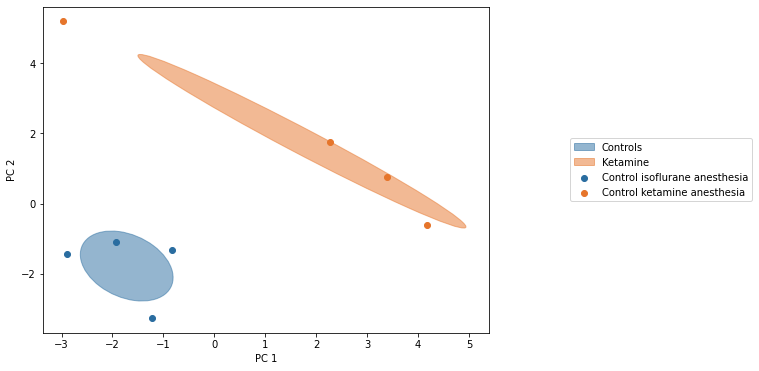

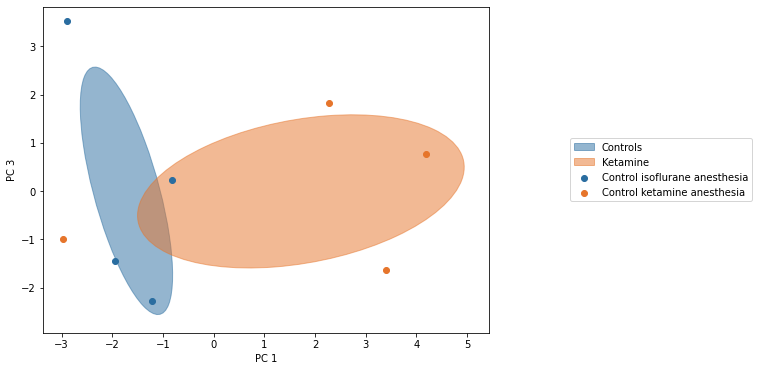

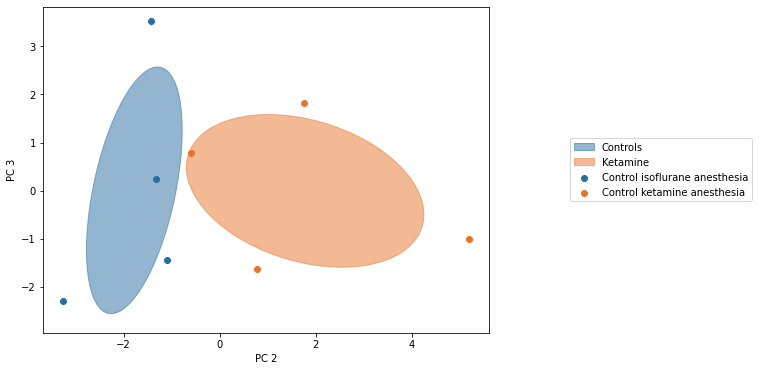

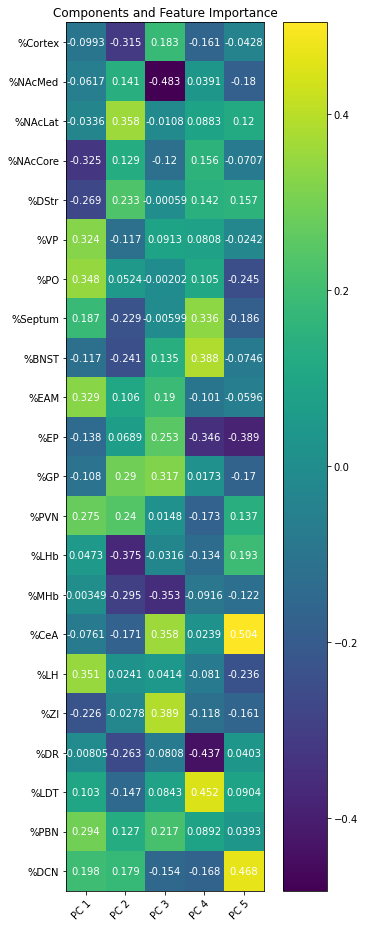

In [44]:
pc1=principalDf['principal component 1']
pc2=principalDf['principal component 2']
pc3=principalDf['principal component 3']
group = condition_nums 
make_pca_plots(pc1,pc2,pc3,group,labels,figname1='figures/PCA-stats/PC2-3_figure4/ket-v-iso-fig4A1.svg',figname2='figures/PCA-stats/PC2-3_figure4/ket-v-iso-fig4A2.svg',figname3='figures/PCA-stats/PC2-3_figure4/ket-v-iso-fig4A3.svg')
plot_components(region_components,figname4='figures/note0-in43-4.svg')

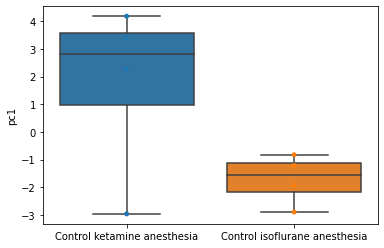

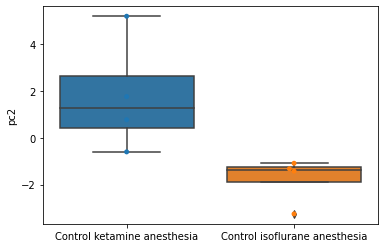

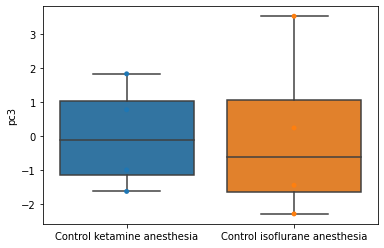


Two sample t-test with equal variance

------------------  ----------
Mean diff           -3.44139
t                   -2.05552
Std Error            1.67422
df                   6
p value (one-tail)   0.0427929
p value (two-tail)   0.0855859
Lower 95.0%         -7.53806
Upper 95.0%          0.655282
------------------  ----------

Parameter estimates

Level                            Number     Mean    Std Dev    Std Error    Lower 95.0%    Upper 95.0%
-----------------------------  --------  -------  ---------  -----------  -------------  -------------
Control isoflurane anesthesia         4  -1.7207   0.911093     0.455546       -3.17045      -0.270944
Control ketamine anesthesia           4   1.7207   3.22211      1.61105        -3.4064        6.84779


Two sample t-test with equal variance

------------------  ----------
Mean diff           -3.55056
t                   -2.66646
Std Error            1.33156
df                   6
p value (one-tail)   0.018601
p value (two-tail)   0

In [45]:
align_embed= pd.DataFrame({'pc1': pc1.values,'pc2': pc2.values,'pc3': pc3.values},index=labels)
value=align_embed['pc1']
treatments=align_embed.index
ax = sns.boxplot(x=treatments, y=value)
ax = sns.swarmplot(x=treatments, y=value)
plt.savefig('figures/PCA-stats/figure 4/4a-boxplot.svg')
plt.show()
value=align_embed['pc2']
ax = sns.boxplot(x=treatments, y=value)
ax = sns.swarmplot(x=treatments, y=value)
plt.savefig('figures/PCA-stats/figure 4/4a-PC2-boxplot.svg')
plt.show()
value=align_embed['pc3']
ax = sns.boxplot(x=treatments, y=value)
ax = sns.swarmplot(x=treatments, y=value)
plt.savefig('figures/PCA-stats/figure 4/4a-PC3-boxplot.svg')
plt.show()

df_melt= pd.DataFrame({'value':align_embed['pc1'],'treatments': align_embed.index})
#!pip install bioinfokit
from bioinfokit.analys import stat
res = stat()
res.ttest(df=df_melt, res='value', xfac='treatments',test_type=2)
print(res.summary)#.to_csv('figures/PCA-stats/figure 4/4a-PC1-stat.csv')

df_melt= pd.DataFrame({'value':align_embed['pc2'],'treatments': align_embed.index})
#!pip install bioinfokit 
res = stat()
res.ttest(df=df_melt, res='value', xfac='treatments',test_type=2)
print(res.summary)#.to_csv('figures/PCA-stats/figure 4/4a-PC2-stat.csv')

df_melt= pd.DataFrame({'value':align_embed['pc3'],'treatments': align_embed.index})
#!pip install bioinfokit 
res = stat()
res.ttest(df=df_melt, res='value', xfac='treatments',test_type=2)
print(res.summary)#.to_csv('figures/PCA-stats/figure 4/4a-PC3-stat.csv')


df_melt= pd.DataFrame({'pc1':align_embed['pc1'],'pc2':align_embed['pc2'],'pc3':align_embed['pc3'],'treatments': treatments})
df_melt.to_csv('figures/PCA-stats/PC-values-for-Kevin/Figure_4A_PC1-3.csv')

C:\Users\Kat\anaconda3\lib\site-packages\seaborn\matrix.py:619: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  linkage = hierarchy.linkage(self.array, method=self.method,


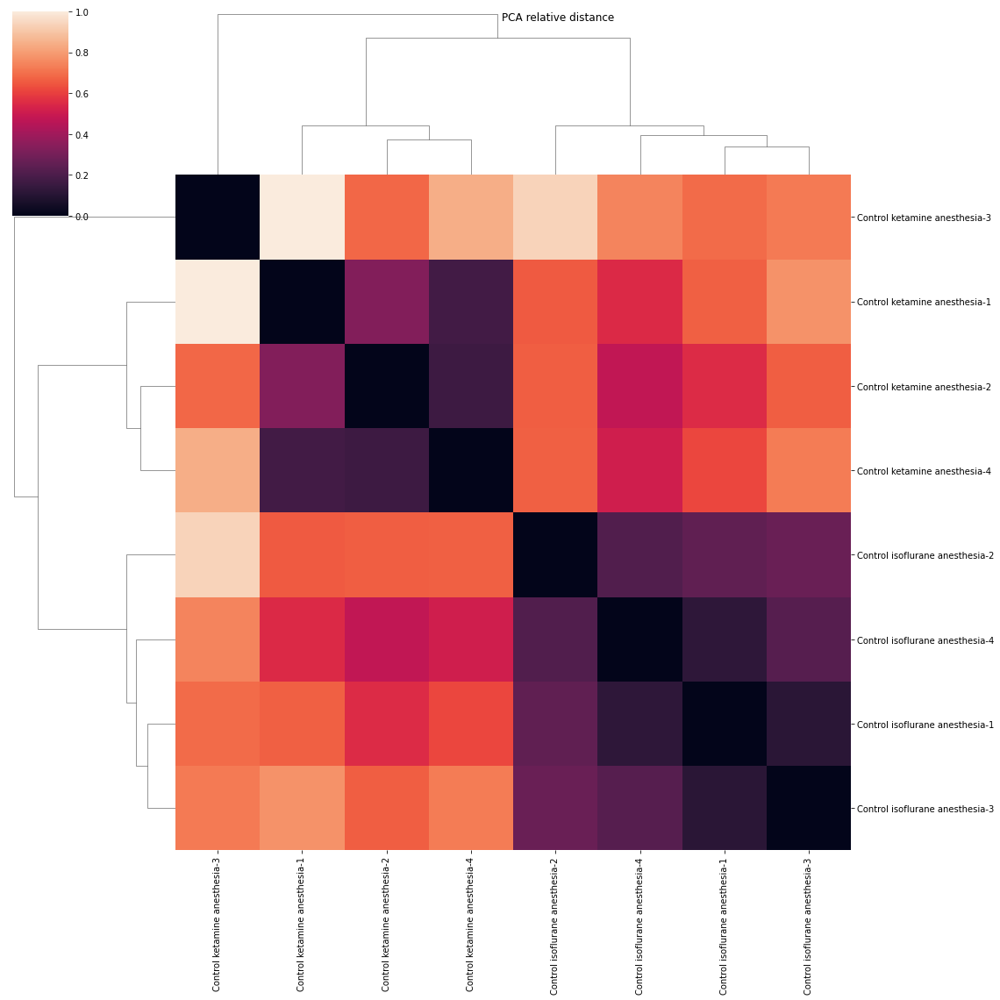

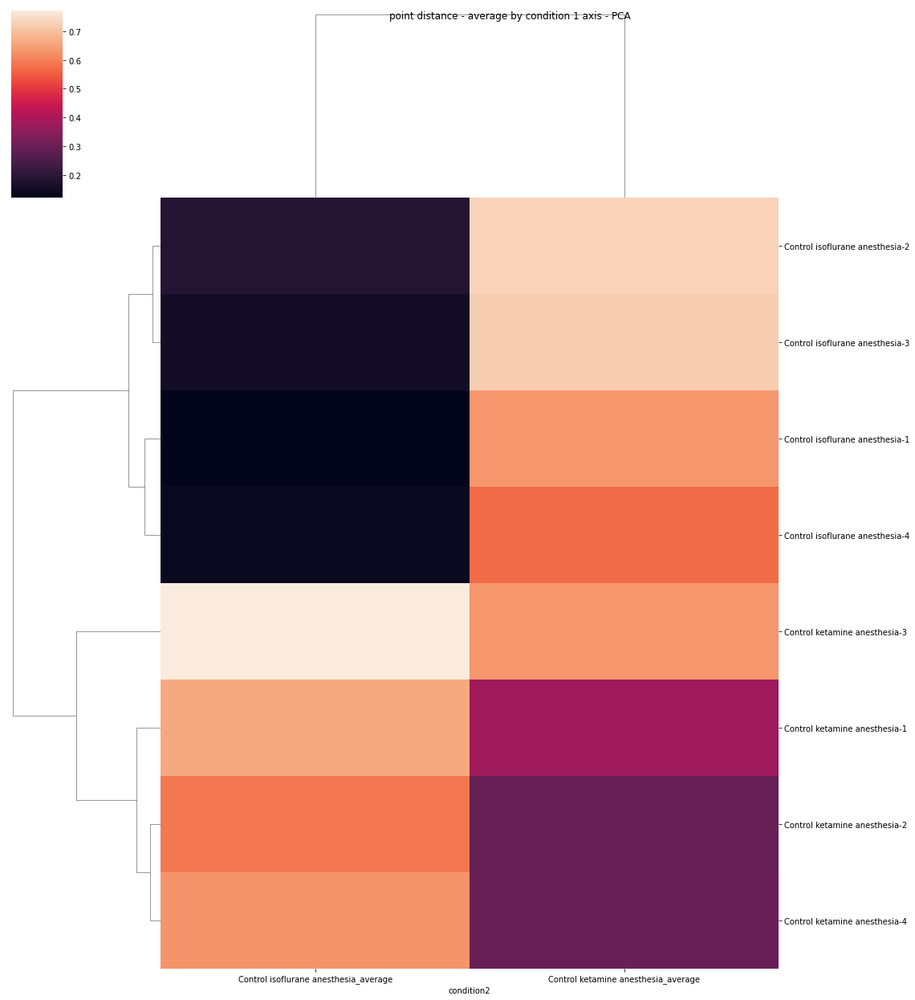

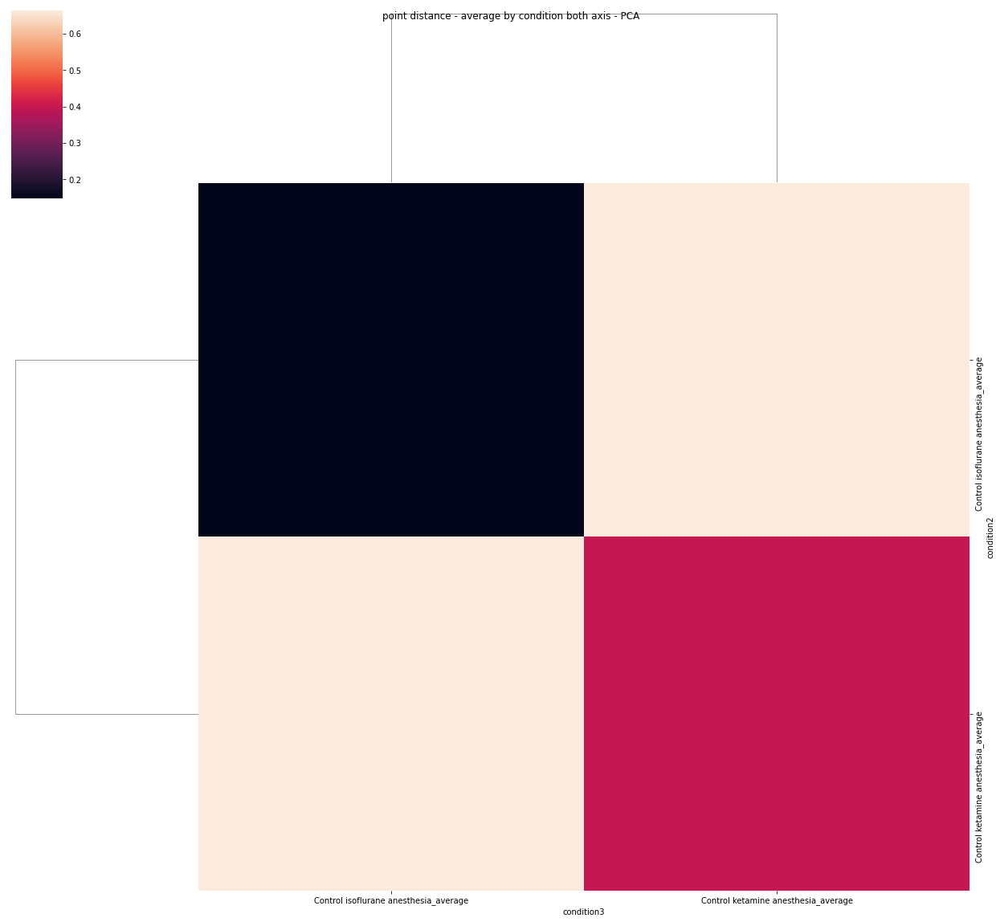

In [46]:
pca_dist=pca_distance(X_scaled,labels)
heatmapdf = pd.DataFrame(pca_dist,index=regions,columns=regions)
cm = sns.clustermap(heatmapdf,yticklabels=True)
cm.fig.suptitle("PCA relative distance")
cm.fig.set_size_inches(18, 18)
plt.show()
distance_to_other_points(pca_dist,labels,regions,' - PCA') # pca

### UMAP

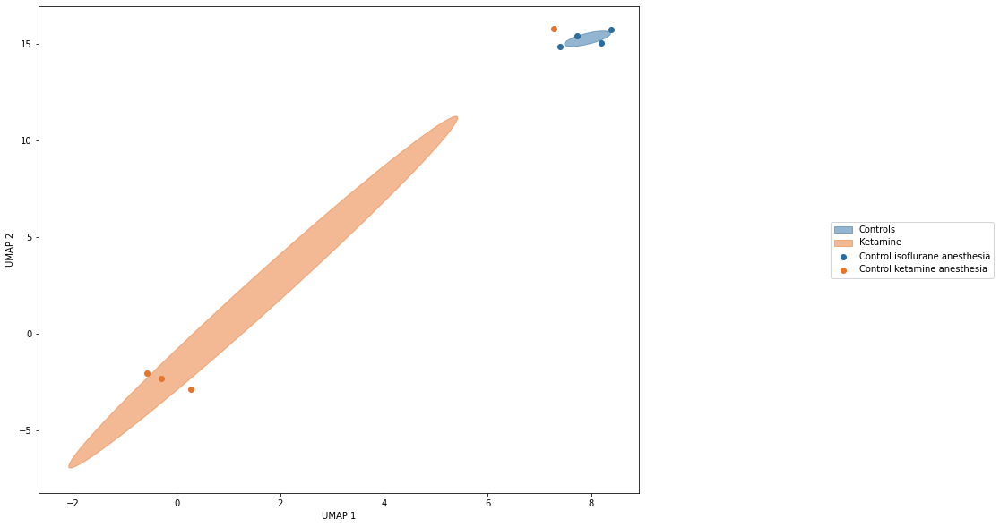

C:\Users\Kat\anaconda3\lib\site-packages\seaborn\matrix.py:619: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  linkage = hierarchy.linkage(self.array, method=self.method,


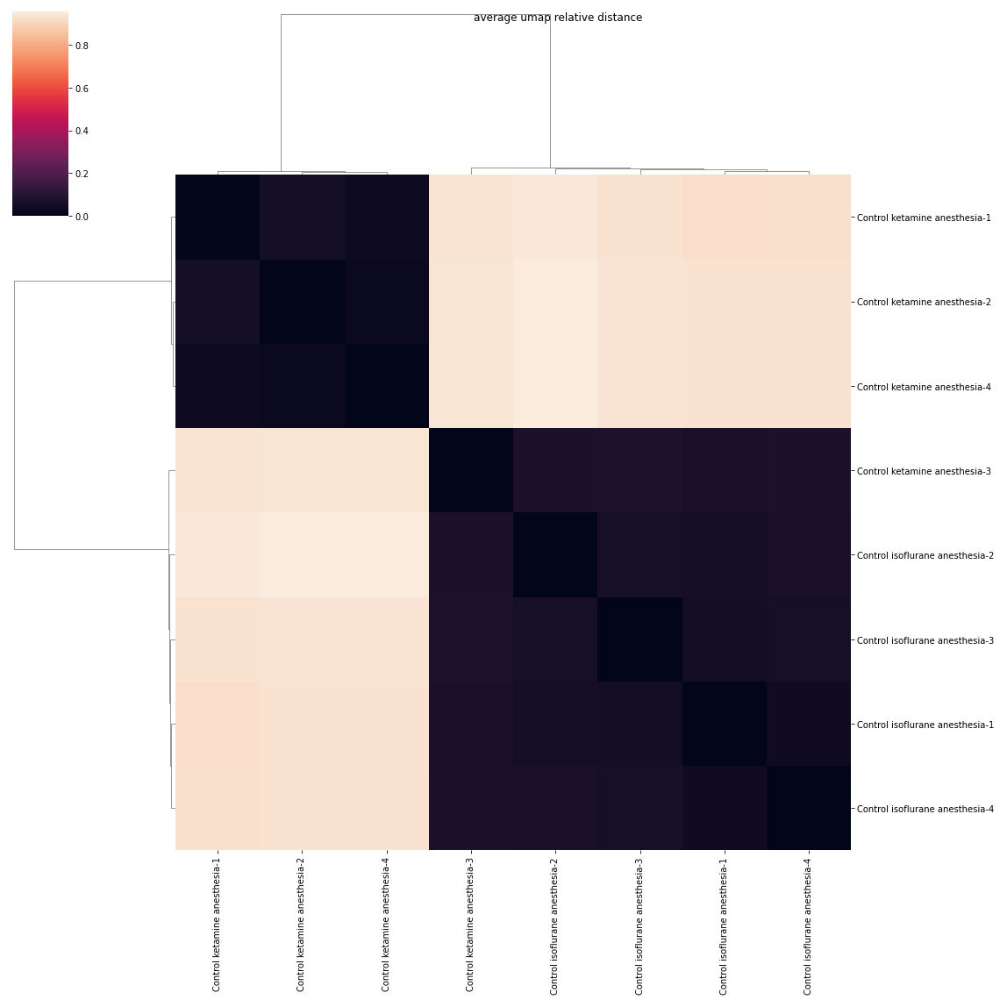

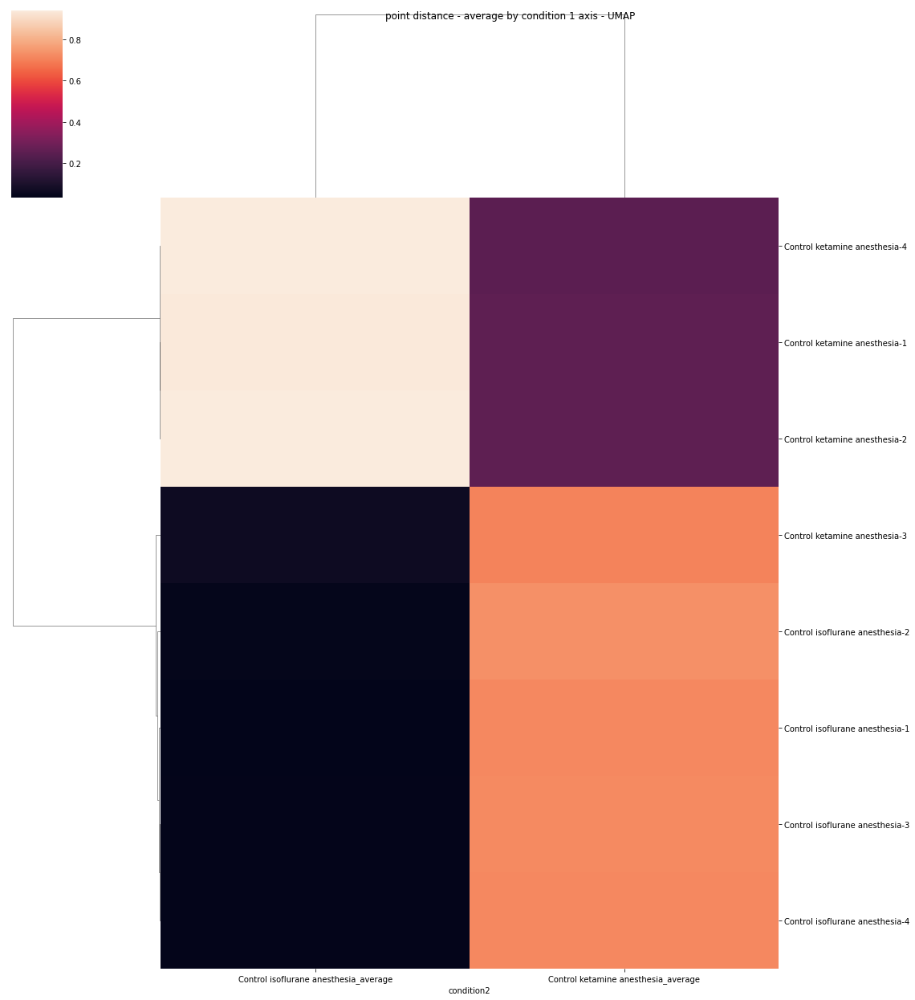

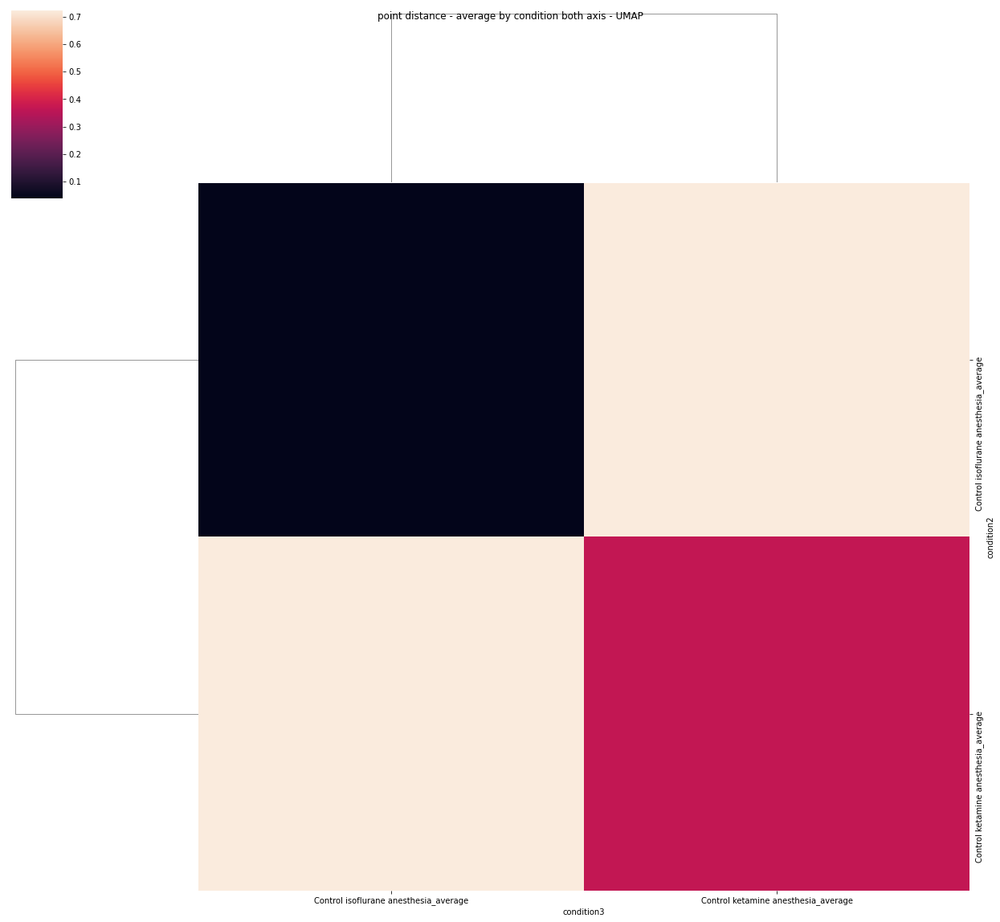

In [47]:
umap_and_heatmap(X_scaled,labels,regions,figname1='figures/note0-in45-1.svg',figname2='figures/note0-in45-2.svg',figname3='figures/note0-in45-3.svg',figname4='figures/note0-in45-4.svg')

# DA cells - all drugs and conditions including GAD2-Cre but EXCLUDING EtOH and Toluene

all drugs and conditions including GAD2-Cre but EXCLUDING EtOH

In [48]:
notEtOH=all_data[~all_data["condition"].isin(['Ethanol','Toluene'])]

In [49]:
features, labels, condition_nums, regions = get_feats_and_labels(notEtOH)
labels=list(labels)+list(labels2)
condition_nums=list(condition_nums)+list(condition_nums2)
#scale X 
X1=features.to_numpy().astype(float)
X2=features2.to_numpy().astype(float)
X=np.vstack((X1, X2))
#get rid of NAs before scaling
#X_scaled=StandardScaler().fit_transform(X) 
X_scaled=zscore(X,axis=0)
X_scaled.sum(axis=0)

array([ 1.37667655e-14,  1.24067423e-14,  1.77635684e-15,  1.34614542e-14,
       -2.44249065e-15, -1.45439216e-14,  1.55431223e-15, -4.99600361e-16,
        3.38618023e-15,  2.75890422e-14,  2.88657986e-15,  5.66213743e-15,
        1.26565425e-14,  5.55111512e-15,  8.10462808e-15, -1.98729921e-14,
        8.21565038e-15, -5.16253706e-15, -1.36557432e-14,  1.88737914e-14,
       -1.32116540e-14, -9.99200722e-15])

In [50]:
#can change n_components to more if you want to visualize in 3D 
pca = PCA(n_components=5)
#PCA using the scaled drug data array made earlier
principalComponents = pca.fit_transform(X_scaled)
#make into dataframe if you want to view with labels
principalDf = pd.DataFrame(data = principalComponents
             , columns = ['principal component 1', 'principal component 2', 'principal component 3', 'principal component 4', 'principal component 5'])
region_components=pd.DataFrame(data = pca.components_ , columns = regions)
#view df
print('Explained variance for each PC: 1, 2, 3')
print(pca.explained_variance_)
principalDf

Explained variance for each PC: 1, 2, 3
[5.54270158 4.25436051 2.34498357 1.87560933 1.34091698]


,principal component 1,principal component 2,principal component 3,principal component 4,principal component 5
0,-2.490239,1.022746,1.070699,-0.102531,0.850957
1,0.414511,2.096871,-0.292953,-0.052514,-0.452026
2,0.179350,2.693332,-0.786949,-2.397986,-0.521804
3,1.996686,-2.494142,-1.635299,-0.911727,-1.359841
4,-1.942630,-2.349376,0.988028,-0.177967,-0.488485
...,...,...,...,...,...
57,-1.244703,0.083196,-1.167201,-0.409169,0.684398
58,-1.375856,2.954254,-0.115733,1.803150,-1.508696
59,0.092856,2.869557,-1.416012,1.964051,-1.502319
60,0.514851,-0.161673,-2.298727,2.466314,0.094638


### PCA Plots

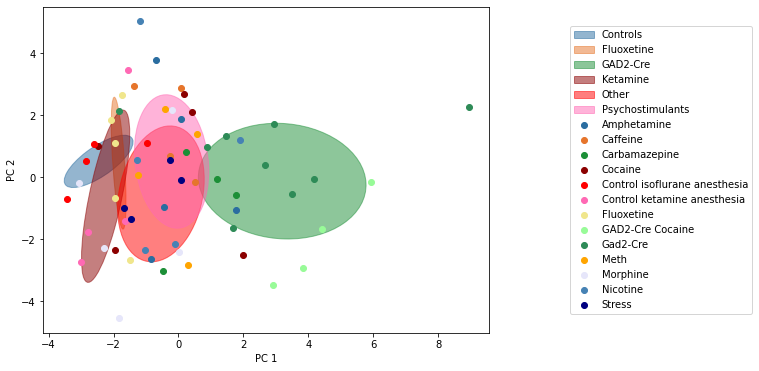

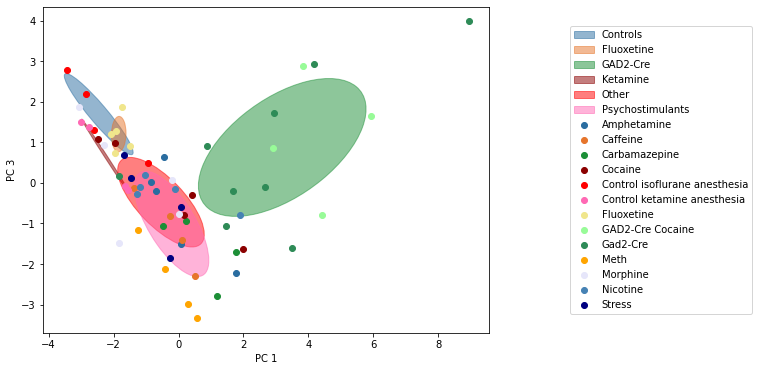

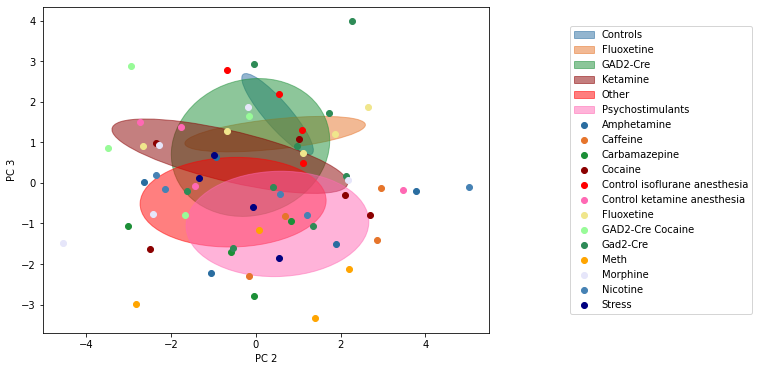

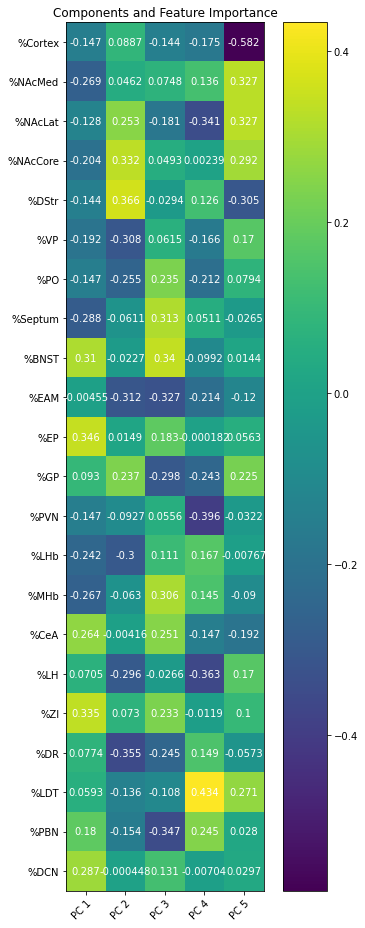

In [51]:
pc1=principalDf['principal component 1']
pc2=principalDf['principal component 2']
pc3=principalDf['principal component 3']
group = condition_nums 
make_pca_plots(pc1,pc2,pc3,group,labels,grouped_elipse='yes',figname1='figures/note0-in49-1.svg',figname2='figures/note0-in49-2.svg',figname3='figures/note0-in49-3.svg')
plot_components(region_components,figname4='figures/note0-in49-4.svg')

C:\Users\Kat\anaconda3\lib\site-packages\seaborn\matrix.py:619: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  linkage = hierarchy.linkage(self.array, method=self.method,


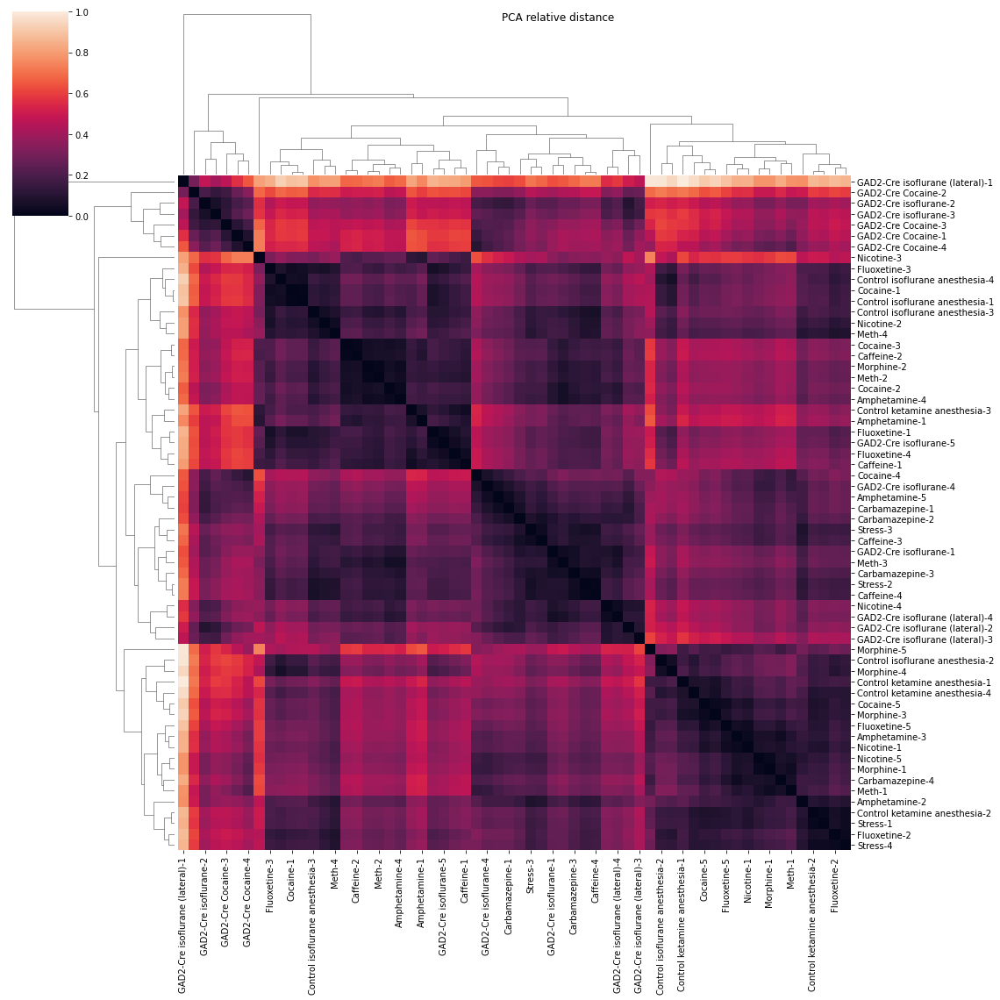

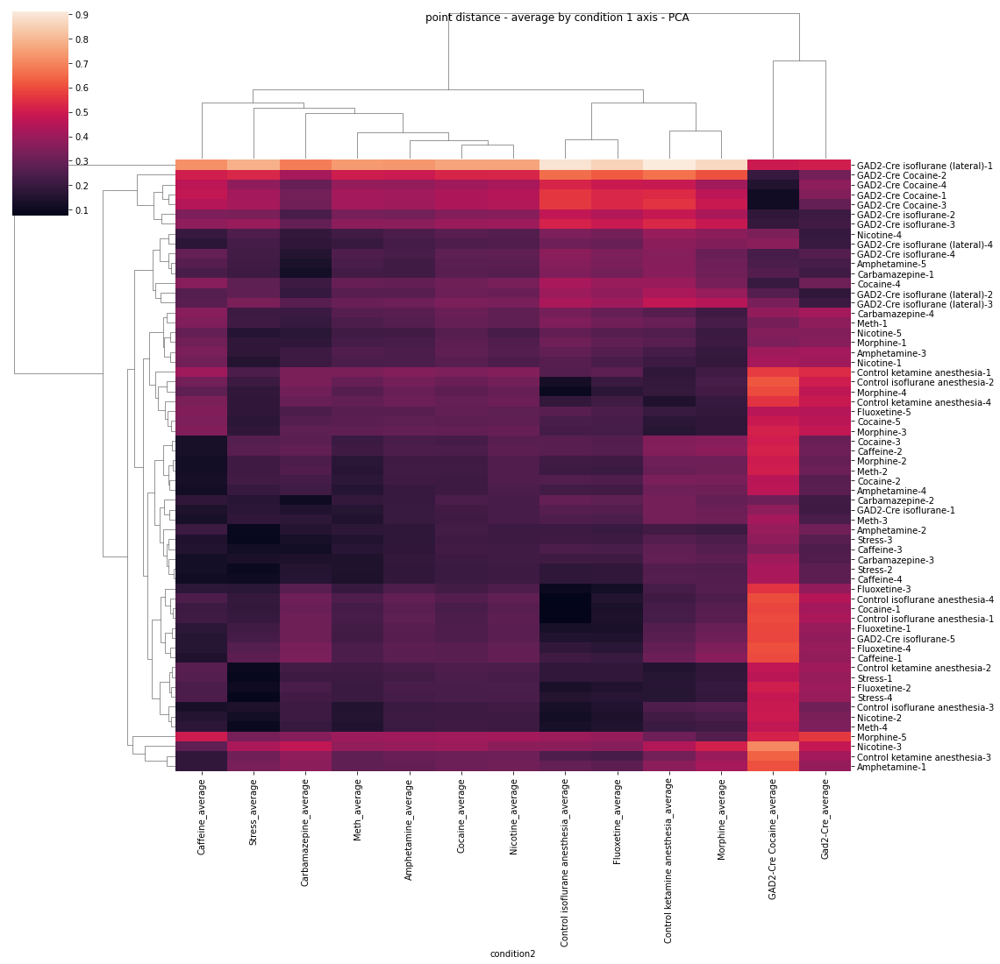

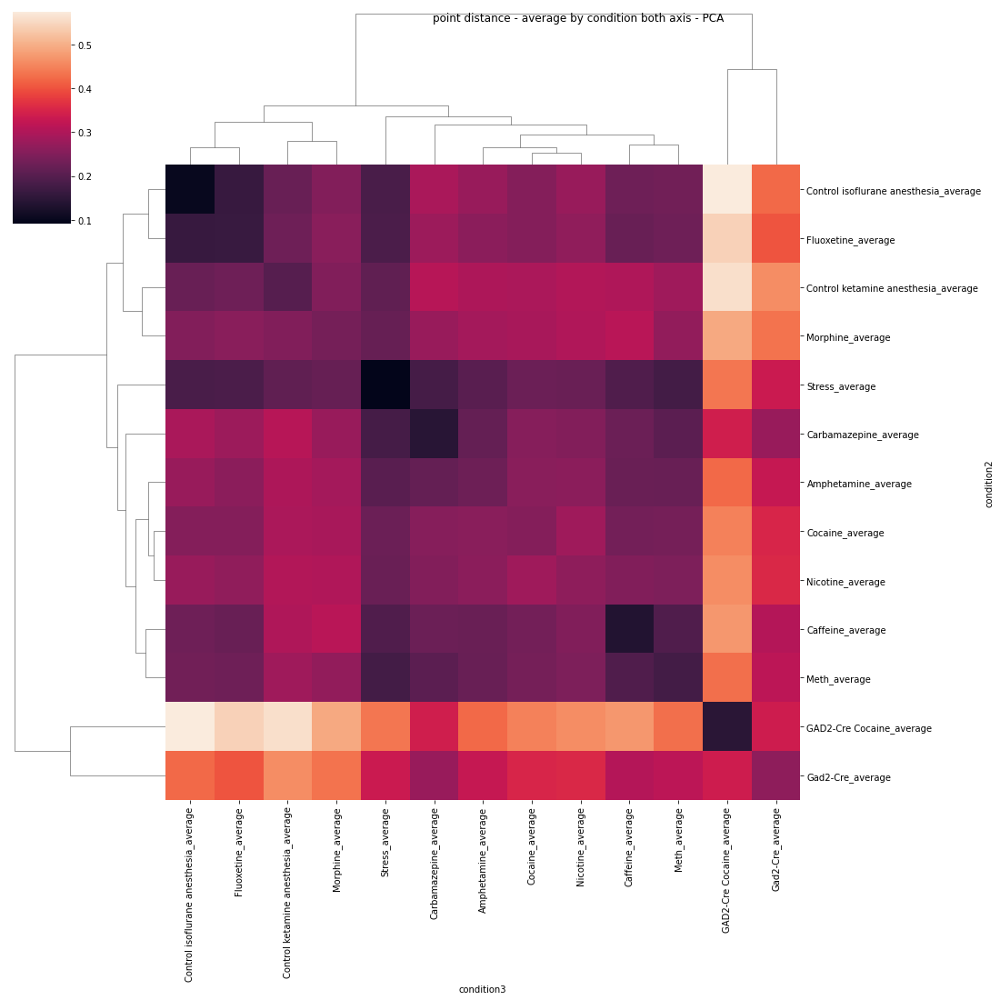

In [52]:
pca_dist=pca_distance(X_scaled,labels)
heatmapdf = pd.DataFrame(pca_dist,index=condition_nums,columns=condition_nums)
cm = sns.clustermap(heatmapdf,yticklabels=True)
cm.fig.suptitle("PCA relative distance")
cm.fig.set_size_inches(18, 18)
plt.show()
distance_to_other_points(pca_dist,labels,condition_nums,' - PCA') # pca 

### UMAP

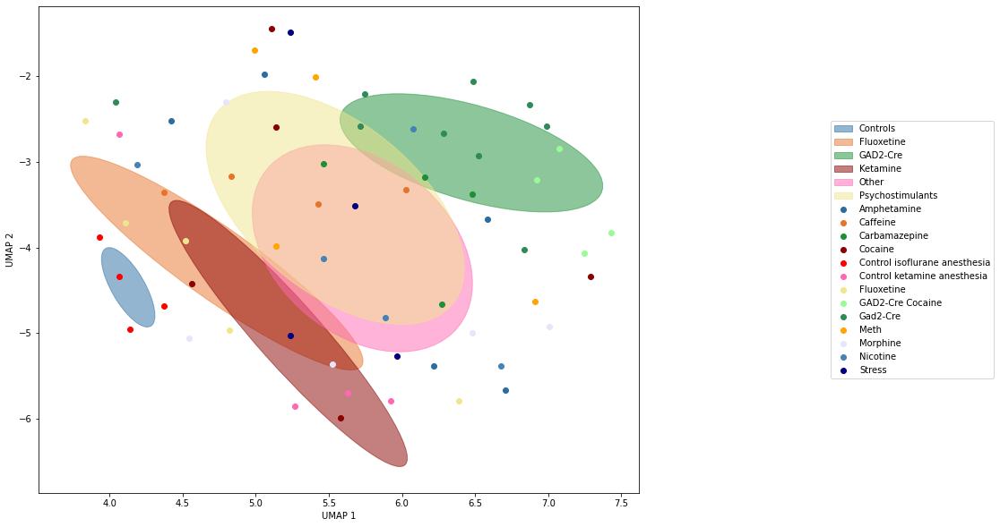

C:\Users\Kat\anaconda3\lib\site-packages\seaborn\matrix.py:619: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  linkage = hierarchy.linkage(self.array, method=self.method,


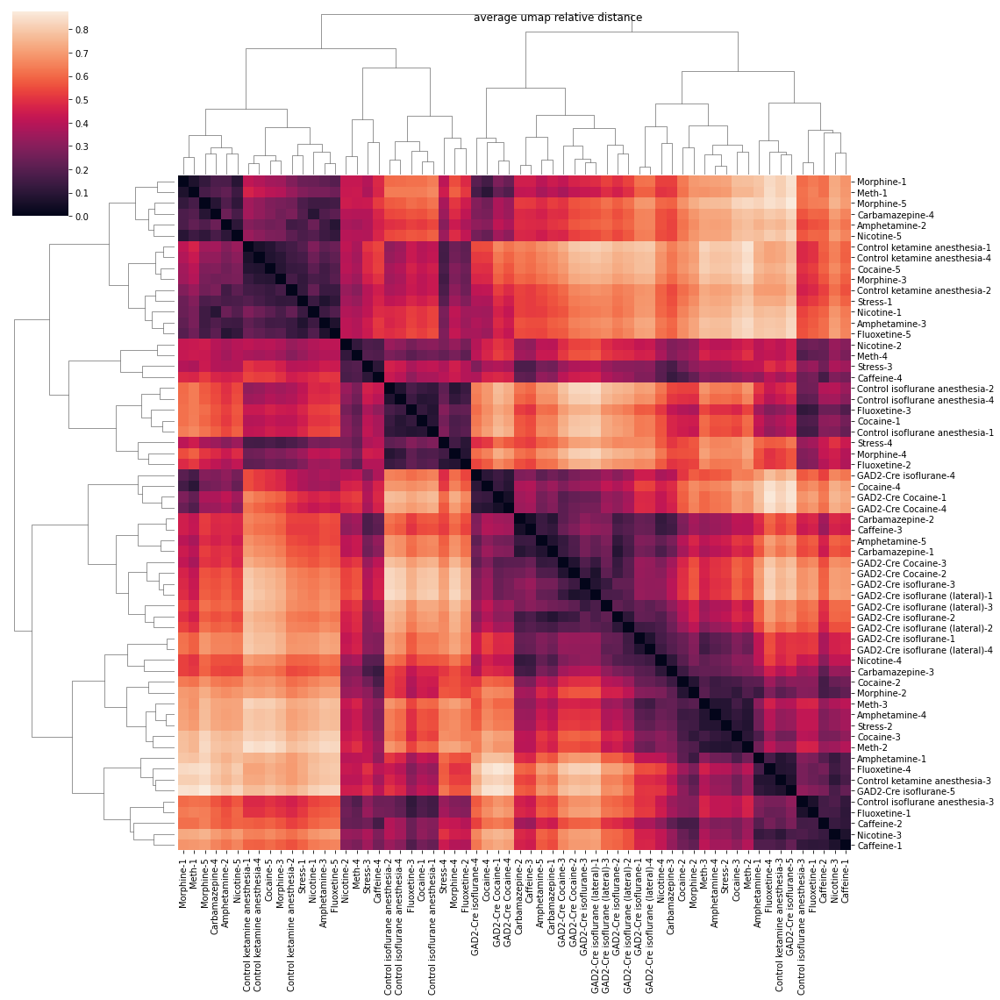

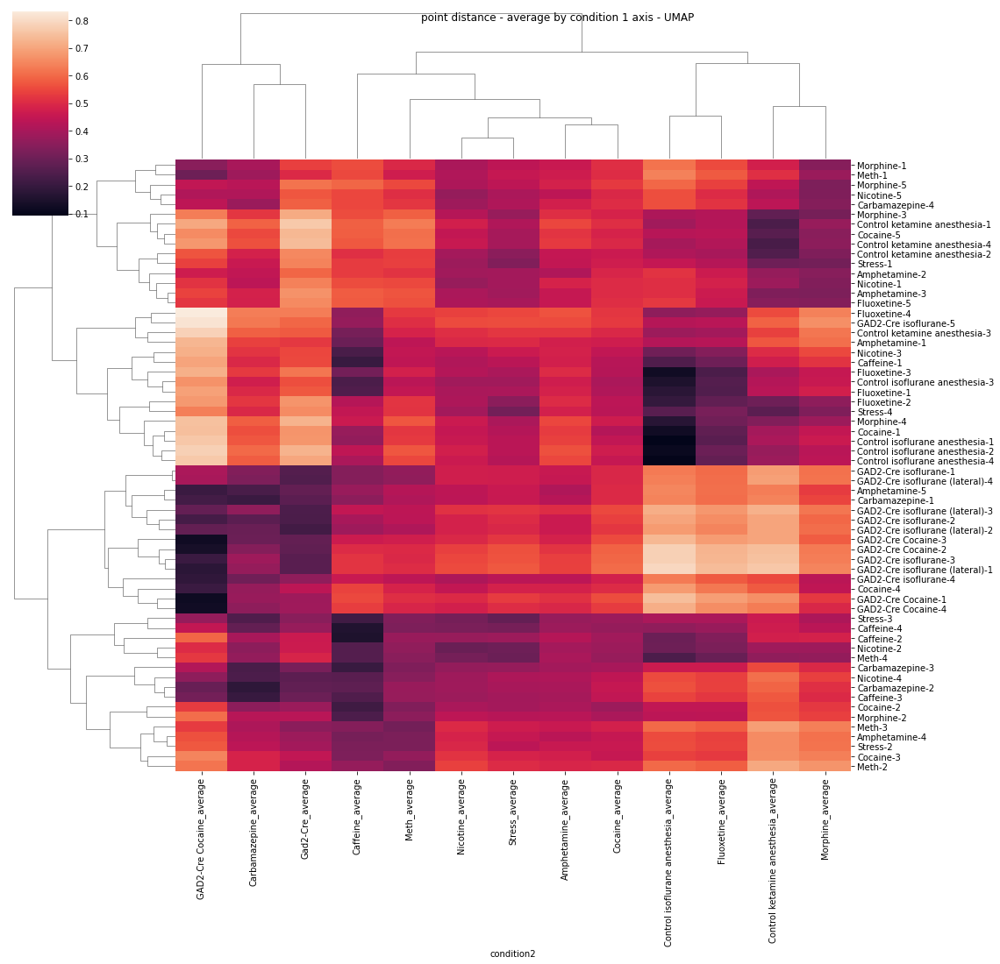

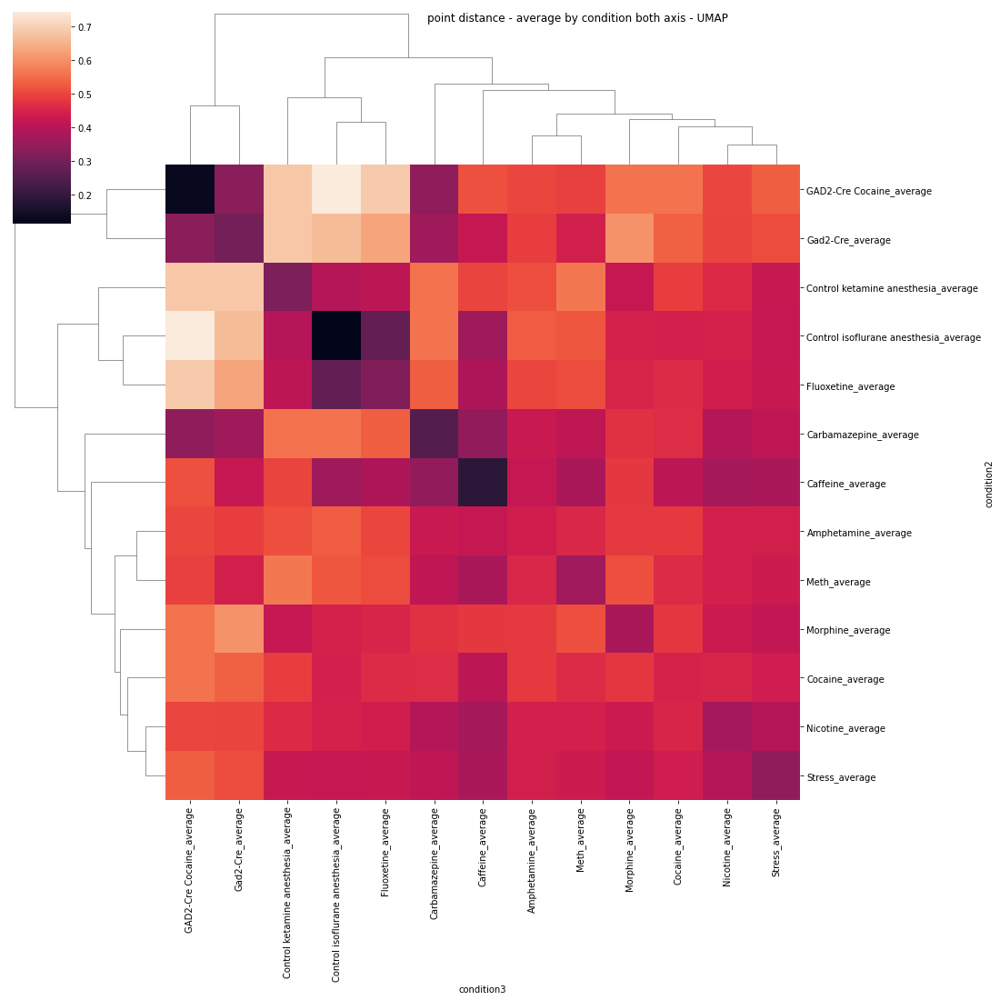

In [53]:
umap_and_heatmap(X_scaled,labels,condition_nums,grouped_elipse='yes',figname1='figures/note0-in51-1.svg',figname2='figures/note0-in51-2.svg',figname3='figures/note0-in51-3.svg',figname4='figures/note0-in51-4.svg')

# DA cells
# all conditions EXCLUDING GAD2-Cre ETOH and Toluene

In [54]:
nogad2etohtol=all_data[(all_data["condition"] == 'Cocaine') |
                (all_data["condition"] == 'Control ketamine anesthesia')| 
                (all_data["condition"] == 'Control isoflurane anesthesia')|
                (all_data["condition"] == 'Nicotine')|
                (all_data["condition"] == 'Morphine')|
                (all_data["condition"] == 'Amphetamine')|
                (all_data["condition"] == 'Fluoxetine')|
                (all_data["condition"] == 'Meth')|
                (all_data["condition"] == 'Carbamazepine')|
                (all_data["condition"] == 'Stress')]

In [55]:
features, labels, condition_nums, regions = get_feats_and_labels(nogad2etohtol)
labels=list(labels)+list(labels2)
condition_nums=list(condition_nums)+list(condition_nums2)
#scale X 
X1=features.to_numpy().astype(float)
X2=features2.to_numpy().astype(float)
X=np.vstack((X1, X2))
#get rid of NAs before scaling
#X_scaled=StandardScaler().fit_transform(X) 
X_scaled=zscore(X,axis=0)
X_scaled.sum(axis=0)
#can change n_components to more if you want to visualize in 3D 
pca = PCA(n_components=5)
#PCA using the scaled drug data array made earlier
principalComponents = pca.fit_transform(X_scaled)
#make into dataframe if you want to view with labels
principalDf = pd.DataFrame(data = principalComponents
             , columns = ['principal component 1', 'principal component 2', 'principal component 3', 'principal component 4', 'principal component 5'])
region_components=pd.DataFrame(data = pca.components_ , columns = regions)
#view df
print('Explained variance for each PC: 1, 2, 3')
print(pca.explained_variance_)
principalDf

Explained variance for each PC: 1, 2, 3
[5.16035771 3.91221564 2.52884864 2.02307611 1.58573892]


,principal component 1,principal component 2,principal component 3,principal component 4,principal component 5
0,-0.171745,-2.430362,-0.546076,1.572095,0.732176
1,-2.487115,0.653874,-0.716844,-0.680730,0.061724
2,-3.502640,0.927383,-2.377511,0.620862,-0.593235
3,0.502215,4.587694,-1.275993,-0.925545,0.654514
4,2.986948,-0.358740,-0.780172,-1.065879,-1.080923
5,3.717452,-1.369340,-1.631603,0.215317,-0.704542
6,1.647091,0.241071,-1.553386,1.555597,-1.626449
7,-2.657964,-2.378693,0.788006,1.954527,-1.052266
8,2.907246,-1.599190,-1.021359,0.231977,-1.681915
9,-0.273047,-2.624880,-0.010794,-1.073649,0.568501


### PCA Plots

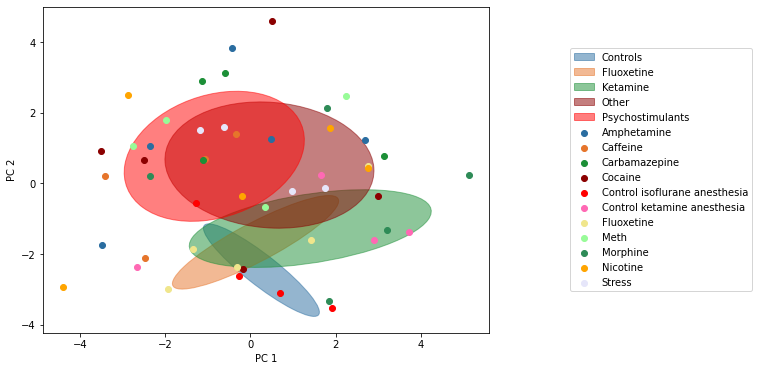

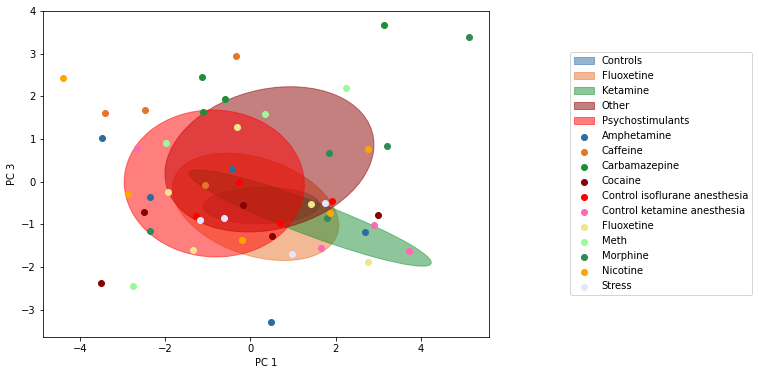

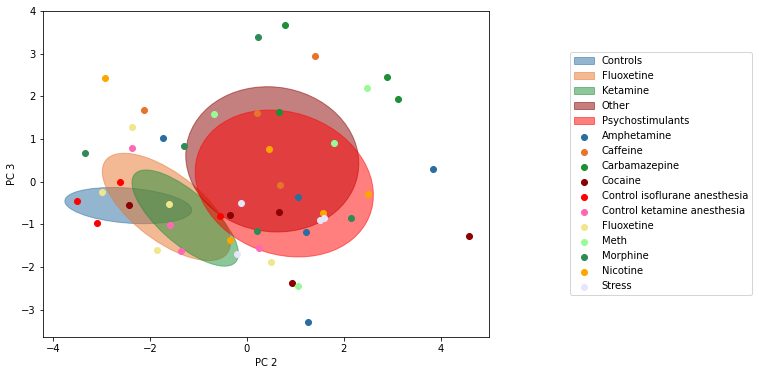

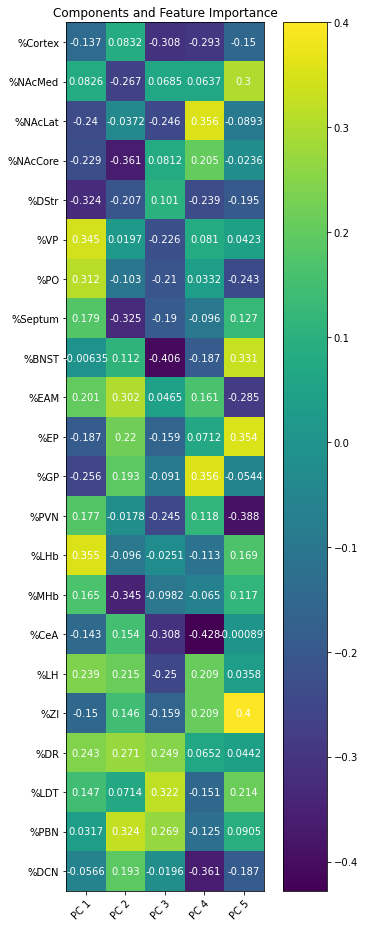

In [56]:
pc1=principalDf['principal component 1']
pc2=principalDf['principal component 2']
pc3=principalDf['principal component 3']
group = condition_nums 
make_pca_plots(pc1,pc2,pc3,group,labels,grouped_elipse='yes',figname1='figures/fig2e_note0-in54.svg',figname2='figures/note0-in54-2',figname3='figures/fig2f_note0-in54.svg')
plot_components(region_components,figname4='figures/fig2g_note0-in54.svg')

C:\Users\Kat\anaconda3\lib\site-packages\seaborn\matrix.py:619: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  linkage = hierarchy.linkage(self.array, method=self.method,


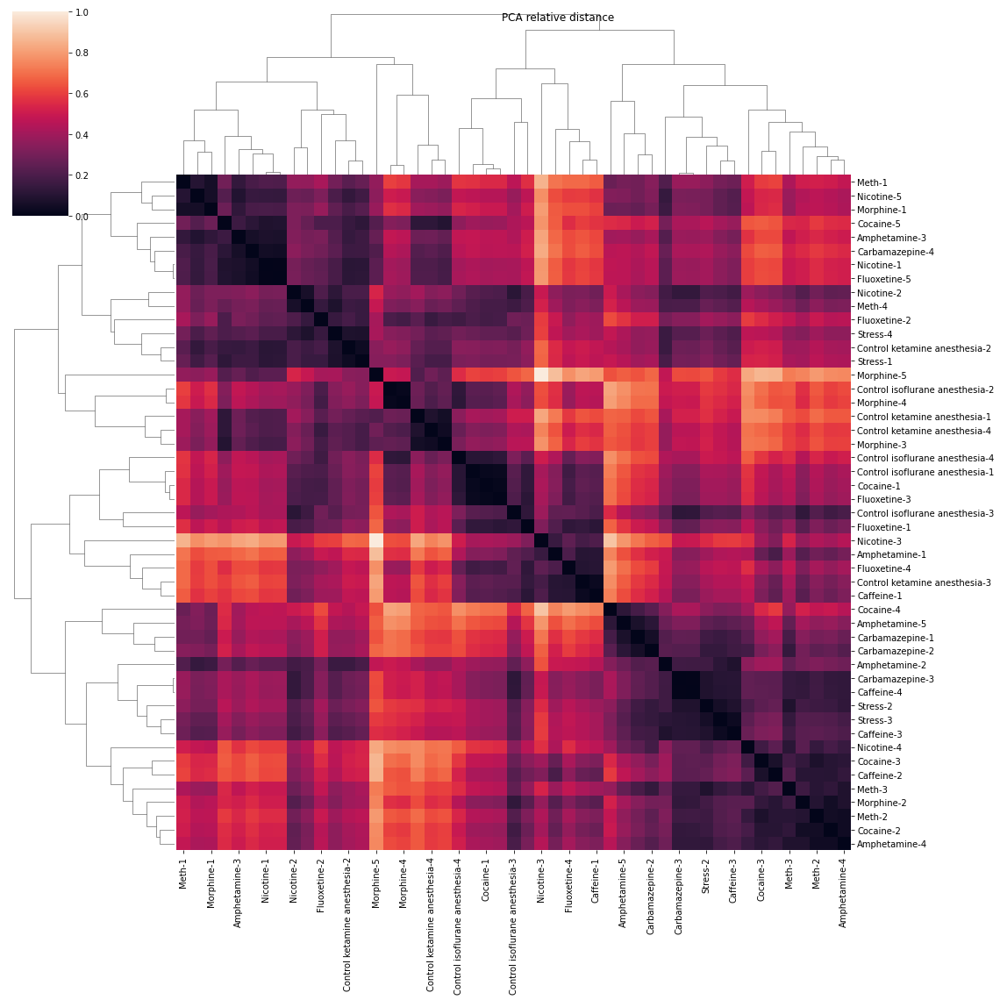

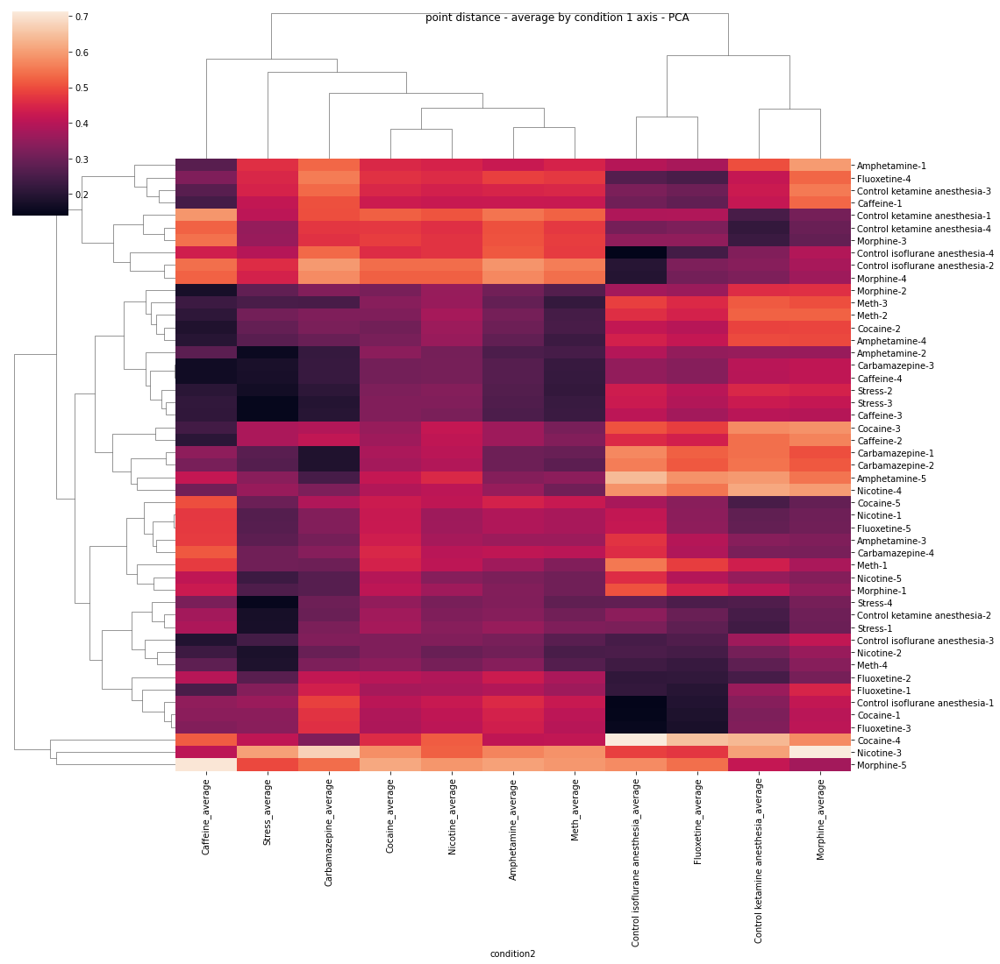

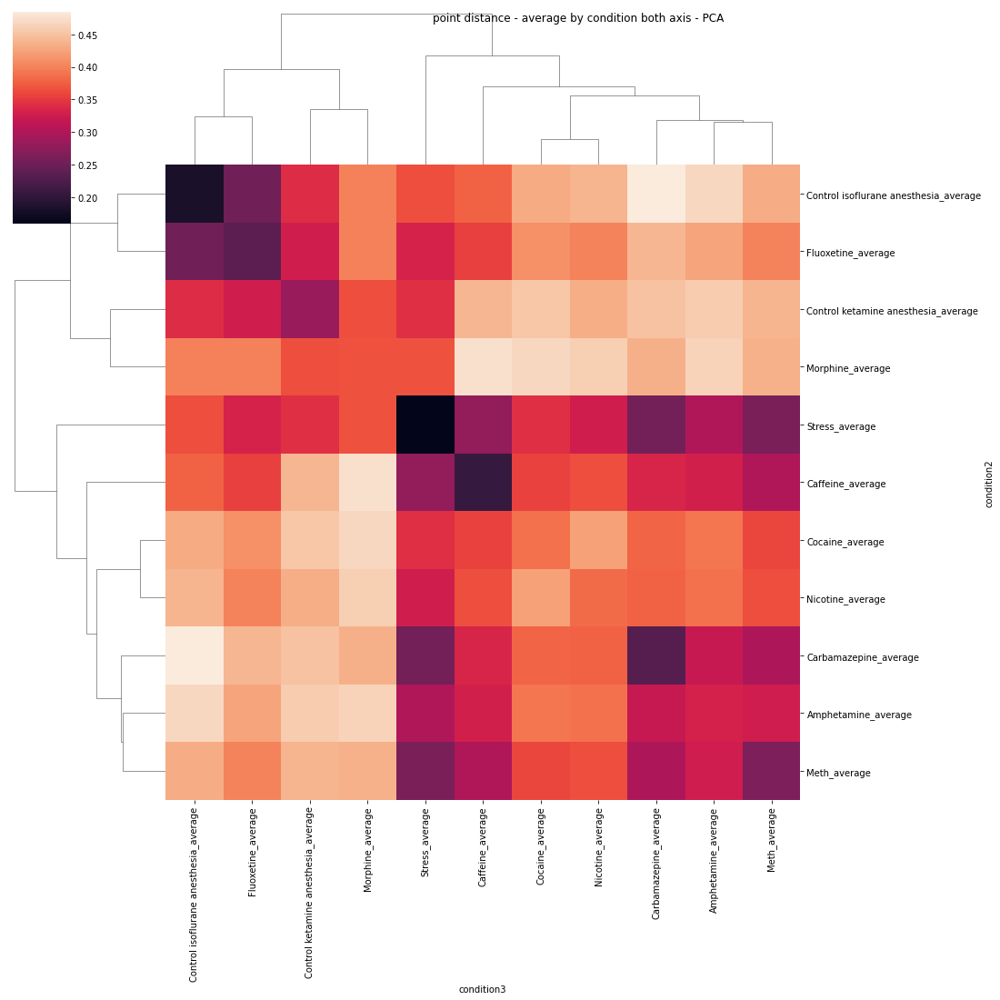

In [57]:
pca_dist=pca_distance(X_scaled,labels)
heatmapdf = pd.DataFrame(pca_dist,index=condition_nums,columns=condition_nums)
cm = sns.clustermap(heatmapdf,yticklabels=True)
cm.fig.suptitle("PCA relative distance")
cm.fig.set_size_inches(18, 18)
plt.show()
distance_to_other_points(pca_dist,labels,condition_nums,' - PCA') # pca 

### UMAP

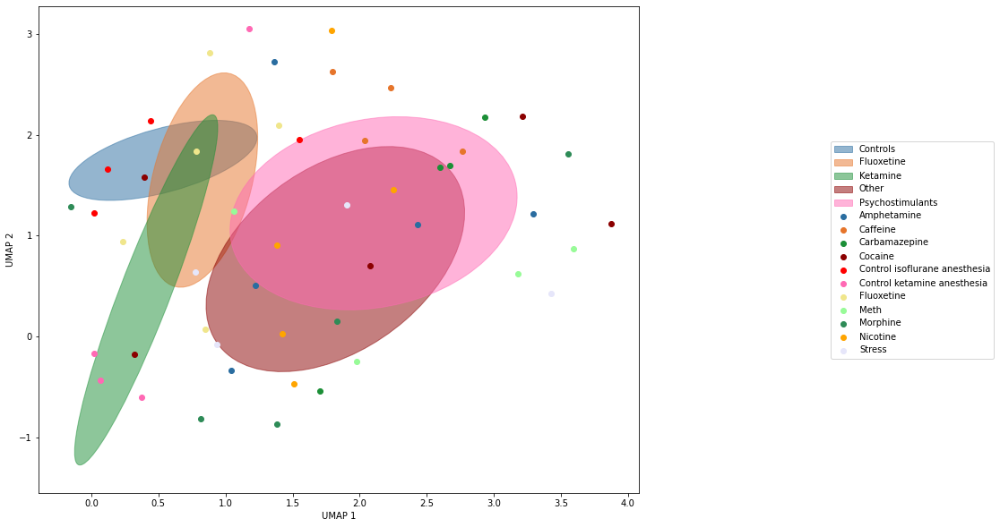

C:\Users\Kat\anaconda3\lib\site-packages\seaborn\matrix.py:619: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  linkage = hierarchy.linkage(self.array, method=self.method,


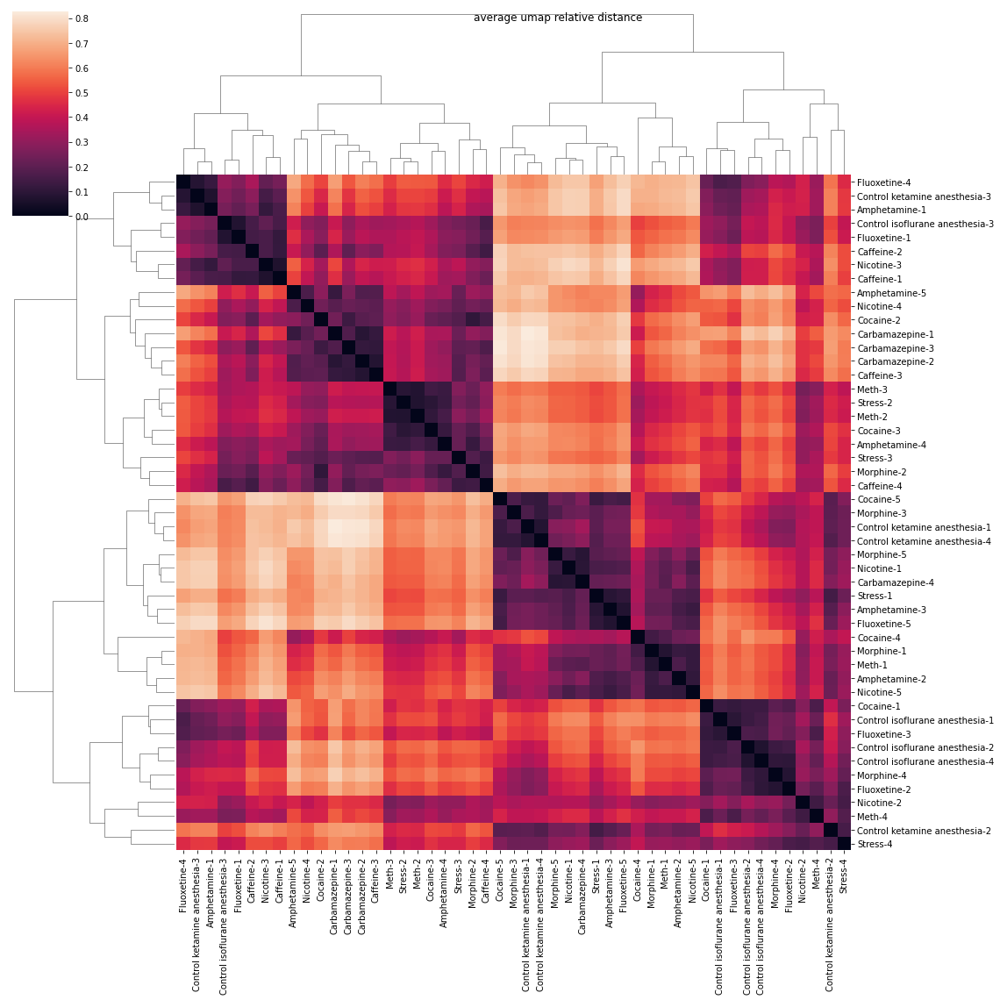

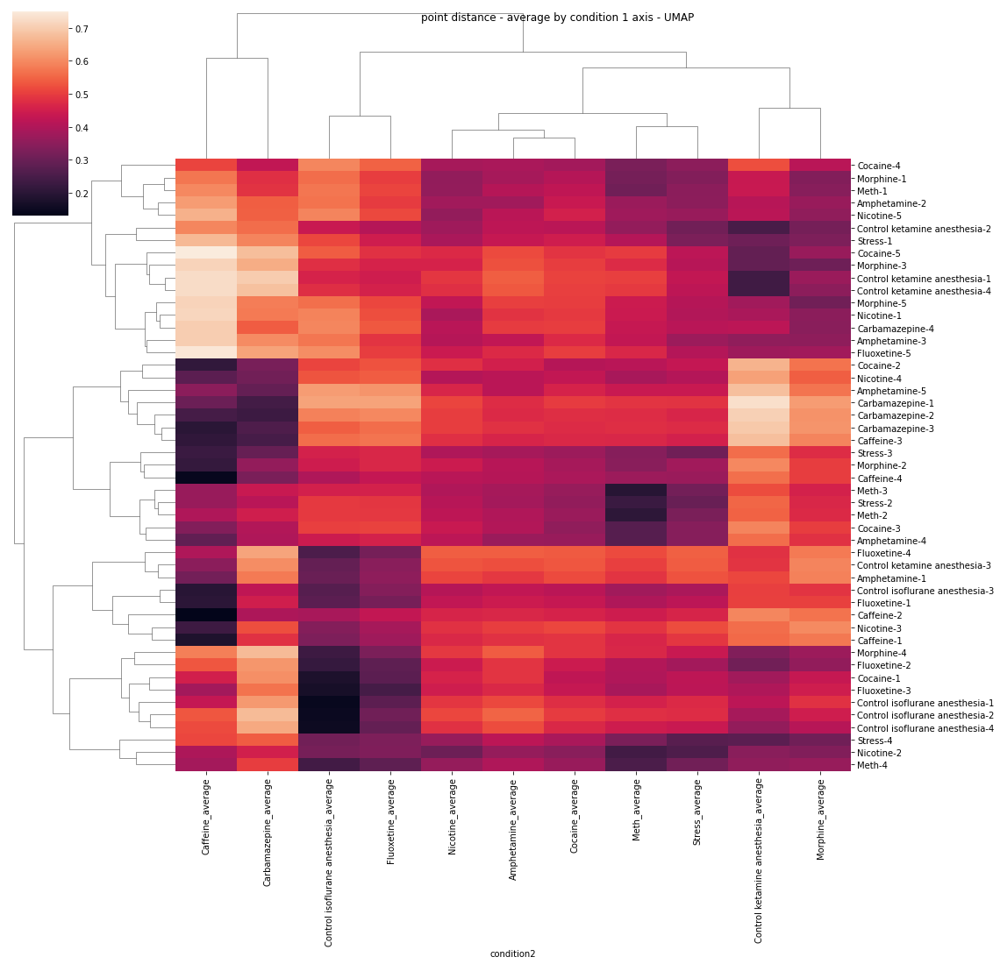

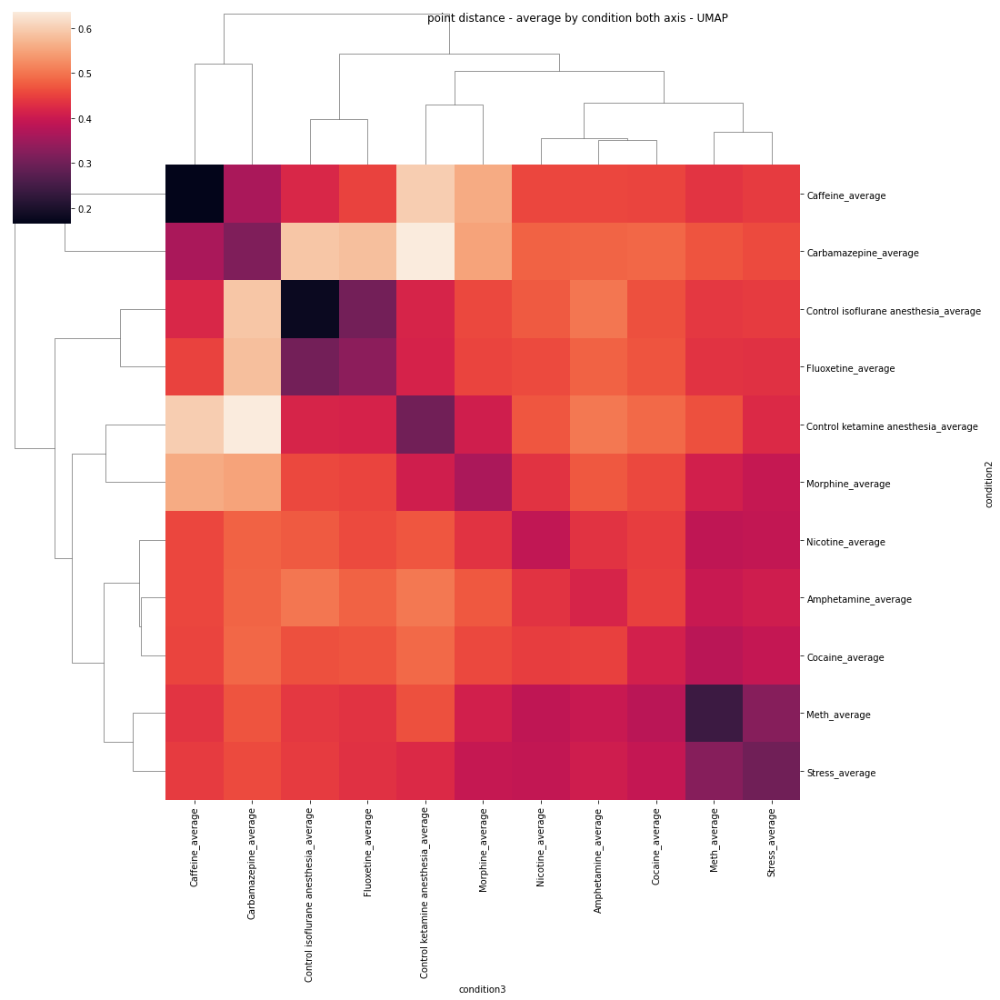

In [58]:
umap_and_heatmap(X_scaled,labels,condition_nums,grouped_elipse='yes',figname1='figures/fig2c_note0-in56.svg',figname2='figures/fig3a_note0-in56.svg',figname4='figures/fig2d_note0-in56.svg')

# DA cells
# addictive drugs only

not iso saline, ketamine saline, fluoxetine, caffeine, or carbamazepine

also removed GAD2-Cre, stress

In [59]:
addictive=all_data[(all_data["condition"] == 'Cocaine') |
                (all_data["condition"] == 'Nicotine')|
                (all_data["condition"] == 'Morphine')|
                (all_data["condition"] == 'Amphetamine')|
                (all_data["condition"] == 'Ethanol')|
                (all_data["condition"] == 'Meth')|
                (all_data["condition"] == 'Toluene')]

In [60]:
features, labels, condition_nums, regions = get_feats_and_labels(addictive)
X=features.to_numpy().astype(float)
#X_scaled=StandardScaler().fit_transform(X) 
X_scaled=zscore(X,axis=0)
X_scaled.sum(axis=0)
#can change n_components to more if you want to visualize in 3D 
pca = PCA(n_components=5)
#PCA using the scaled drug data array made earlier
principalComponents = pca.fit_transform(X_scaled)
#make into dataframe if you want to view with labels
principalDf = pd.DataFrame(data = principalComponents
             , columns = ['principal component 1', 'principal component 2', 'principal component 3', 'principal component 4', 'principal component 5'])
region_components=pd.DataFrame(data = pca.components_ , columns = regions)
#view df
print('Explained variance for each PC: 1, 2, 3')
print(pca.explained_variance_)
principalDf

Explained variance for each PC: 1, 2, 3
[6.48572352 4.38339864 2.28291763 1.64144212 1.47095694]


,principal component 1,principal component 2,principal component 3,principal component 4,principal component 5
0,0.239193,-1.962967,-1.245181,1.695077,-0.394432
1,-1.565659,1.040359,-0.729053,-1.462910,-0.160340
2,-2.657769,1.943436,-2.130590,1.166660,-0.245900
3,1.347377,4.148170,0.830268,-1.754391,0.001224
4,3.602878,-0.941855,-1.675295,-1.036336,-0.543272
5,-2.609553,-1.517691,0.220316,0.833269,1.350472
6,0.794796,2.171932,-2.107888,-0.514040,-1.951890
7,3.079119,0.679387,-0.513607,-0.865170,-0.688977
8,-1.508516,1.236856,0.208794,0.031194,0.063156
9,0.999502,3.428872,0.726694,-0.295323,3.502239


### PCA Plots

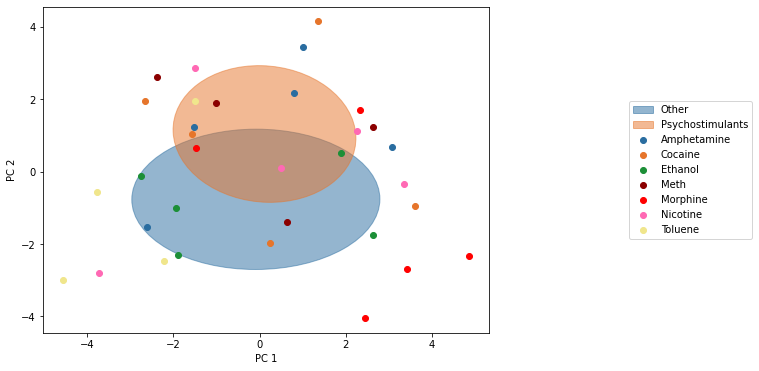

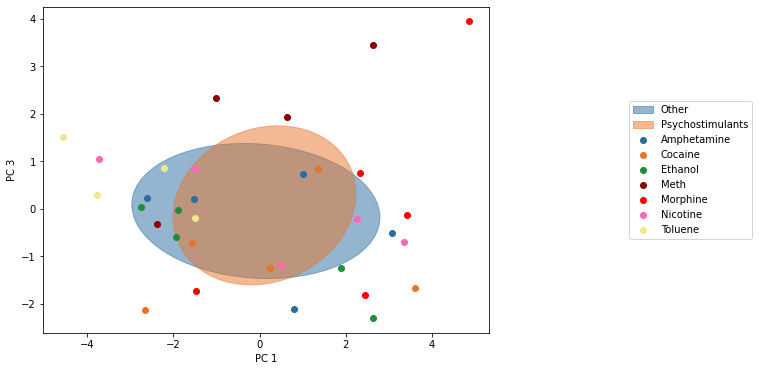

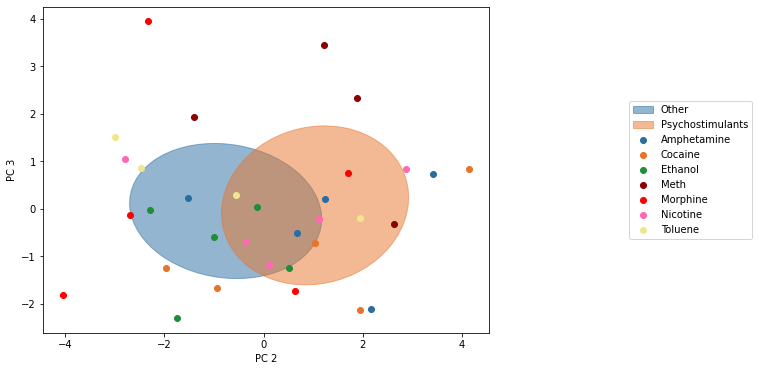

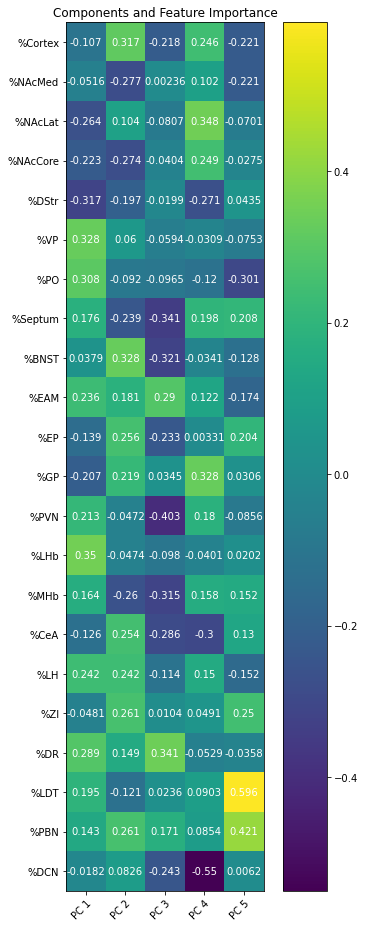

In [61]:
pc1=principalDf['principal component 1']
pc2=principalDf['principal component 2']
pc3=principalDf['principal component 3']
group = condition_nums 
make_pca_plots(pc1,pc2,pc3,group,labels,grouped_elipse='yes',figname1='figures/note0-in59-1.svg',figname2='figures/note0-in59-2.svg',figname3='figures/note0-in59-3.svg')
plot_components(region_components,figname4='figures/note0-in59-4.svg')

C:\Users\Kat\anaconda3\lib\site-packages\seaborn\matrix.py:619: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  linkage = hierarchy.linkage(self.array, method=self.method,


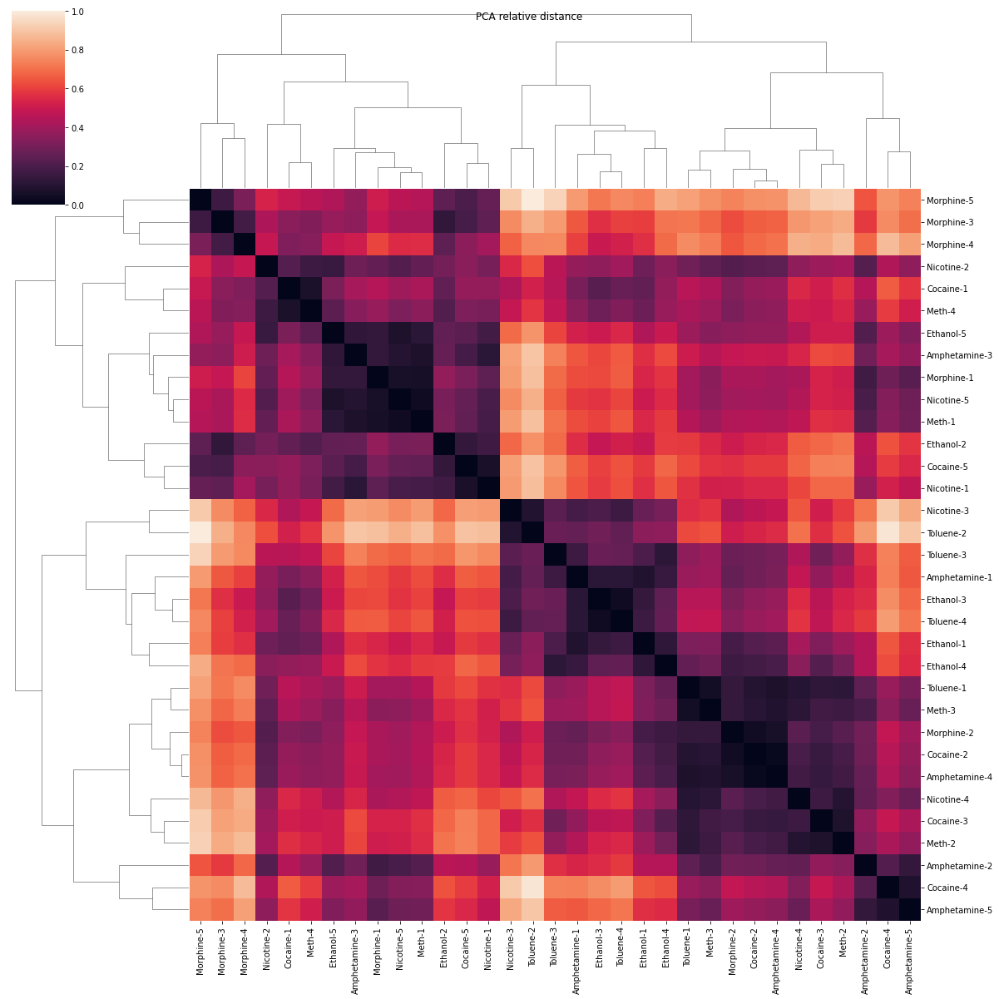

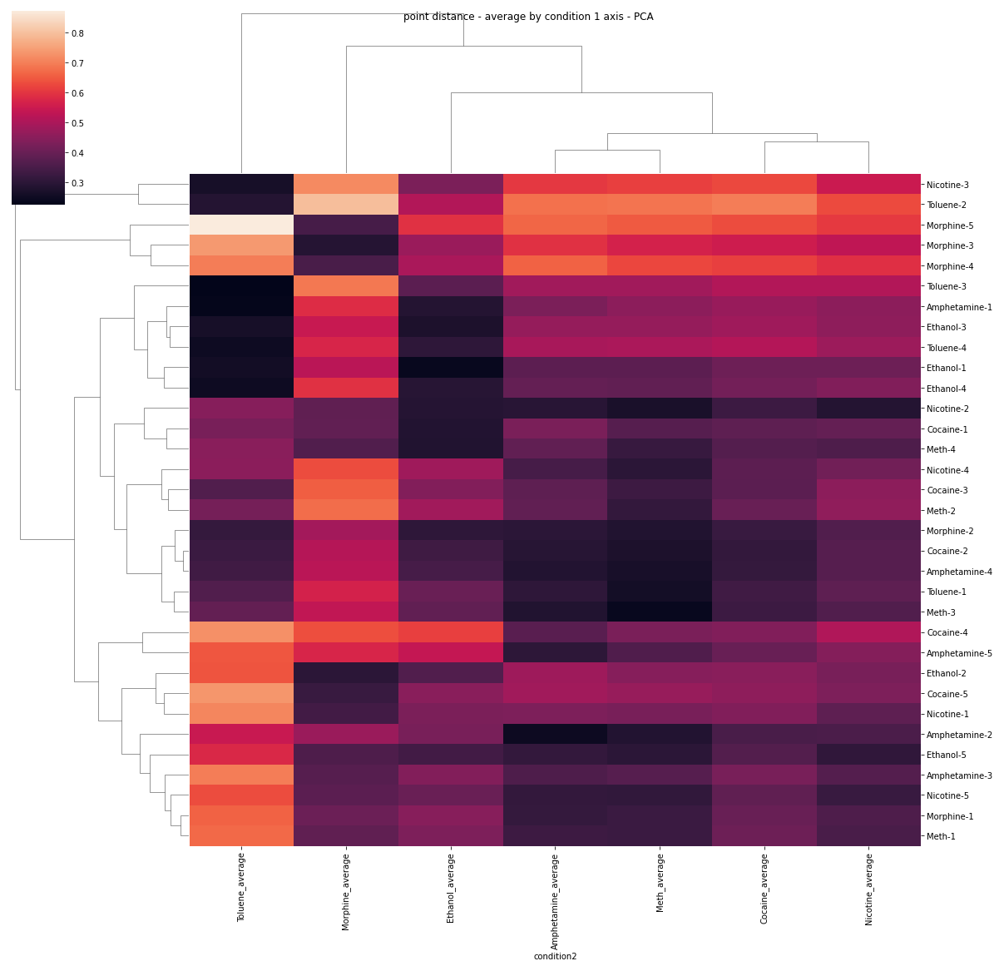

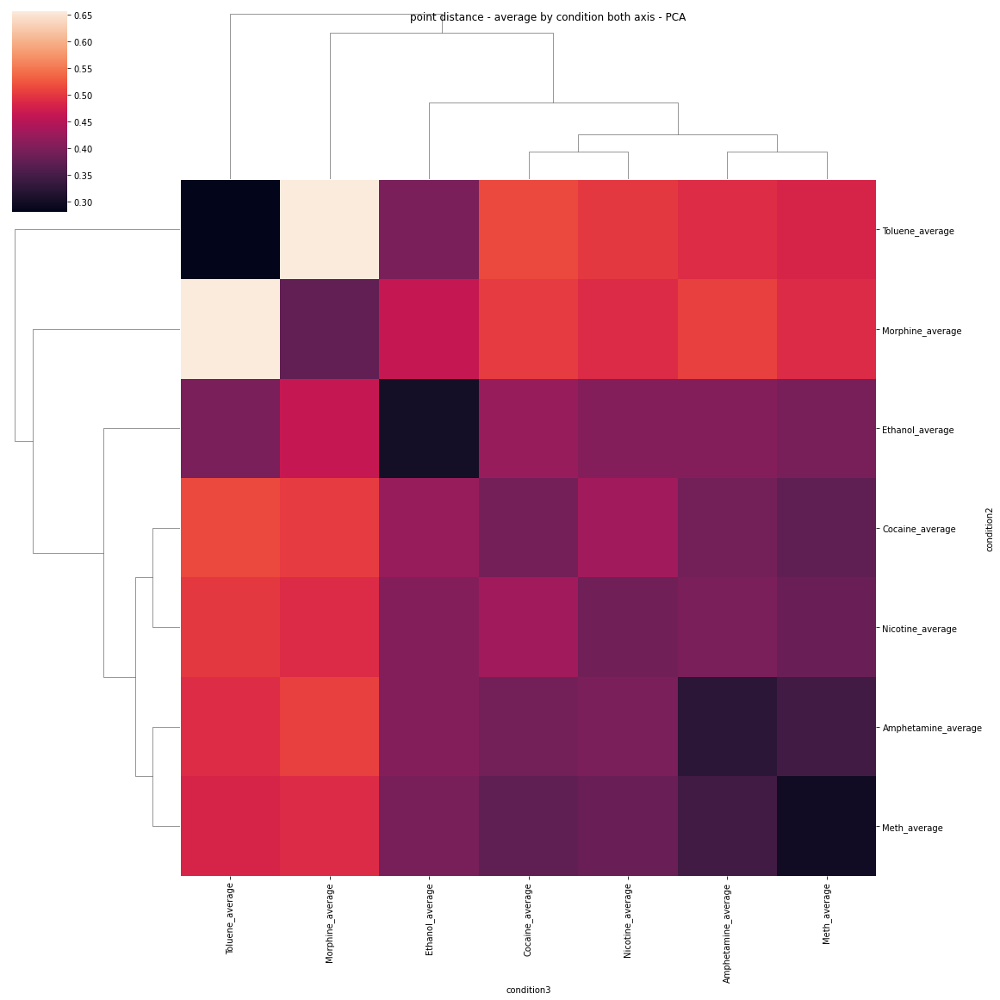

In [62]:
pca_dist=pca_distance(X_scaled,labels)
heatmapdf = pd.DataFrame(pca_dist,index=condition_nums,columns=condition_nums)
cm = sns.clustermap(heatmapdf,yticklabels=True)
cm.fig.suptitle("PCA relative distance")
cm.fig.set_size_inches(18, 18)
plt.show()
distance_to_other_points(pca_dist,labels,condition_nums,' - PCA') # pca 

### UMAP

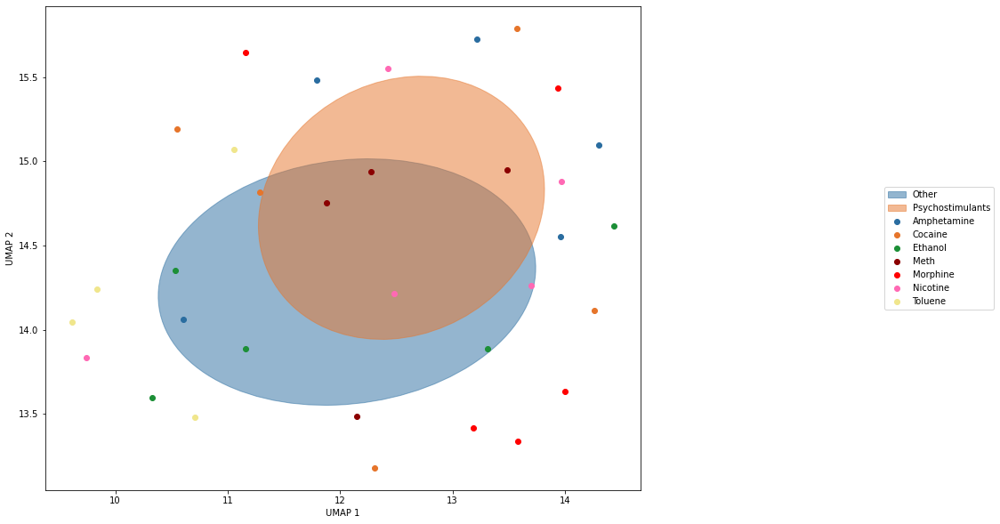

C:\Users\Kat\anaconda3\lib\site-packages\seaborn\matrix.py:619: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  linkage = hierarchy.linkage(self.array, method=self.method,


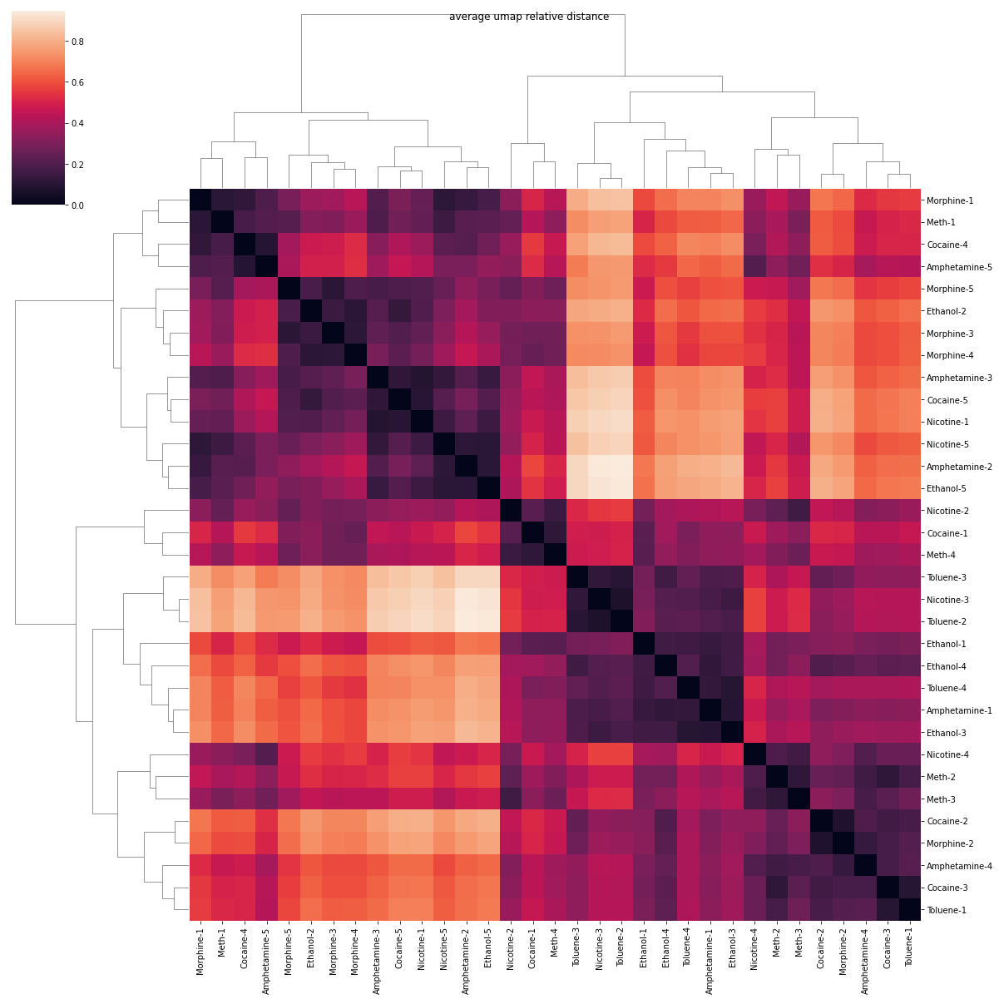

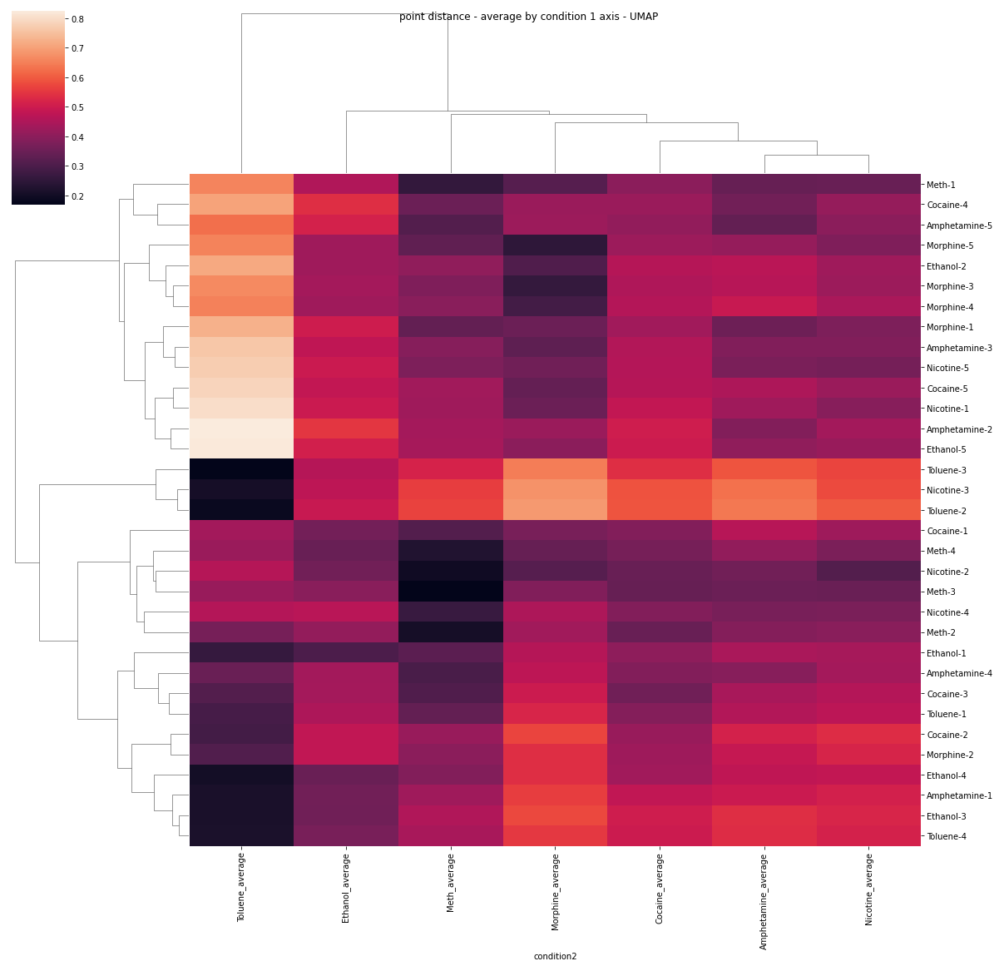

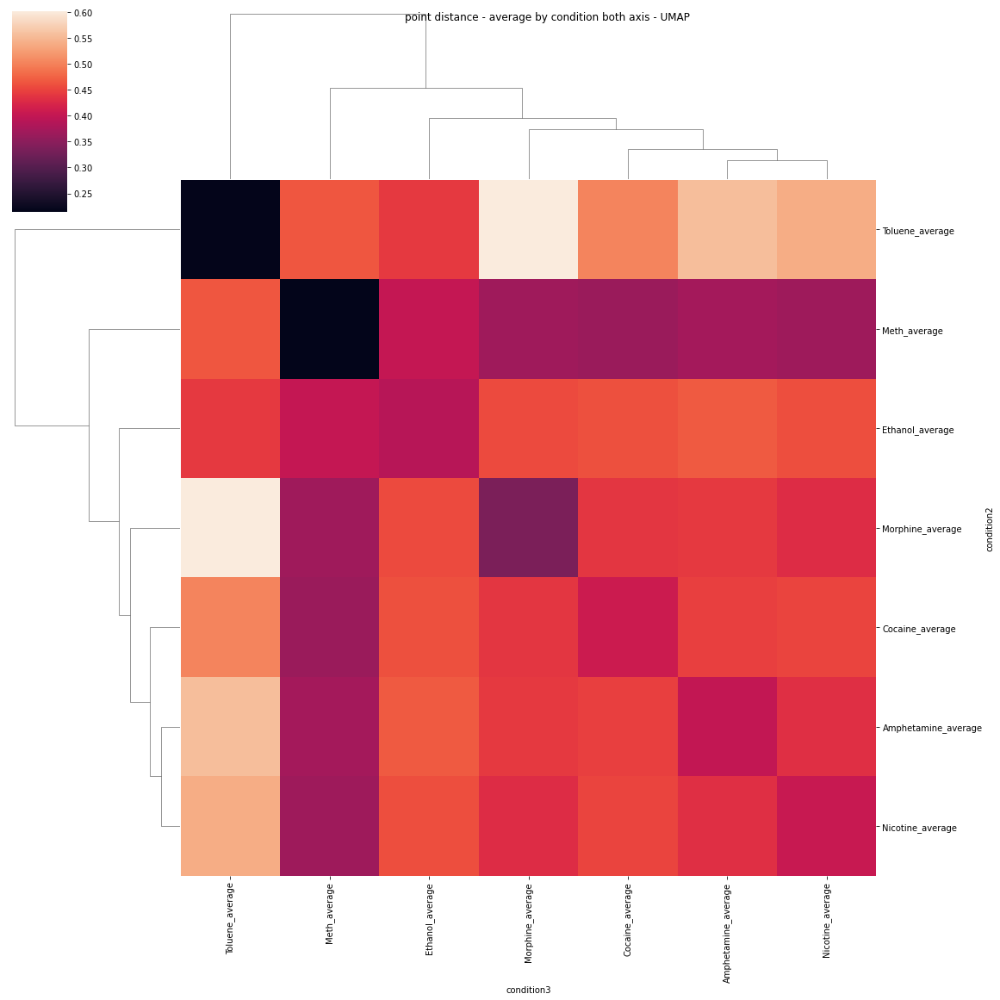

In [63]:
umap_and_heatmap(X_scaled,labels,condition_nums,grouped_elipse='yes',figname1='figures/note0-in61-1.svg',figname2='figures/note0-in61-2.svg',figname3='figures/note0-in61-3.svg',figname4='figures/note0-in61-4.svg')

# DA cells
# everything BUT the GAD2-Cre brains (below) 

In [64]:
nogad2=all_data[(all_data["condition"] == 'Cocaine') |
                (all_data["condition"] == 'Control ketamine anesthesia')| 
                (all_data["condition"] == 'Control isoflurane anesthesia')|
                (all_data["condition"] == 'Nicotine')|
                (all_data["condition"] == 'Morphine')|
                (all_data["condition"] == 'Amphetamine')|
                (all_data["condition"] == 'Fluoxetine')|
                (all_data["condition"] == 'Ethanol')|
                (all_data["condition"] == 'Meth')|
                (all_data["condition"] == 'Toluene')|
                (all_data["condition"] == 'Carbamazepine')|
                (all_data["condition"] == 'Stress')]

In [65]:
features, labels, condition_nums, regions = get_feats_and_labels(nogad2)
labels=list(labels)+list(labels2)
condition_nums=list(condition_nums)+list(condition_nums2)
#scale X 
X1=features.to_numpy().astype(float)
X2=features2.to_numpy().astype(float)
X=np.vstack((X1, X2))
#get rid of NAs before scaling
#X_scaled=StandardScaler().fit_transform(X) 
X_scaled=zscore(X,axis=0)
X_scaled.sum(axis=0)
#can change n_components to more if you want to visualize in 3D 
pca = PCA(n_components=5)
#PCA using the scaled drug data array made earlier
principalComponents = pca.fit_transform(X_scaled)
#make into dataframe if you want to view with labels
principalDf = pd.DataFrame(data = principalComponents
             , columns = ['principal component 1', 'principal component 2', 'principal component 3', 'principal component 4', 'principal component 5'])
region_components=pd.DataFrame(data = pca.components_ , columns = regions)
#view df
print('Explained variance for each PC: 1, 2, 3')
print(pca.explained_variance_)
principalDf

Explained variance for each PC: 1, 2, 3
[5.59963069 3.72580965 2.39936136 1.79098284 1.38621102]


,principal component 1,principal component 2,principal component 3,principal component 4,principal component 5
0,0.099617,-2.100430,-1.007847,1.562761,0.716652
1,1.874768,1.393360,-0.833895,-0.472864,-0.051110
2,2.775848,1.905954,-2.529524,0.499173,-0.559014
3,-1.499583,4.644779,-0.576408,-0.697001,0.573123
4,-3.368641,-0.533691,-0.583629,-1.017606,-1.000359
5,-3.920282,-1.728059,-1.415302,0.150553,-0.536925
6,-2.009678,0.147015,-1.306064,1.453965,-1.616887
7,2.705172,-1.932556,0.294531,1.931618,-1.119067
8,-2.964544,-1.960775,-0.856197,0.113371,-1.624913
9,0.174356,-2.305000,-0.560284,-1.177695,0.656634


## PCA plots

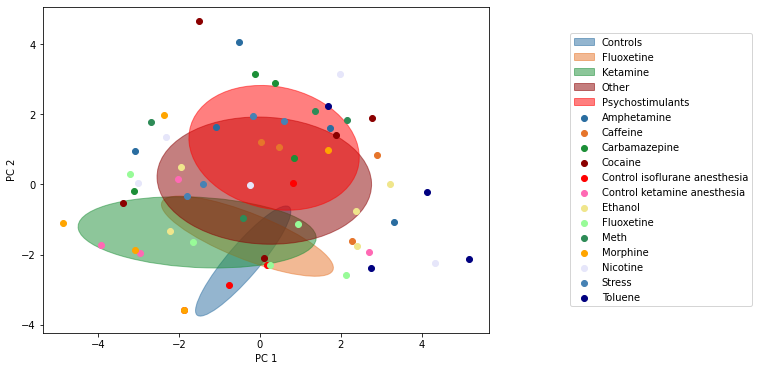

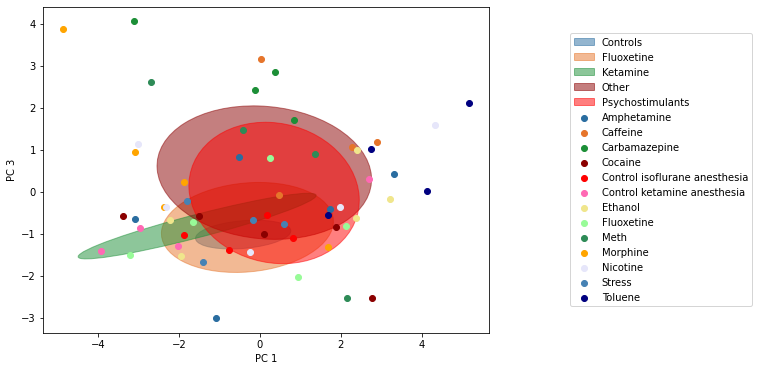

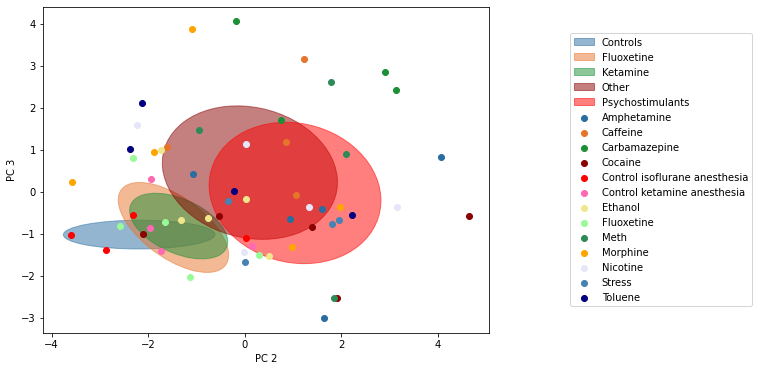

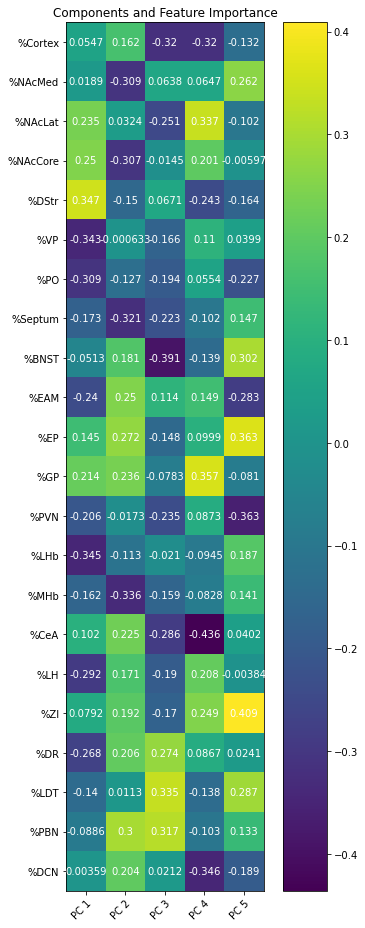

In [66]:
pc1=principalDf['principal component 1']
pc2=principalDf['principal component 2']
pc3=principalDf['principal component 3']
group = condition_nums 
make_pca_plots(pc1,pc2,pc3,group,labels,grouped_elipse='yes',figname1='figures/note0-in64-1.svg',figname2='figures/note0-in64-2.svg',figname3='figures/note0-in64-3.svg')
plot_components(region_components,figname4='figures/note0-in64-4.svg')

C:\Users\Kat\anaconda3\lib\site-packages\seaborn\matrix.py:619: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  linkage = hierarchy.linkage(self.array, method=self.method,


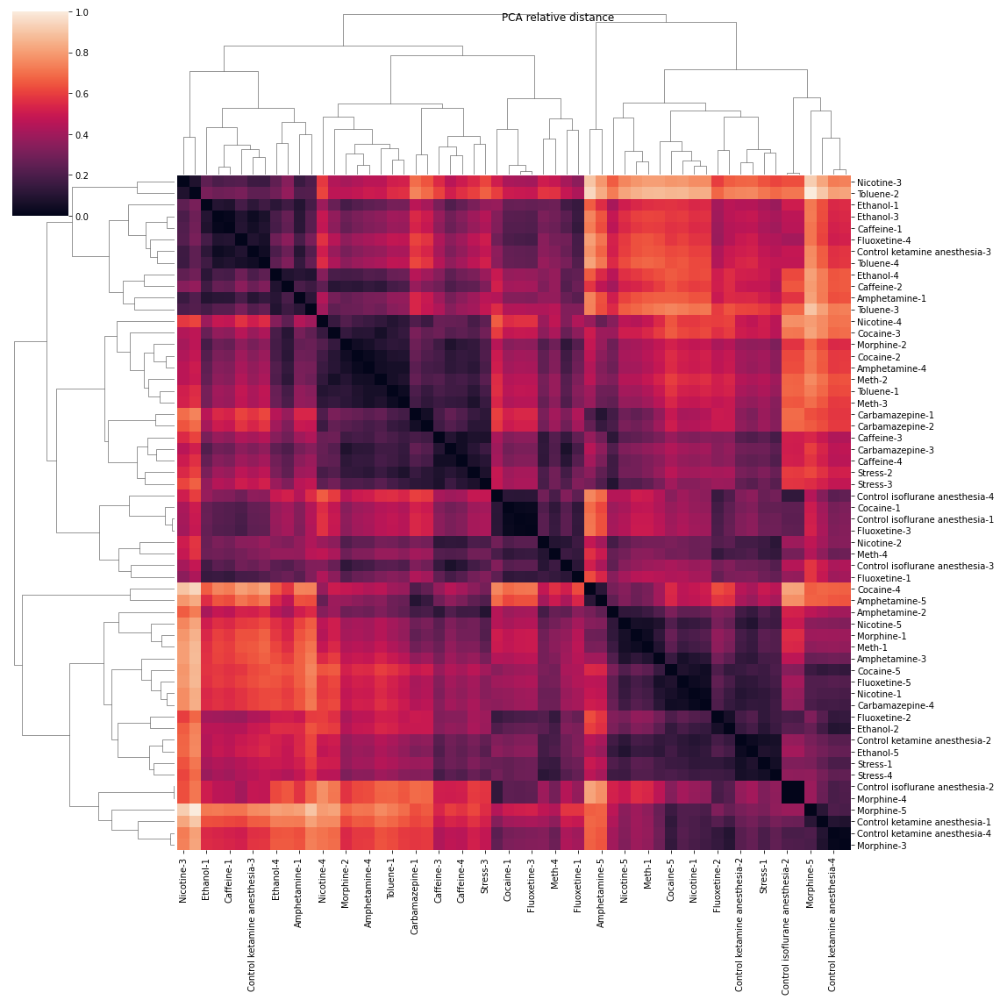

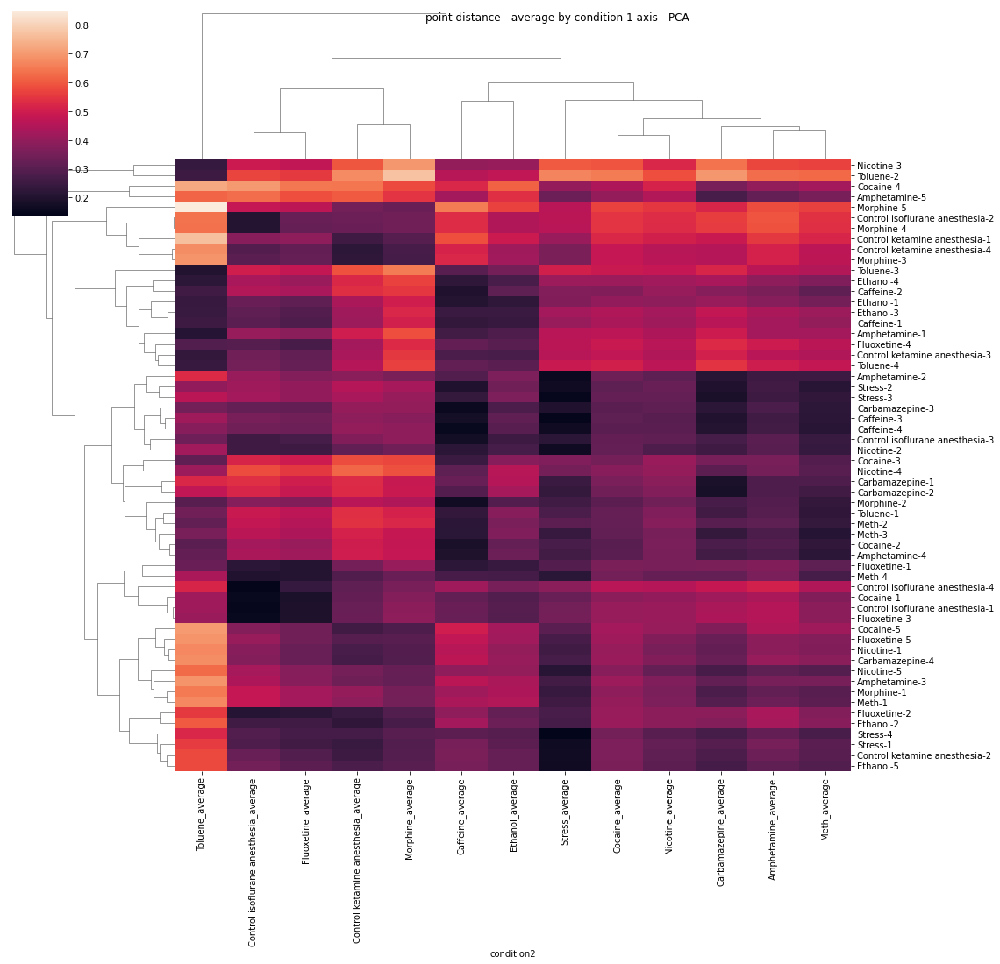

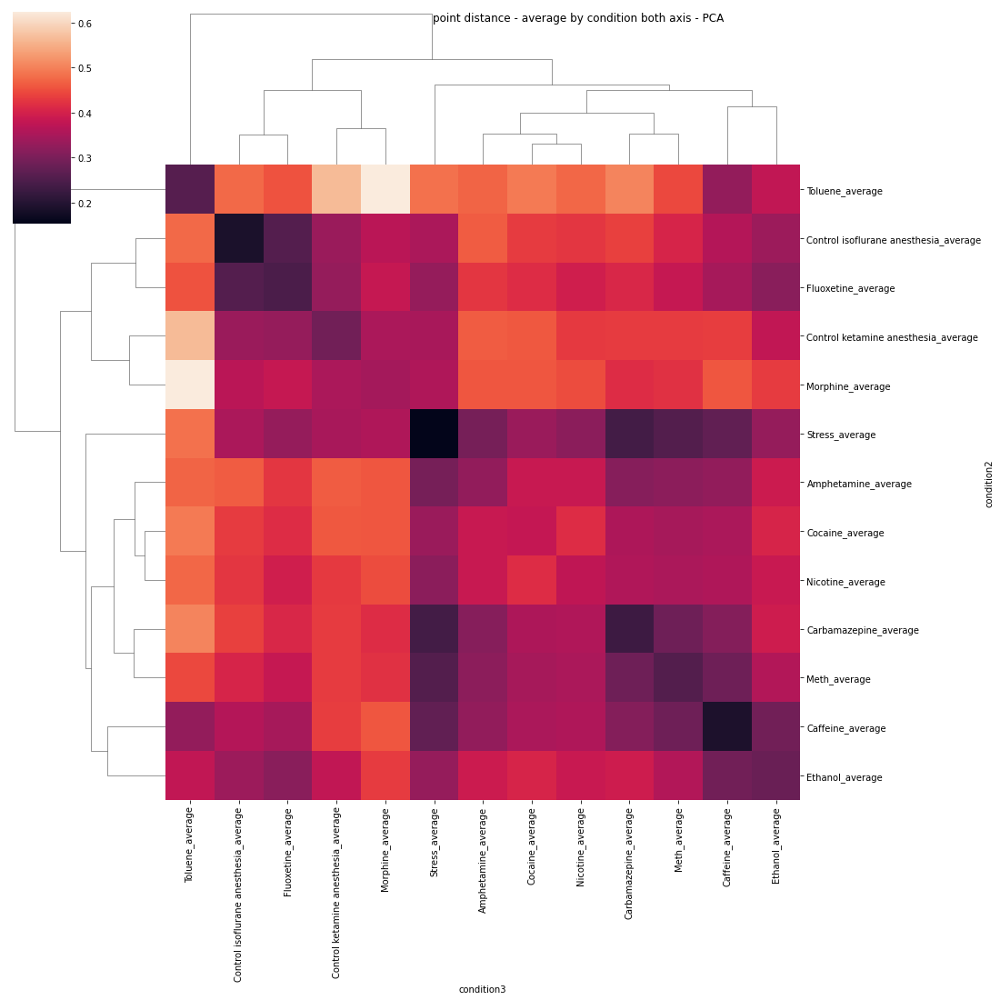

In [67]:
pca_dist=pca_distance(X_scaled,labels)
heatmapdf = pd.DataFrame(pca_dist,index=condition_nums,columns=condition_nums)
cm = sns.clustermap(heatmapdf,yticklabels=True)
cm.fig.suptitle("PCA relative distance")
cm.fig.set_size_inches(18, 18)
plt.show()
distance_to_other_points(pca_dist,labels,condition_nums,' - PCA') # pca 

## UMAP

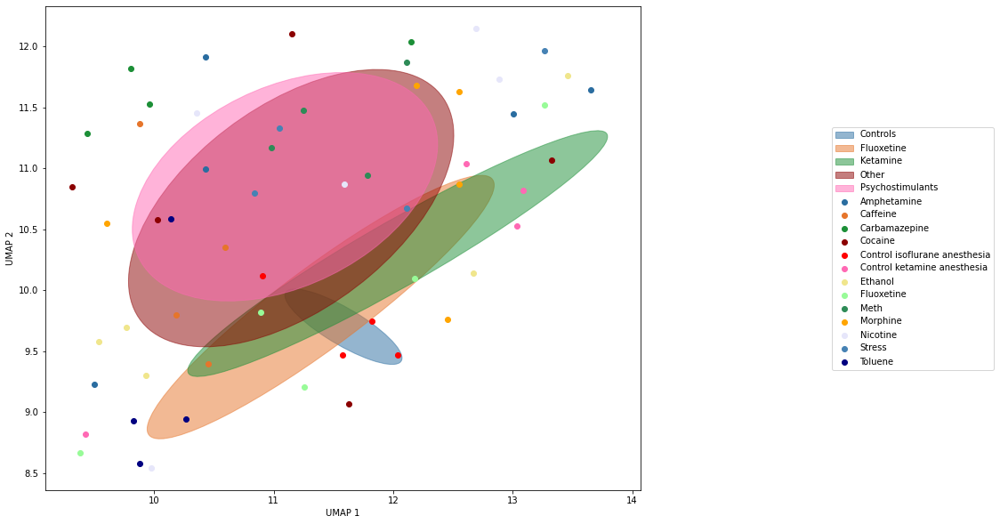

C:\Users\Kat\anaconda3\lib\site-packages\seaborn\matrix.py:619: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  linkage = hierarchy.linkage(self.array, method=self.method,


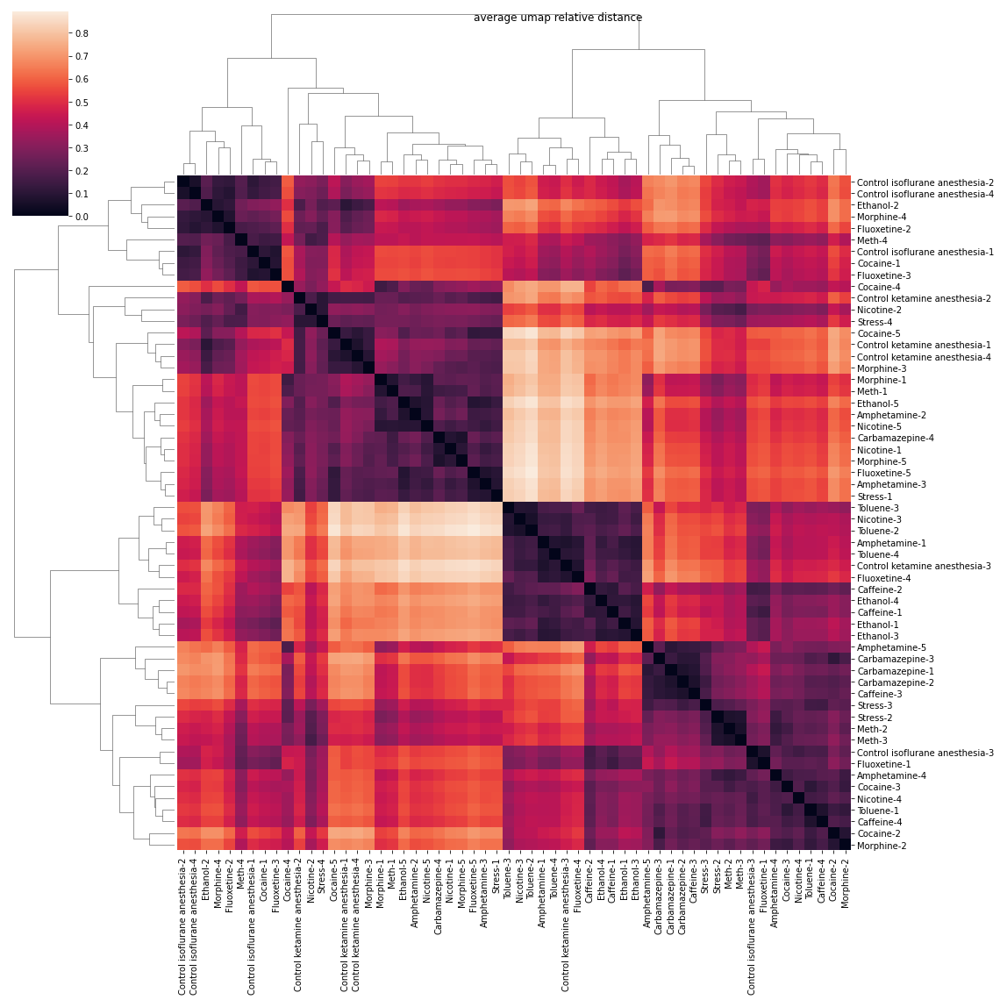

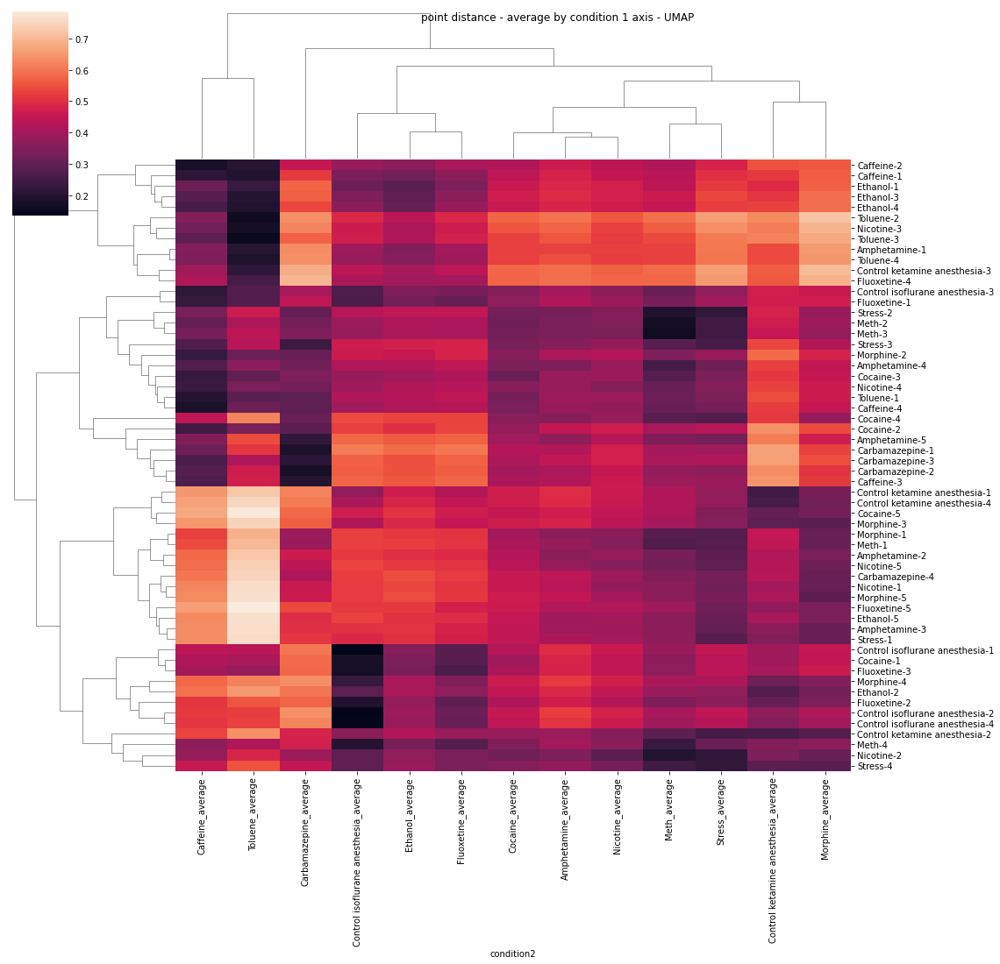

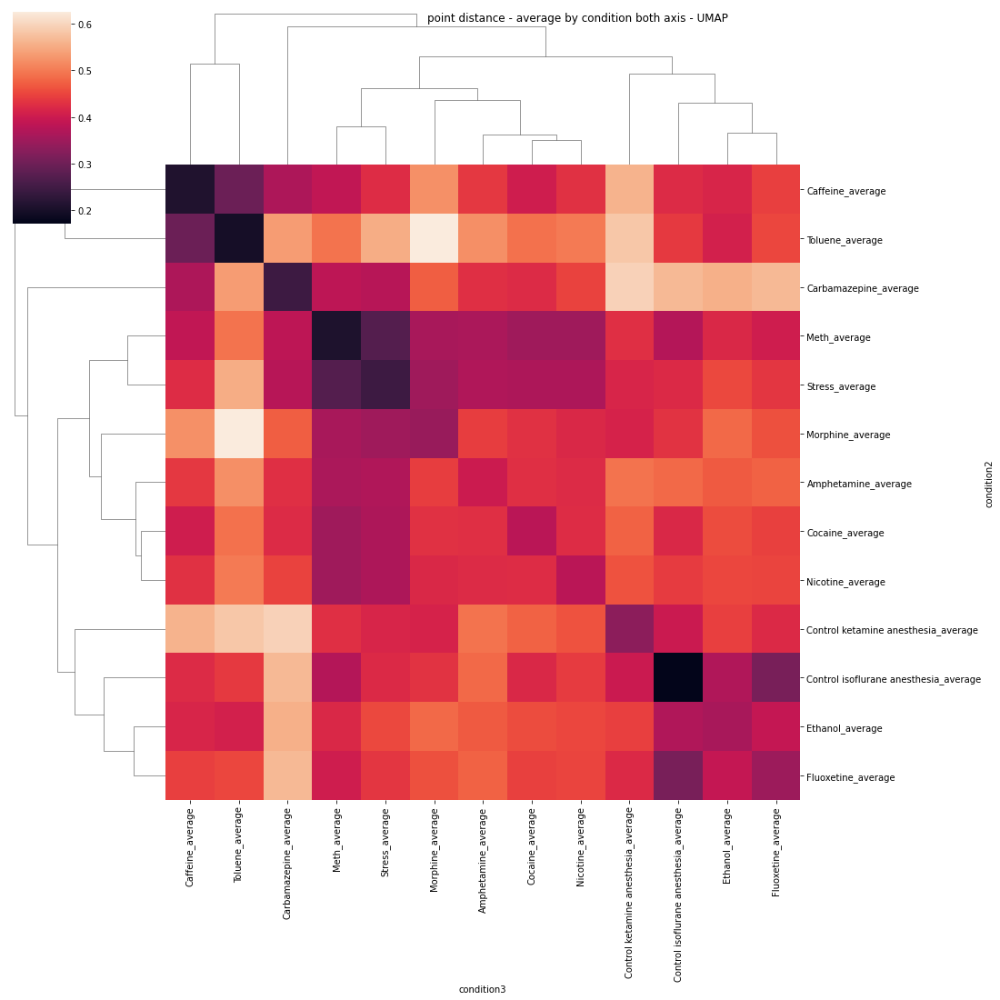

In [68]:
umap_and_heatmap(X_scaled,labels,condition_nums,grouped_elipse='yes',figname1='figures/note0-in66-1.svg',figname2='figures/note0-in66-2.svg',figname3='figures/note0-in66-3.svg',figname4='figures/note0-in66-4.svg')

# DA cells
# ONLY the GAD2-Cre brains (below)

In [69]:
gad2only2=all_data[(all_data["condition"] == 'Gad2-Cre')]
features3, labels3, condition_nums3, regions3 = get_feats_and_labels(gad2only2)

In [70]:
gad2only=all_data[(all_data["condition"] == 'Gad2-Cre') | 
                  (all_data["condition"] == 'GAD2-Cre Cocaine')]
features, labels, condition_nums, regions = get_feats_and_labels(gad2only)
#scale X 
X=features.to_numpy()
#get rid of NAs before scaling
X_scaled=zscore(X,axis=0)

#can change n_components to more if you want to visualize in 3D 
pca = PCA(n_components=5)
#PCA using the scaled drug data array made earlier
principalComponents = pca.fit_transform(X_scaled)
#make into dataframe if you want to view with labels
principalDf = pd.DataFrame(data = principalComponents
             , columns = ['principal component 1', 'principal component 2', 'principal component 3', 'principal component 4', 'principal component 5'])
region_components=pd.DataFrame(data = pca.components_ , columns = regions)
#view df
print('Explained variance for each PC: 1, 2, 3')
print(pca.explained_variance_)
principalDf

Explained variance for each PC: 1, 2, 3
[6.42830246 5.3146095  3.33718725 2.82533048 1.80923208]


,principal component 1,principal component 2,principal component 3,principal component 4,principal component 5
0,2.288452,-0.732334,-2.831728,-1.480359,-0.430110
1,-0.486000,0.062501,0.715959,3.066658,-2.038601
2,-0.688513,-0.900157,2.783521,-1.441412,-1.491927
3,0.468270,1.553652,0.437149,1.080606,0.864522
4,5.714318,-0.370454,0.066434,-0.497671,1.937560
5,-1.348147,2.580489,1.464121,-1.949328,0.791569
6,-2.051438,-0.864300,0.692848,2.101899,2.555504
7,-2.103462,1.363173,-1.445280,1.881731,0.469559
8,-0.988967,5.313399,-0.369878,-1.475267,-0.624503
9,-4.636462,-3.812711,-1.515244,-1.990739,0.552010


## PCA plots

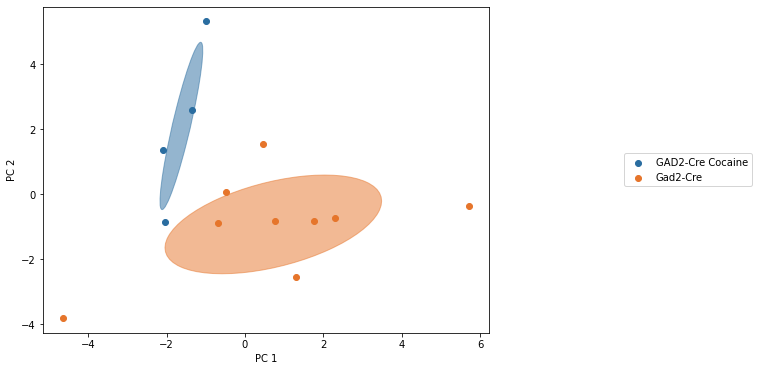

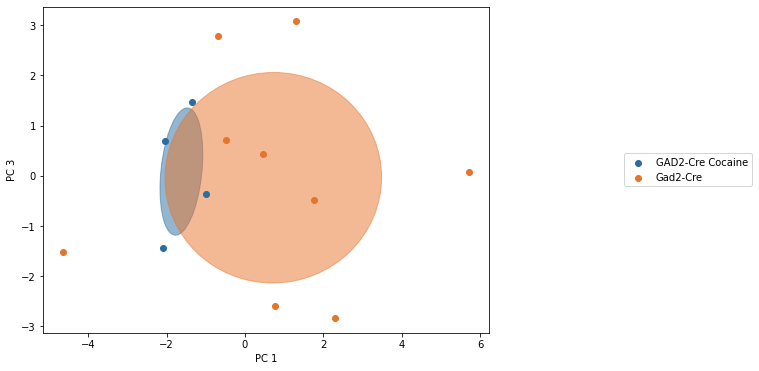

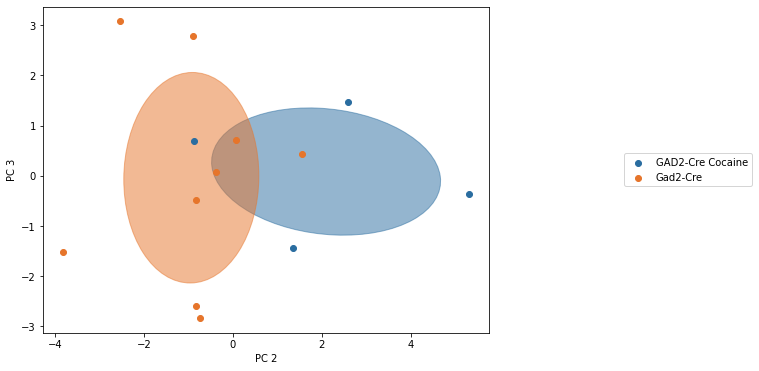

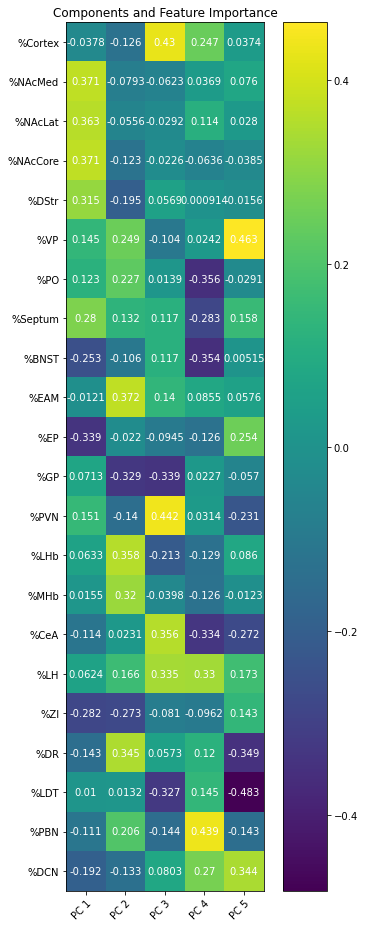

In [71]:
pc1=principalDf['principal component 1']
pc2=principalDf['principal component 2']
pc3=principalDf['principal component 3']
group = condition_nums 
make_pca_plots(pc1,pc2,pc3,group,labels,grouped_elipse='no',figname1='figures/note0-in69-1.svg',figname2='figures/note0-in69-2.svg',figname3='figures/note0-in69-3.svg')
plot_components(region_components,figname4='figures/note0-in69-4.svg')

C:\Users\Kat\anaconda3\lib\site-packages\seaborn\matrix.py:619: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  linkage = hierarchy.linkage(self.array, method=self.method,


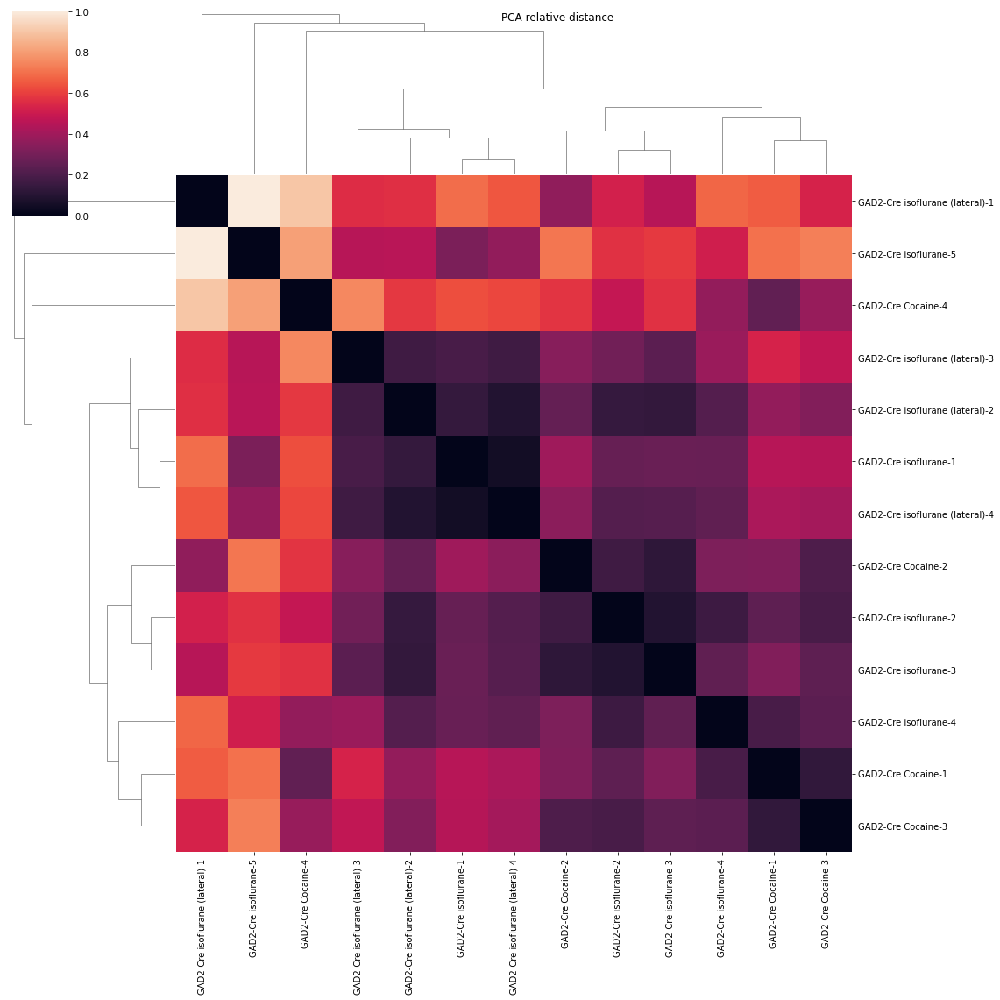

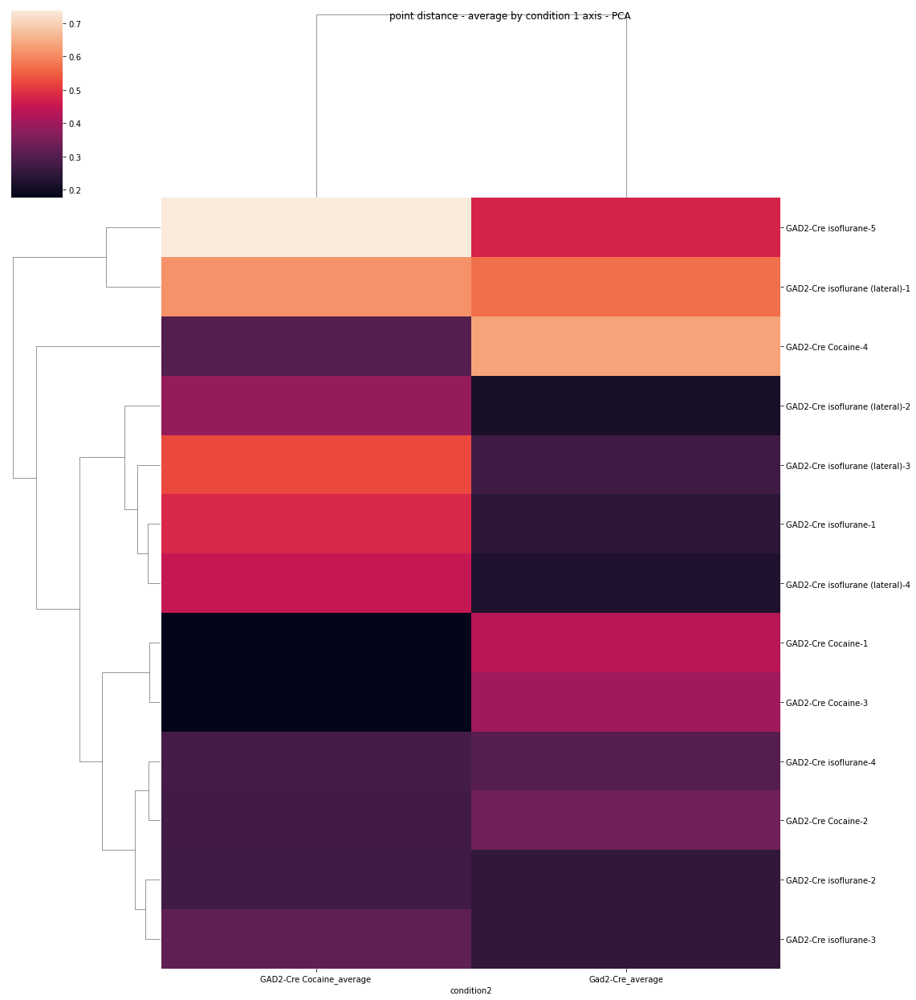

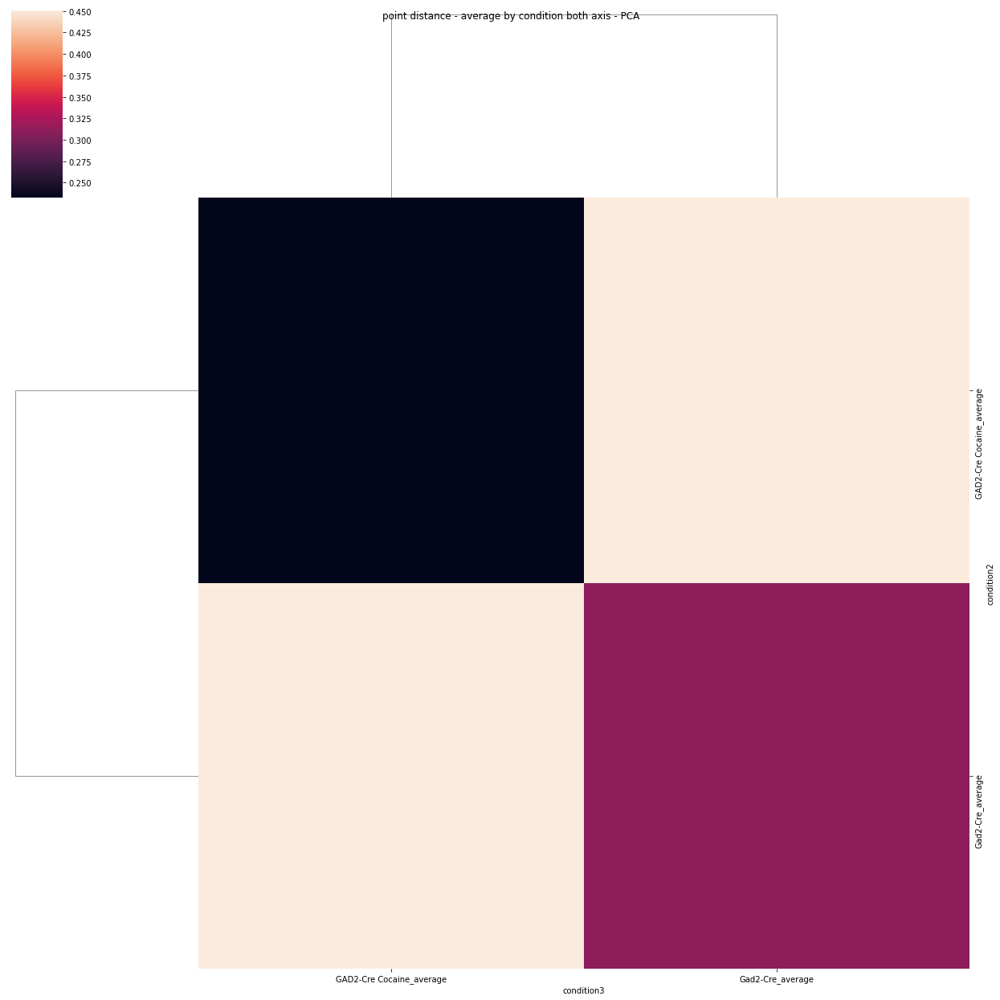

In [72]:
pca_dist=pca_distance(X_scaled,labels)
heatmapdf = pd.DataFrame(pca_dist,index=condition_nums,columns=condition_nums)
cm = sns.clustermap(heatmapdf,yticklabels=True)
cm.fig.suptitle("PCA relative distance")
cm.fig.set_size_inches(18, 18)
plt.show()
distance_to_other_points(pca_dist,labels,condition_nums,' - PCA') # pca 

## UMAP

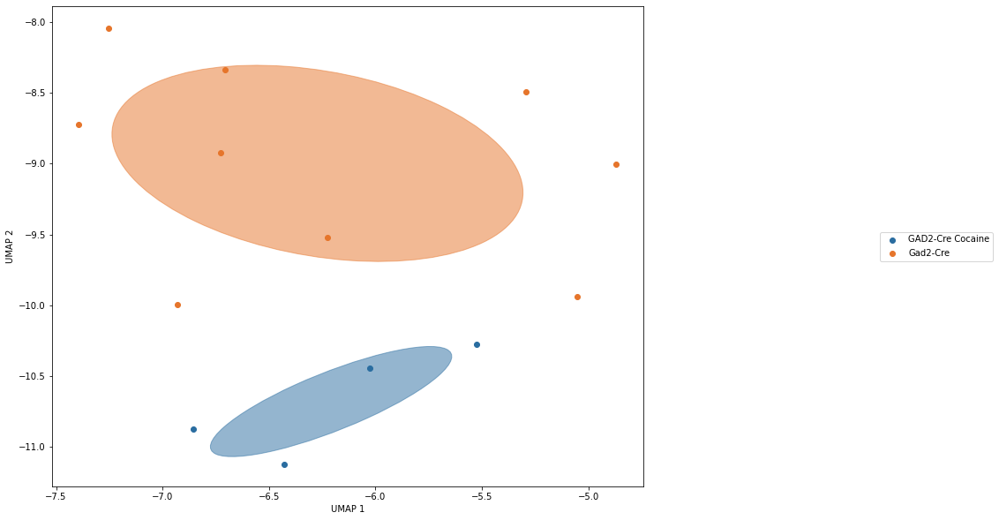

C:\Users\Kat\anaconda3\lib\site-packages\seaborn\matrix.py:619: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  linkage = hierarchy.linkage(self.array, method=self.method,


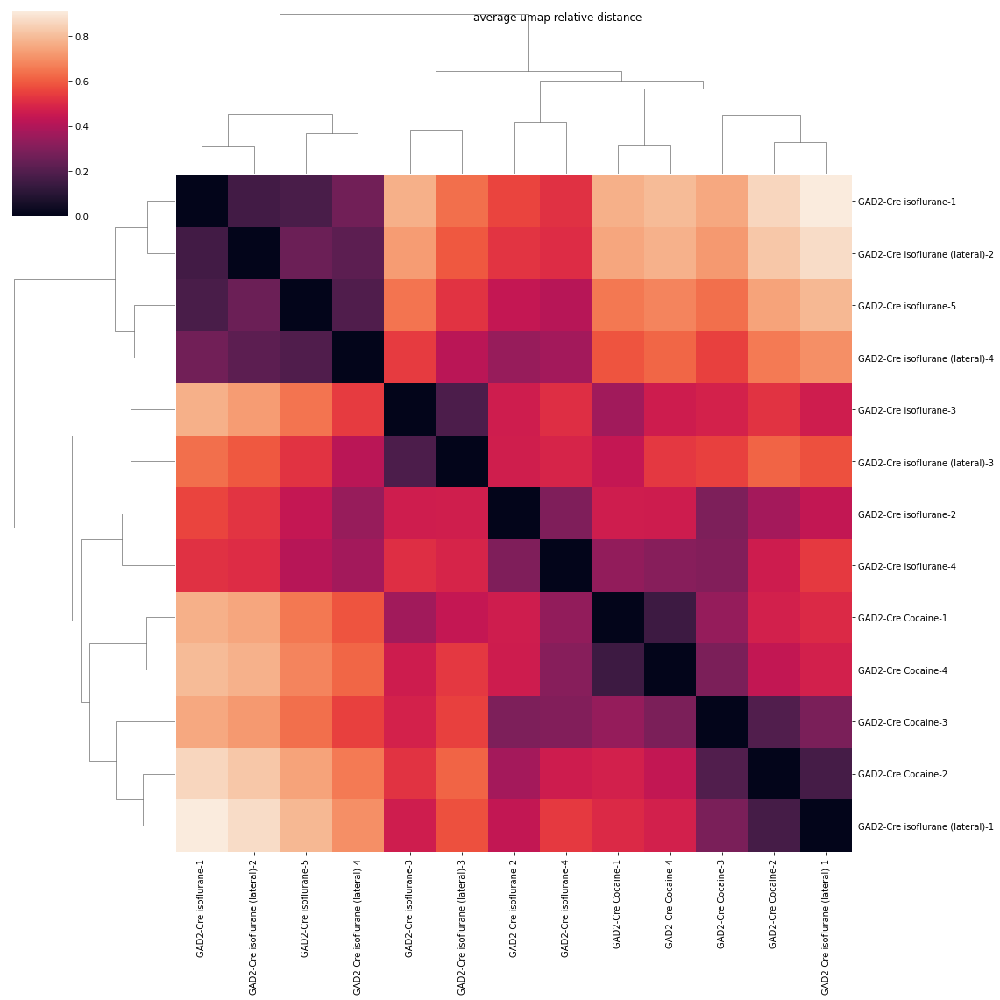

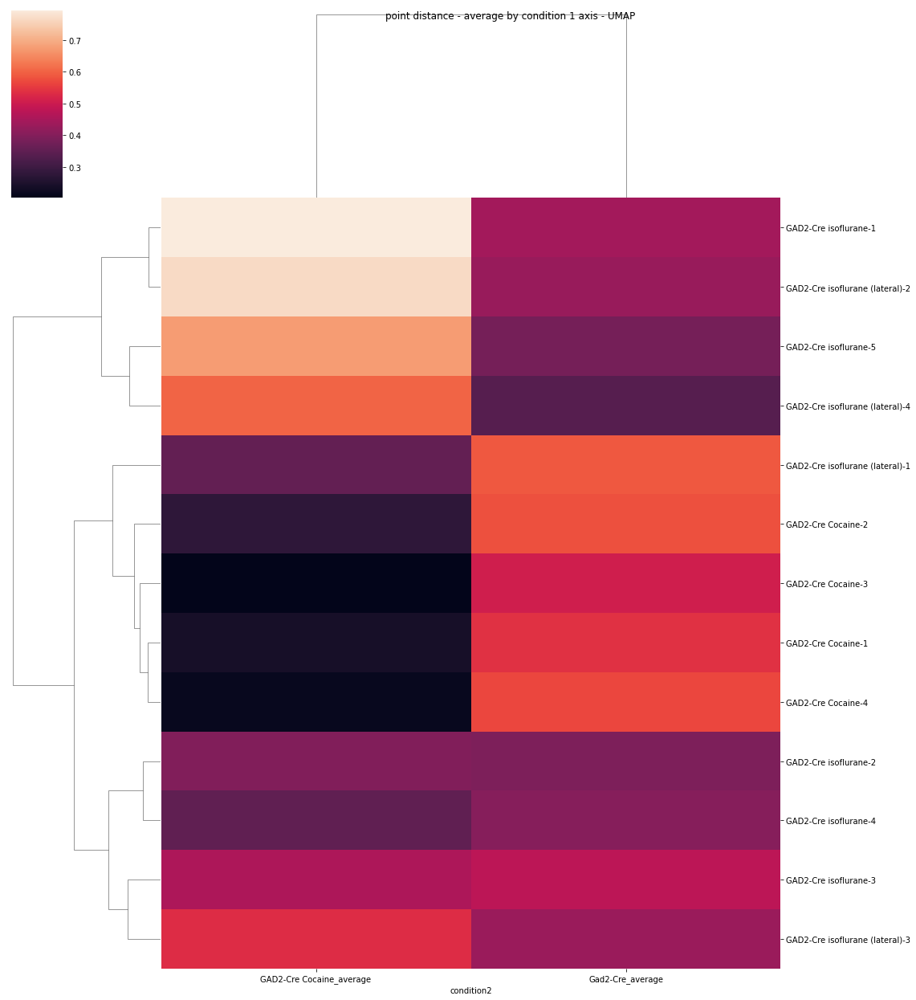

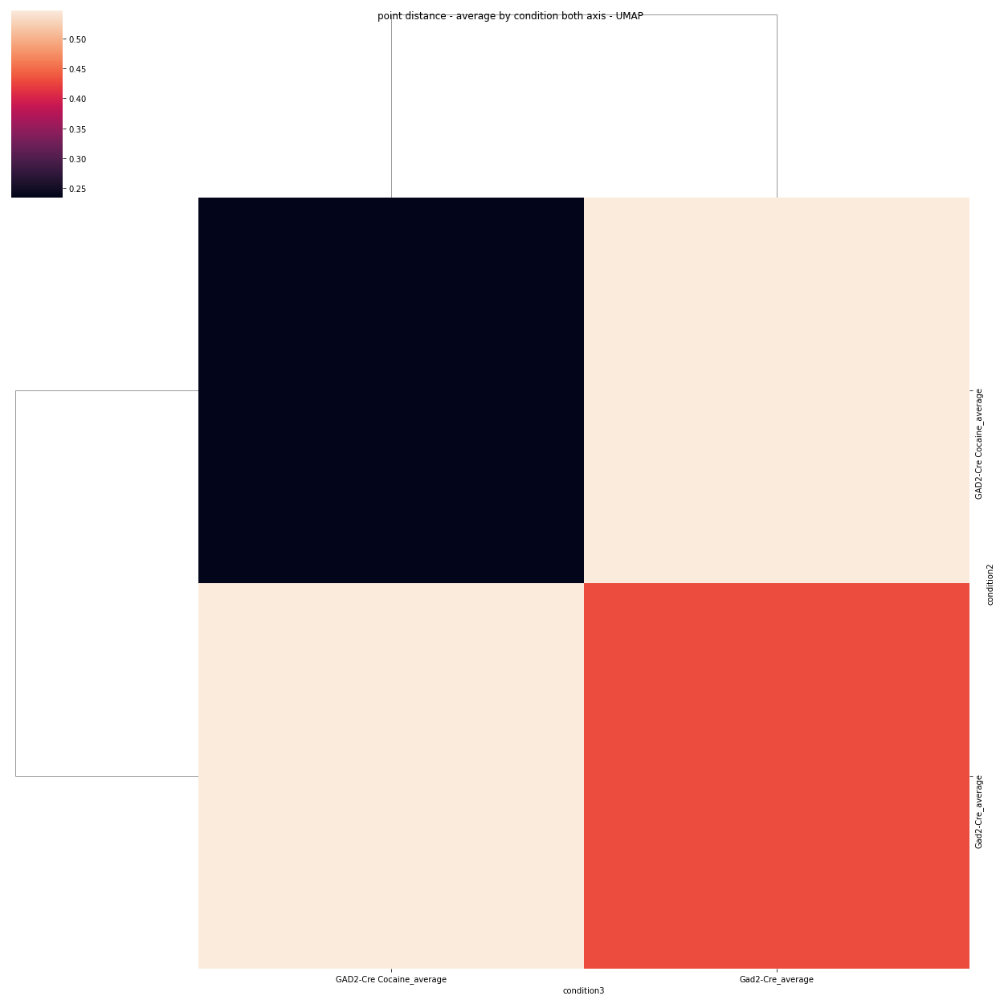

In [73]:
umap_and_heatmap(X_scaled,labels,condition_nums,grouped_elipse='no',figname1='figures/note0-in71-1.svg',figname2='figures/note0-in71-2.svg',figname3='figures/note0-in71-3.svg',figname4='figures/note0-in71-4.svg')

# DA cells
# removed GAD2-Cre, and Ethanol conditions (below)

In [74]:
nogad2nomdmaetoh=all_data[(all_data["condition"] == 'Cocaine') |
                (all_data["condition"] == 'Control ketamine anesthesia')| 
                (all_data["condition"] == 'Control isoflurane anesthesia')|
                (all_data["condition"] == 'Nicotine')|
                (all_data["condition"] == 'Morphine')|
                (all_data["condition"] == 'Amphetamine')|
                (all_data["condition"] == 'Fluoxetine')|
                (all_data["condition"] == 'Meth')|
                (all_data["condition"] == 'Toluene')|
                (all_data["condition"] == 'Carbamazepine')|
                (all_data["condition"] == 'Stress')]

In [75]:
features, labels, condition_nums, regions = get_feats_and_labels(nogad2nomdmaetoh)
labels=list(labels)+list(labels2)
condition_nums=list(condition_nums)+list(condition_nums2)
#scale X 
X1=features.to_numpy().astype(float)
X2=features2.to_numpy().astype(float)
X=np.vstack((X1, X2))
#get rid of NAs before scaling
#X_scaled=StandardScaler().fit_transform(X) 
X_scaled=zscore(X,axis=0)
X_scaled.sum(axis=0)

#can change n_components to more if you want to visualize in 3D 
pca = PCA(n_components=5)
#PCA using the scaled drug data array made earlier
principalComponents = pca.fit_transform(X_scaled)
#make into dataframe if you want to view with labels
principalDf = pd.DataFrame(data = principalComponents
             , columns = ['principal component 1', 'principal component 2', 'principal component 3', 'principal component 4', 'principal component 5'])
region_components=pd.DataFrame(data = pca.components_ , columns = regions)
#view df
print('Explained variance for each PC: 1, 2, 3')
print(pca.explained_variance_)
principalDf

Explained variance for each PC: 1, 2, 3
[5.48794921 3.87772966 2.49326373 1.87349765 1.47557919]


,principal component 1,principal component 2,principal component 3,principal component 4,principal component 5
0,0.165772,-2.228957,-1.031928,1.494794,0.801746
1,1.984985,1.225124,-0.848302,-0.579305,0.044190
2,2.758354,1.853135,-2.581478,0.717940,-0.570947
3,-1.407767,4.572182,-0.646303,-0.786387,0.616937
4,-3.224939,-0.626158,-0.659044,-0.989834,-1.107621
5,-3.857447,-1.709699,-1.552424,0.301320,-0.649609
6,-1.937756,0.114082,-1.341853,1.640608,-1.646202
7,2.748688,-2.013713,0.339439,1.970011,-1.040485
8,-2.884766,-1.909646,-0.902387,0.252931,-1.762796
9,0.244416,-2.366584,-0.596292,-1.127356,0.533799


## PCA plots

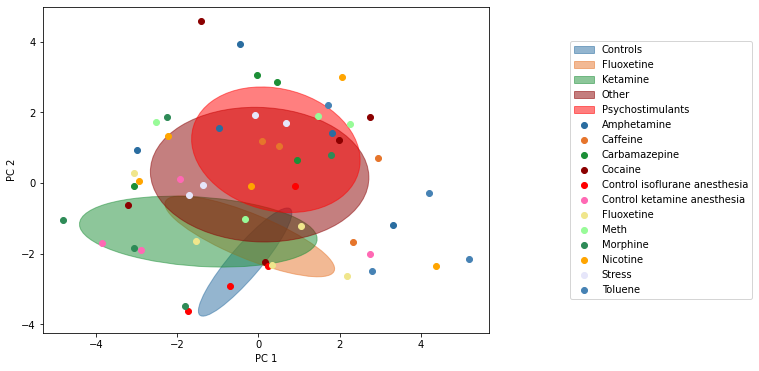

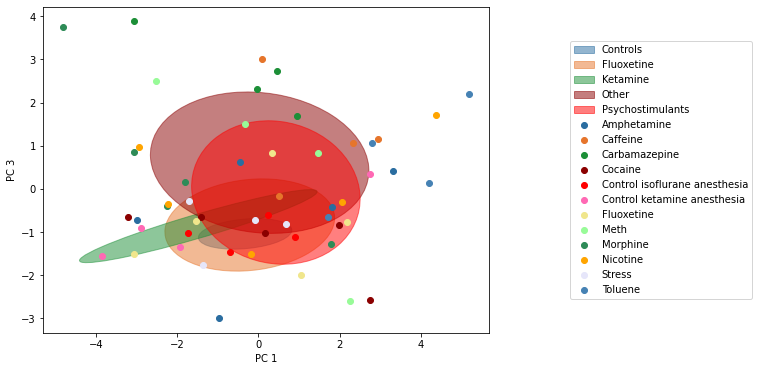

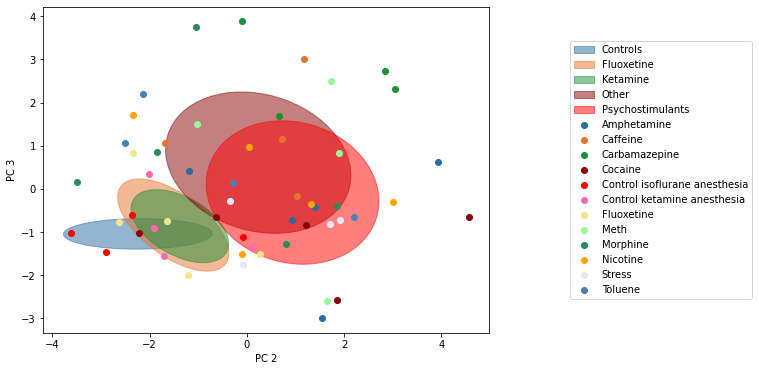

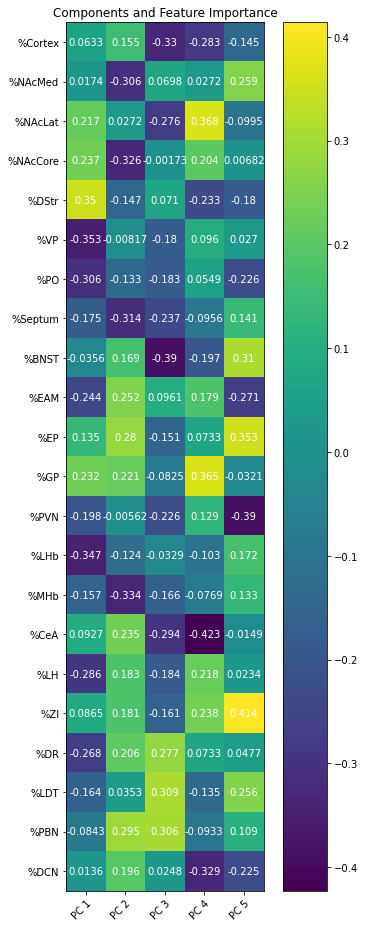

In [76]:
pc1=principalDf['principal component 1']
pc2=principalDf['principal component 2']
pc3=principalDf['principal component 3']
group = condition_nums 
make_pca_plots(pc1,pc2,pc3,group,labels,grouped_elipse='yes',figname1='figures/note0-in74-1.svg',figname2='figures/note0-in74-2.svg',figname3='figures/note0-in74-3.svg')
plot_components(region_components,figname4='figures/note0-in74-4.svg')

C:\Users\Kat\anaconda3\lib\site-packages\seaborn\matrix.py:619: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  linkage = hierarchy.linkage(self.array, method=self.method,


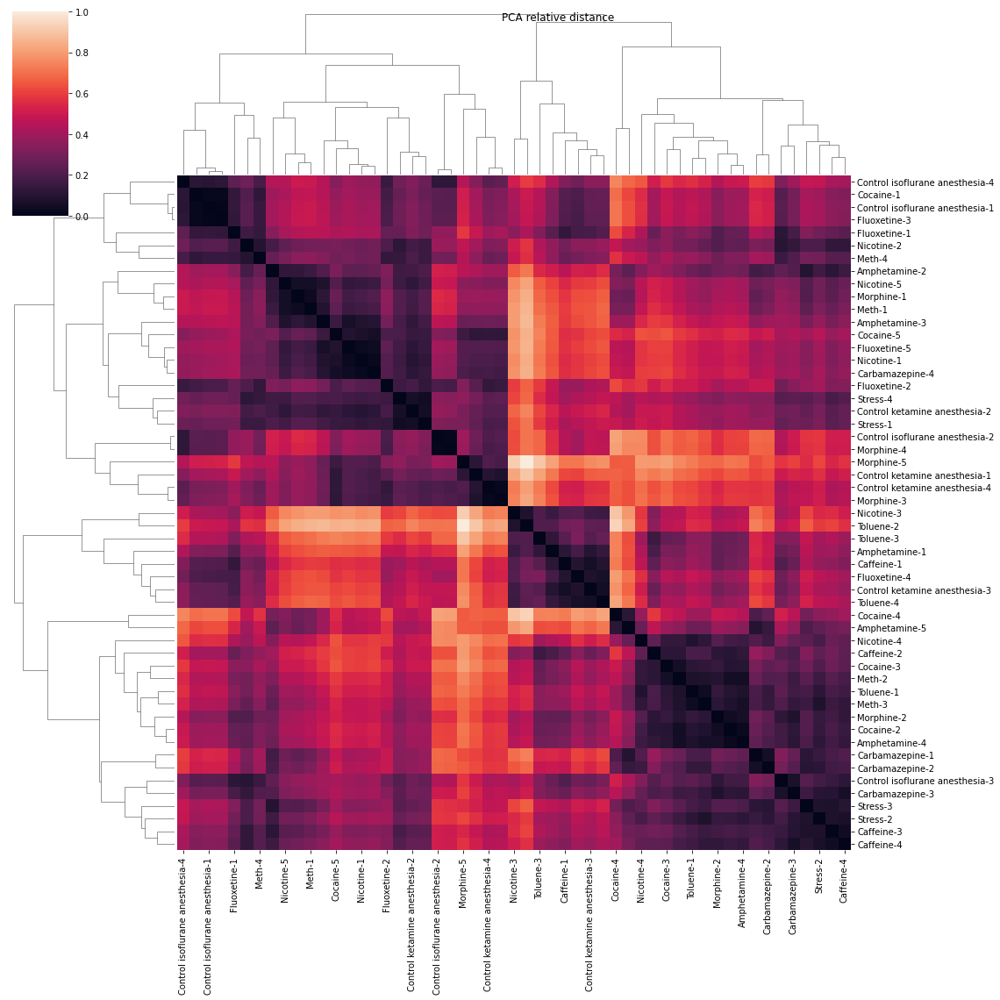

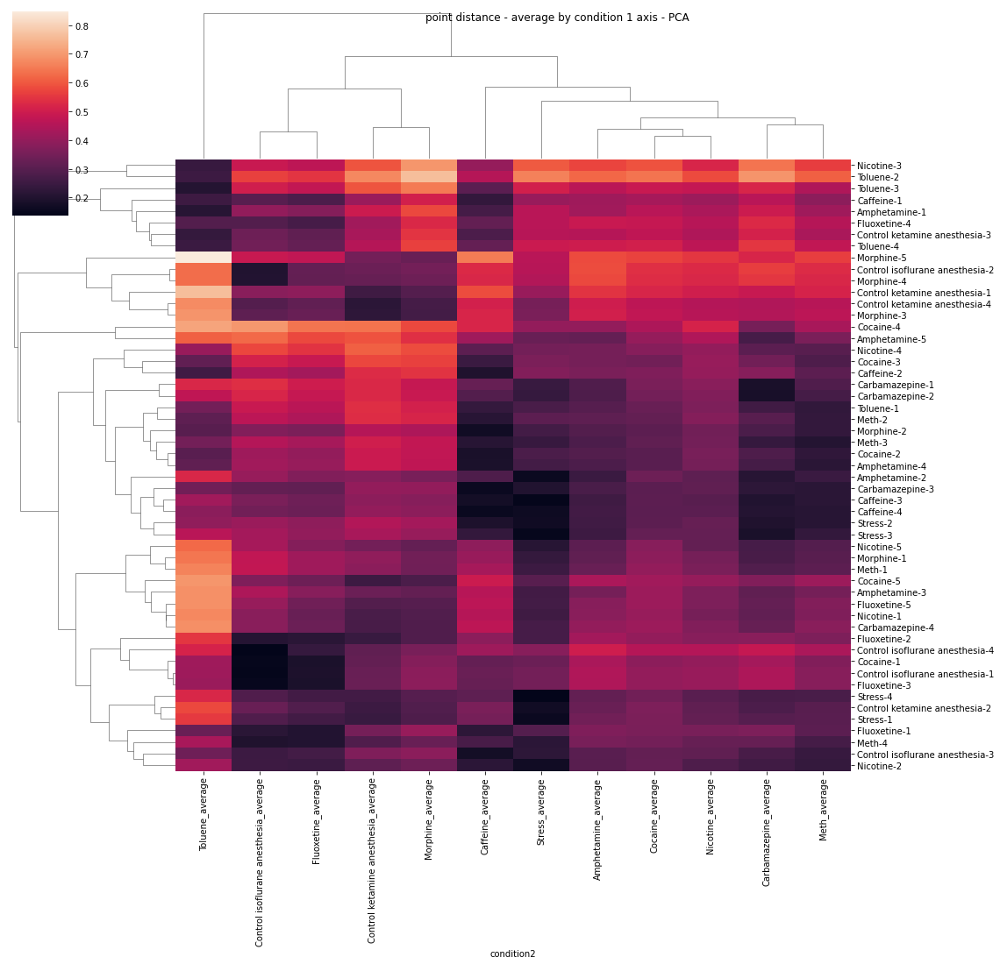

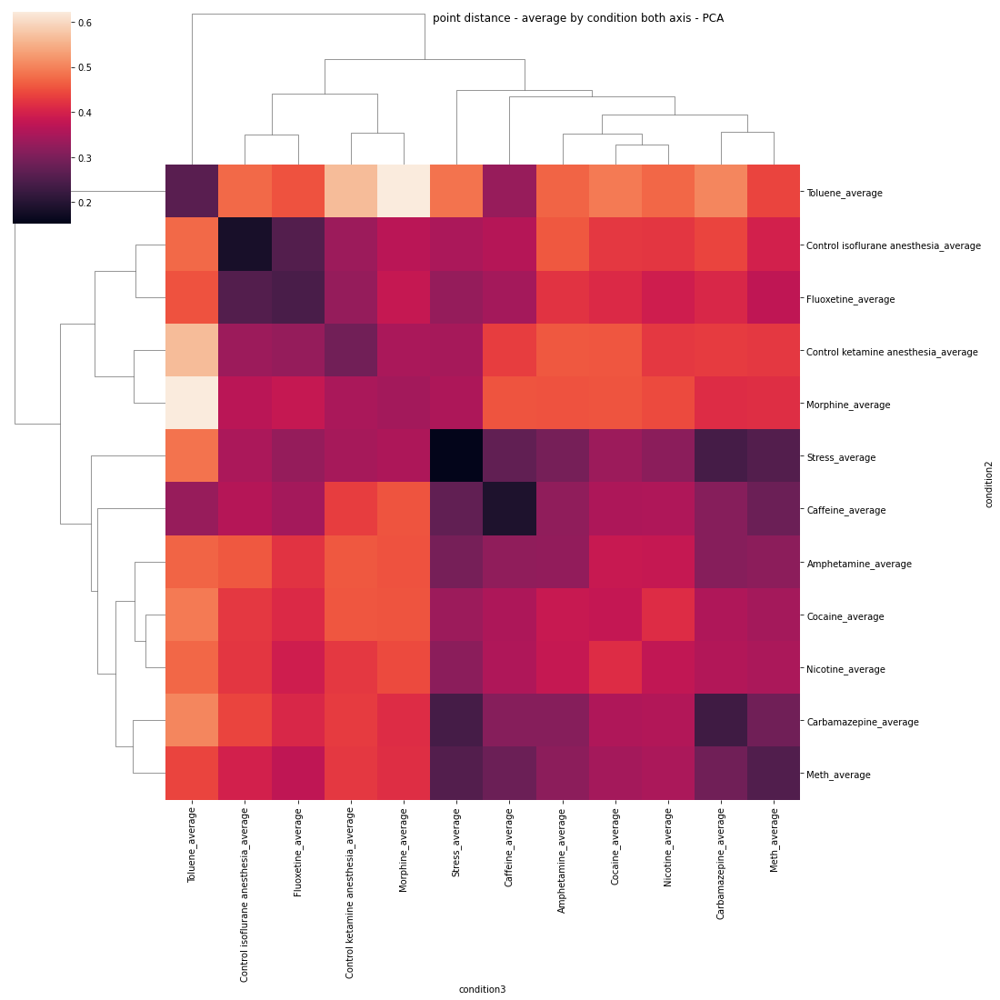

In [77]:
pca_dist=pca_distance(X_scaled,labels)
heatmapdf = pd.DataFrame(pca_dist,index=condition_nums,columns=condition_nums)
cm = sns.clustermap(heatmapdf,yticklabels=True)
cm.fig.suptitle("PCA relative distance")
cm.fig.set_size_inches(18, 18)
plt.show()
distance_to_other_points(pca_dist,labels,condition_nums,' - PCA') # pca 

## UMAP

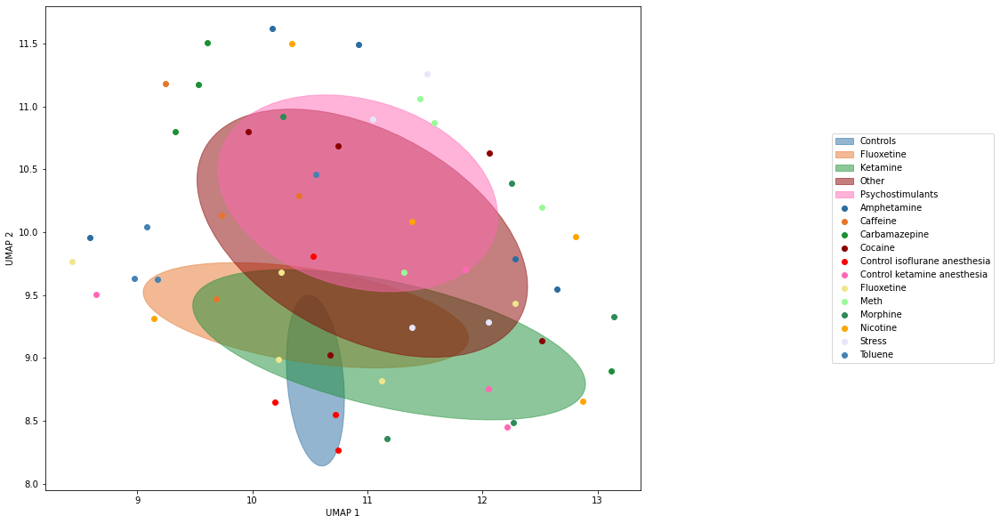

C:\Users\Kat\anaconda3\lib\site-packages\seaborn\matrix.py:619: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  linkage = hierarchy.linkage(self.array, method=self.method,


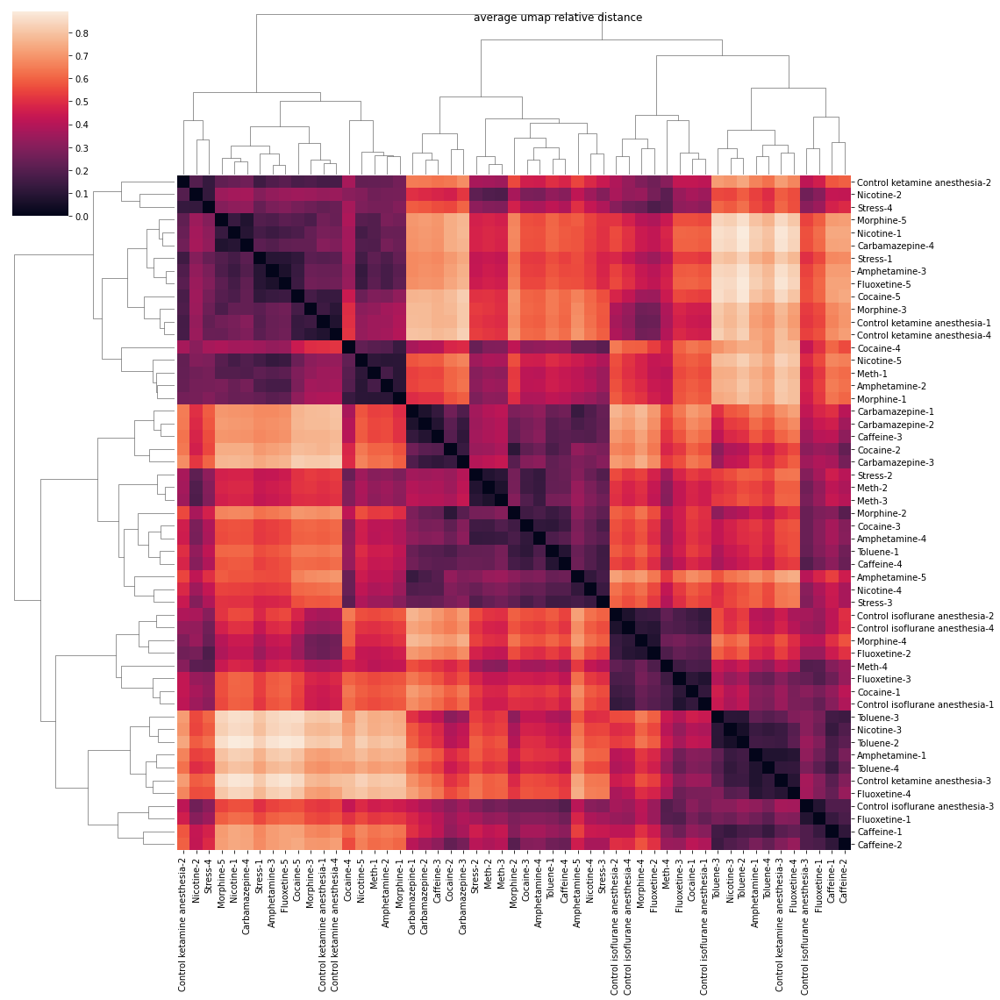

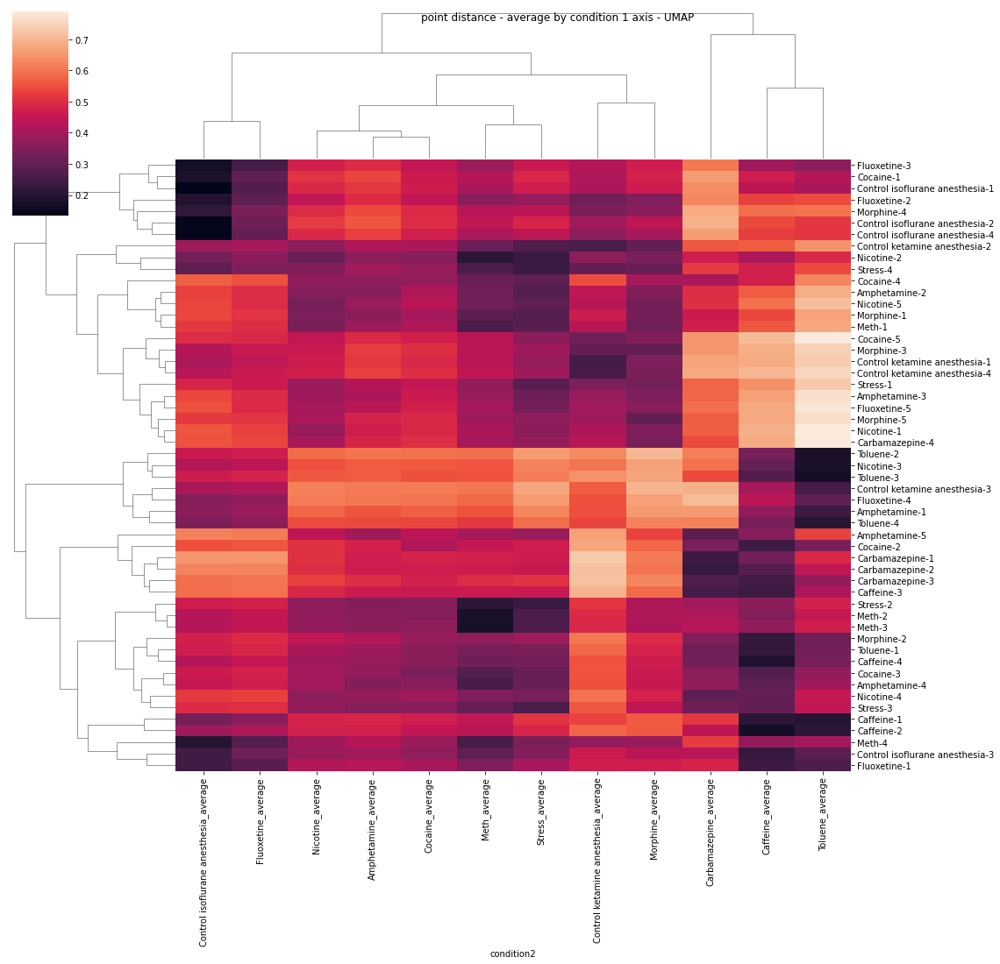

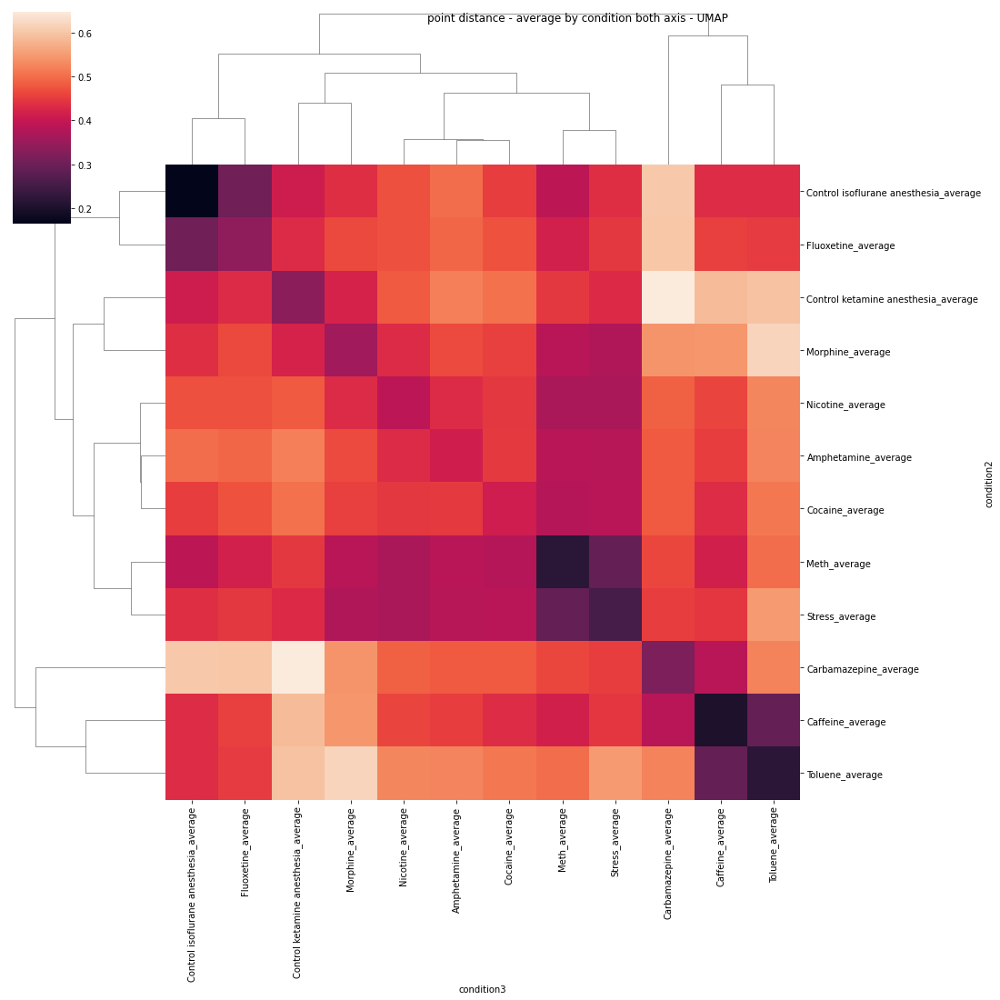

In [78]:
umap_and_heatmap(X_scaled,labels,condition_nums,grouped_elipse='yes',figname1='figures/note0-in76-1.svg',figname2='figures/note0-in76-2.svg',figname3='figures/note0-in76-3.svg',figname4='figures/note0-in76-4.svg')

# NAcMed (below)

In [79]:
features, labels, condition_nums, regions = get_feats_and_labels(NAcMed_data) 

In [80]:
#scale X 
X=features.to_numpy()
#get rid of NAs before scaling
X_scaled=zscore(X,axis=0)

In [81]:
#can change n_components to more if you want to visualize in 3D 
pca = PCA(n_components=5)
#PCA using the scaled drug data array made earlier
principalComponents = pca.fit_transform(X_scaled)
#make into dataframe if you want to view with labels
principalDf = pd.DataFrame(data = principalComponents
             , columns = ['principal component 1', 'principal component 2', 'principal component 3', 'principal component 4', 'principal component 5'])
region_components=pd.DataFrame(data = pca.components_ , columns = regions)
#view df
print('Explained variance for each PC: 1, 2, 3')
print(pca.explained_variance_)
principalDf

Explained variance for each PC: 1, 2, 3
[4.8013376  3.62665893 3.06941674 2.39241251 2.05115726]


,principal component 1,principal component 2,principal component 3,principal component 4,principal component 5
0,-1.902347,-2.295239,1.134535,-0.561737,1.394657
1,-0.069473,-2.402158,1.574719,0.032168,-0.717791
2,-0.551429,-0.598334,-0.624622,0.235495,1.032534
3,-1.877316,-1.175839,0.137028,1.635923,0.305545
4,-2.561933,1.217357,-2.758634,1.165275,-2.301371
5,0.620388,-2.333530,-0.195936,3.383612,-1.690514
6,-3.349430,2.050064,0.965704,-1.253186,0.784408
7,1.171534,-0.522466,-1.188883,-0.982282,1.840788
8,1.132260,0.816627,2.379785,-0.774475,-0.983311
9,5.035908,2.029460,-1.935593,-0.285131,-0.086618


### PCA plots

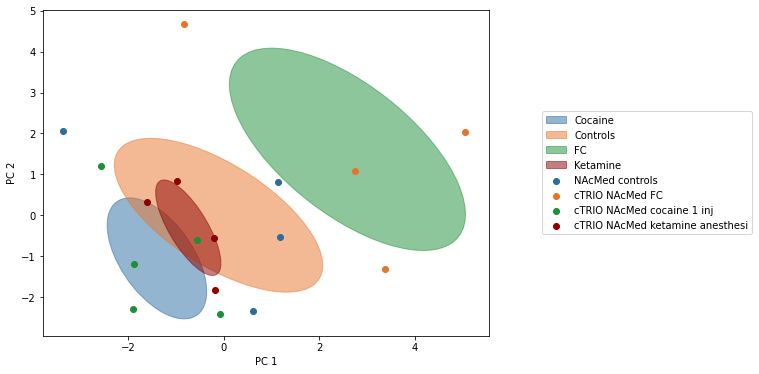

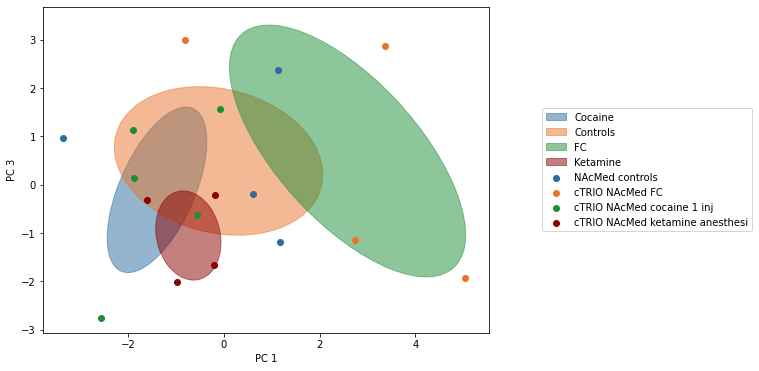

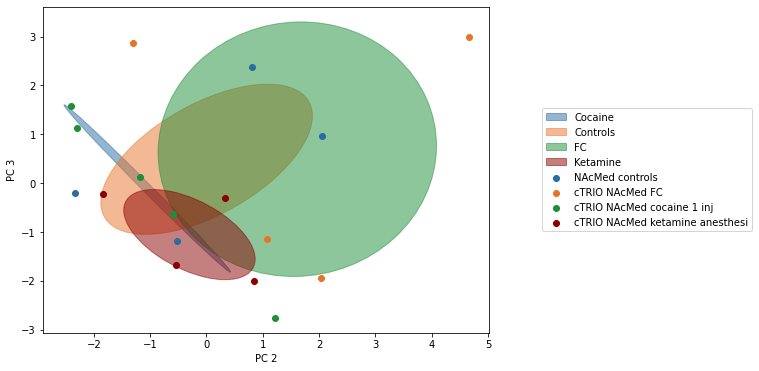

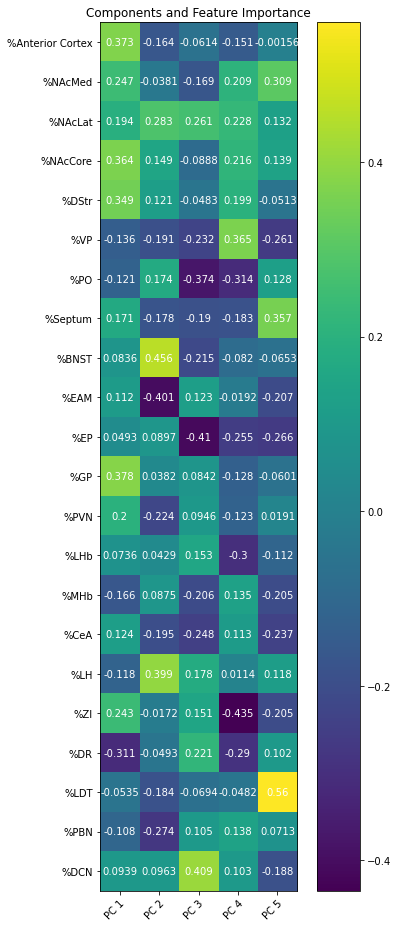

In [82]:
pc1=principalDf['principal component 1'] #make pc1 and 2 into numpy arrays
pc2=principalDf['principal component 2']
pc3=principalDf['principal component 3']
group = condition_nums 
make_pca_plots(pc1,pc2,pc3,group,labels,grouped_elipse='yes',figname1='figures/note0-in80-1.svg',figname2='figures/note0-in80-2.svg',figname3='figures/note0-in80-3.svg')
plot_components(region_components,figname4='figures/note0-in80-4.svg')

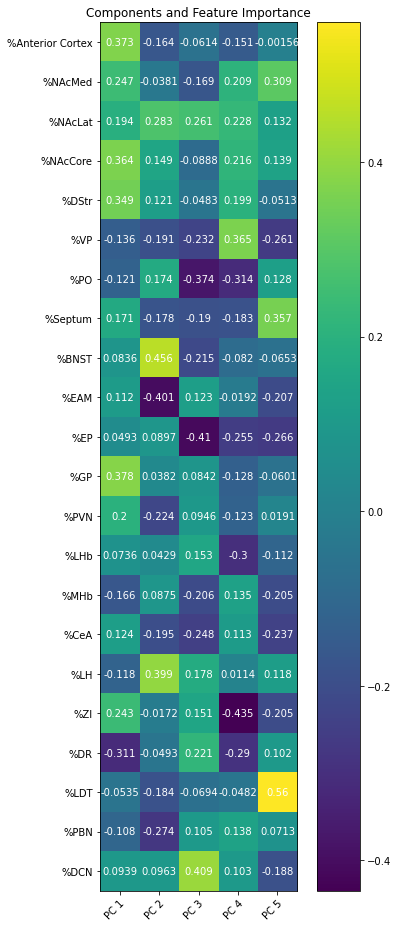

In [83]:
plot_components(region_components,figname4='figures/fig4nacmedb_note0in81.svg')

C:\Users\Kat\anaconda3\lib\site-packages\seaborn\matrix.py:619: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  linkage = hierarchy.linkage(self.array, method=self.method,


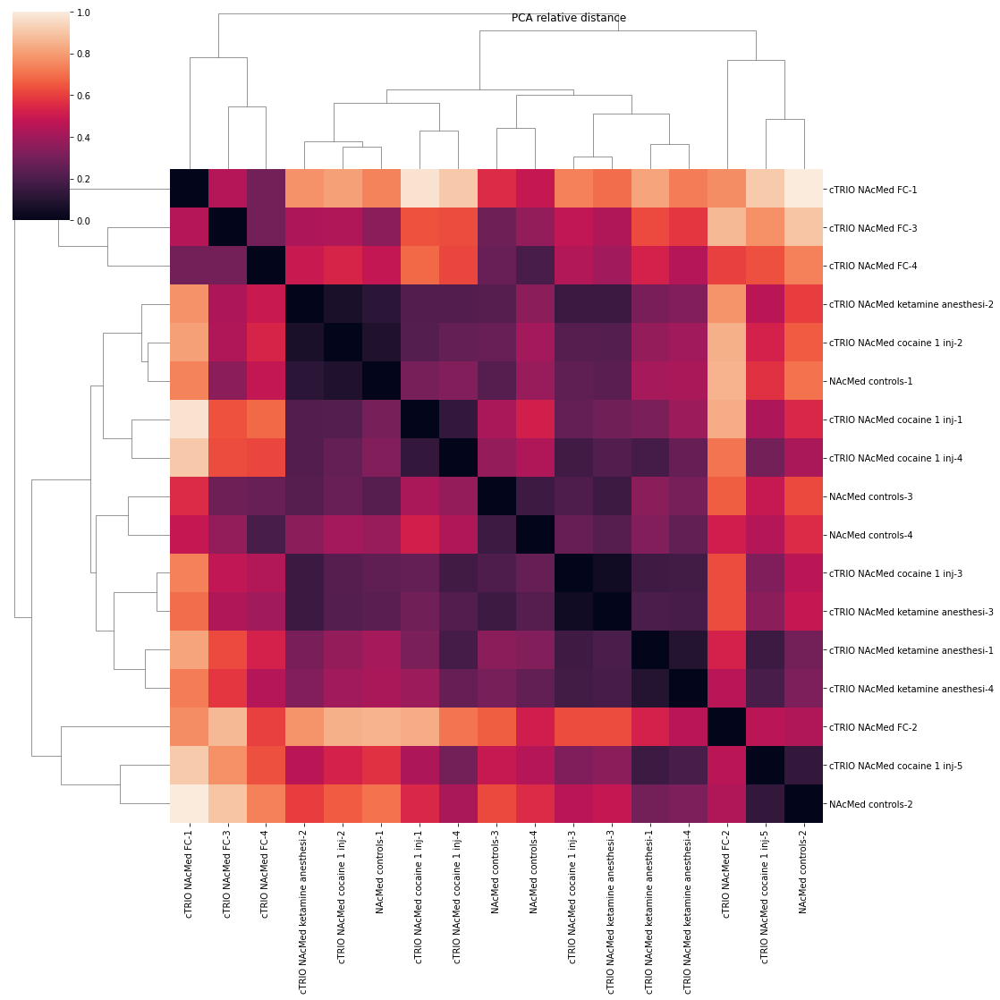

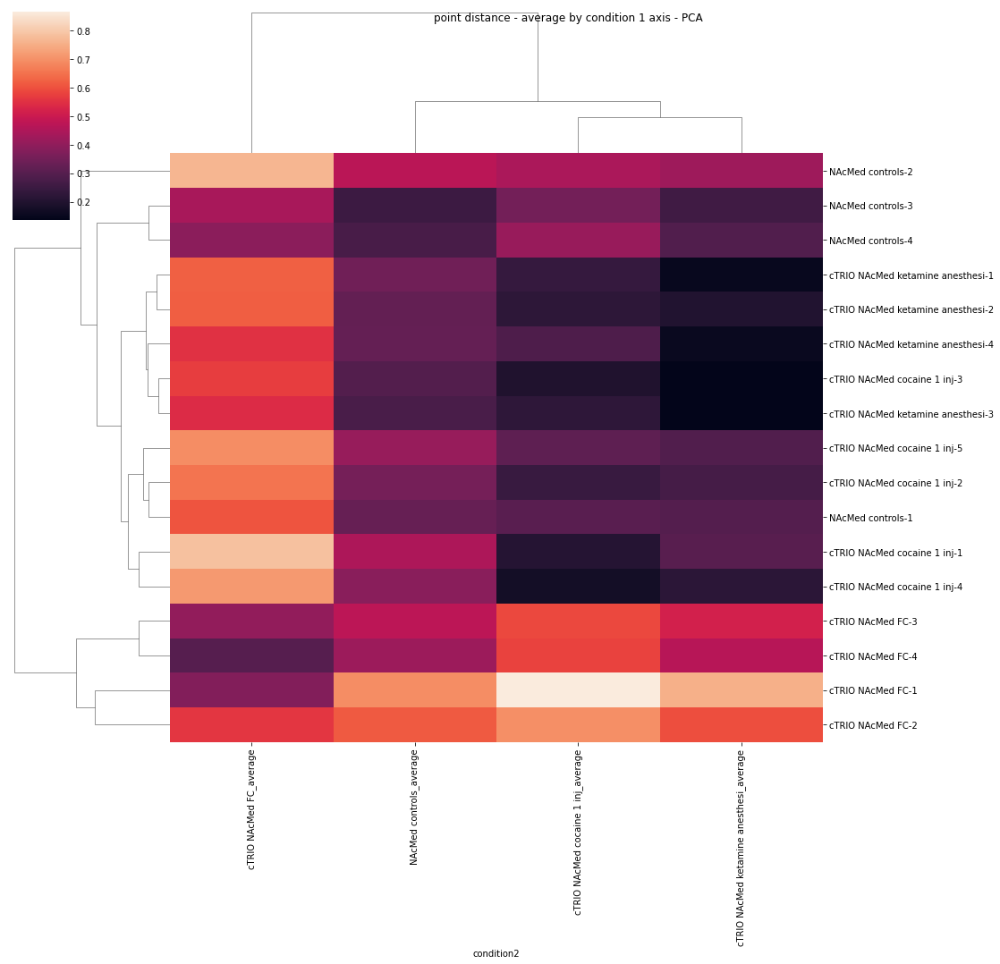

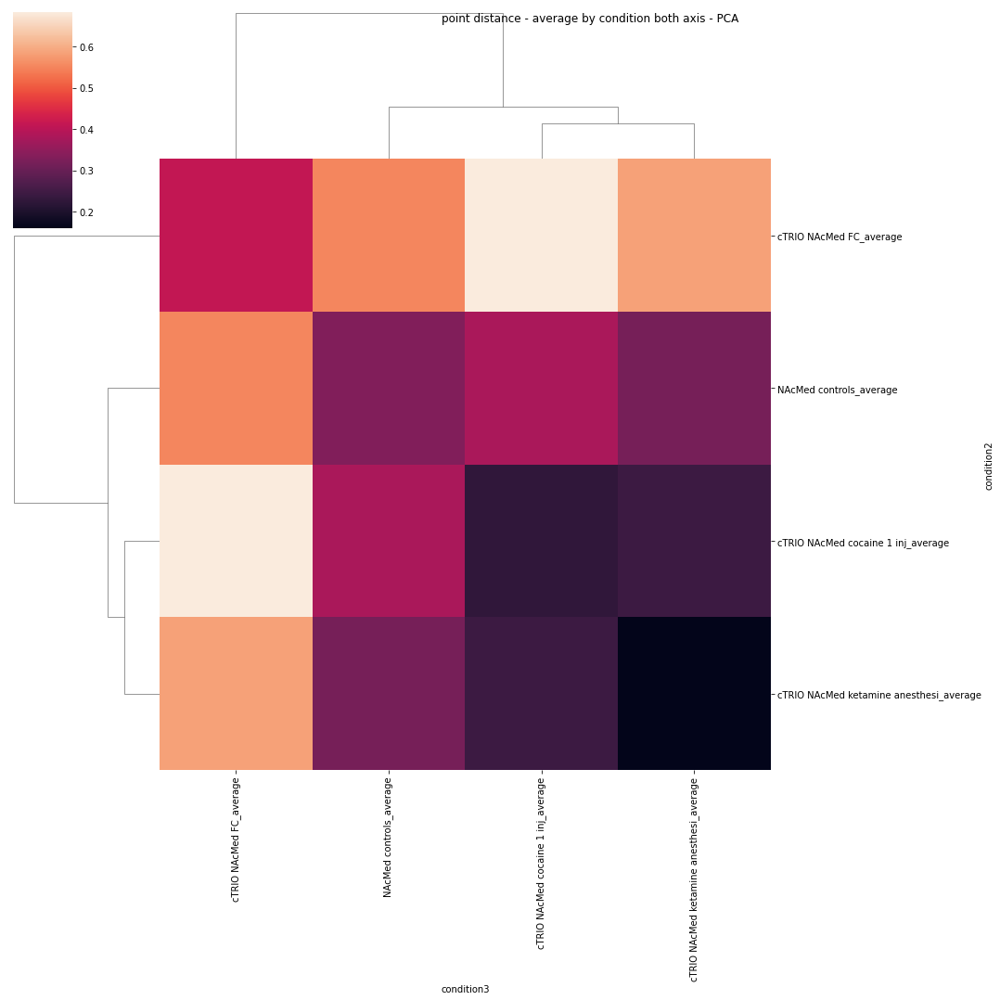

In [84]:
pca_dist=pca_distance(X_scaled,labels)
heatmapdf = pd.DataFrame(pca_dist,index=condition_nums,columns=condition_nums)
cm = sns.clustermap(heatmapdf,yticklabels=True)
cm.fig.suptitle("PCA relative distance")
cm.fig.set_size_inches(18, 18)
plt.show()
distance_to_other_points(pca_dist,labels,condition_nums,' - PCA') # pca 

### UMAP

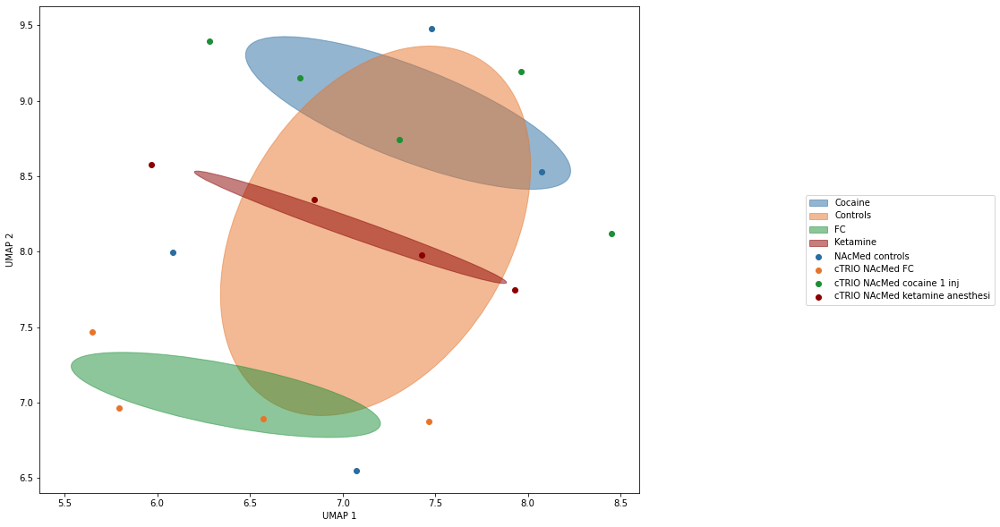

C:\Users\Kat\anaconda3\lib\site-packages\seaborn\matrix.py:619: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  linkage = hierarchy.linkage(self.array, method=self.method,


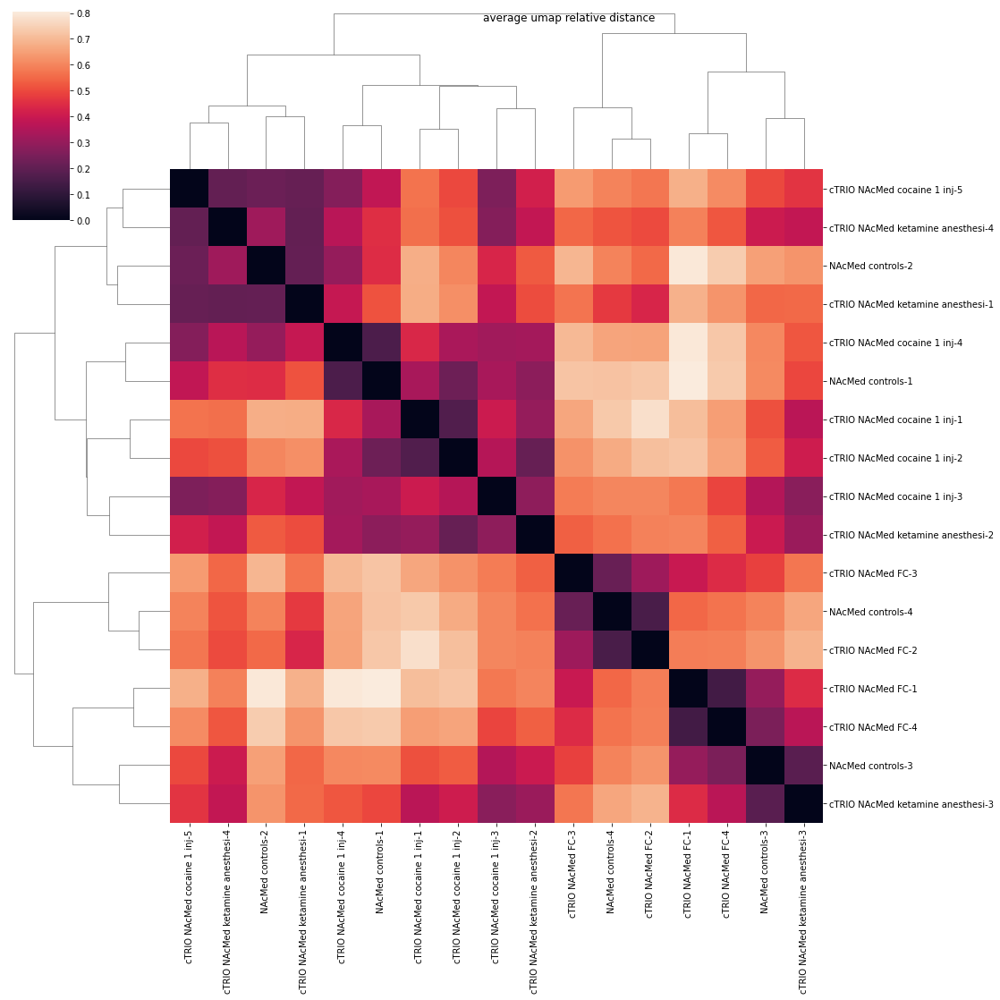

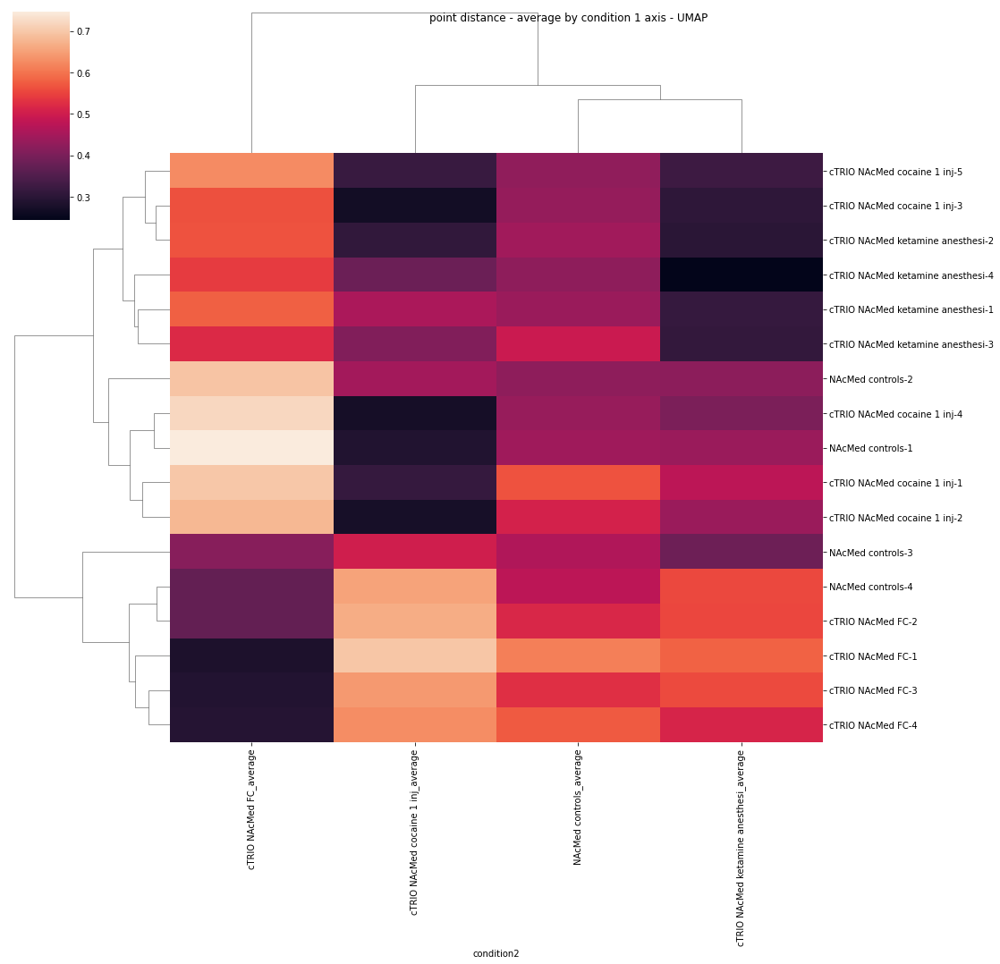

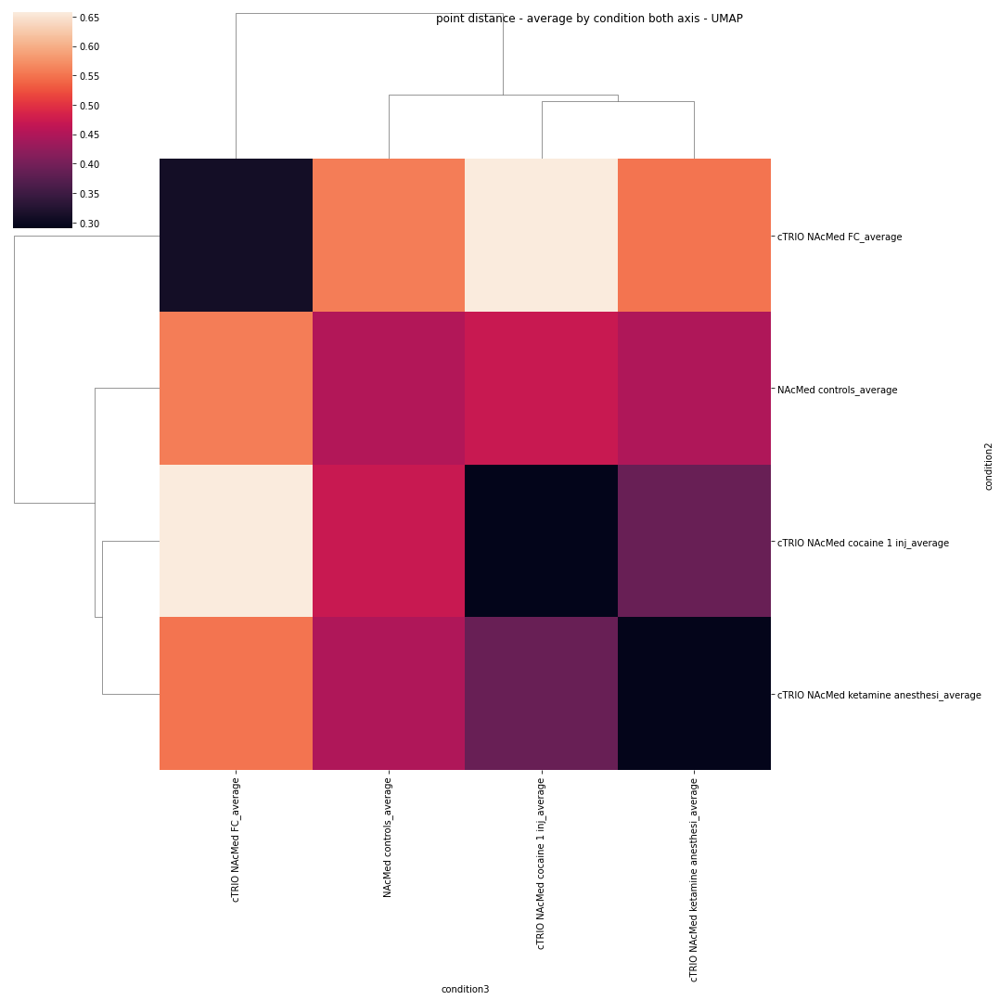

In [85]:
umap_and_heatmap(X_scaled,labels,condition_nums,grouped_elipse='yes',figname1='figures/fig4nacmedc_note0in83.svg',figname4='figures/fig4nacmedd_note0in83.svg')

# NAcMed - no ketamine. Just coc v sal

Explained variance for each PC: 1, 2, 3
[7.11962648 4.36062346 3.97780026 3.04952401 2.43604389]


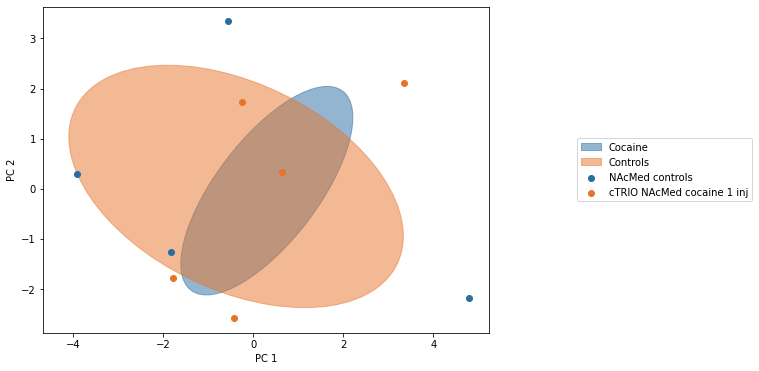

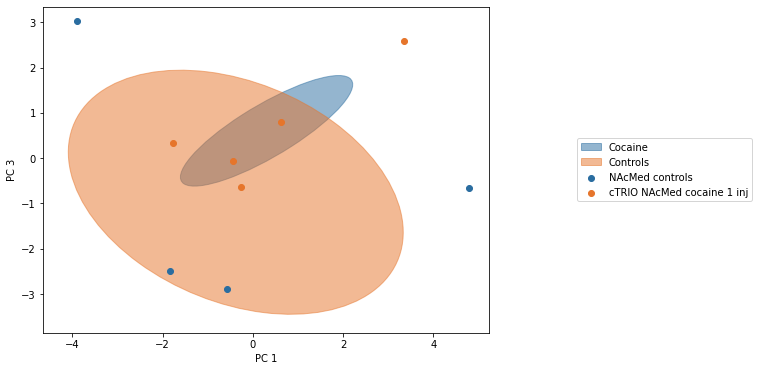

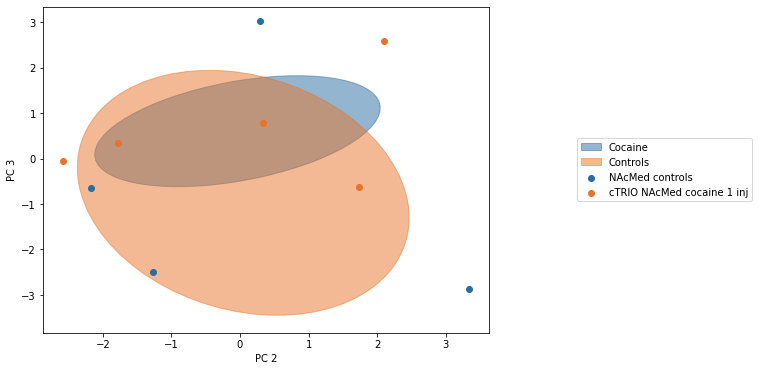

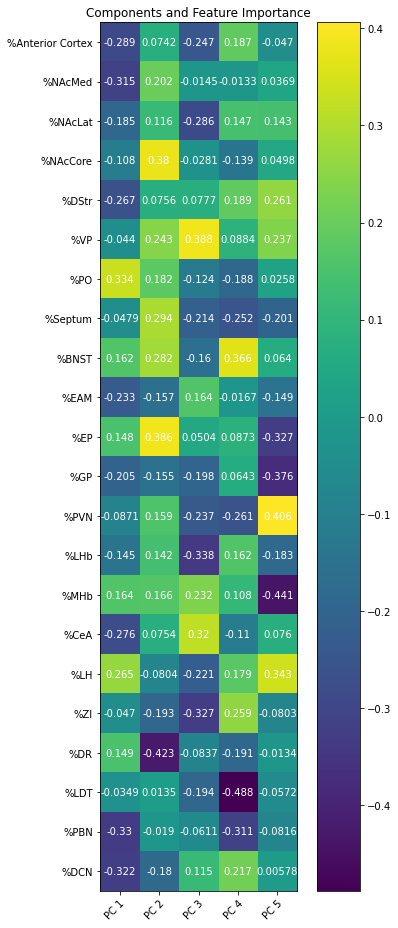

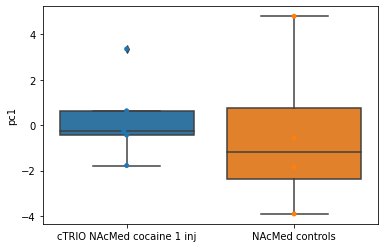

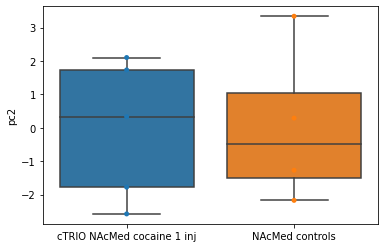

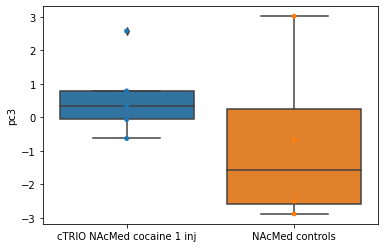

In [86]:
NAcMed_data2=NAcMed_data[(NAcMed_data["condition"] == 'NAcMed controls') |
                (NAcMed_data["condition"] == 'cTRIO NAcMed cocaine 1 inj')]
features, labels, condition_nums, regions= get_feats_and_labels(NAcMed_data2) 
X=features.to_numpy()
#get rid of NAs before scaling
X_scaled=zscore(X,axis=0)

#can change n_components to more if you want to visualize in 3D 
pca = PCA(n_components=5)
#PCA using the scaled drug data array made earlier
principalComponents = pca.fit_transform(X_scaled)
#make into dataframe if you want to view with labels
principalDf = pd.DataFrame(data = principalComponents
             , columns = ['principal component 1', 'principal component 2', 'principal component 3', 'principal component 4', 'principal component 5'])
region_components=pd.DataFrame(data = pca.components_ , columns = regions)
#view df
print('Explained variance for each PC: 1, 2, 3')
print(pca.explained_variance_)

pc1=principalDf['principal component 1']
pc2=principalDf['principal component 2']
pc3=principalDf['principal component 3']
group = condition_nums 
make_pca_plots(pc1,pc2,pc3,group,labels,grouped_elipse='yes',figname1='figures/cocaine-v-saline/NAcMed-J-pc1.svg',figname2='figures/temp.svg',figname3='figures/temp.svg')
plot_components(region_components,figname4='figures/cocaine-v-saline/NAcMed-J-comps.svg')
align_embed= pd.DataFrame({'pc1': pc1.values,'pc2': pc2.values,'pc3': pc3.values},index=labels)
value=align_embed['pc1']
treatments=align_embed.index
ax = sns.boxplot(x=treatments, y=value)
ax = sns.swarmplot(x=treatments, y=value) #4d-NAcLat  4g-Amyg   4j-NAcMed   4m-mPFC
plt.savefig('figures/temp.svg')
plt.show()
value=align_embed['pc2']
ax = sns.boxplot(x=treatments, y=value)
ax = sns.swarmplot(x=treatments, y=value)
plt.savefig('figures/temp.svg')
plt.show()
value=align_embed['pc3']
ax = sns.boxplot(x=treatments, y=value)
ax = sns.swarmplot(x=treatments, y=value)
plt.savefig('figures/temp.svg')
plt.show()
 


# NAcMed 
# No FC condition (below)

In [87]:
NAcMed_data2=NAcMed_data[(NAcMed_data["condition"] == 'NAcMed controls') |
                (NAcMed_data["condition"] == 'cTRIO NAcMed cocaine 1 inj')|  
                (NAcMed_data["condition"] == 'cTRIO NAcMed ketamine anesthesi')]
features, labels, condition_nums, regions= get_feats_and_labels(NAcMed_data2)

NAcMed_data2=NAcMed_data[(NAcMed_data["condition"] == 'NAcMed controls') |
                (NAcMed_data["condition"] == 'cTRIO NAcMed cocaine 1 inj')]
features_nacmed, labels_nacmed, condition_nums_nacmed, regions_nacmed= get_feats_and_labels(NAcMed_data2)
print(condition_nums_nacmed)
print(len(condition_nums_nacmed))

['cTRIO NAcMed cocaine 1 inj-1' 'cTRIO NAcMed cocaine 1 inj-2'
 'cTRIO NAcMed cocaine 1 inj-3' 'cTRIO NAcMed cocaine 1 inj-4'
 'cTRIO NAcMed cocaine 1 inj-5' 'NAcMed controls-1' 'NAcMed controls-2'
 'NAcMed controls-3' 'NAcMed controls-4']
9


In [88]:
#scale X 
X=features.to_numpy()
#get rid of NAs before scaling
X_scaled=zscore(X,axis=0)

#can change n_components to more if you want to visualize in 3D 
pca = PCA(n_components=5)
#PCA using the scaled drug data array made earlier
principalComponents = pca.fit_transform(X_scaled)
#make into dataframe if you want to view with labels
principalDf = pd.DataFrame(data = principalComponents
             , columns = ['principal component 1', 'principal component 2', 'principal component 3', 'principal component 4', 'principal component 5'])
region_components=pd.DataFrame(data = pca.components_ , columns = regions)
#view df
print('Explained variance for each PC: 1, 2, 3')
print(pca.explained_variance_)
principalDf

Explained variance for each PC: 1, 2, 3
[5.16710407 3.26946149 3.00023156 2.90105308 2.43671284]


,principal component 1,principal component 2,principal component 3,principal component 4,principal component 5
0,-0.287560,0.630339,1.919279,-0.996485,3.465689
1,-1.849383,0.401864,1.466047,-1.496078,0.748660
2,-0.373693,-0.517366,-0.450684,1.794265,-0.104270
3,-0.099907,-2.689753,1.553147,0.863500,-0.963074
4,2.804842,-2.874264,-2.194752,-0.986978,-0.486428
5,-4.139885,-2.324356,-0.661698,-2.475402,-0.756705
6,4.271096,-0.139469,3.208116,-0.306298,-0.684181
7,-1.566327,0.414679,-0.149078,3.561922,-1.057380
8,-1.885971,3.318608,0.756783,-0.740986,-2.470674
9,1.429972,0.534597,0.059340,0.436441,-0.760068


### PCA Plots

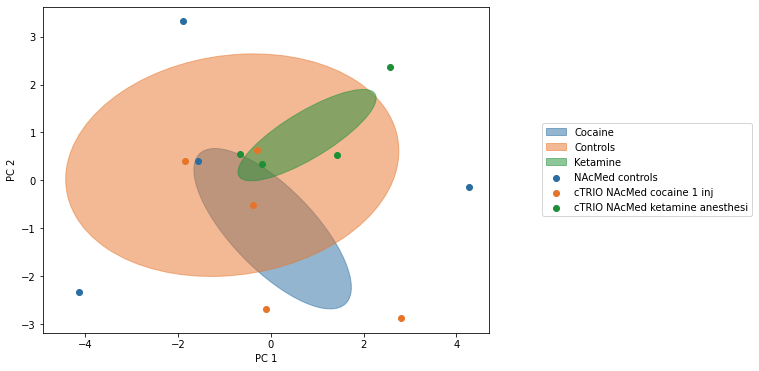

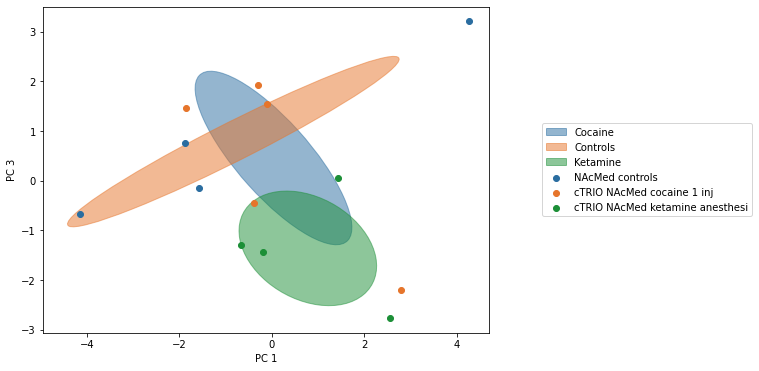

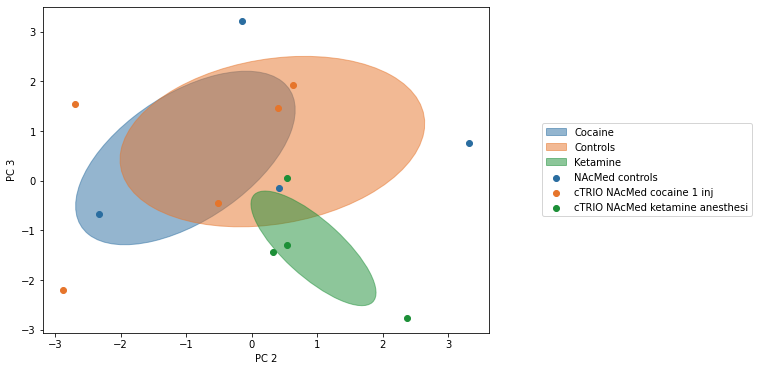

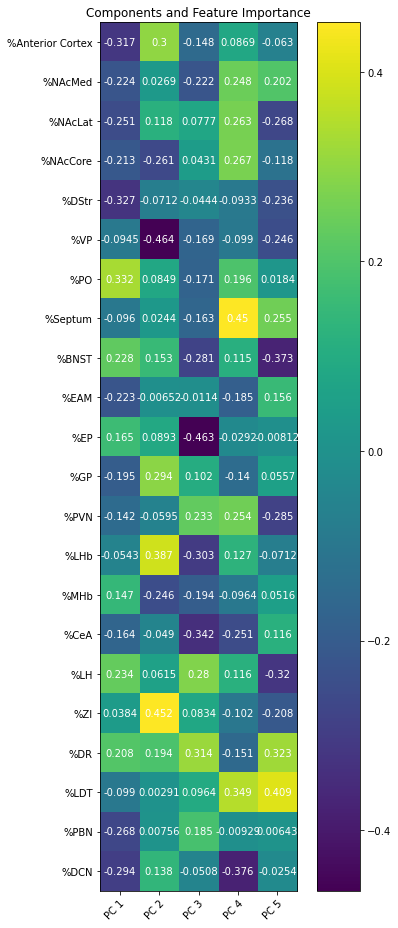

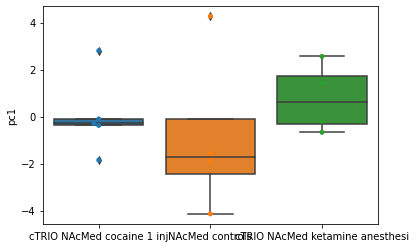

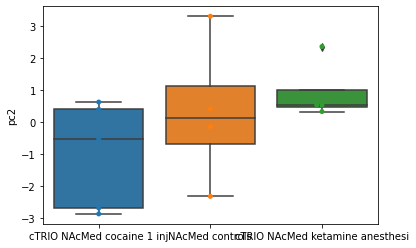

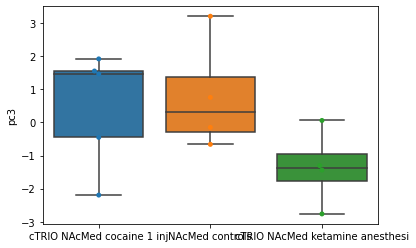

C:\Users\Kat\anaconda3\lib\site-packages\bioinfokit\analys.py:421: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  mult_group[ele] = df[df[xfac_var] == ele].mean().loc[res_var]


In [89]:
pc1=principalDf['principal component 1']
pc2=principalDf['principal component 2']
pc3=principalDf['principal component 3']
group = condition_nums 
make_pca_plots(pc1,pc2,pc3,group,labels,grouped_elipse='yes',figname1='figures/PCA-stats/PC2-3_figure4/NAcMed1.svg',figname2='figures/PCA-stats/PC2-3_figure4/NAcMed2.svg',figname3='figures/PCA-stats/PC2-3_figure4/NAcMed3.svg')
plot_components(region_components,figname4='figures/note0-in86-4.svg')
align_embed= pd.DataFrame({'pc1': pc1.values,'pc2': pc2.values,'pc3': pc3.values},index=labels)
value=align_embed['pc1']
treatments=align_embed.index
ax = sns.boxplot(x=treatments, y=value)
ax = sns.swarmplot(x=treatments, y=value) #4d-NAcLat  4g-Amyg   4j-NAcMed   4m-mPFC
plt.savefig('figures/PCA-stats/figure 4/4j-NAcMed-PC1-boxplot.svg')
plt.show()
value=align_embed['pc2']
ax = sns.boxplot(x=treatments, y=value)
ax = sns.swarmplot(x=treatments, y=value)
plt.savefig('figures/PCA-stats/figure 4/4j-NAcMed-PC2-boxplot.svg')
plt.show()
value=align_embed['pc3']
ax = sns.boxplot(x=treatments, y=value)
ax = sns.swarmplot(x=treatments, y=value)
plt.savefig('figures/PCA-stats/figure 4/4j-NAcMed-PC3-boxplot.svg')
plt.show()

df_melt= pd.DataFrame({'value':align_embed['pc1'],'treatments': align_embed.index})
#!pip install bioinfokit
from bioinfokit.analys import stat
res = stat()
res.tukey_hsd(df=df_melt, res_var='value', xfac_var='treatments', anova_model='value ~ C(treatments)')
res.tukey_summary.to_csv('figures/PCA-stats/figure 4/4j-NAcMed-PC1-stat.csv')

df_melt= pd.DataFrame({'value':align_embed['pc2'],'treatments': align_embed.index})
#!pip install bioinfokit 
res = stat()
res.tukey_hsd(df=df_melt, res_var='value', xfac_var='treatments', anova_model='value ~ C(treatments)')
res.tukey_summary.to_csv('figures/PCA-stats/figure 4/4j-NAcMed-PC2-stat.csv')

df_melt= pd.DataFrame({'value':align_embed['pc3'],'treatments': align_embed.index})
#!pip install bioinfokit 
res = stat()
res.tukey_hsd(df=df_melt, res_var='value', xfac_var='treatments', anova_model='value ~ C(treatments)')
res.tukey_summary.to_csv('figures/PCA-stats/figure 4/4j-NAcMed-PC3-stat.csv')


df_melt= pd.DataFrame({'pc1':align_embed['pc1'],'pc2':align_embed['pc2'],'pc3':align_embed['pc3'],'treatments': treatments})
df_melt.to_csv('figures/PCA-stats/PC-values-for-Kevin/Figure_4J_PC1-3.csv')

C:\Users\Kat\anaconda3\lib\site-packages\seaborn\matrix.py:619: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  linkage = hierarchy.linkage(self.array, method=self.method,


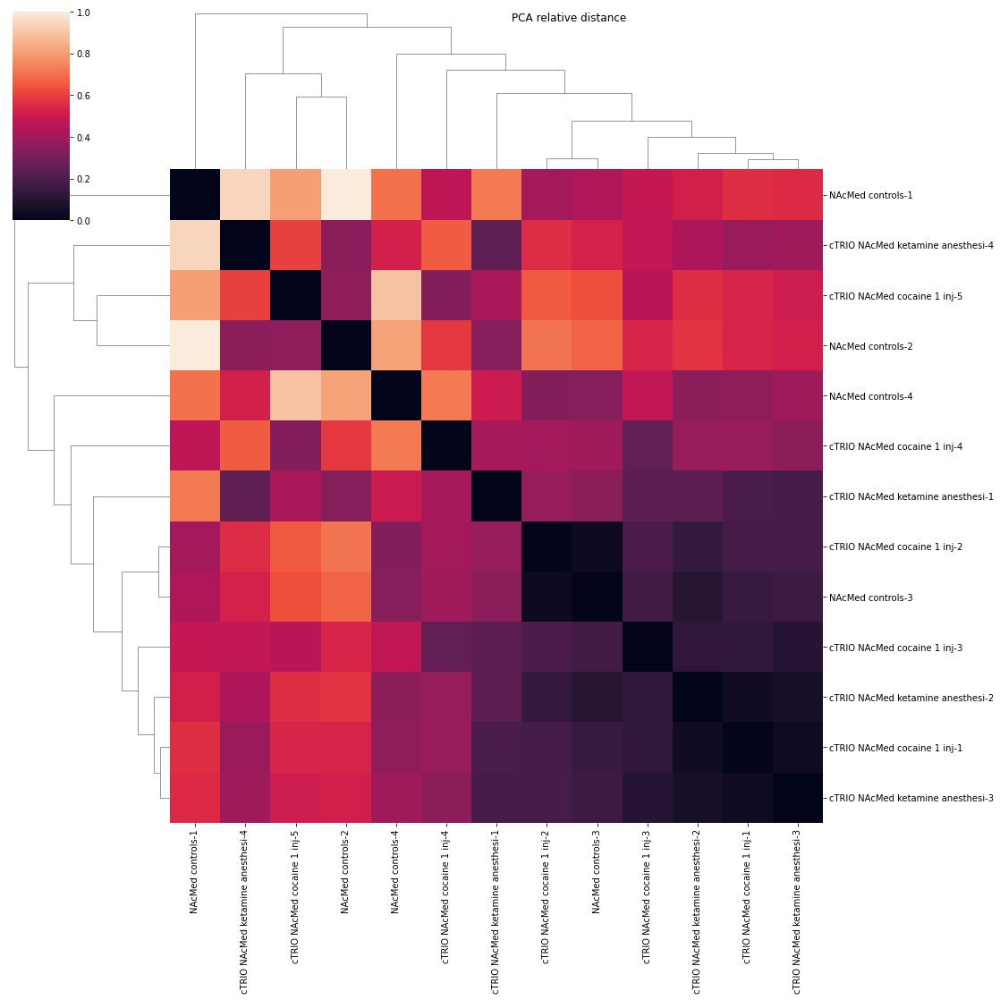

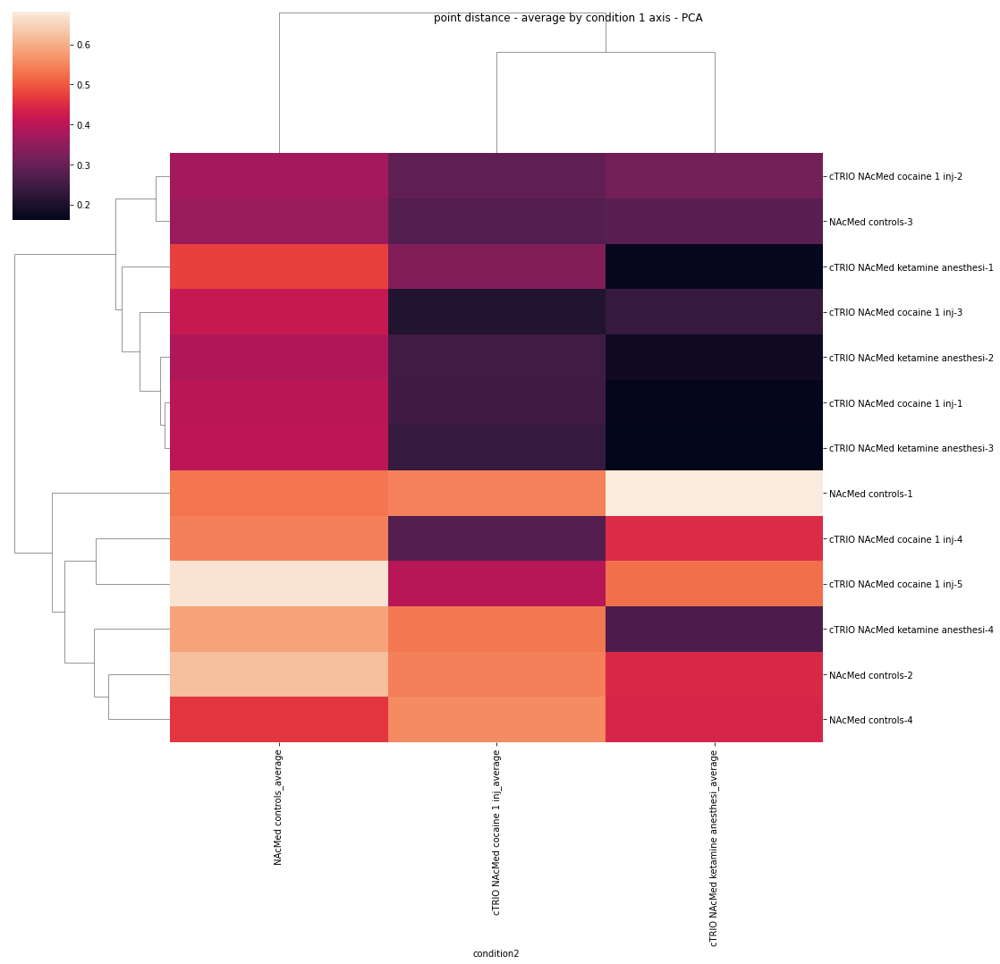

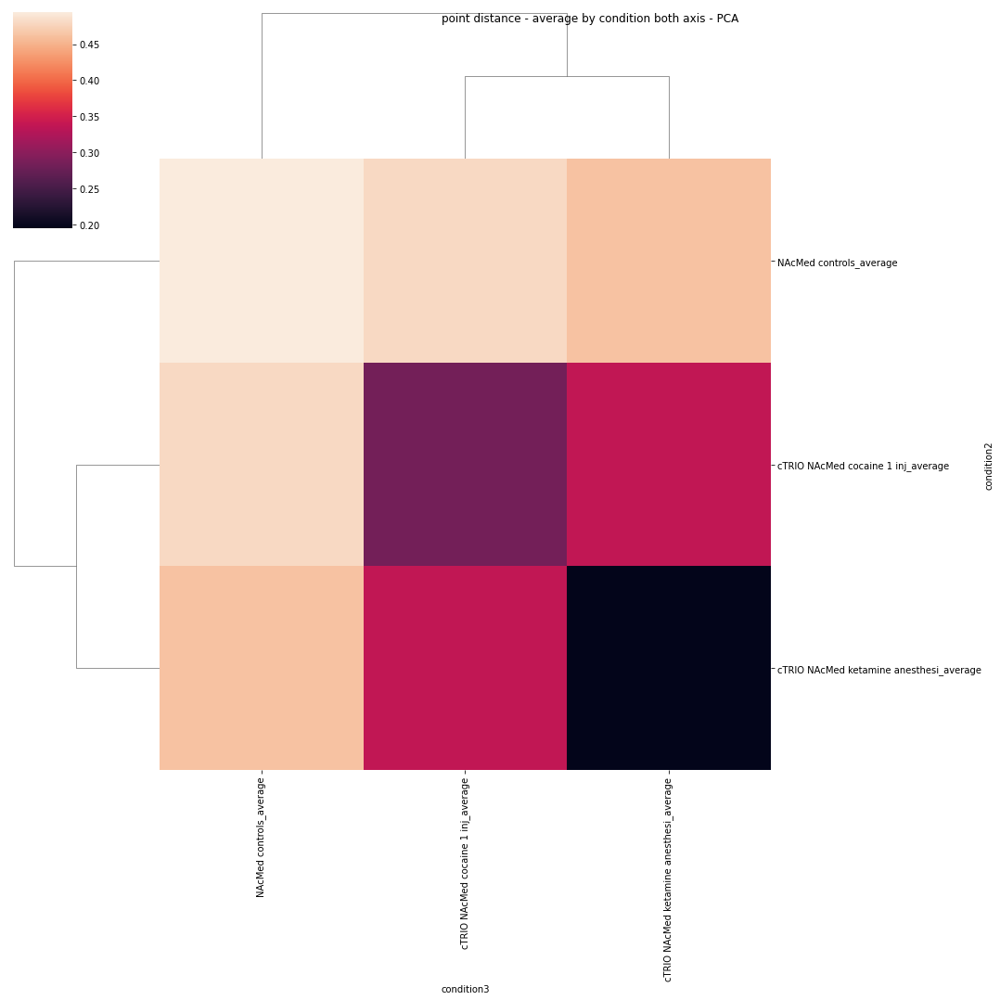

In [90]:
pca_dist=pca_distance(X_scaled,labels)
heatmapdf = pd.DataFrame(pca_dist,index=condition_nums,columns=condition_nums)
cm = sns.clustermap(heatmapdf,yticklabels=True)
cm.fig.suptitle("PCA relative distance")
cm.fig.set_size_inches(18, 18)
plt.show()
distance_to_other_points(pca_dist,labels,condition_nums,' - PCA') # pca 

### UMAP

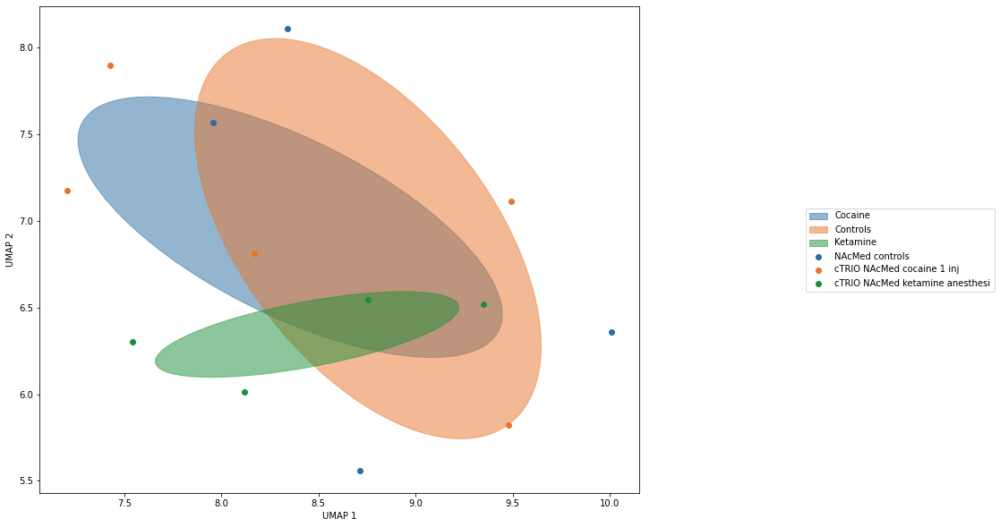

C:\Users\Kat\anaconda3\lib\site-packages\seaborn\matrix.py:619: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  linkage = hierarchy.linkage(self.array, method=self.method,


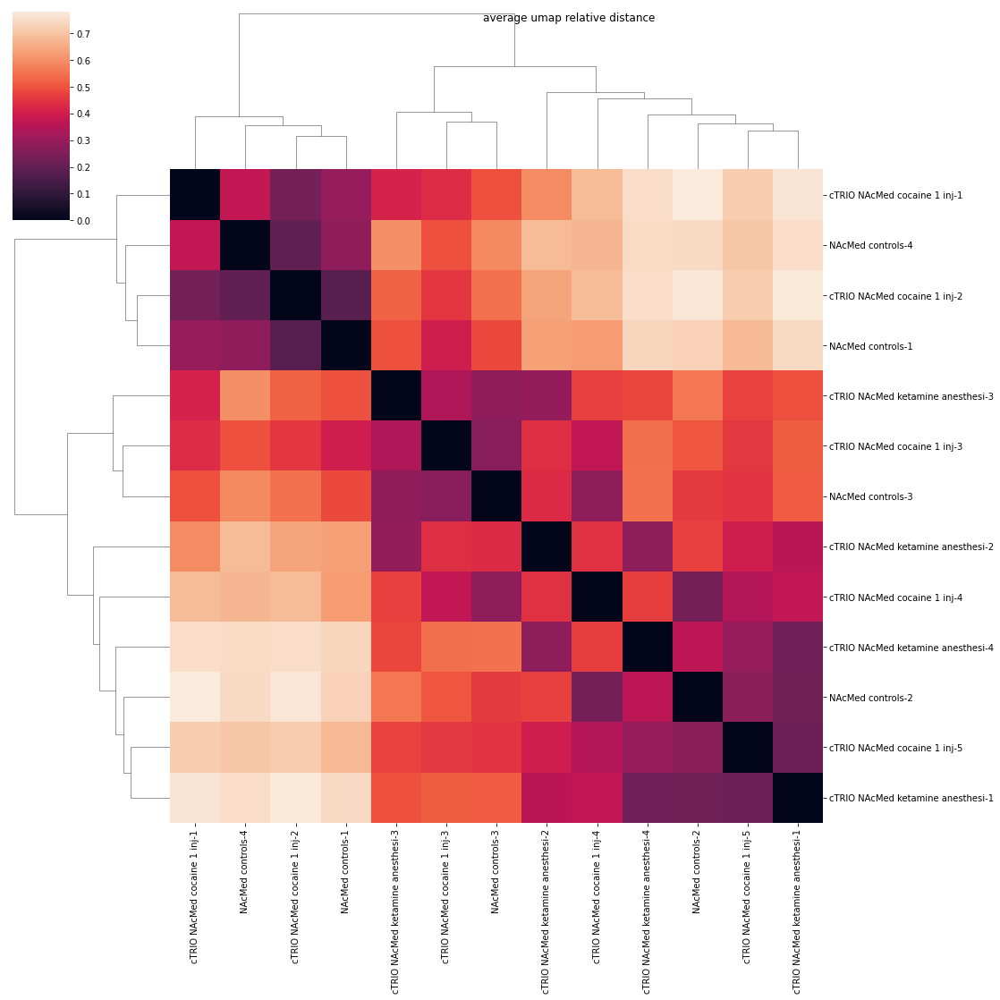

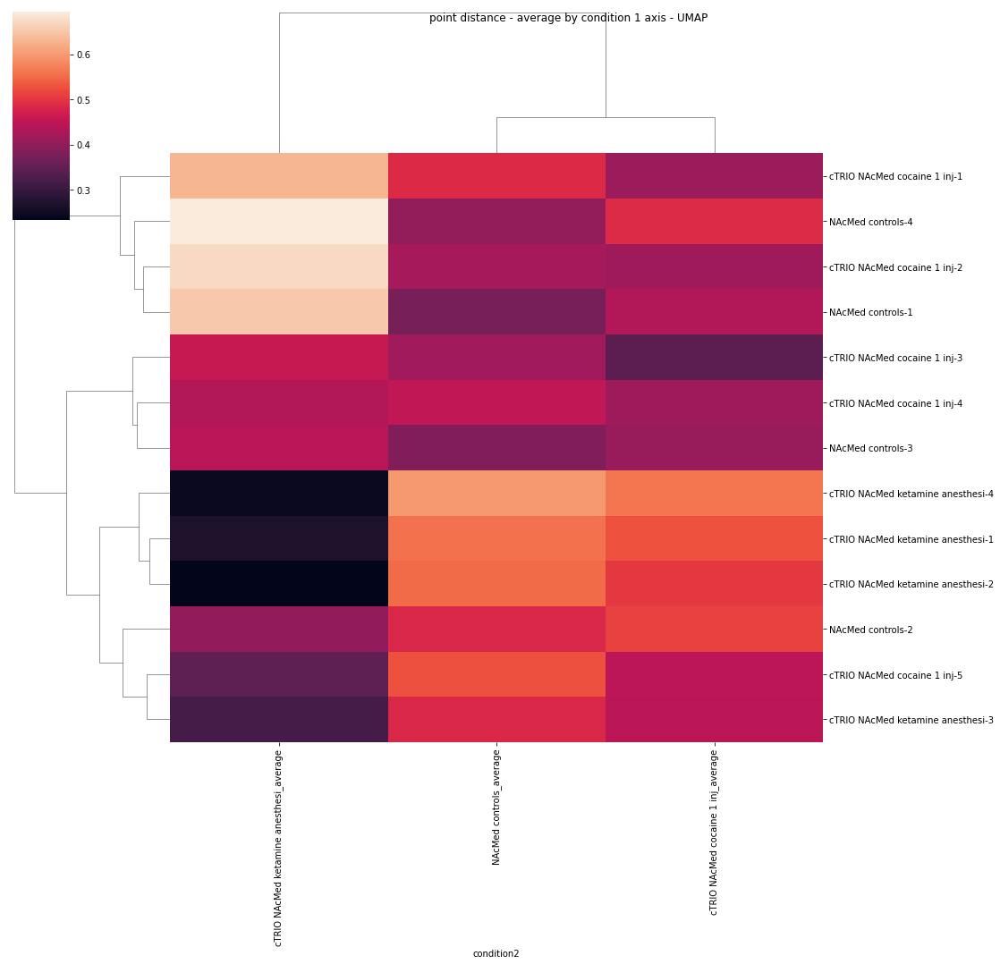

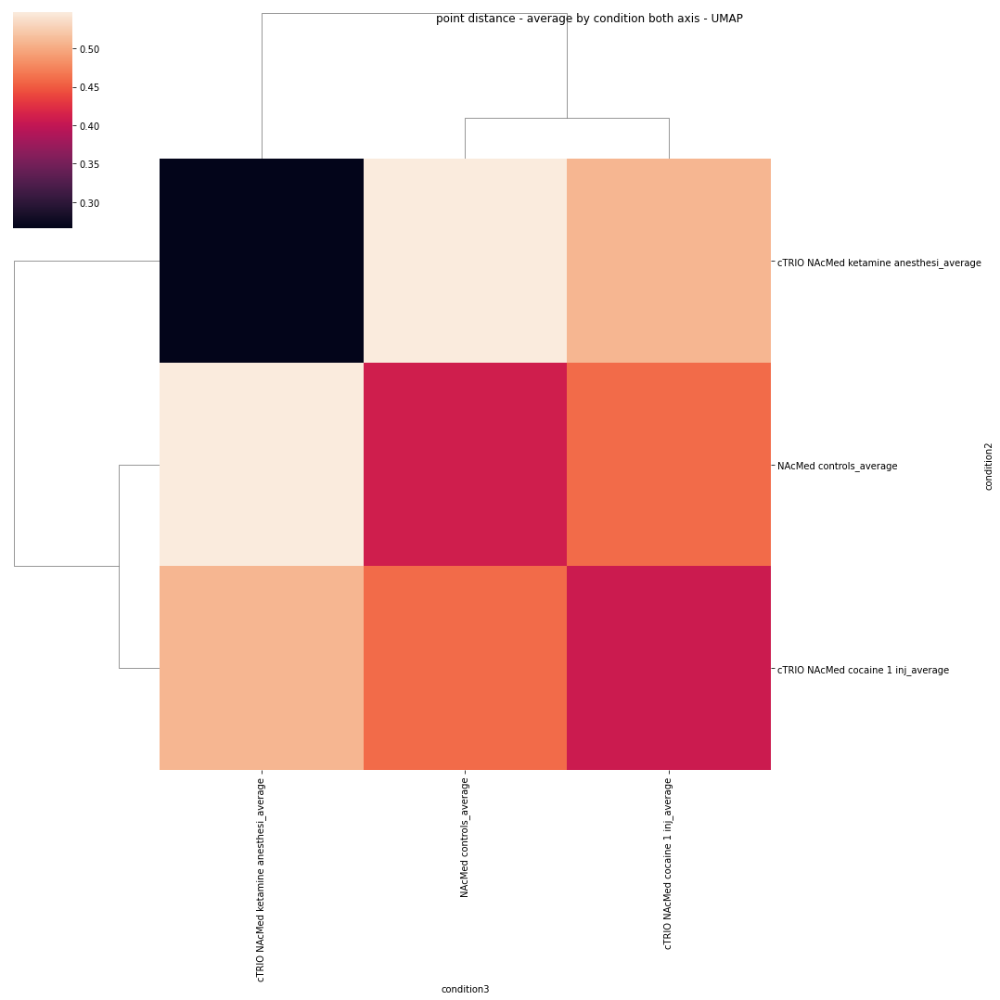

In [91]:
umap_and_heatmap(X_scaled,labels,condition_nums,grouped_elipse='yes',figname1='figures/note0-in88-1.svg',figname2='figures/note0-in88-2.svg',figname3='figures/note0-in88-3.svg',figname4='figures/note0-in88-4.svg')

# NAcLat (below)

In [92]:
features, labels, condition_nums, regions= get_feats_and_labels(NAcLat_data) 

In [93]:
#scale X 
X=features.to_numpy()
#get rid of NAs before scaling
X_scaled=zscore(X,axis=0)

In [94]:
#can change n_components to more if you want to visualize in 3D 
pca = PCA(n_components=5)
#PCA using the scaled drug data array made earlier
principalComponents = pca.fit_transform(X_scaled)
#make into dataframe if you want to view with labels
principalDf = pd.DataFrame(data = principalComponents
             , columns = ['principal component 1', 'principal component 2', 'principal component 3', 'principal component 4', 'principal component 5'])
region_components=pd.DataFrame(data = pca.components_ , columns = regions)
#view df
print('Explained variance for each PC: 1, 2, 3')
print(pca.explained_variance_)
principalDf

Explained variance for each PC: 1, 2, 3
[4.35345518 4.16424565 3.73143985 2.61577907 2.24912024]


,principal component 1,principal component 2,principal component 3,principal component 4,principal component 5
0,2.708280,0.260887,-0.924800,-0.126331,-2.346621
1,-0.563340,-0.739005,-1.278148,1.070973,-1.454844
2,4.200901,-0.651925,2.064571,1.341400,-0.093651
3,4.295432,-1.529985,-1.253212,-0.694476,0.981225
4,0.342460,-2.652146,-0.866297,2.694578,0.899372
5,0.266350,-0.735217,-1.104924,-0.507374,1.976666
6,-1.060933,0.559895,-2.420693,-1.948985,-1.718600
7,-1.512218,-1.291538,-2.722685,-1.676248,-0.170745
8,-0.661471,-0.019014,-0.839816,-1.864616,1.867259
9,0.625448,-0.255020,4.846432,-0.841827,0.451385


### PCA plots

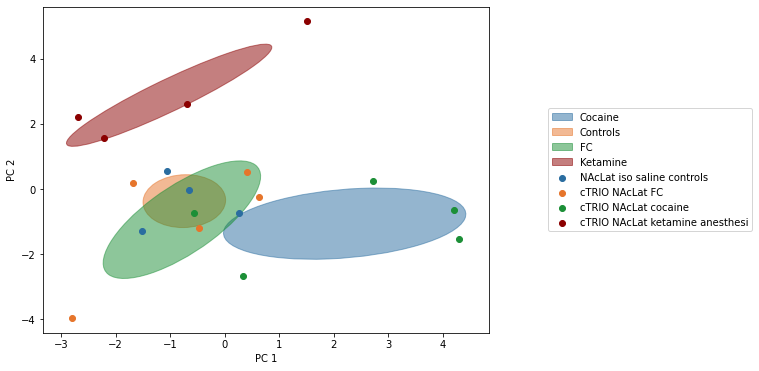

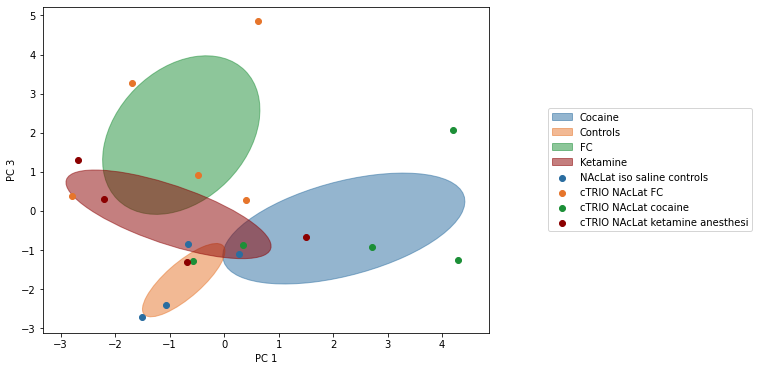

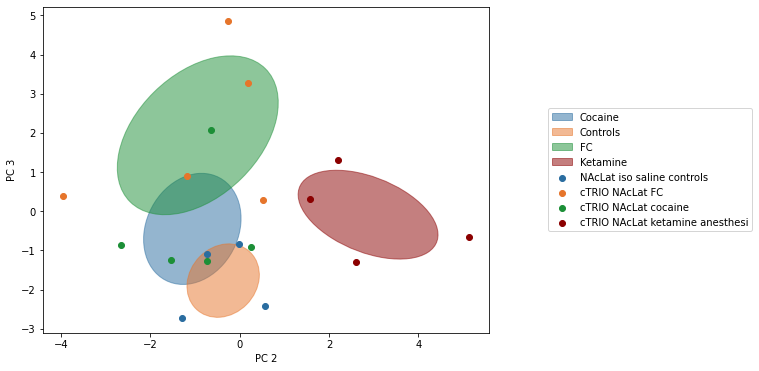

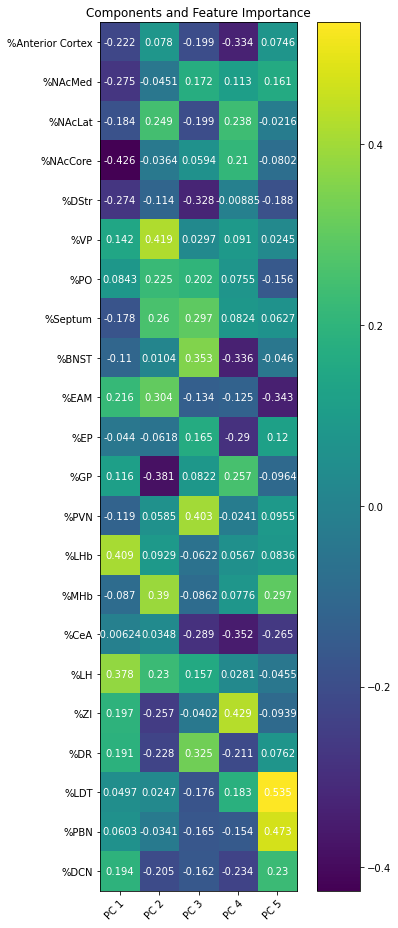

In [95]:
pc1=principalDf['principal component 1']
pc2=principalDf['principal component 2']
pc3=principalDf['principal component 3']
group = condition_nums 
make_pca_plots(pc1,pc2,pc3,group,labels,grouped_elipse='yes',figname1='figures/note0-in92-1.svg',figname2='figures/note0-in92-2.svg',figname3='figures/note0-in92-3.svg')
plot_components(region_components,figname4='figures/note0-in92-4.svg')

C:\Users\Kat\anaconda3\lib\site-packages\seaborn\matrix.py:619: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  linkage = hierarchy.linkage(self.array, method=self.method,


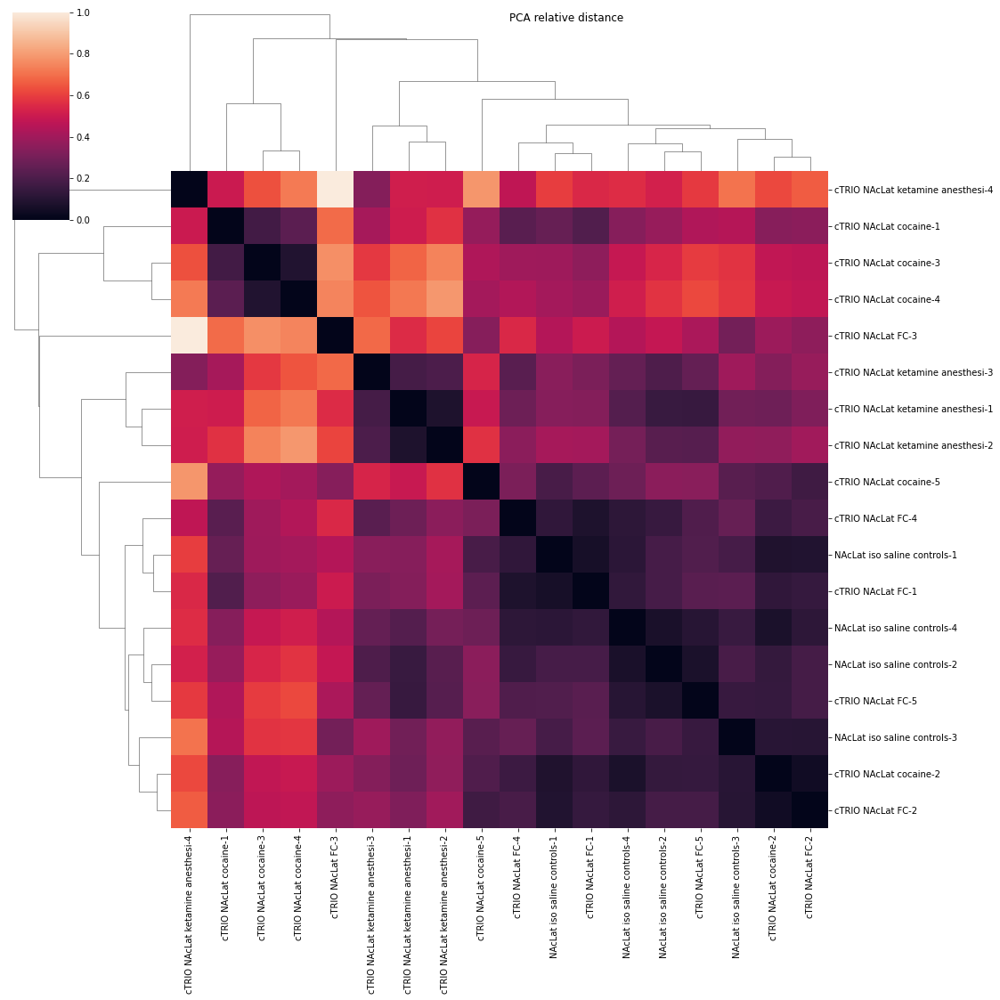

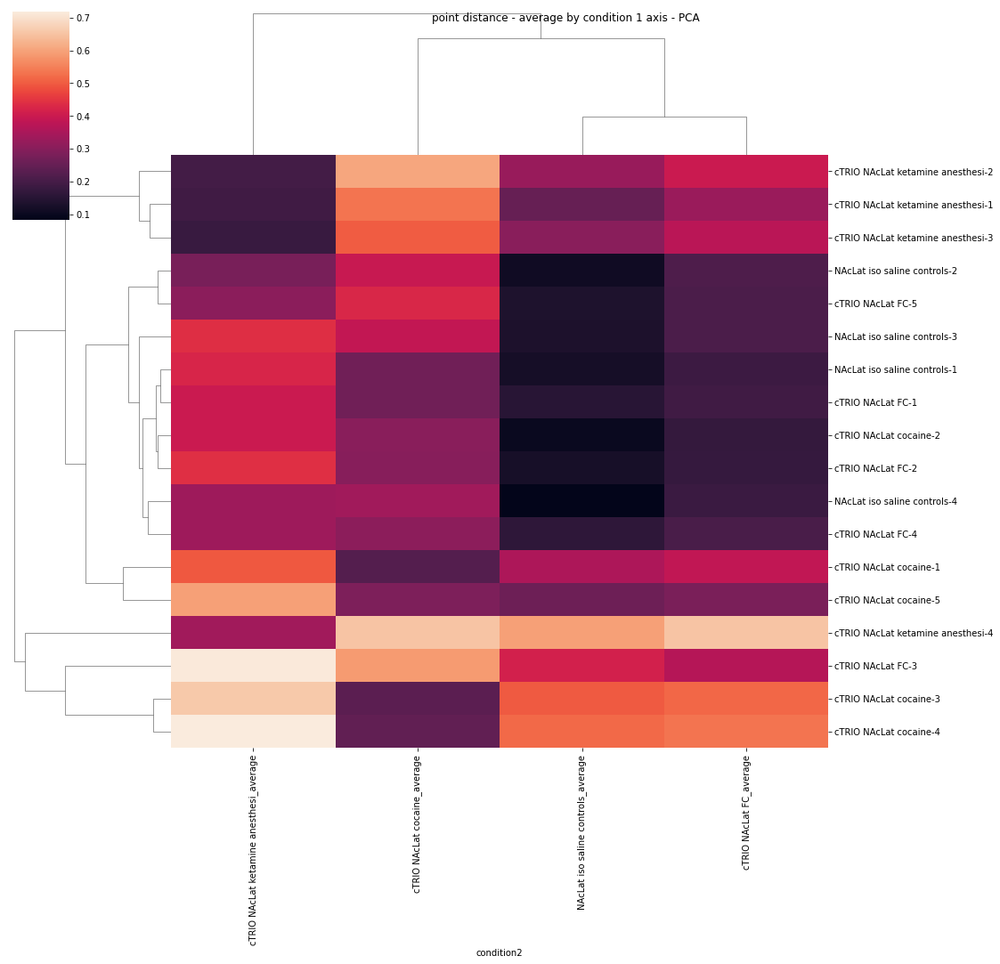

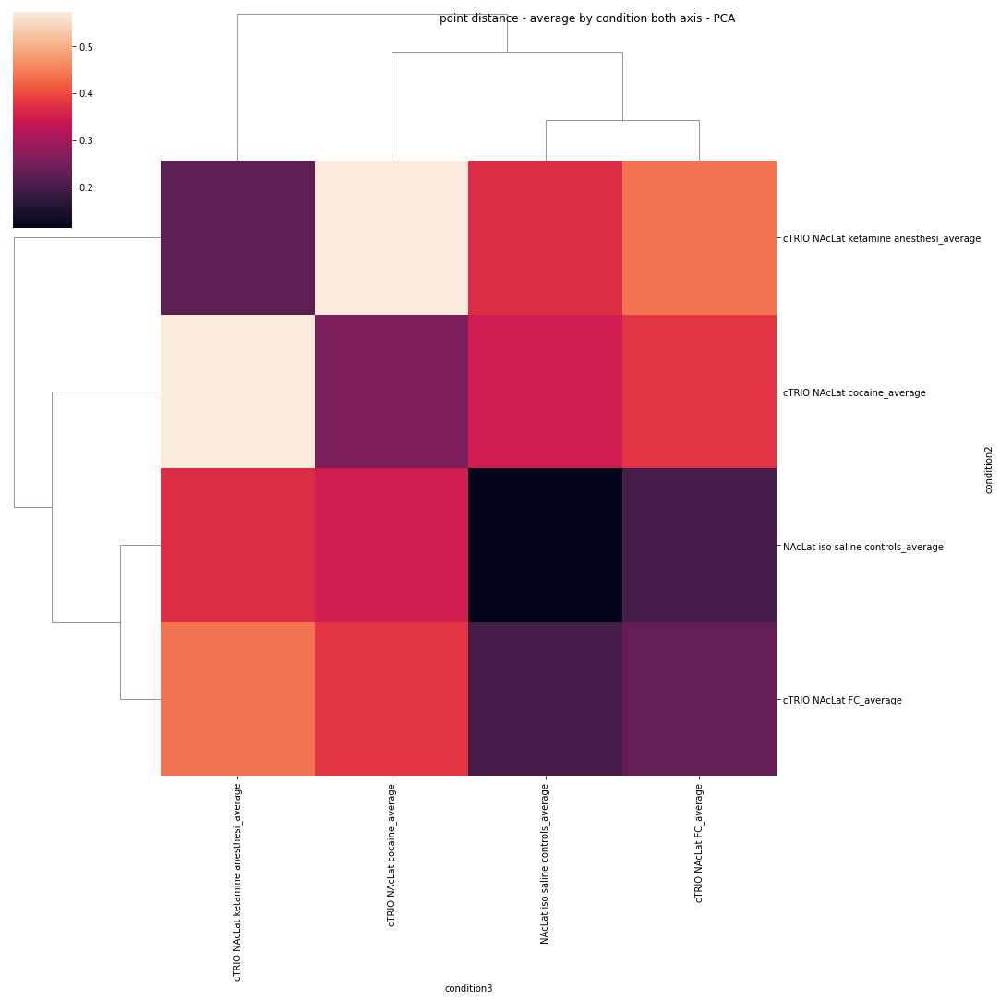

In [96]:
pca_dist=pca_distance(X_scaled,labels)
heatmapdf = pd.DataFrame(pca_dist,index=condition_nums,columns=condition_nums)
cm = sns.clustermap(heatmapdf,yticklabels=True)
cm.fig.suptitle("PCA relative distance")
cm.fig.set_size_inches(18, 18)
plt.show()
distance_to_other_points(pca_dist,labels,condition_nums,' - PCA') # pca 

### UMAP

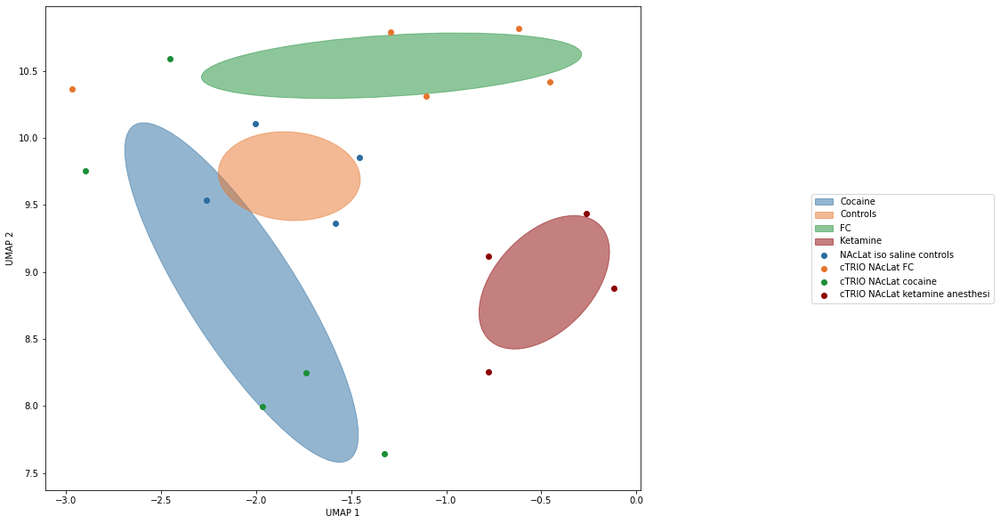

C:\Users\Kat\anaconda3\lib\site-packages\seaborn\matrix.py:619: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  linkage = hierarchy.linkage(self.array, method=self.method,


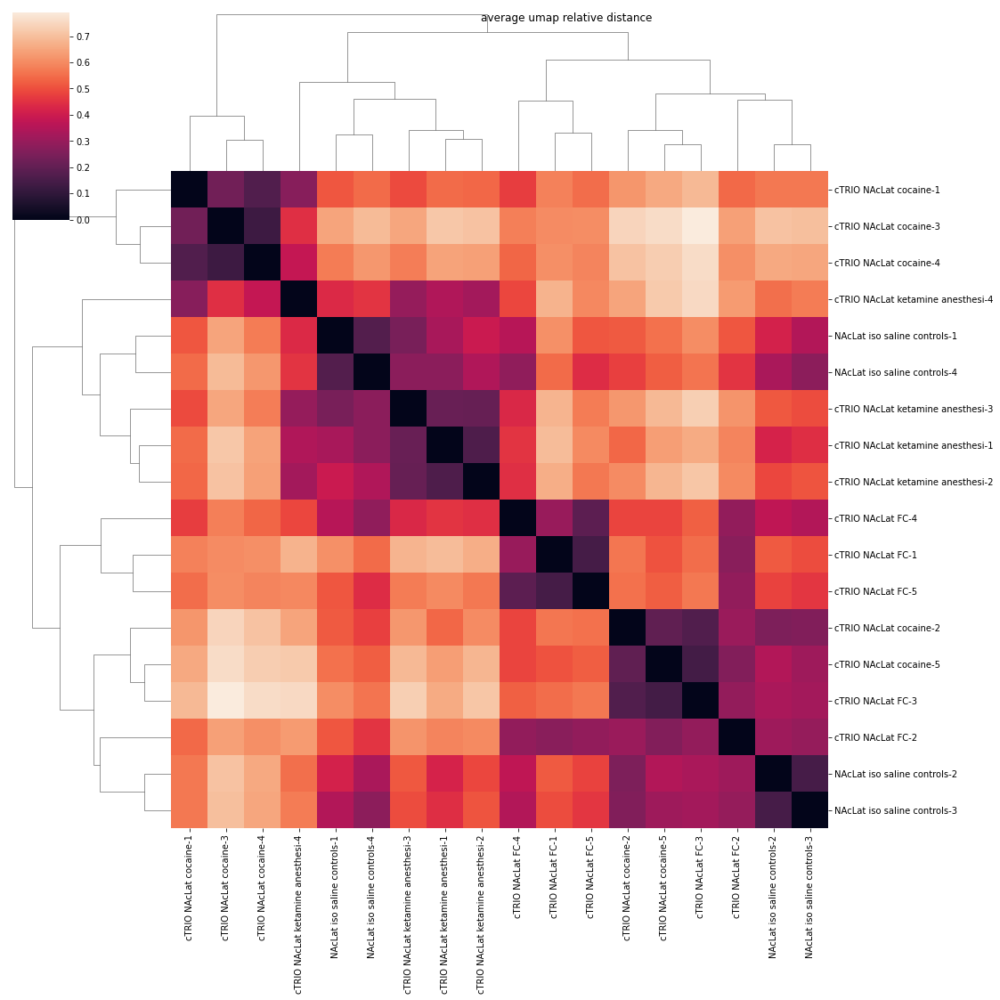

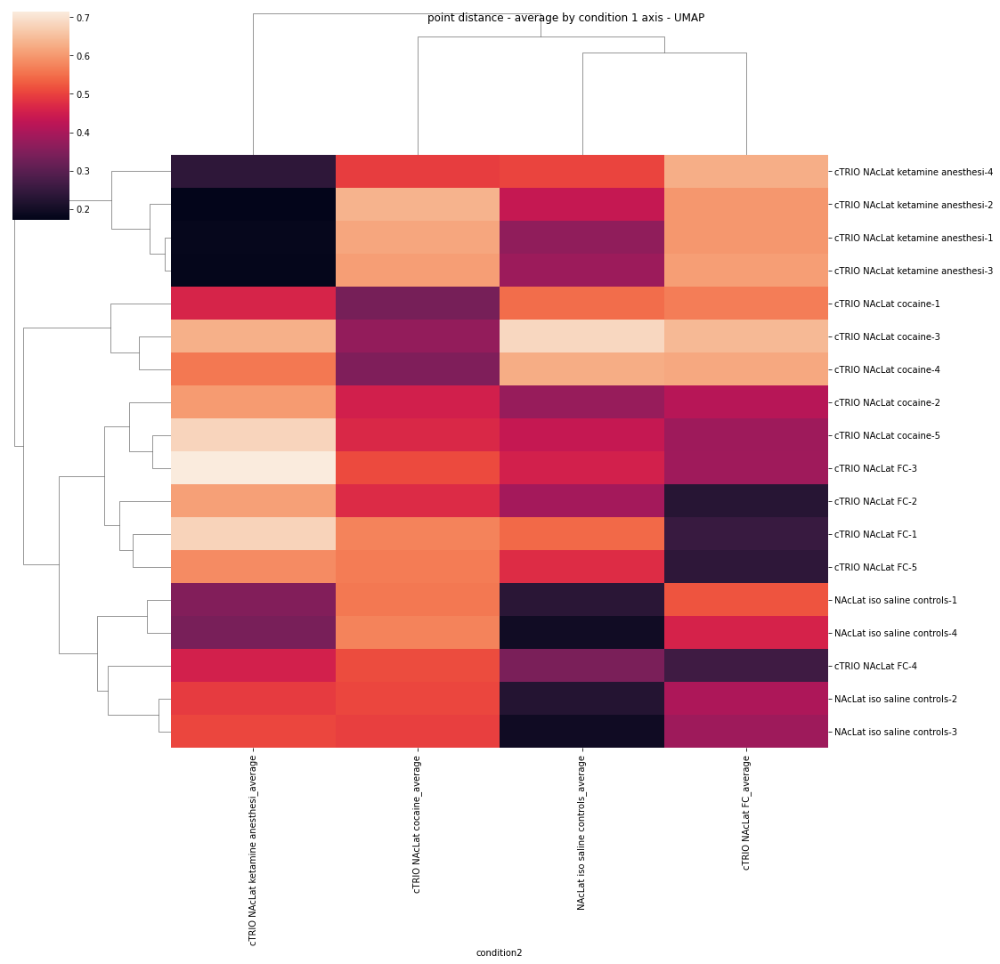

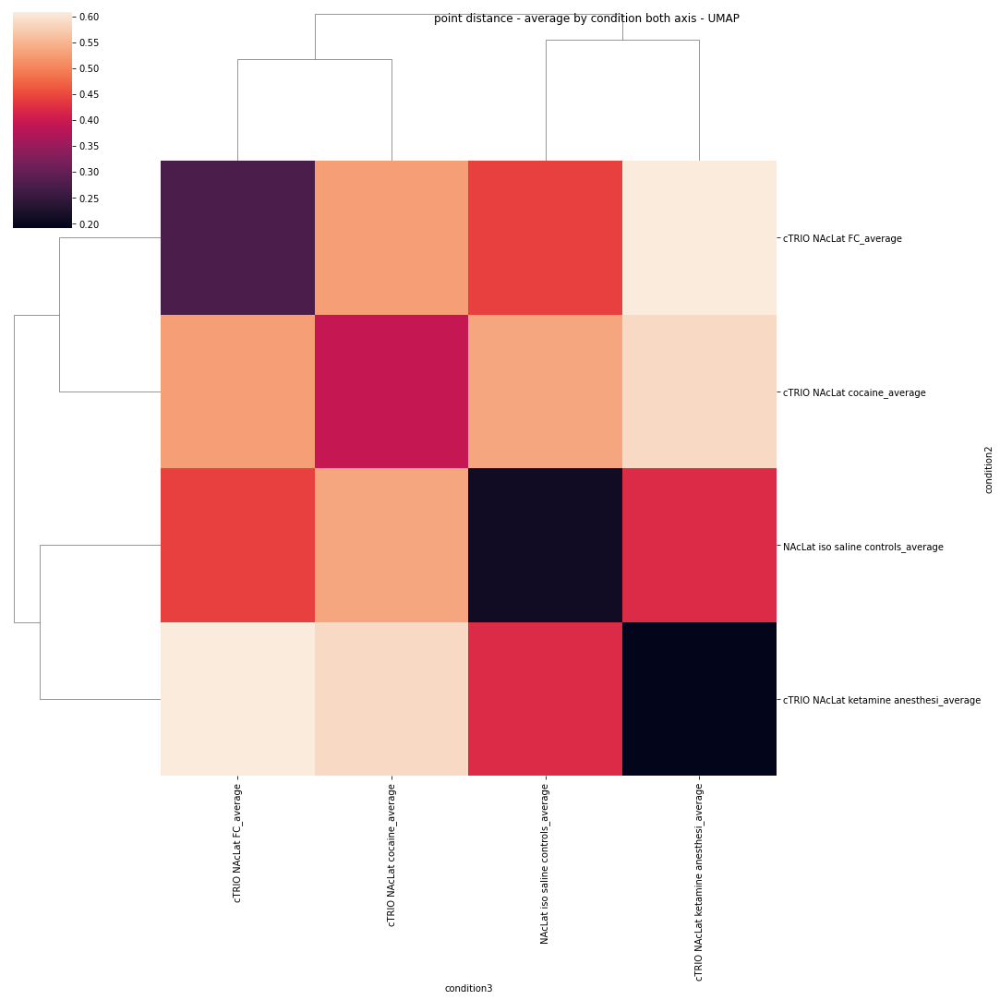

In [97]:
umap_and_heatmap(X_scaled,labels,condition_nums,grouped_elipse='yes',figname1='figures/fig4naclatc_note0in94.svg',figname4='figures/fig4naclatd_note0in94.svg')

# NAcLat cocaine versus saline only

Explained variance for each PC: 1, 2, 3
[7.98227766 4.68835918 4.16670586 2.82717661 1.9805405 ]


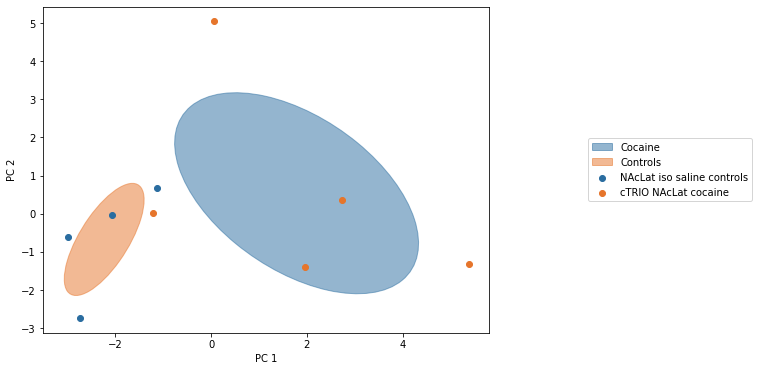

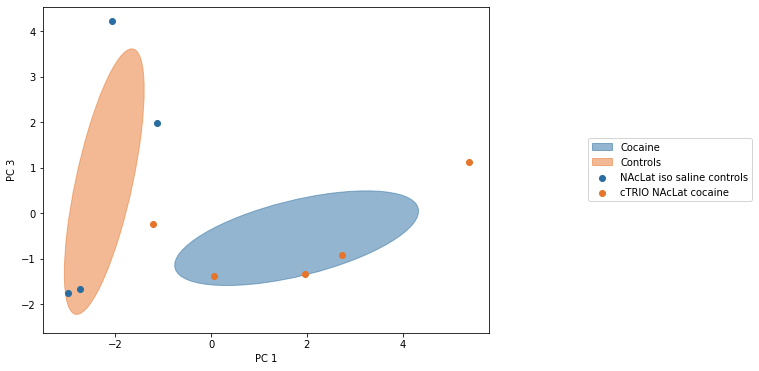

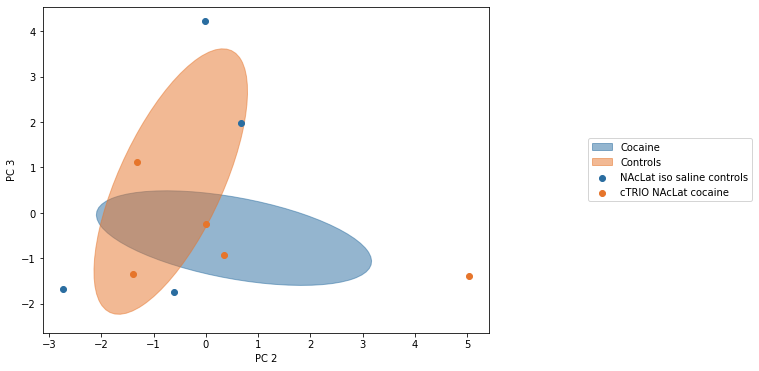

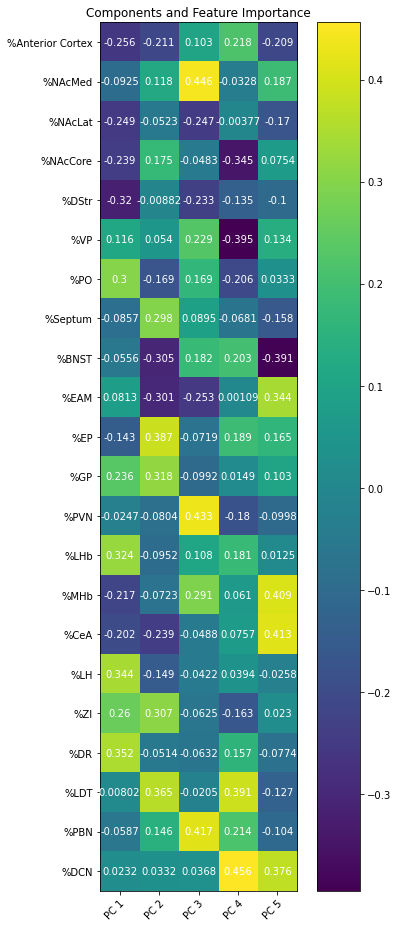

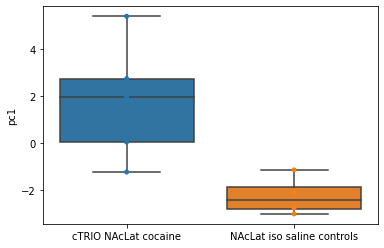

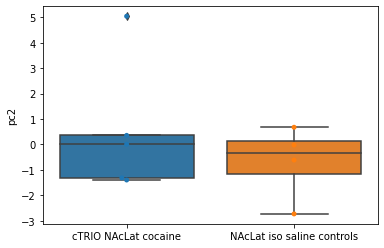

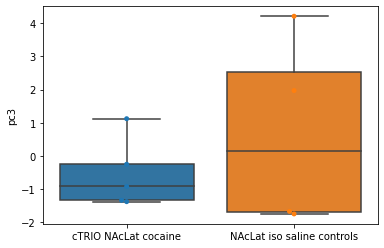

In [98]:
NAcLat_data2=NAcLat_data[(NAcLat_data["condition"] == 'cTRIO NAcLat cocaine')| 
                (NAcLat_data["condition"] == 'NAcLat iso saline controls')]
features, labels, condition_nums, regions= get_feats_and_labels(NAcLat_data2)
X=features.to_numpy()
#get rid of NAs before scaling
X_scaled=zscore(X,axis=0)

#can change n_components to more if you want to visualize in 3D 
pca = PCA(n_components=5)
#PCA using the scaled drug data array made earlier
principalComponents = pca.fit_transform(X_scaled)
#make into dataframe if you want to view with labels
principalDf = pd.DataFrame(data = principalComponents
             , columns = ['principal component 1', 'principal component 2', 'principal component 3', 'principal component 4', 'principal component 5'])
region_components=pd.DataFrame(data = pca.components_ , columns = regions)
#view df
print('Explained variance for each PC: 1, 2, 3')
print(pca.explained_variance_)

pc1=principalDf['principal component 1']
pc2=principalDf['principal component 2']
pc3=principalDf['principal component 3']
group = condition_nums 
make_pca_plots(pc1,pc2,pc3,group,labels,grouped_elipse='yes',figname1='figures/cocaine-v-saline/NAcLat-D-pc1.svg',figname2='figures/temp.svg',figname3='figures/temp.svg')
plot_components(region_components,figname4='figures/cocaine-v-saline/NAcLat-D-comps.svg')
align_embed= pd.DataFrame({'pc1': pc1.values,'pc2': pc2.values,'pc3': pc3.values},index=labels)
value=align_embed['pc1']
treatments=align_embed.index
ax = sns.boxplot(x=treatments, y=value)
ax = sns.swarmplot(x=treatments, y=value) #4d-NAcLat  4g-Amyg   4j-NAcMed   4m-mPFC
plt.savefig('figures/temp.svg')
plt.show()
value=align_embed['pc2']
ax = sns.boxplot(x=treatments, y=value)
ax = sns.swarmplot(x=treatments, y=value)
plt.savefig('figures/temp.svg')
plt.show()
value=align_embed['pc3']
ax = sns.boxplot(x=treatments, y=value)
ax = sns.swarmplot(x=treatments, y=value)
plt.savefig('figures/temp.svg')
plt.show()

# NAcLat 
# No FC condition (below)

In [99]:
NAcLat_data2=NAcLat_data[(NAcLat_data["condition"] == 'cTRIO NAcLat ketamine anesthesi') | 
                (NAcLat_data["condition"] == 'cTRIO NAcLat cocaine')| 
                (NAcLat_data["condition"] == 'NAcLat iso saline controls')]
features, labels, condition_nums, regions= get_feats_and_labels(NAcLat_data2)
print(condition_nums)
print(len(condition_nums))

['cTRIO NAcLat cocaine-1' 'cTRIO NAcLat cocaine-2'
 'cTRIO NAcLat cocaine-3' 'cTRIO NAcLat cocaine-4'
 'cTRIO NAcLat cocaine-5' 'NAcLat iso saline controls-1'
 'NAcLat iso saline controls-2' 'NAcLat iso saline controls-3'
 'NAcLat iso saline controls-4' 'cTRIO NAcLat ketamine anesthesi-1'
 'cTRIO NAcLat ketamine anesthesi-2' 'cTRIO NAcLat ketamine anesthesi-3'
 'cTRIO NAcLat ketamine anesthesi-4']
13


In [100]:
#scale X 
X=features.to_numpy()
#get rid of NAs before scaling
X_scaled=zscore(X,axis=0)
#can change n_components to more if you want to visualize in 3D 
pca = PCA(n_components=5)
#PCA using the scaled drug data array made earlier
principalComponents = pca.fit_transform(X_scaled)
#make into dataframe if you want to view with labels
principalDf = pd.DataFrame(data = principalComponents
             , columns = ['principal component 1', 'principal component 2', 'principal component 3', 'principal component 4', 'principal component 5'])
region_components=pd.DataFrame(data = pca.components_ , columns = regions)
#view df
print('Explained variance for each PC: 1, 2, 3')
print(pca.explained_variance_)
principalDf

Explained variance for each PC: 1, 2, 3
[6.41868969 4.80038948 3.49757696 2.8733236  2.31652589]


,principal component 1,principal component 2,principal component 3,principal component 4,principal component 5
0,2.412734,1.791557,1.585836,-1.071704,-1.076524
1,-0.013317,-1.050363,-0.368525,-0.991499,-2.033183
2,3.413965,2.949582,-1.250193,2.902423,-0.850369
3,4.519420,-0.053273,0.076374,-0.128752,1.220760
4,2.346487,-2.680518,-2.826836,-2.149805,-0.981424
5,0.219062,-1.122451,0.054677,1.637077,1.556020
6,-0.984460,-0.704768,3.726412,-0.488575,-0.425657
7,-0.079891,-2.970517,2.404670,-0.626540,0.300830
8,-1.100575,-1.561043,0.124921,2.383687,1.487286
9,-3.144663,-0.070848,-0.050981,1.930701,-0.956241


### PCA Plots

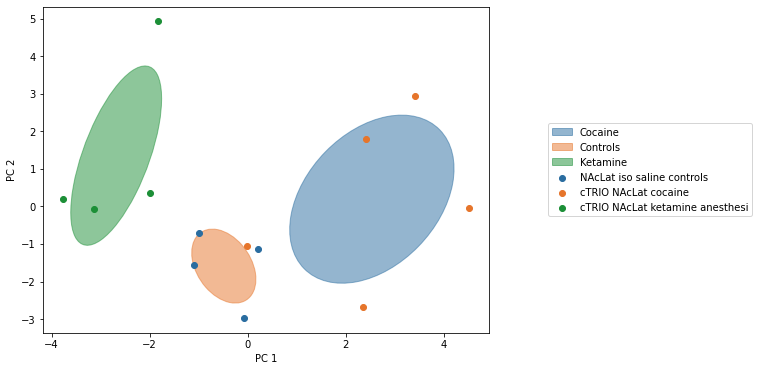

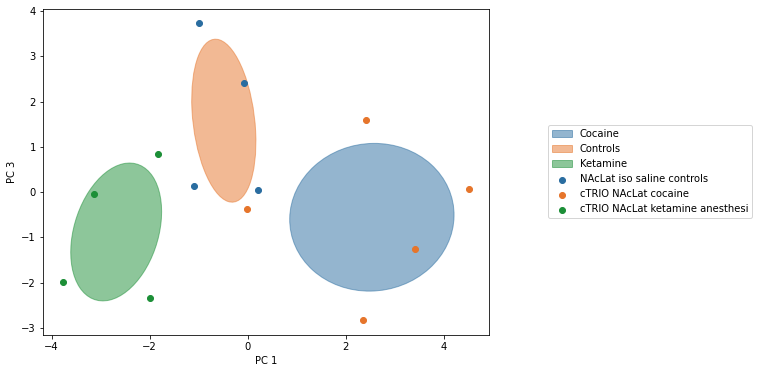

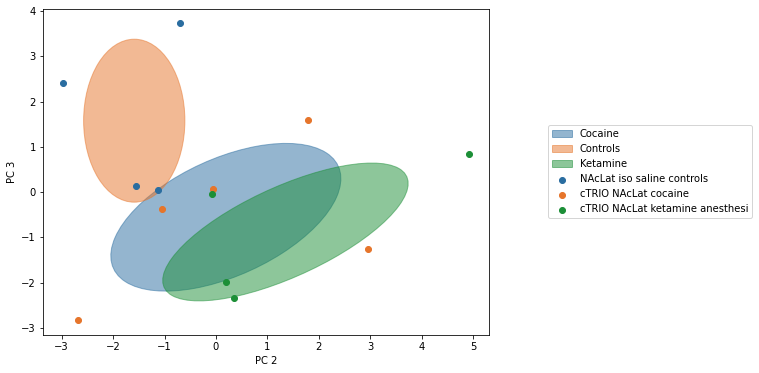

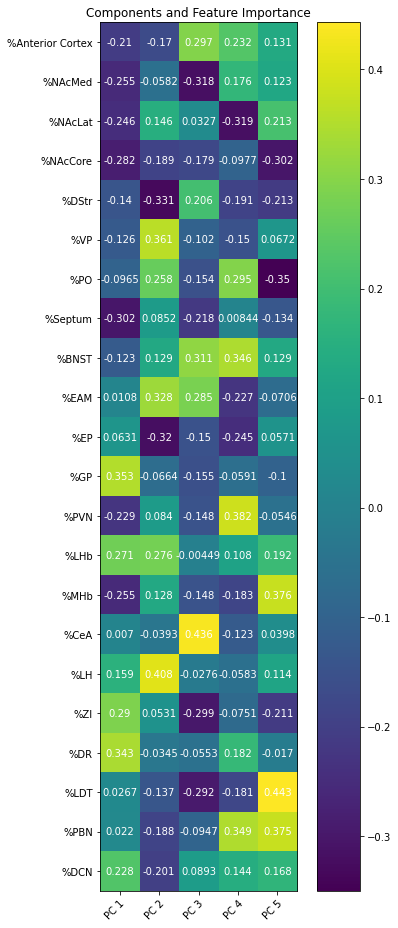

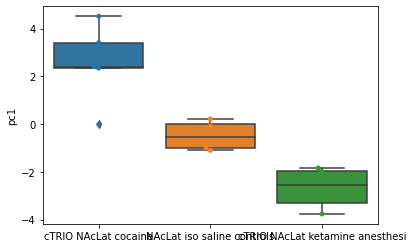

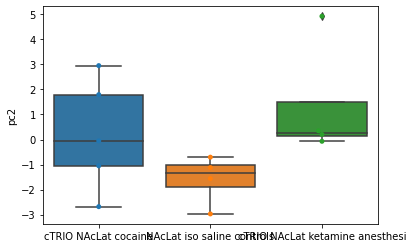

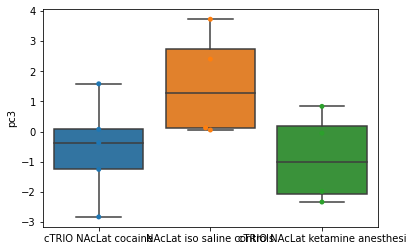

C:\Users\Kat\anaconda3\lib\site-packages\bioinfokit\analys.py:421: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  mult_group[ele] = df[df[xfac_var] == ele].mean().loc[res_var]


In [101]:
pc1=principalDf['principal component 1']
pc2=principalDf['principal component 2']
pc3=principalDf['principal component 3']
group = condition_nums 
make_pca_plots(pc1,pc2,pc3,group,labels,grouped_elipse='yes',figname1='figures/PCA-stats/PC2-3_figure4/NAcLat1.svg',figname2='figures/PCA-stats/PC2-3_figure4/NAcLat2.svg',figname3='figures/PCA-stats/PC2-3_figure4/NAcLat3.svg')
plot_components(region_components,figname4='figures/note0-in97-4.svg')
align_embed= pd.DataFrame({'pc1': pc1.values,'pc2': pc2.values,'pc3': pc3.values},index=labels)
value=align_embed['pc1']
treatments=align_embed.index
ax = sns.boxplot(x=treatments, y=value)
ax = sns.swarmplot(x=treatments, y=value) #4d-NAcLat  4g-Amyg      4m-mPFC
plt.savefig('figures/PCA-stats/figure 4/4d-NAcLat-PC1-boxplot.svg')
plt.show()
value=align_embed['pc2']
ax = sns.boxplot(x=treatments, y=value)
ax = sns.swarmplot(x=treatments, y=value)
plt.savefig('figures/PCA-stats/figure 4/4d-NAcLat-PC2-boxplot.svg')
plt.show()
value=align_embed['pc3']
ax = sns.boxplot(x=treatments, y=value)
ax = sns.swarmplot(x=treatments, y=value)
plt.savefig('figures/PCA-stats/figure 4/4d-NAcLat-PC3-boxplot.svg')
plt.show()

df_melt= pd.DataFrame({'value':align_embed['pc1'],'treatments': align_embed.index})
#!pip install bioinfokit
from bioinfokit.analys import stat
res = stat()
res.tukey_hsd(df=df_melt, res_var='value', xfac_var='treatments', anova_model='value ~ C(treatments)')
res.tukey_summary.to_csv('figures/PCA-stats/figure 4/4d-NAcLat-PC1-stat.csv')

df_melt= pd.DataFrame({'value':align_embed['pc2'],'treatments': align_embed.index})
#!pip install bioinfokit 
res = stat()
res.tukey_hsd(df=df_melt, res_var='value', xfac_var='treatments', anova_model='value ~ C(treatments)')
res.tukey_summary.to_csv('figures/PCA-stats/figure 4/4d-NAcLat-PC2-stat.csv')

df_melt= pd.DataFrame({'value':align_embed['pc3'],'treatments': align_embed.index})
#!pip install bioinfokit 
res = stat()
res.tukey_hsd(df=df_melt, res_var='value', xfac_var='treatments', anova_model='value ~ C(treatments)')
res.tukey_summary.to_csv('figures/PCA-stats/figure 4/4d-NAcLat-PC3-stat.csv')


df_melt= pd.DataFrame({'pc1':align_embed['pc1'],'pc2':align_embed['pc2'],'pc3':align_embed['pc3'],'treatments': treatments})
df_melt.to_csv('figures/PCA-stats/PC-values-for-Kevin/Figure_4D_PC1-3.csv')

C:\Users\Kat\anaconda3\lib\site-packages\seaborn\matrix.py:619: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  linkage = hierarchy.linkage(self.array, method=self.method,


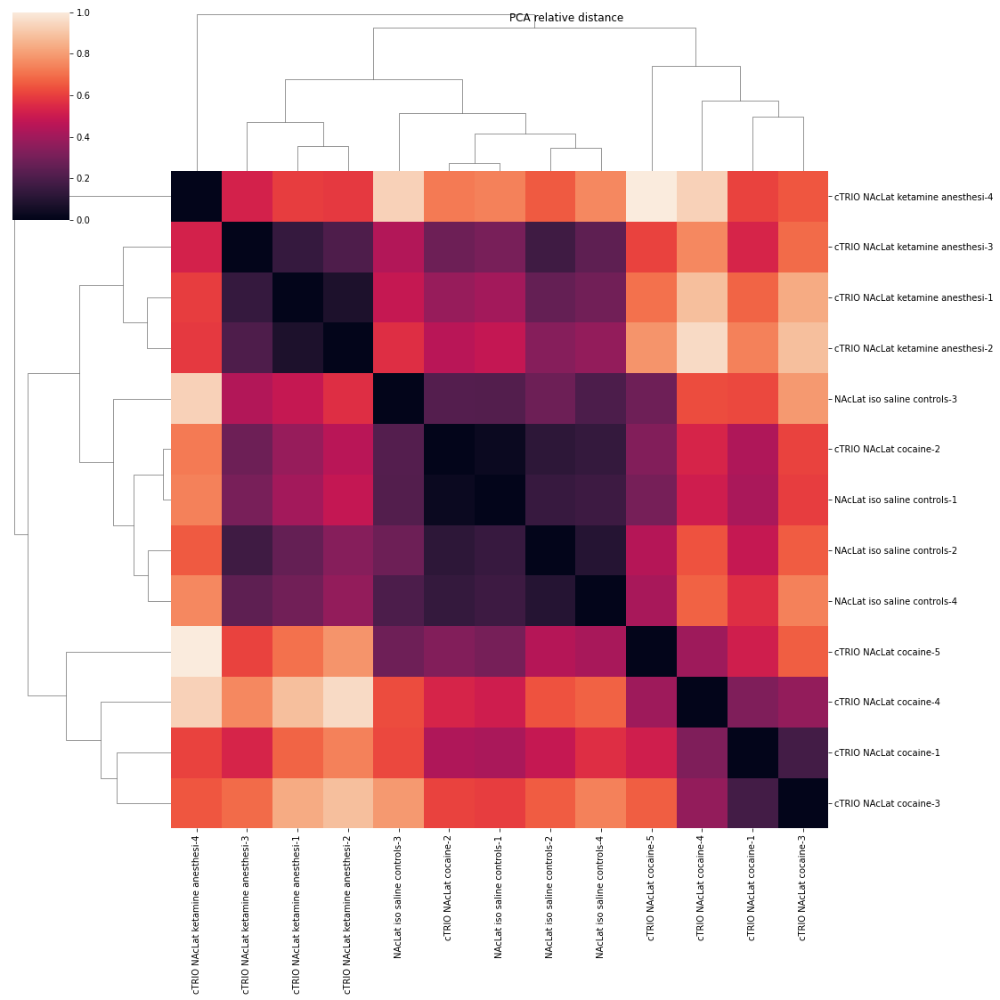

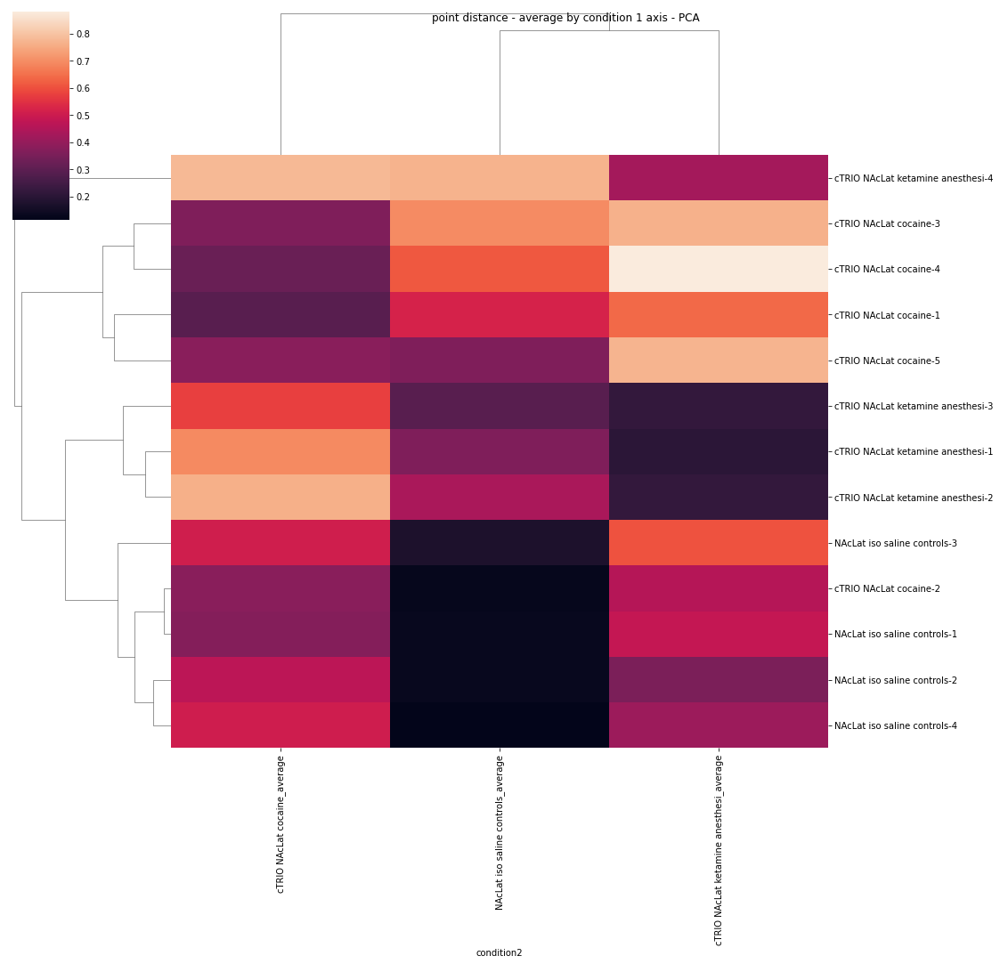

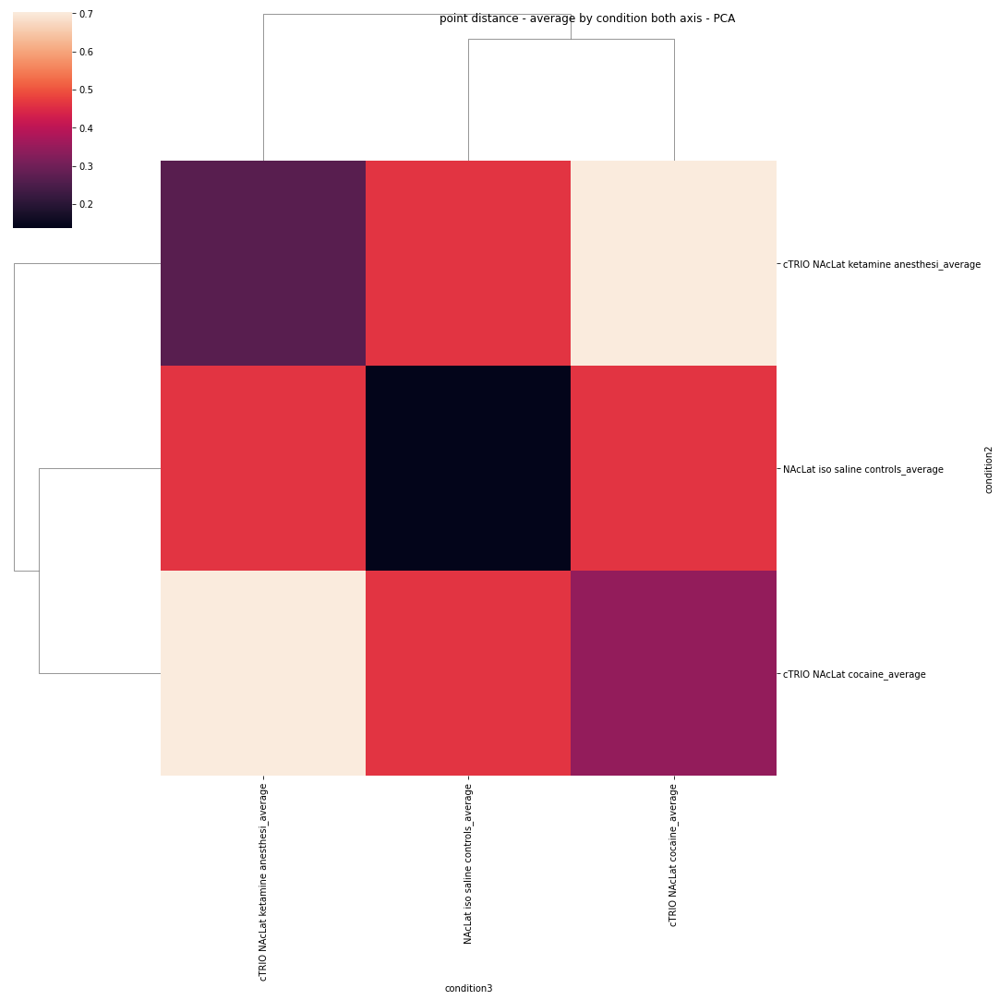

In [102]:
pca_dist=pca_distance(X_scaled,labels)
heatmapdf = pd.DataFrame(pca_dist,index=condition_nums,columns=condition_nums)
cm = sns.clustermap(heatmapdf,yticklabels=True)
cm.fig.suptitle("PCA relative distance")
cm.fig.set_size_inches(18, 18)
plt.show()
distance_to_other_points(pca_dist,labels,condition_nums,' - PCA') # pca 

### UMAP

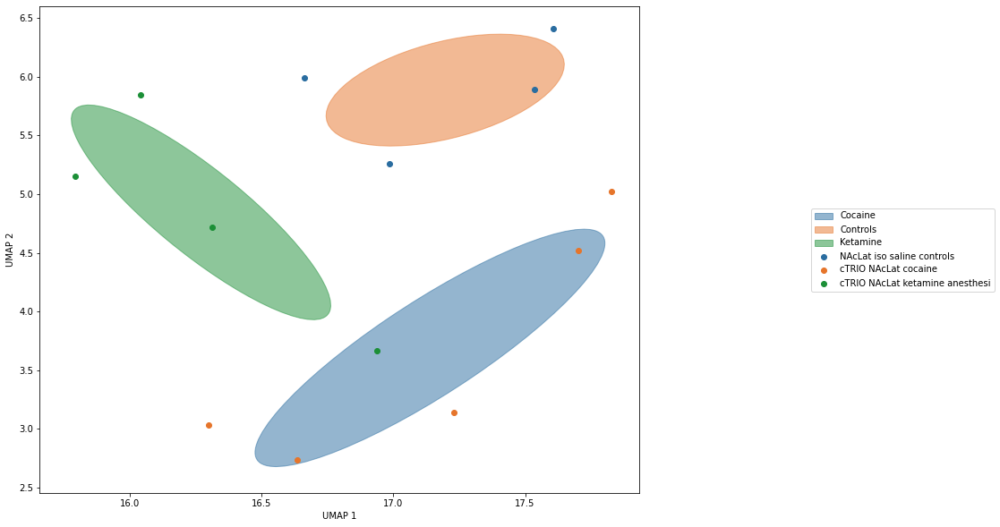

C:\Users\Kat\anaconda3\lib\site-packages\seaborn\matrix.py:619: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  linkage = hierarchy.linkage(self.array, method=self.method,


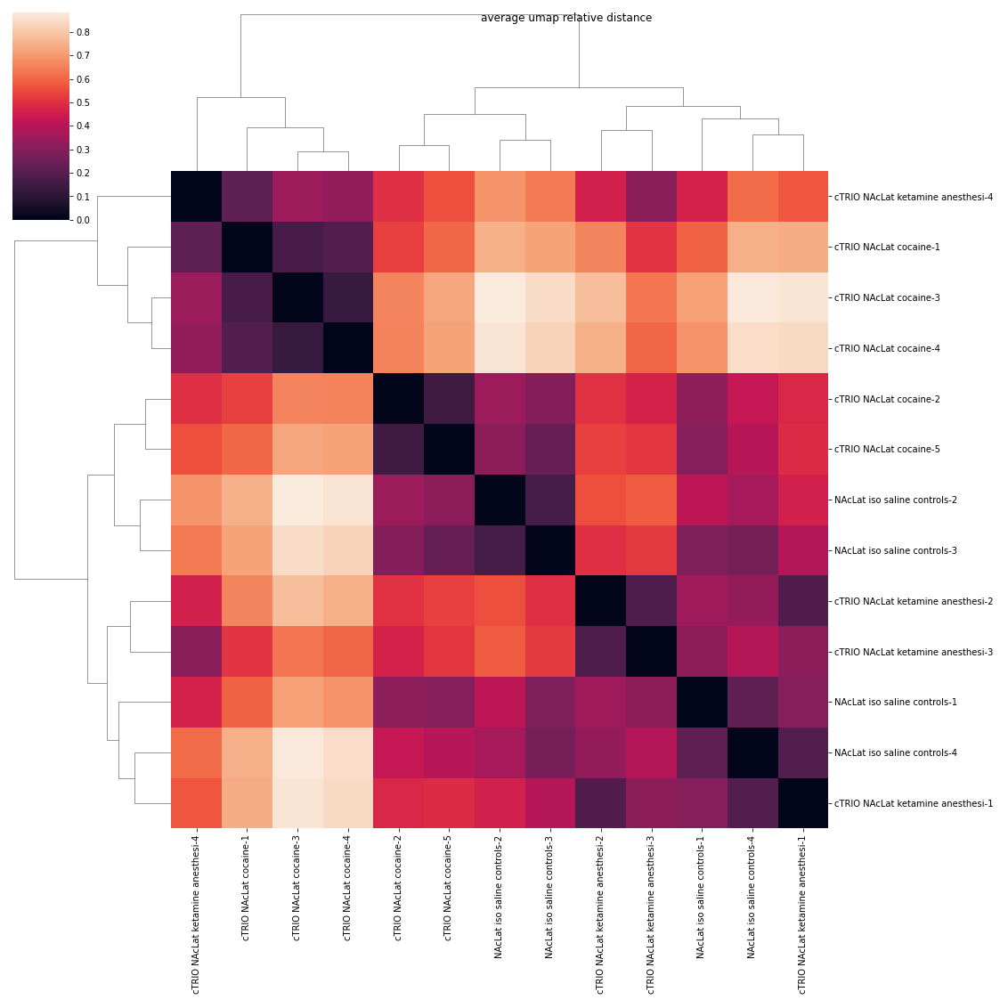

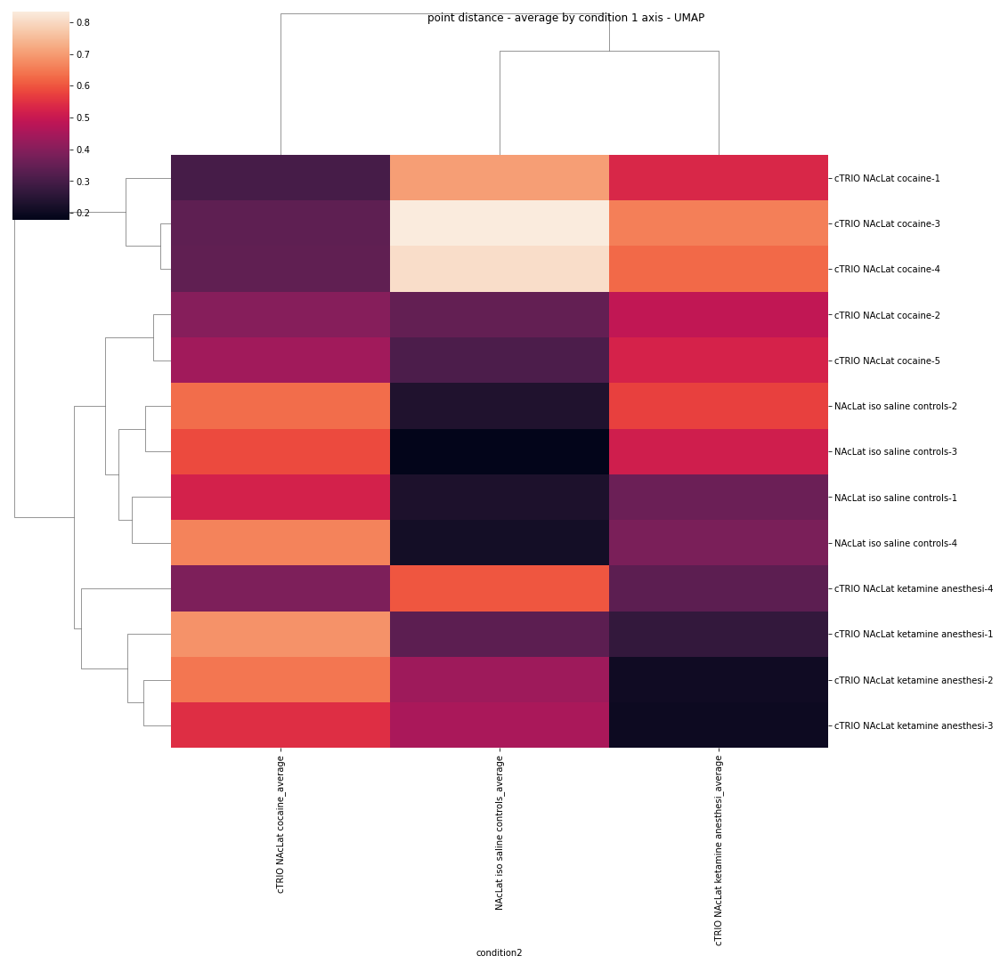

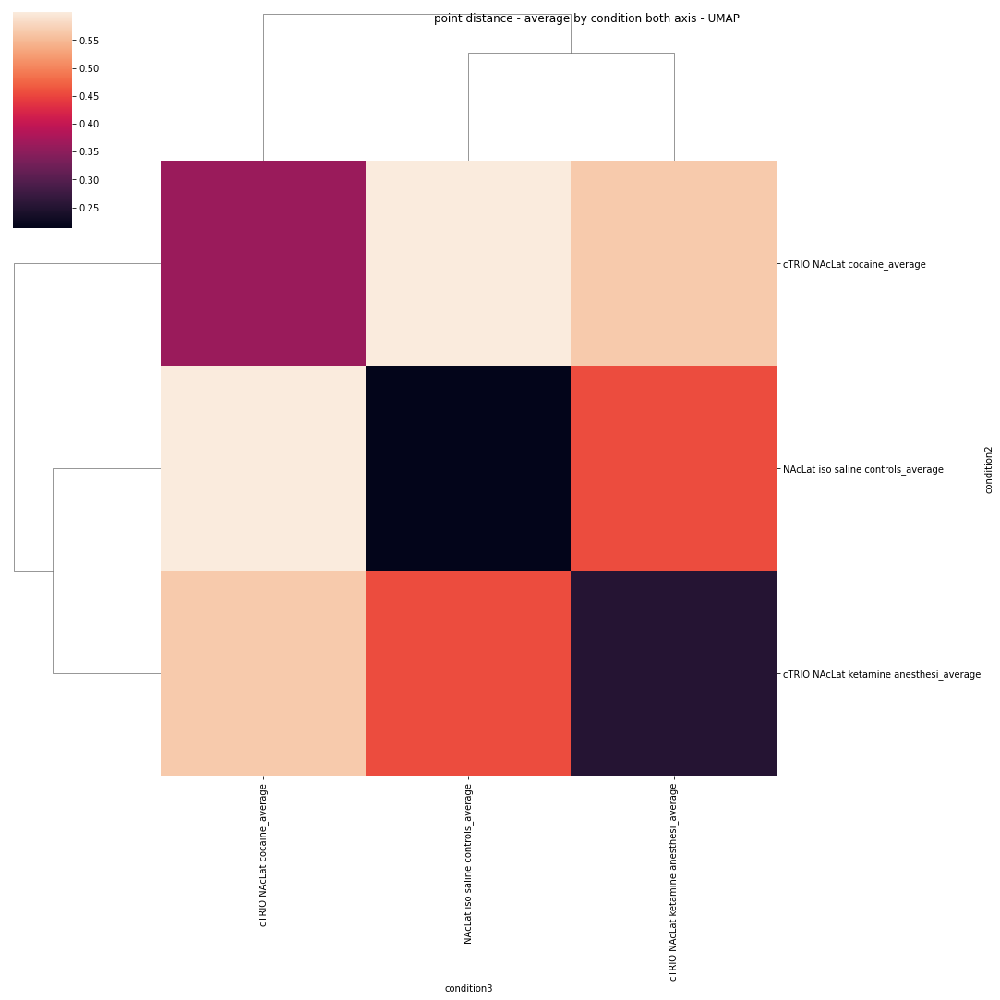

In [103]:
umap_and_heatmap(X_scaled,labels,condition_nums,grouped_elipse='yes',figname1='figures/note0-in99-1.svg',figname2='figures/note0-in99-2.svg',figname3='figures/note0-in99-3.svg',figname4='figures/note0-in99-4.svg')

# DLS (below)

In [104]:
def get_feats_and_labels(dataframe):
    labels=dataframe['condition']
    condition_nums=dataframe['condition_num']
    features=dataframe.iloc[: , 2:24]
    if scrambled == 'yes':
        features = features.sample(frac=1).reset_index(drop=True)
    regions=features.columns
    return features, labels, condition_nums, regions

In [105]:
DLS_data.reset_index(inplace=True)
features, labels, condition_nums,regions= get_feats_and_labels(DLS_data)

In [106]:
#scale X 
X=features.to_numpy().astype(float)
#get rid of NAs before scaling
X_scaled=zscore(X,axis=0)

In [107]:
#can change n_components to more if you want to visualize in 3D 
pca = PCA(n_components=5)
#PCA using the scaled drug data array made earlier
principalComponents = pca.fit_transform(X_scaled)
#make into dataframe if you want to view with labels
principalDf = pd.DataFrame(data = principalComponents
             , columns = ['principal component 1', 'principal component 2', 'principal component 3', 'principal component 4', 'principal component 5'])
region_components=pd.DataFrame(data = pca.components_ , columns = regions)
#view df
print('Explained variance for each PC: 1, 2, 3')
print(pca.explained_variance_)
principalDf

Explained variance for each PC: 1, 2, 3
[7.64200819 5.83694746 2.59048068 2.16260865 1.69571931]


,principal component 1,principal component 2,principal component 3,principal component 4,principal component 5
0,2.863743,-1.102187,1.814556,0.892148,-1.363174
1,6.339612,-1.397908,0.389734,-1.417319,2.110163
2,1.115685,0.325177,0.686521,0.102954,0.067176
3,1.430828,-0.285387,-1.815084,0.291470,0.055669
4,1.338593,4.826360,-0.430116,0.549805,-1.713057
5,-3.096473,-2.087339,0.617660,3.489140,1.416123
6,0.204368,3.268487,-1.254404,0.667367,-0.402406
7,-2.311155,-3.236348,-1.537248,-1.822492,-1.321514
8,-3.871834,3.238149,2.106815,-1.908480,1.697832
9,-0.436738,-1.784981,-1.843667,0.132969,-0.223387


### PCA plots

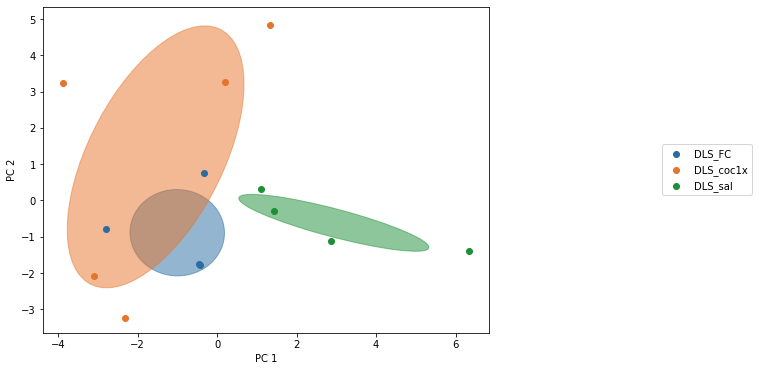

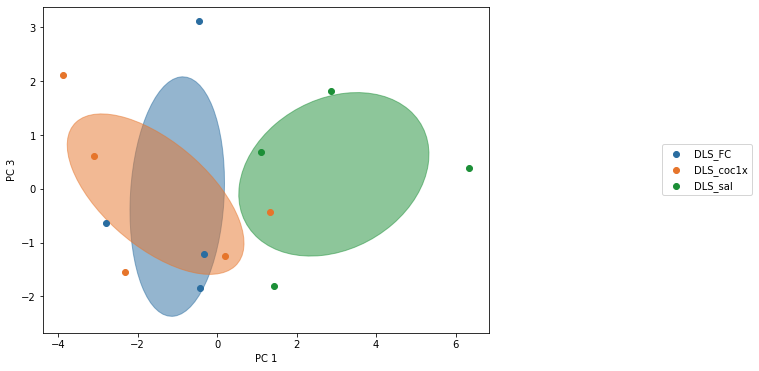

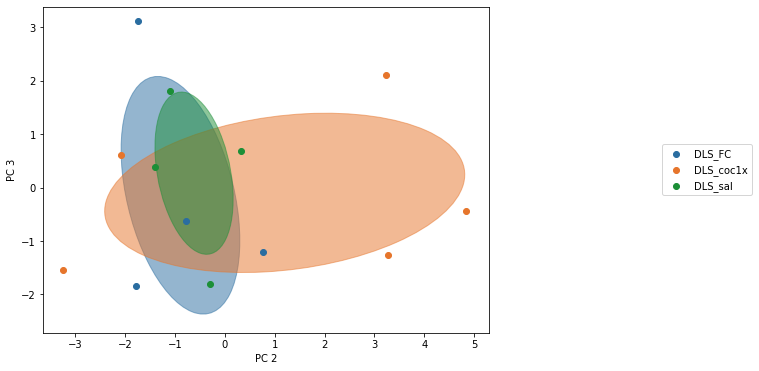

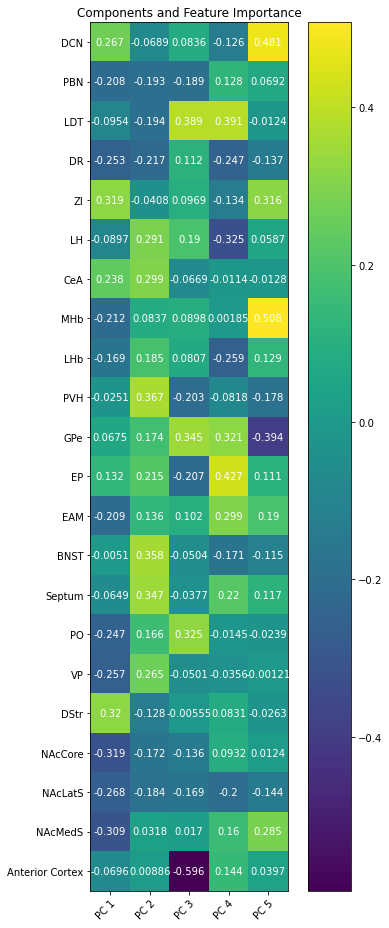

In [108]:
pc1=principalDf['principal component 1']
pc2=principalDf['principal component 2']
pc3=principalDf['principal component 3']
group = condition_nums 
make_pca_plots(pc1,pc2,pc3,group,labels,grouped_elipse='no',figname1='figures/note0-in104-1.svg',figname2='figures/note0-in104-2.svg',figname3='figures/note0-in104-3.svg')
plot_components(region_components,figname4='figures/note0-in104-4.svg')

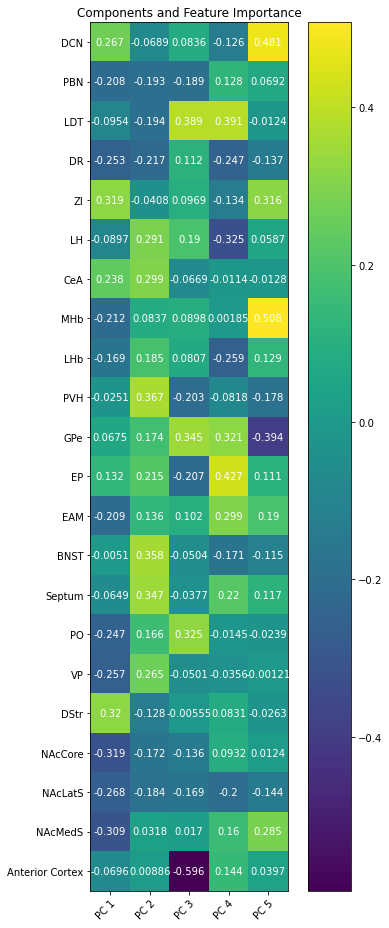

In [109]:
plot_components(region_components)

C:\Users\Kat\anaconda3\lib\site-packages\seaborn\matrix.py:619: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  linkage = hierarchy.linkage(self.array, method=self.method,


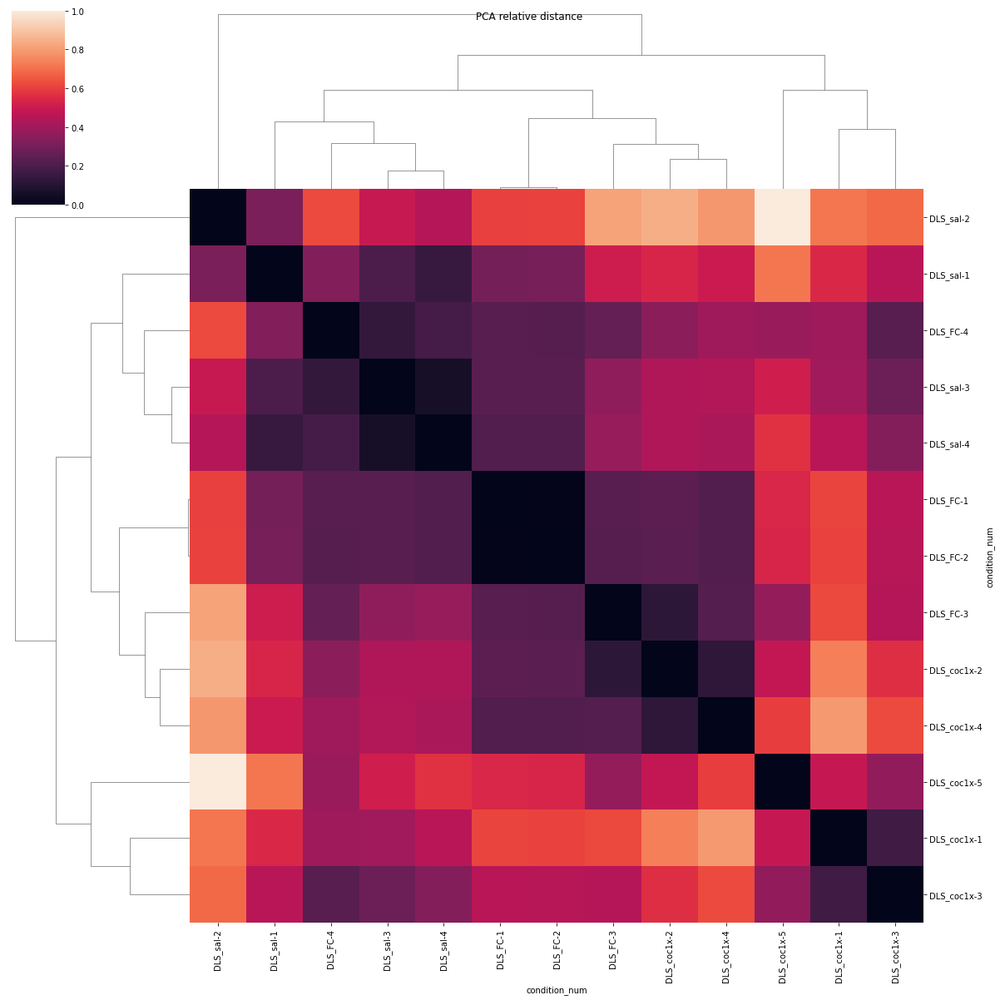

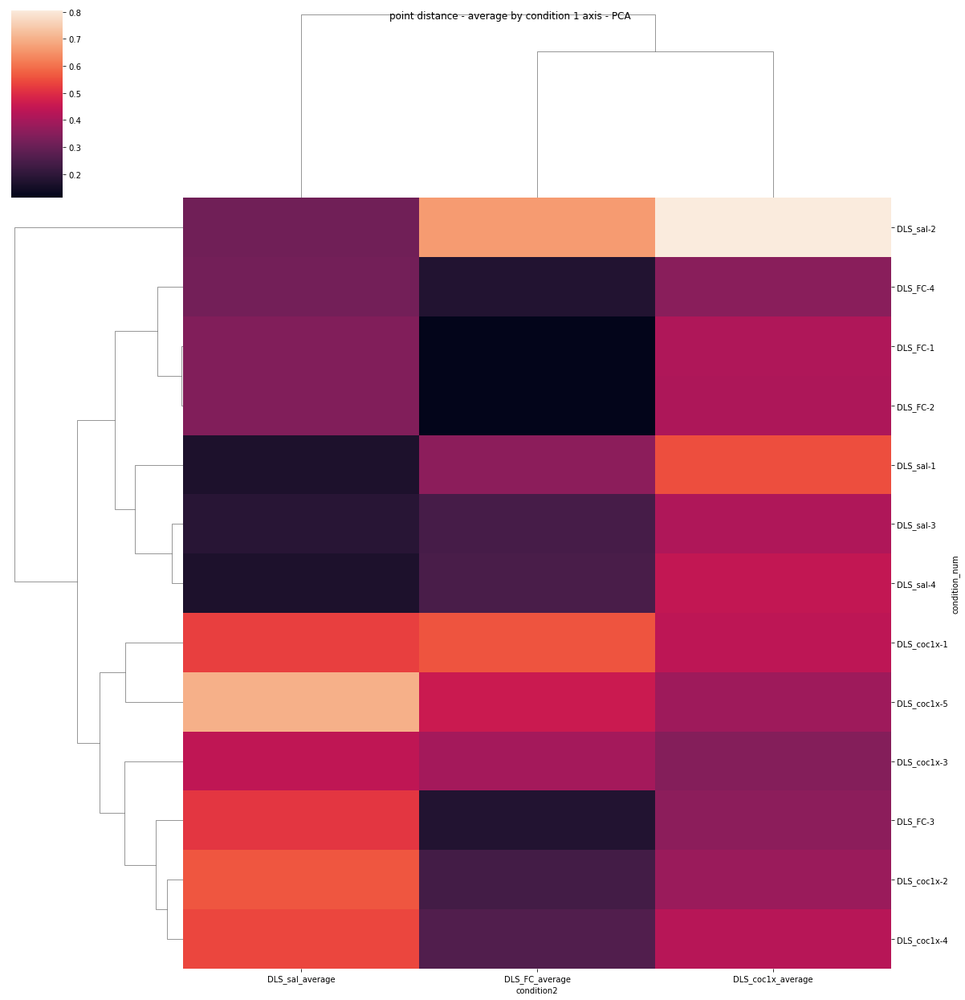

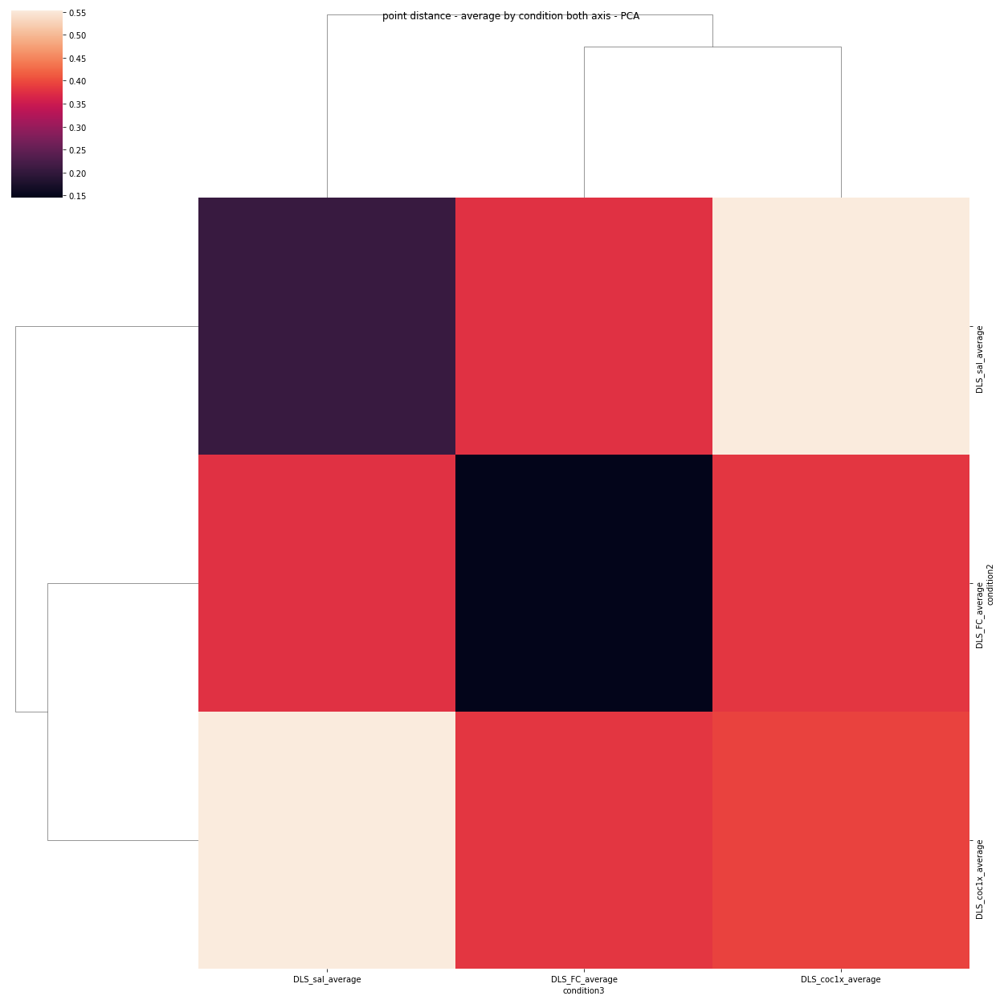

In [110]:
pca_dist=pca_distance(X_scaled,labels)
heatmapdf = pd.DataFrame(pca_dist,index=condition_nums,columns=condition_nums)
cm = sns.clustermap(heatmapdf,yticklabels=True)
cm.fig.suptitle("PCA relative distance")
cm.fig.set_size_inches(18, 18)
plt.show()
distance_to_other_points(pca_dist,labels,condition_nums,' - PCA') # pca 

### UMAP

Changed n_neighbors because the default (15) is larger than the dataset size

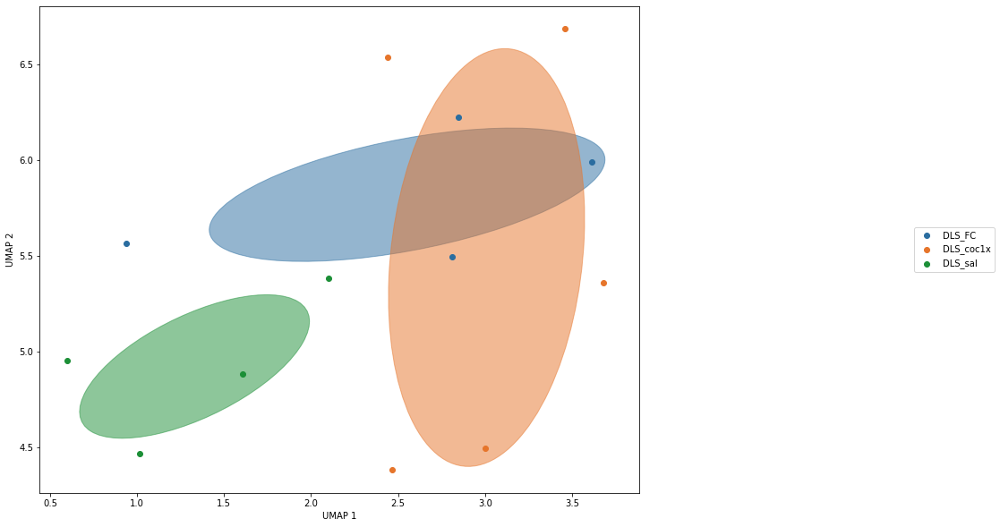

C:\Users\Kat\anaconda3\lib\site-packages\seaborn\matrix.py:619: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  linkage = hierarchy.linkage(self.array, method=self.method,


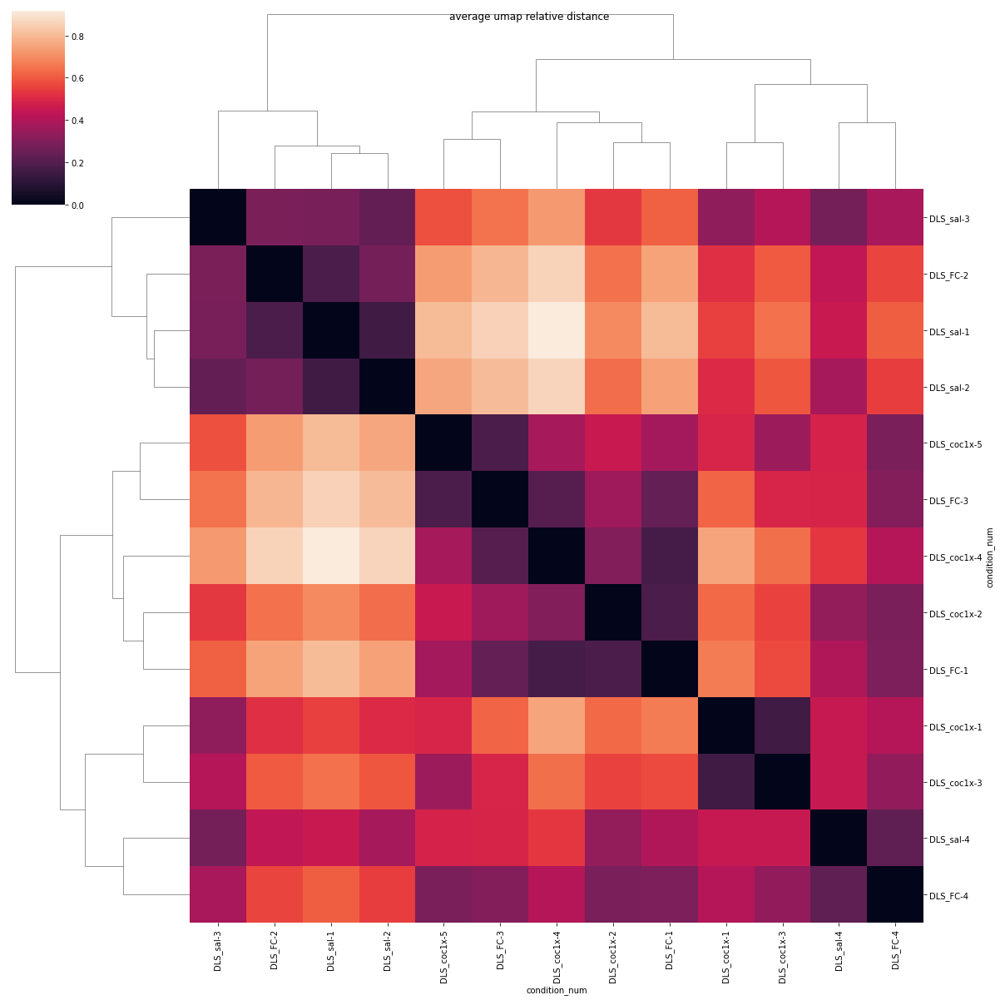

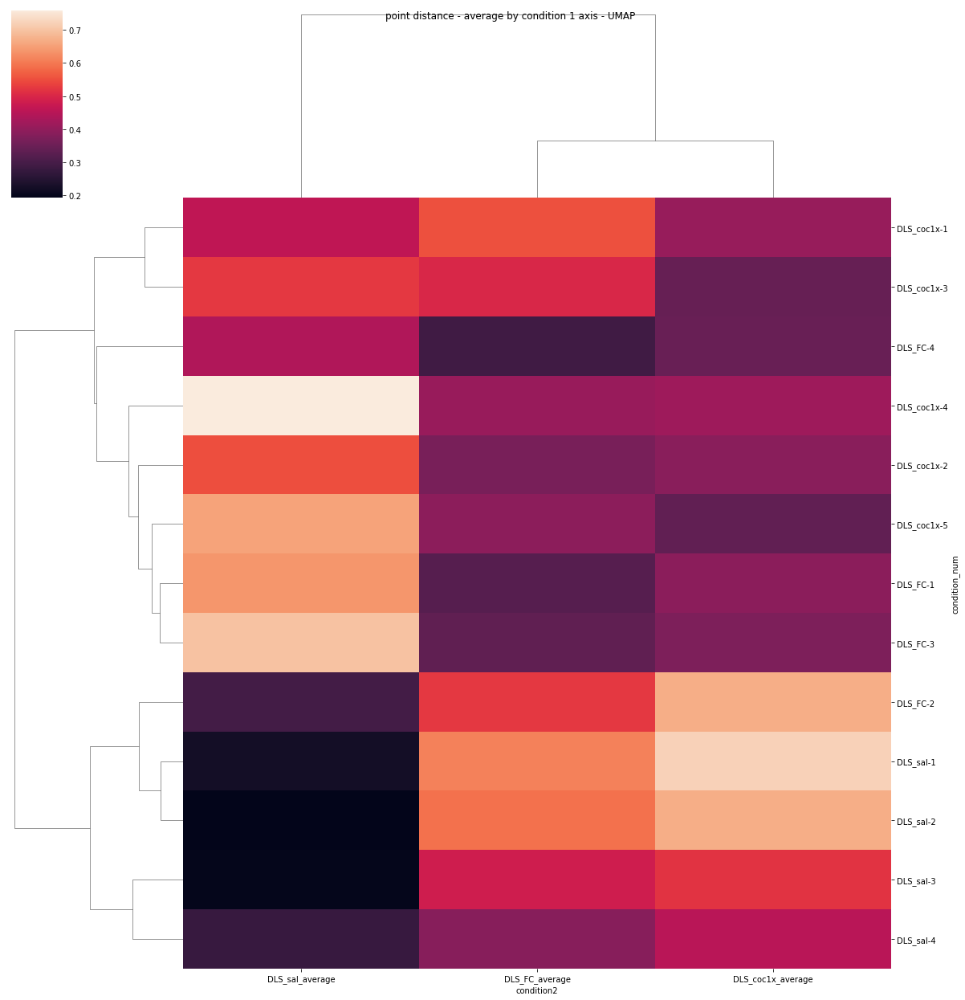

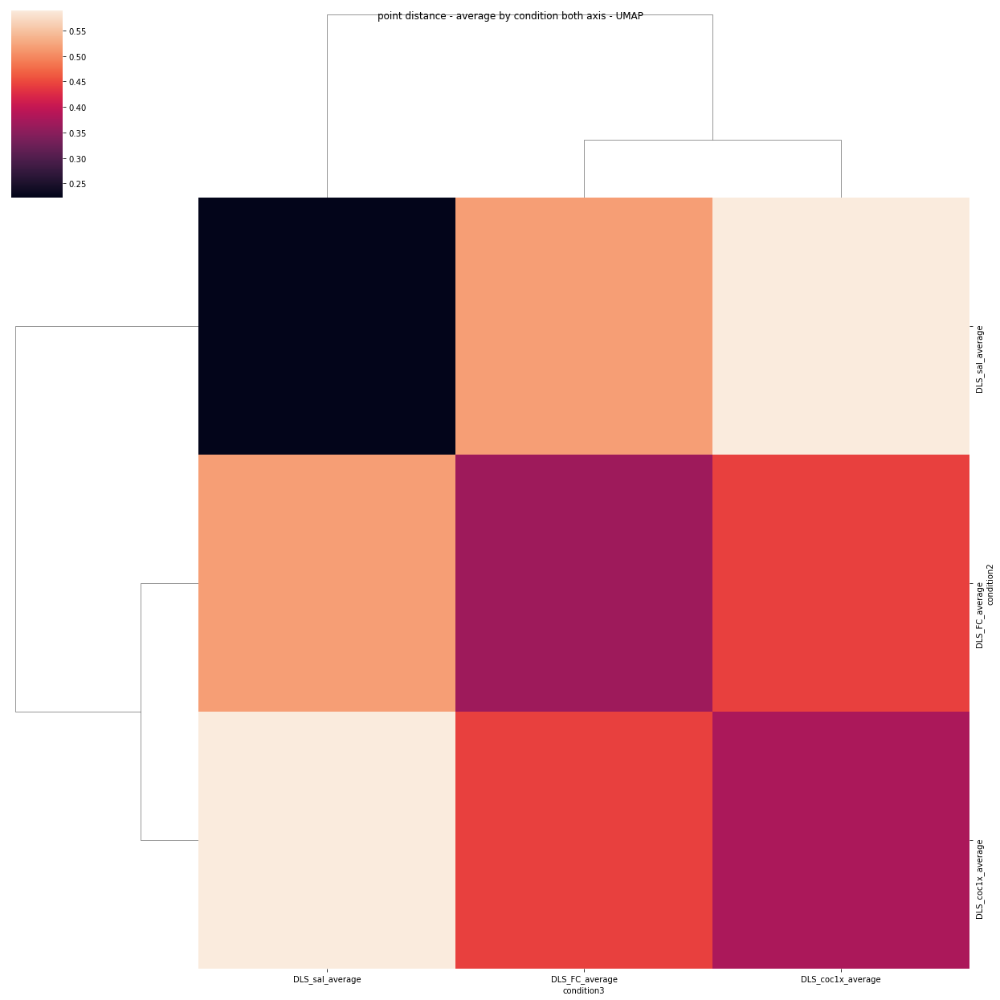

In [111]:
umap_and_heatmap(X_scaled,labels,condition_nums,grouped_elipse='no',figname1='figures/note0-in107-1.svg',figname2='figures/note0-in107-2.svg',figname3='figures/note0-in107-3.svg',figname4='figures/note0-in107-4.svg')

# DLS 
# No FC condition (below)

In [112]:
DLS_data2=DLS_data[(DLS_data["condition"] == 'DLS_sal') |
                (DLS_data["condition"] == 'DLS_coc1x')]
features, labels, condition_nums,regions= get_feats_and_labels(DLS_data2)
features_DLS, labels_DLS, condition_nums_DLS,regions_DLS= get_feats_and_labels(DLS_data2)

In [113]:
#scale X 
X=features.to_numpy().astype(float)
#get rid of NAs before scaling
X_scaled=zscore(X,axis=0)
#can change n_components to more if you want to visualize in 3D 
pca = PCA(n_components=5)
#PCA using the scaled drug data array made earlier
principalComponents = pca.fit_transform(X_scaled)
#make into dataframe if you want to view with labels
principalDf = pd.DataFrame(data = principalComponents
             , columns = ['principal component 1', 'principal component 2', 'principal component 3', 'principal component 4', 'principal component 5'])
region_components=pd.DataFrame(data = pca.components_ , columns = regions)
#view df
print('Explained variance for each PC: 1, 2, 3')
print(pca.explained_variance_)
principalDf

Explained variance for each PC: 1, 2, 3
[8.9847665  7.0033718  2.70453728 2.59173426 1.46450126]


,principal component 1,principal component 2,principal component 3,principal component 4,principal component 5
0,2.381875,-0.753118,-0.377836,-1.563145,2.113494
1,5.646907,-0.508391,1.809381,-0.487766,-1.354492
2,0.470221,0.150306,0.203734,-0.910409,0.527126
3,1.126930,-0.525734,-0.932844,1.122055,-0.854352
4,0.156413,4.312655,-1.296360,0.810455,1.062027
5,-3.125448,-3.361169,-1.849076,-2.099492,-0.816895
6,-0.703507,2.360707,-1.495606,0.968807,-1.347484
7,-1.424776,-3.840103,0.916883,3.032909,0.869591
8,-4.528616,2.164847,3.021726,-0.873415,-0.199016


### PCA Plots

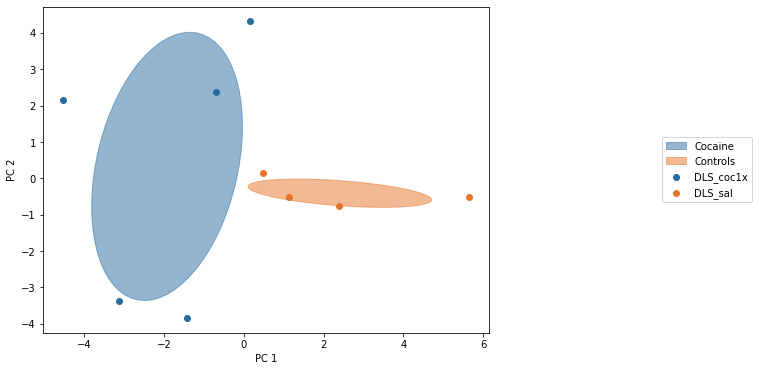

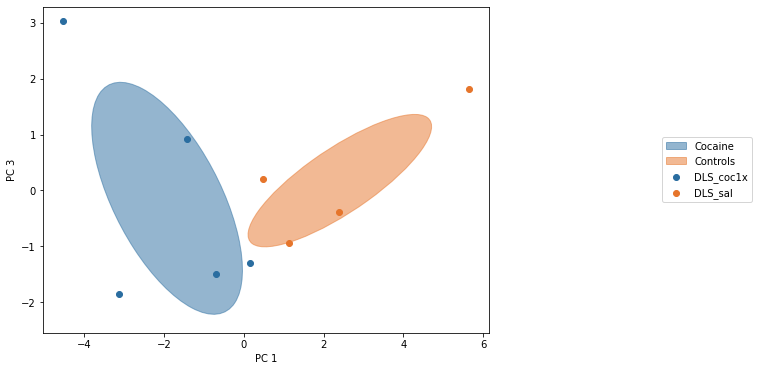

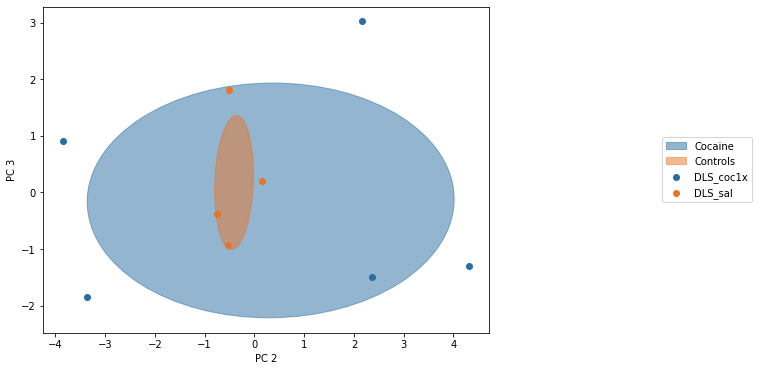

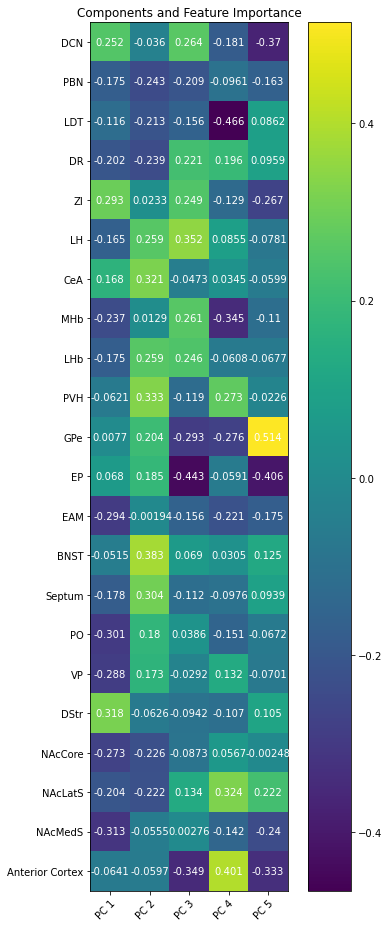

In [114]:
pc1=principalDf['principal component 1']
pc2=principalDf['principal component 2']
pc3=principalDf['principal component 3']
group = condition_nums 
make_pca_plots(pc1,pc2,pc3,group,labels,figname1='figures/note0-in110-1.svg',figname2='figures/note0-in110-2.svg',figname3='figures/note0-in110-3.svg')
plot_components(region_components,figname4='figures/note0-in110-4.svg')

C:\Users\Kat\anaconda3\lib\site-packages\seaborn\matrix.py:619: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  linkage = hierarchy.linkage(self.array, method=self.method,


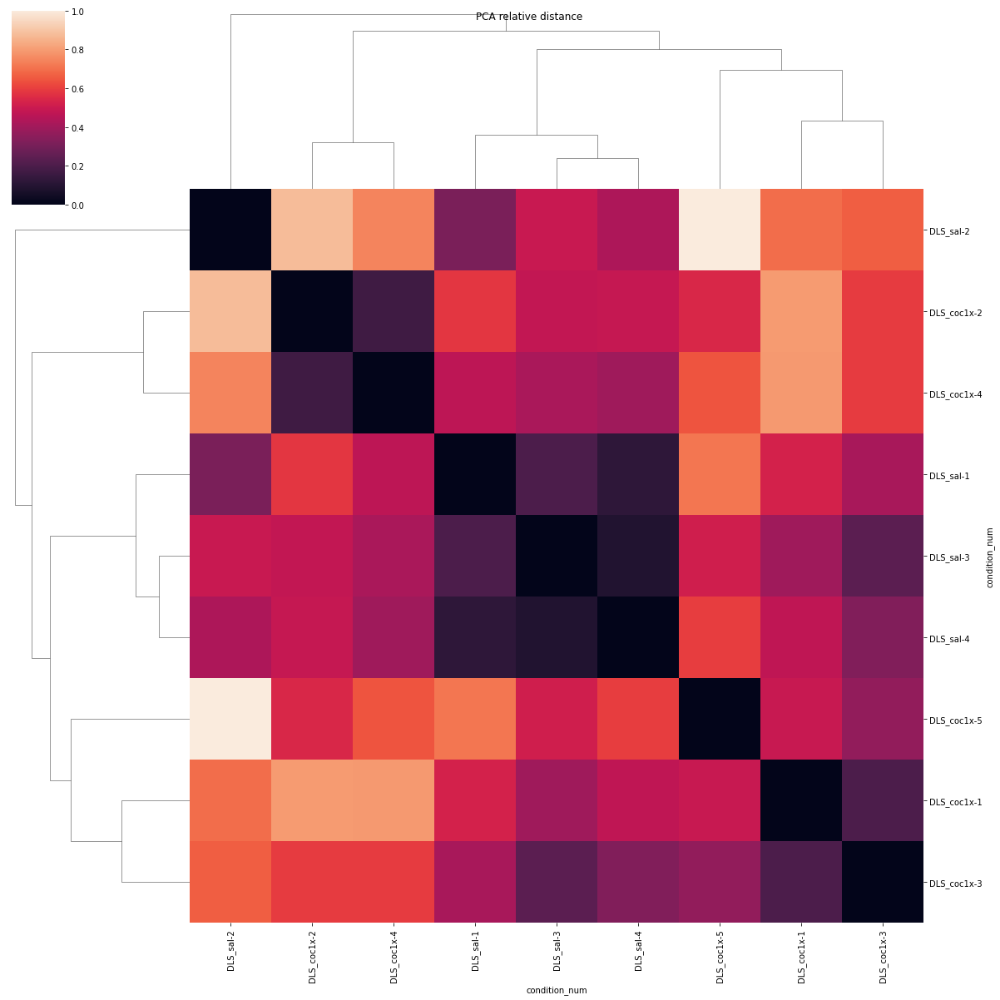

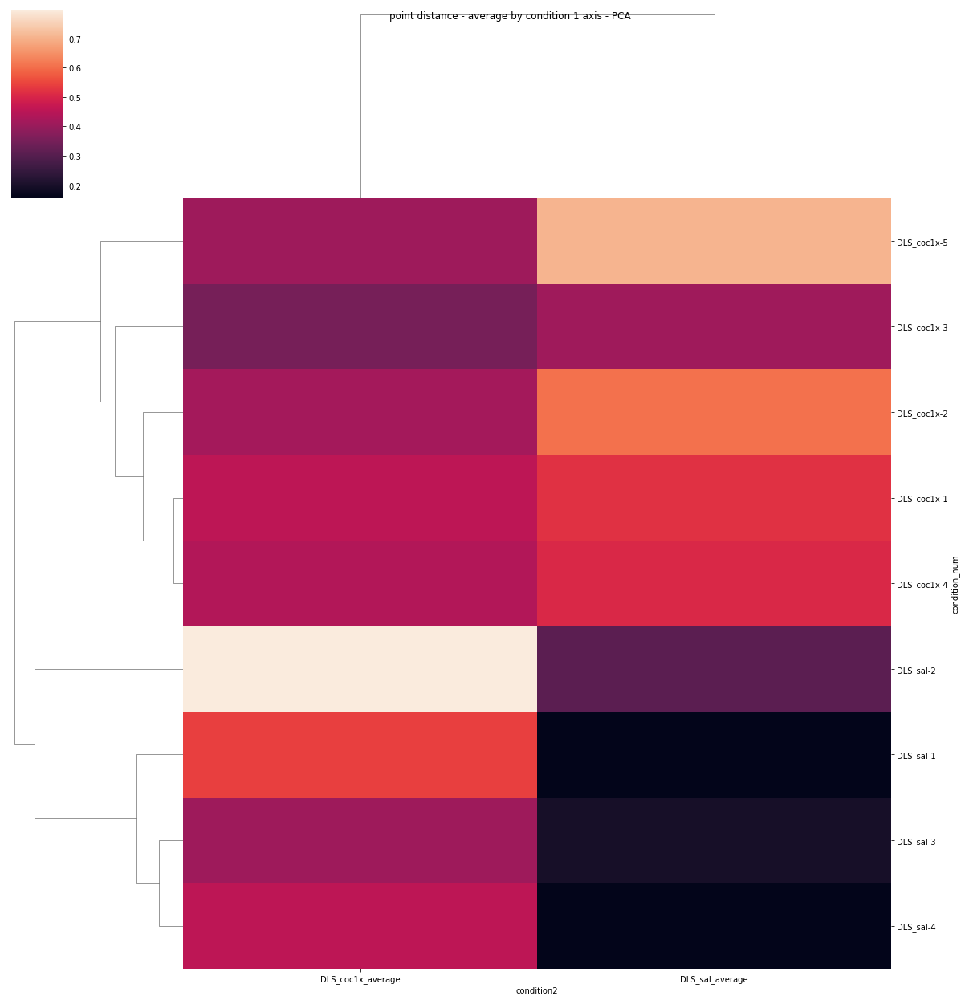

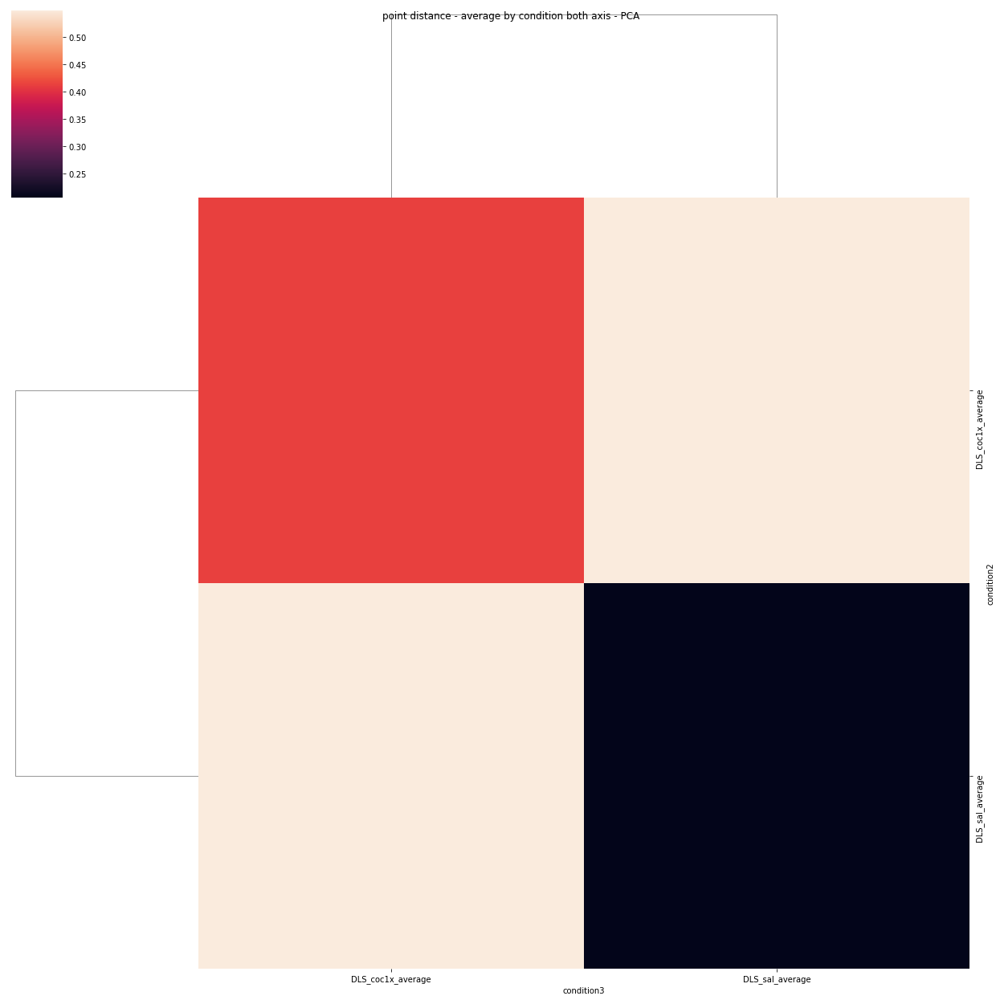

In [115]:
pca_dist=pca_distance(X_scaled,labels)
heatmapdf = pd.DataFrame(pca_dist,index=condition_nums,columns=condition_nums)
cm = sns.clustermap(heatmapdf,yticklabels=True)
cm.fig.suptitle("PCA relative distance")
cm.fig.set_size_inches(18, 18)
plt.show()
distance_to_other_points(pca_dist,labels,condition_nums,' - PCA') # pca 

### UMAP

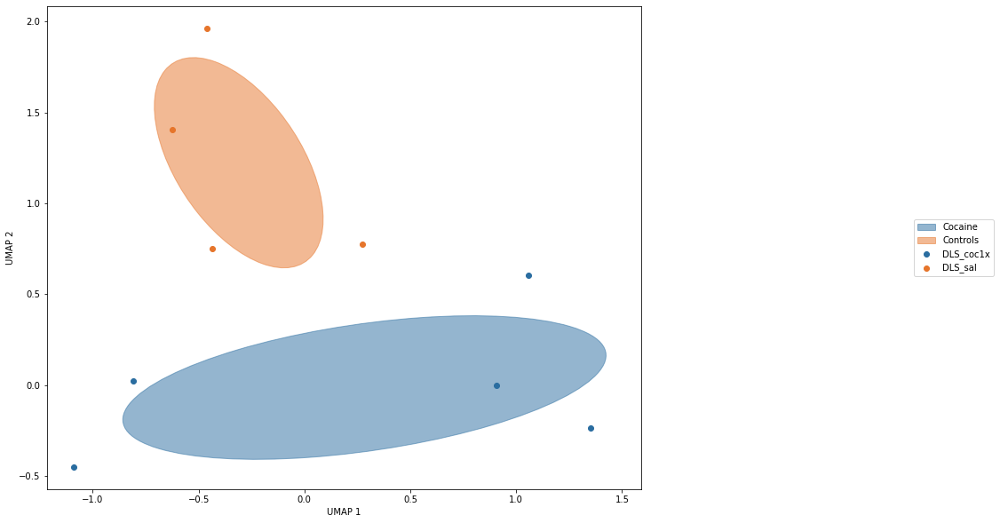

C:\Users\Kat\anaconda3\lib\site-packages\seaborn\matrix.py:619: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  linkage = hierarchy.linkage(self.array, method=self.method,


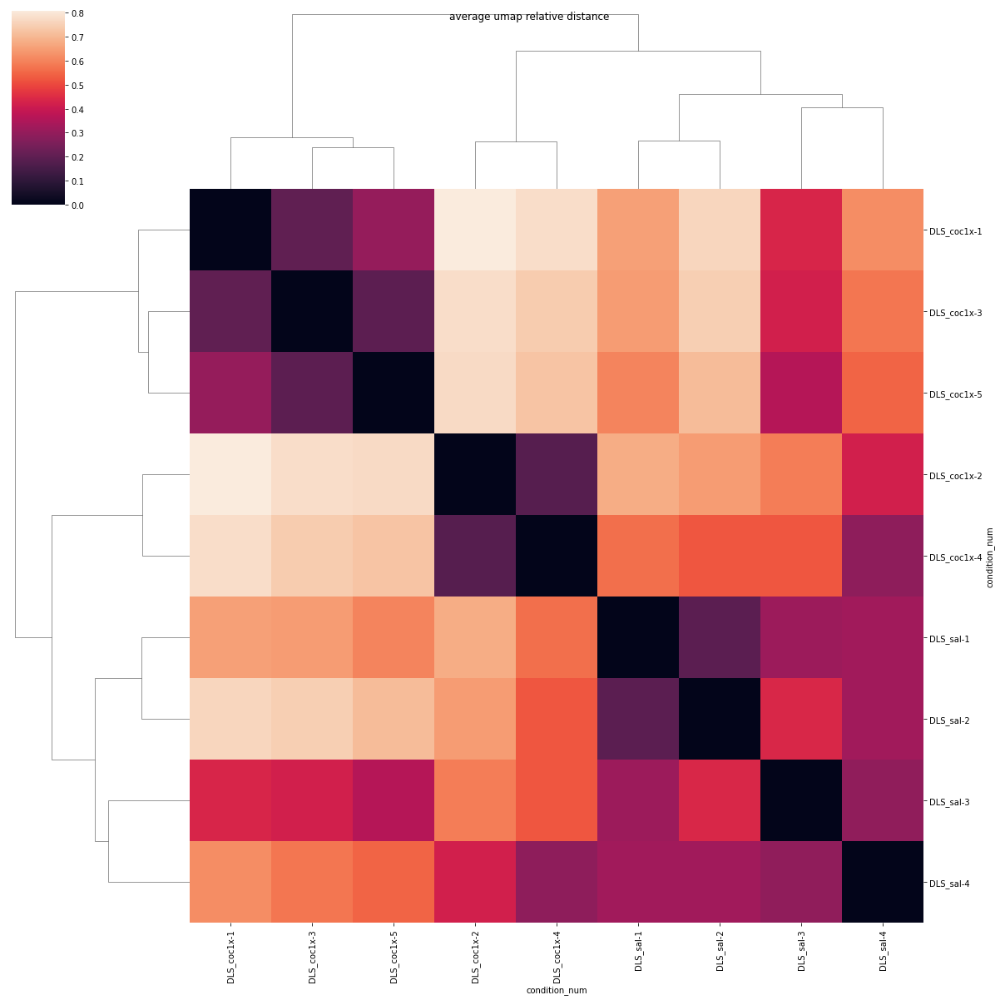

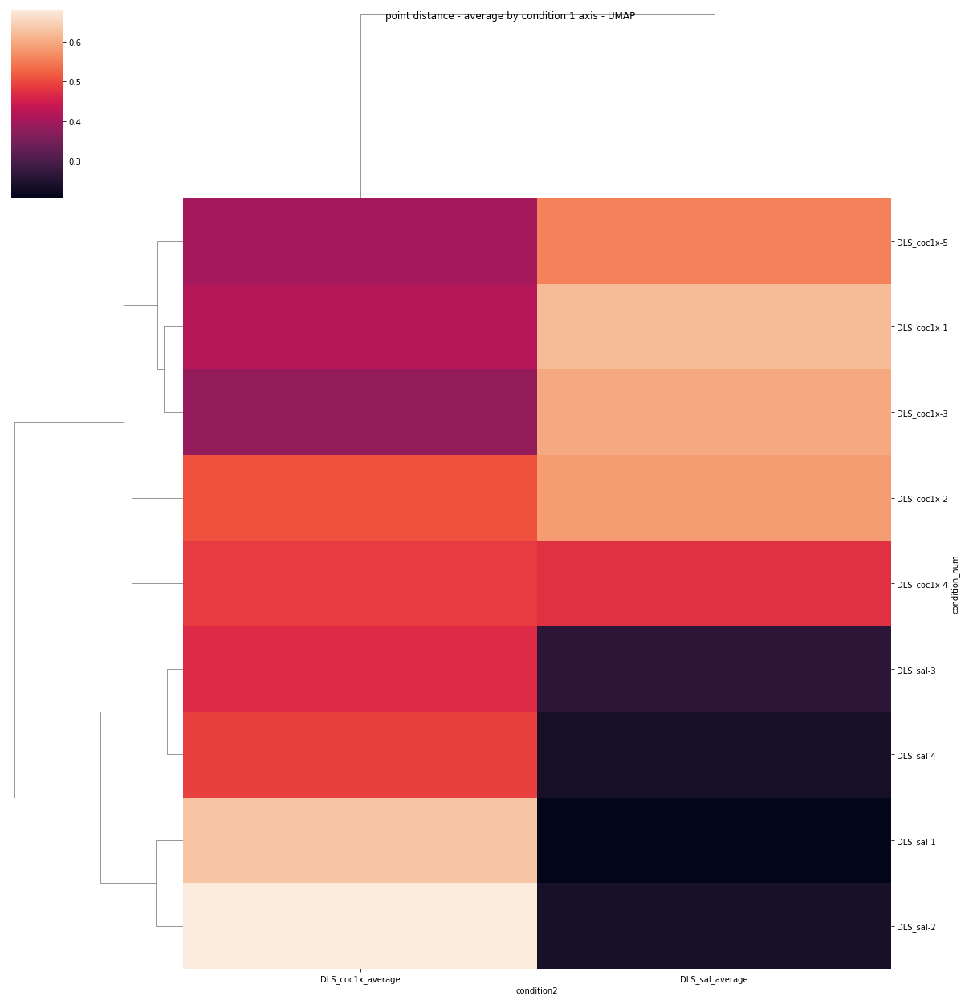

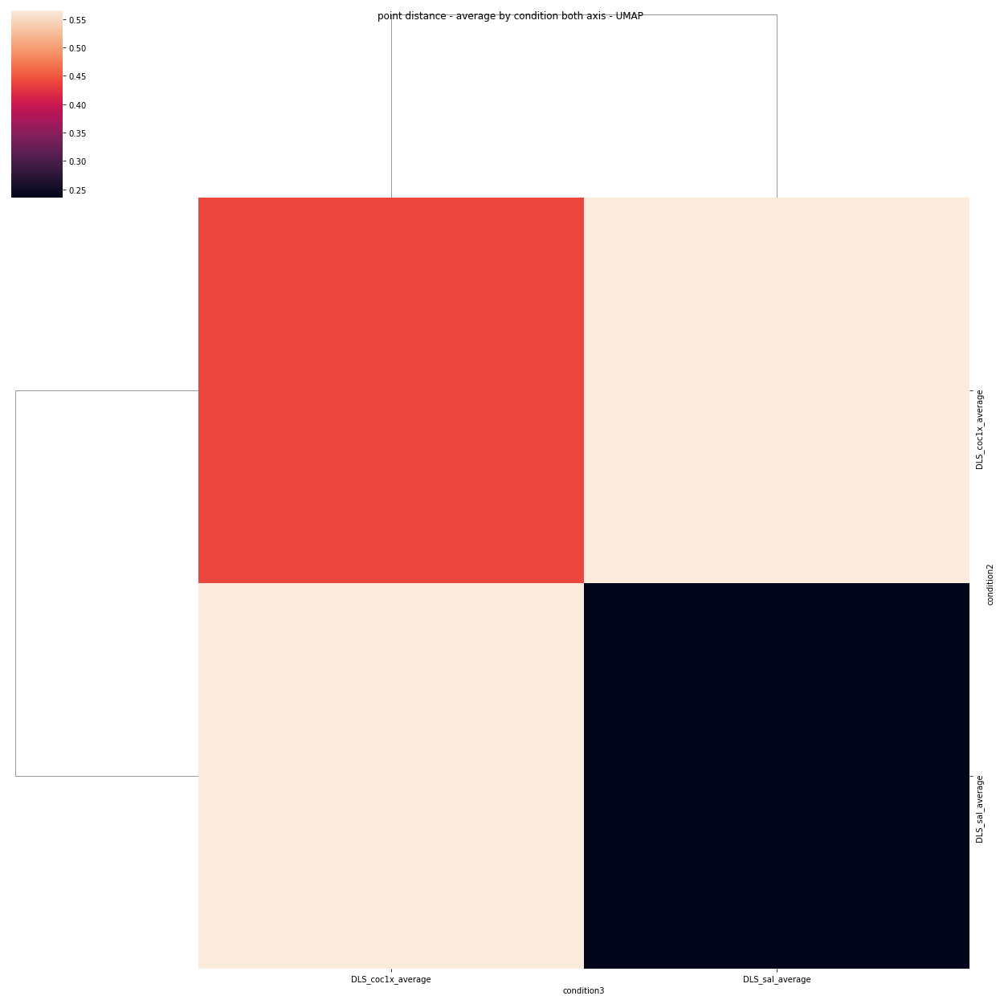

In [116]:
umap_and_heatmap(X_scaled,labels,condition_nums,figname1='figures/note0-in112-1.svg',figname2='figures/note0-in112-2.svg',figname3='figures/note0-in112-3.svg',figname4='figures/note0-in112-4.svg')

# Amygdala (below)

In [117]:
def get_feats_and_labels(dataframe):
    labels=dataframe['condition']
    condition_nums=dataframe['condition_num']
    features=dataframe.iloc[: , 2:24]
    if scrambled == 'yes':
        features = features.sample(frac=1).reset_index(drop=True)
    regions=features.columns
    return features, labels, condition_nums, regions

In [118]:
Amyg_data.reset_index(inplace=True)
features, labels, condition_nums, regions = get_feats_and_labels(Amyg_data) 

In [120]:
#scale X 
X=features.to_numpy().astype(float)
#get rid of NAs before scaling

X_scaled=zscore(X,axis=0)

In [121]:
#can change n_components to more if you want to visualize in 3D 
pca = PCA(n_components=5)
#PCA using the scaled drug data array made earlier
principalComponents = pca.fit_transform(X_scaled)
#make into dataframe if you want to view with labels
principalDf = pd.DataFrame(data = principalComponents
             , columns = ['principal component 1', 'principal component 2', 'principal component 3', 'principal component 4', 'principal component 5'])
region_components=pd.DataFrame(data = pca.components_ , columns = regions)
#view df
print('Explained variance for each PC: 1, 2, 3')
print(pca.explained_variance_)
principalDf

Explained variance for each PC: 1, 2, 3
[5.51084943 3.7800607  3.10961379 2.05988486 1.65382321]


,principal component 1,principal component 2,principal component 3,principal component 4,principal component 5
0,-0.749293,-0.576455,0.092155,0.152786,-2.006033
1,2.440548,0.536622,-0.798100,1.382329,0.067629
2,-1.395058,0.684183,-0.981201,-0.492819,-0.426570
3,0.747512,4.520859,0.905546,1.670534,-0.098913
4,0.648797,1.922959,-0.578102,-1.229573,-1.837835
5,-1.332214,0.579342,0.272174,-0.037775,-0.040080
6,-0.760834,-1.313626,-3.854648,-1.885600,0.407842
7,5.676035,-0.593576,-0.390380,-1.580334,-1.520466
8,-3.756886,-0.549037,-1.953657,0.140532,0.324646
9,2.336437,1.031972,-0.230730,-0.958657,1.439296


### PCA plots

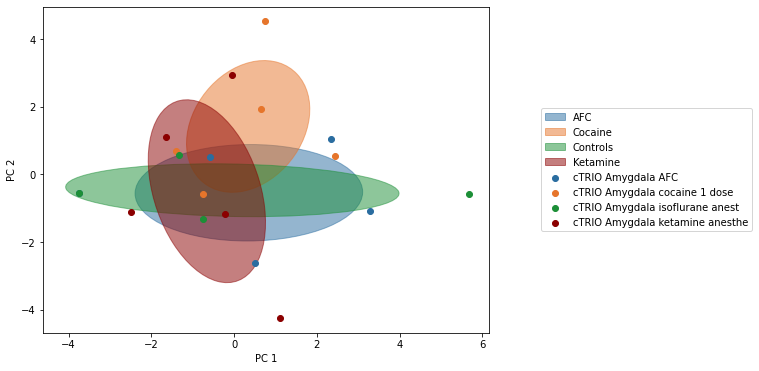

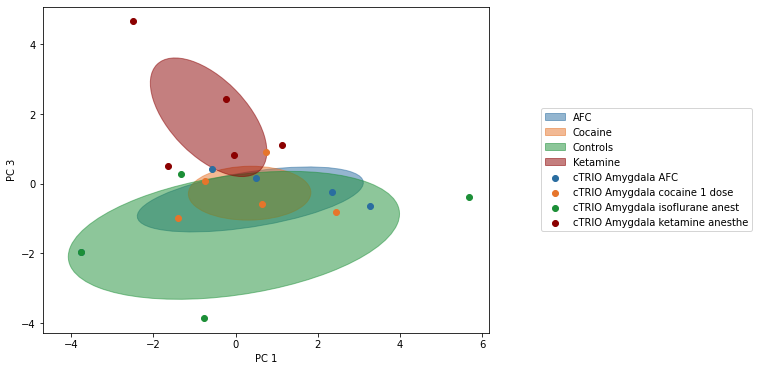

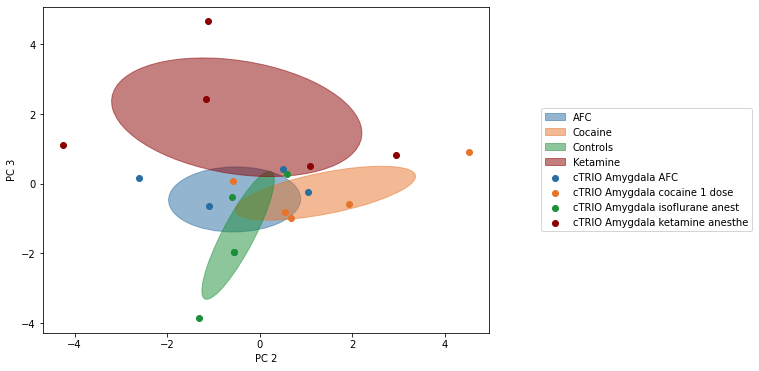

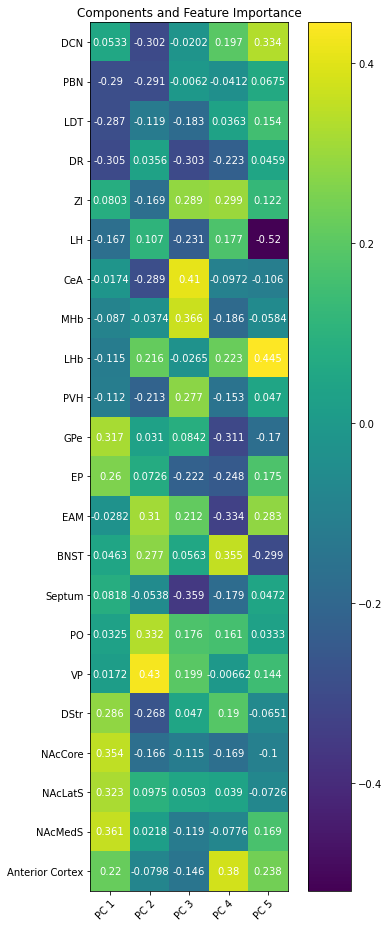

In [122]:
pc1=principalDf['principal component 1']
pc2=principalDf['principal component 2']
pc3=principalDf['principal component 3']
group = condition_nums 
make_pca_plots(pc1,pc2,pc3,group,labels,figname1='figures/note0-in117-1.svg',figname2='figures/note0-in117-2.svg',figname3='figures/note0-in117-3.svg')
plot_components(region_components,figname4='figures/note0-in117-4.svg')

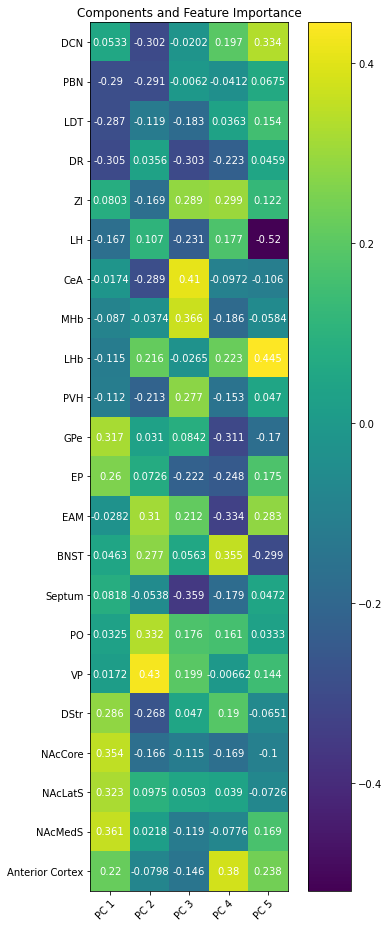

In [123]:
plot_components(region_components,figname4='figures/fig4amygb_note0in118.svg')

C:\Users\Kat\anaconda3\lib\site-packages\seaborn\matrix.py:619: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  linkage = hierarchy.linkage(self.array, method=self.method,


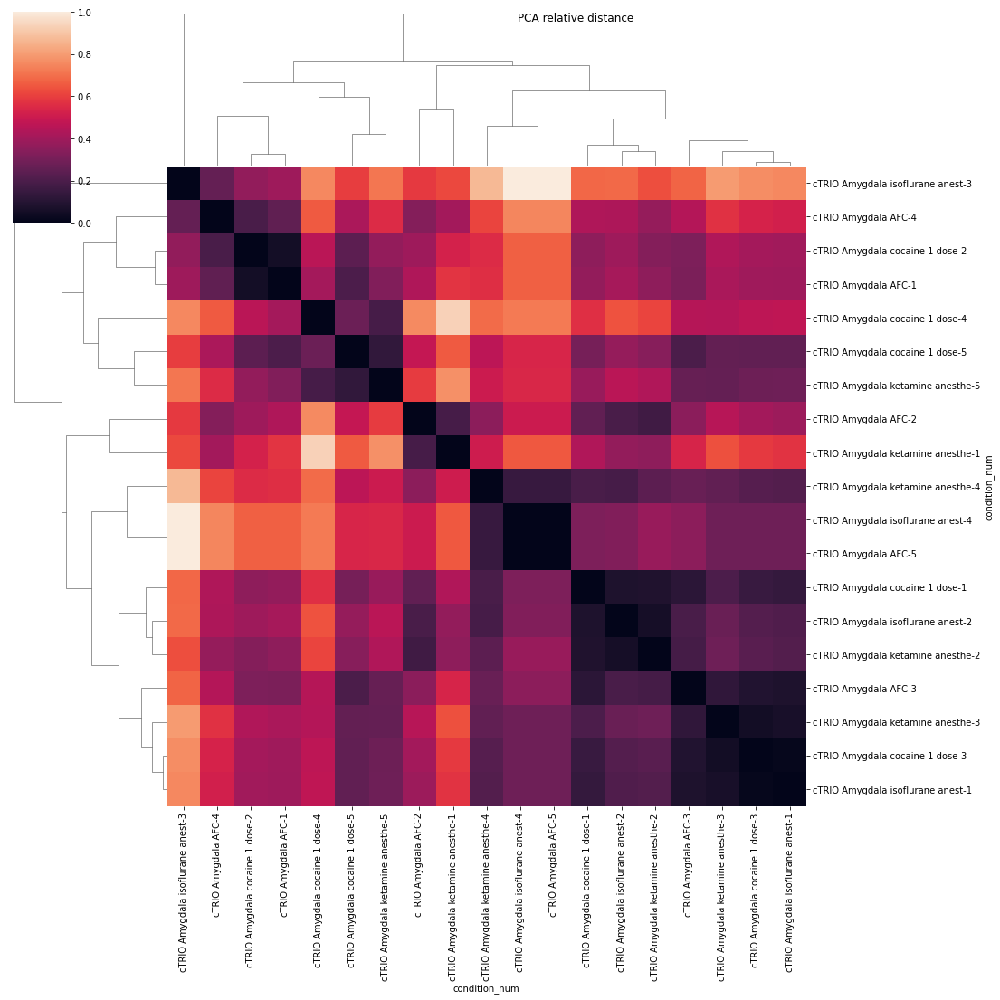

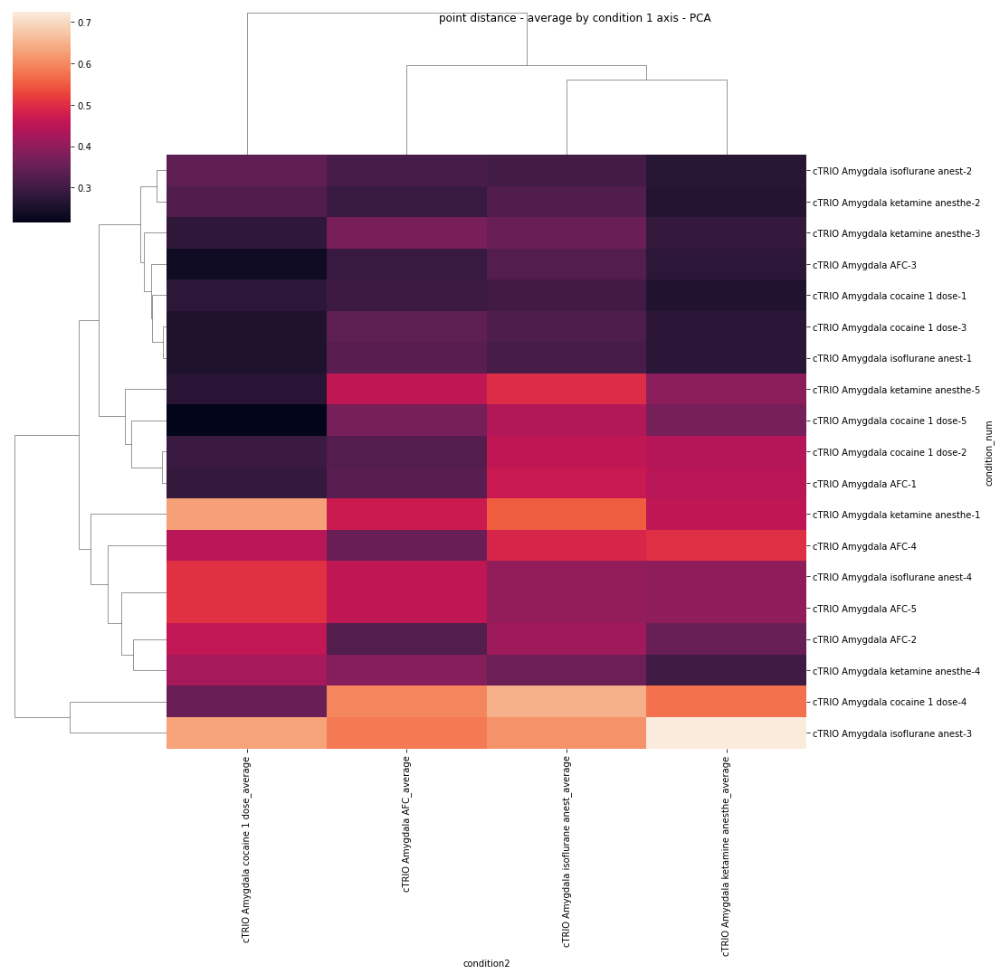

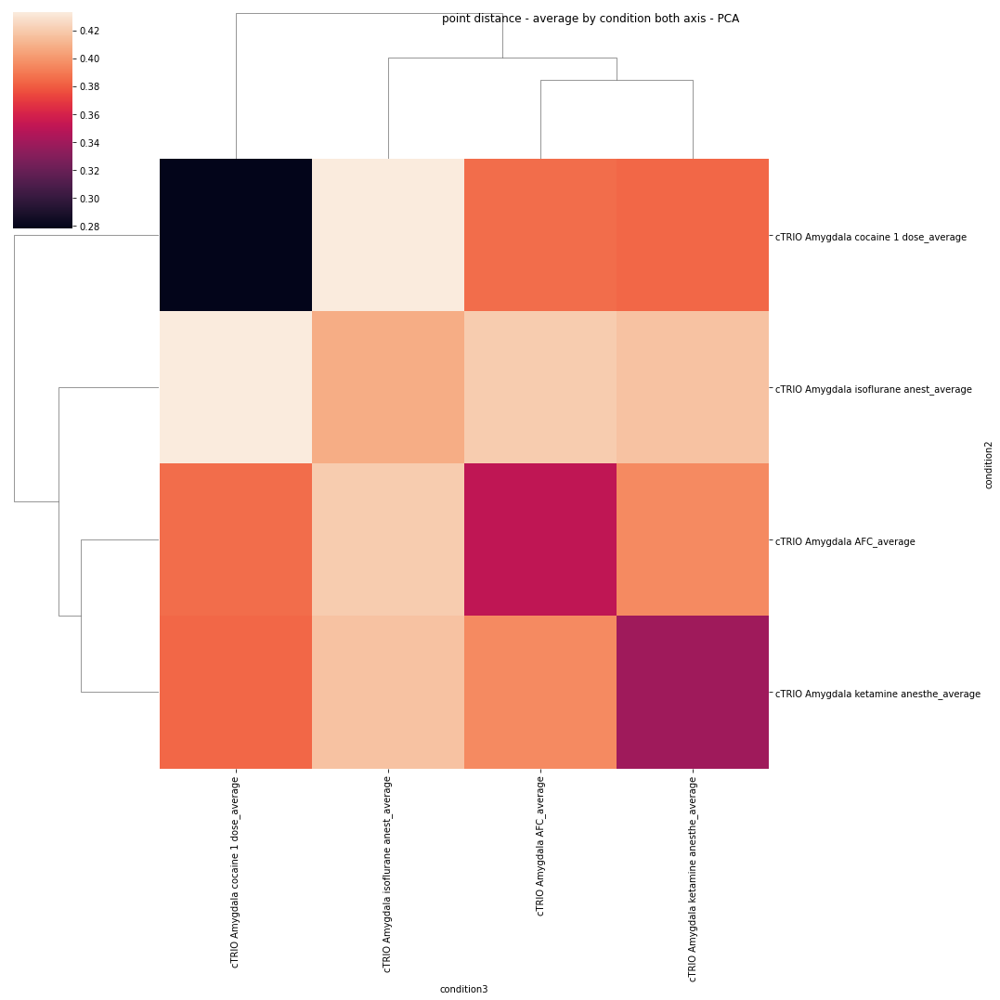

In [124]:
pca_dist=pca_distance(X_scaled,labels)
heatmapdf = pd.DataFrame(pca_dist,index=condition_nums,columns=condition_nums)
cm = sns.clustermap(heatmapdf,yticklabels=True)
cm.fig.suptitle("PCA relative distance")
cm.fig.set_size_inches(18, 18)
plt.show()
distance_to_other_points(pca_dist,labels,condition_nums,' - PCA') # pca 

### UMAP

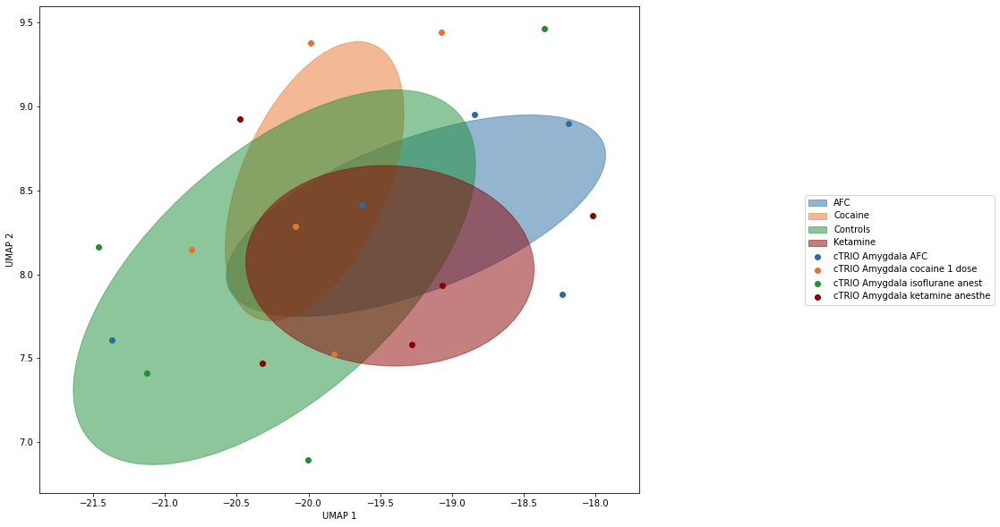

C:\Users\Kat\anaconda3\lib\site-packages\seaborn\matrix.py:619: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  linkage = hierarchy.linkage(self.array, method=self.method,


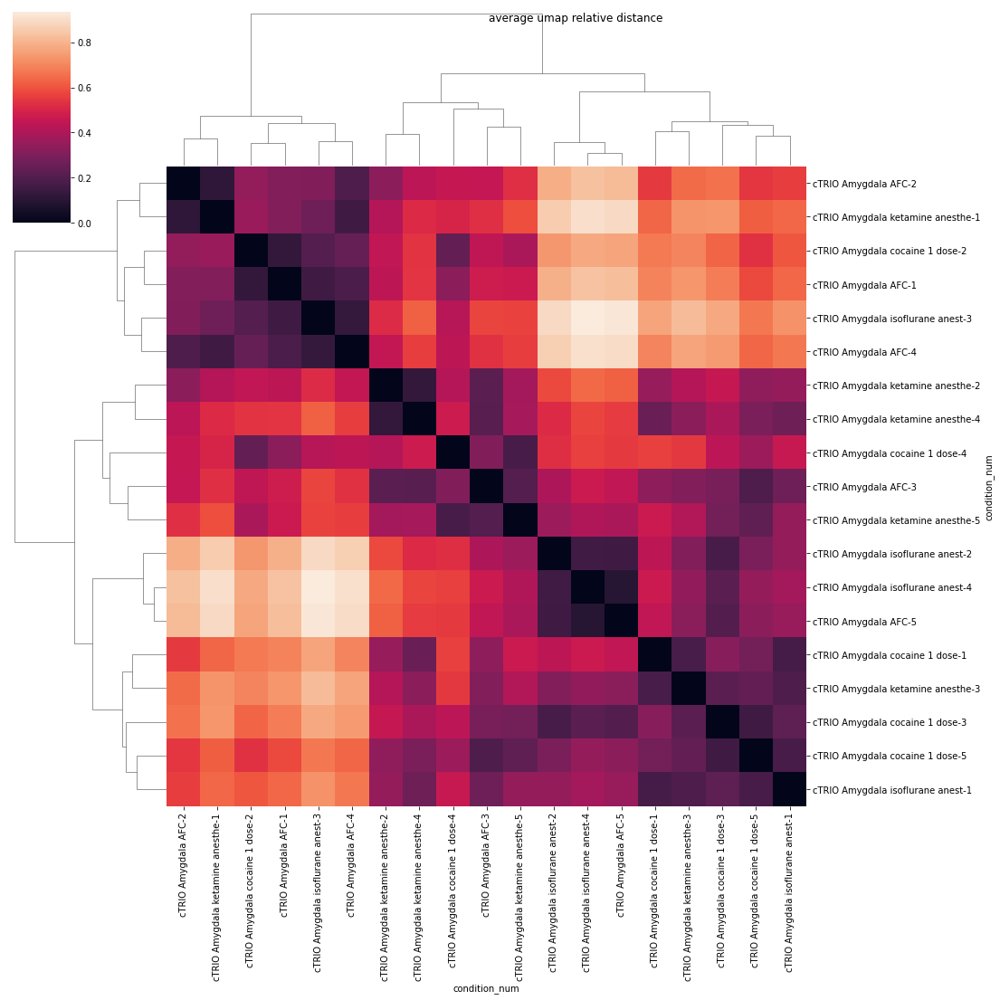

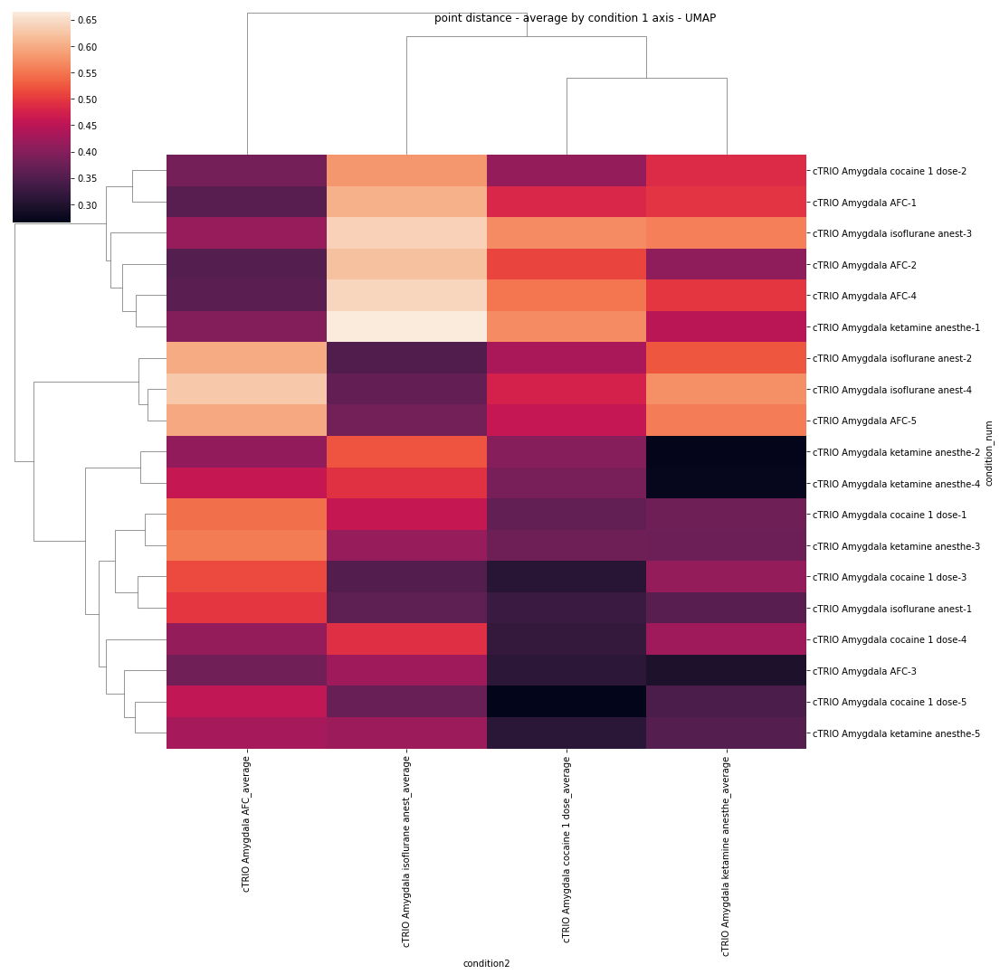

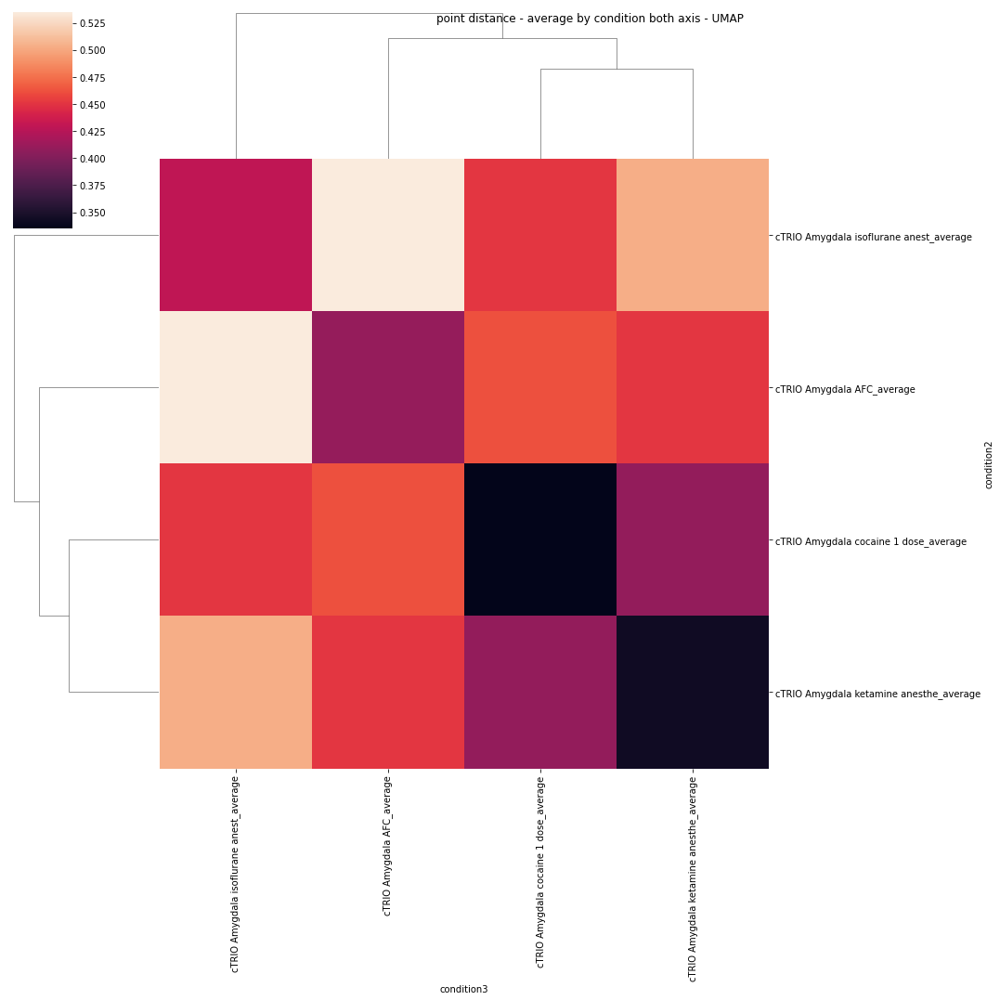

In [125]:
umap_and_heatmap(X_scaled,labels,condition_nums,figname1='figures/fig4amygc_note0in120.svg',figname4='figures/fig4amygd_note0in120.svg')

# Amygdala - cocaine versus saline PCA only

Explained variance for each PC: 1, 2, 3
[8.11092541 5.74917146 3.43474246 2.67588655 2.27703256]


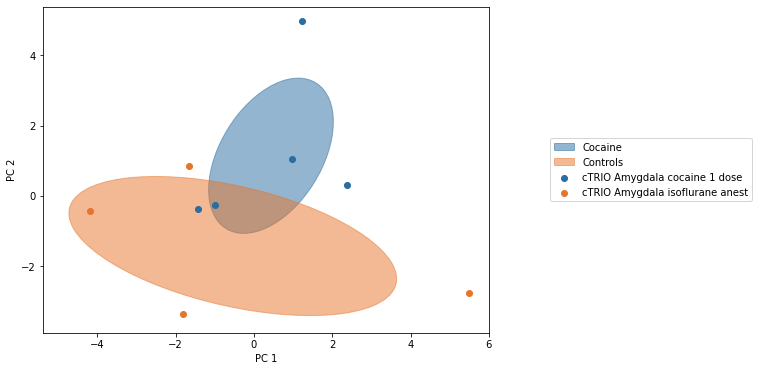

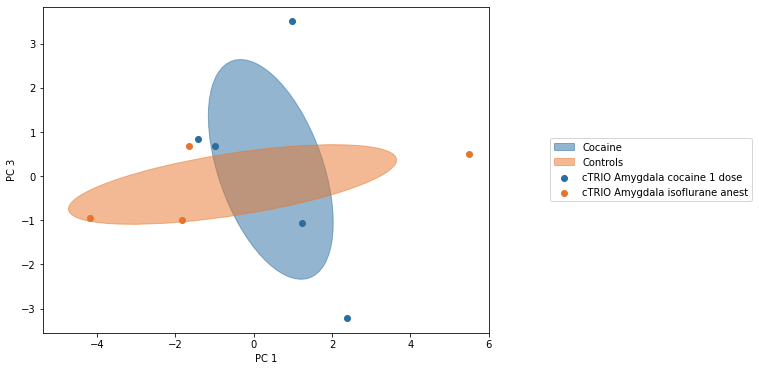

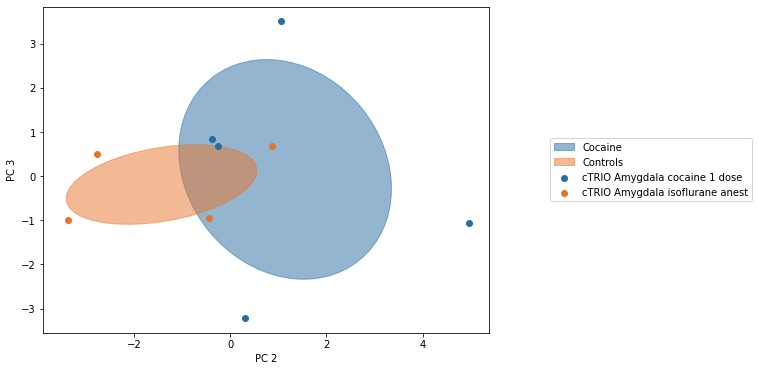

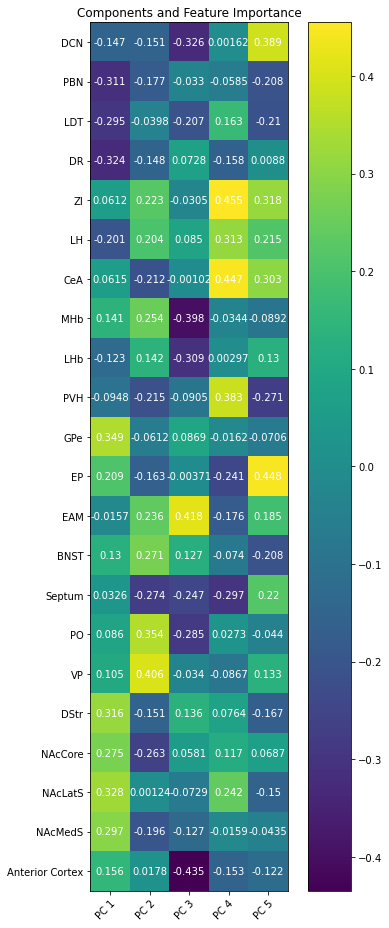

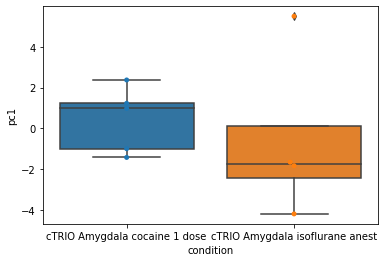

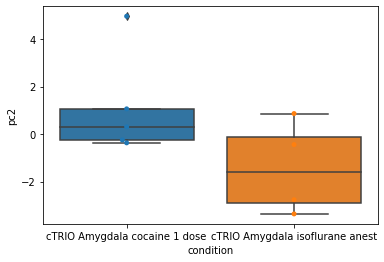

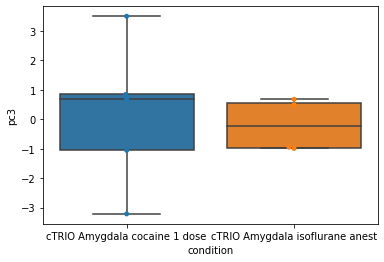

In [130]:
Amyg_data2=Amyg_data[(Amyg_data["condition"] == 'cTRIO Amygdala cocaine 1 dose') |
                (Amyg_data["condition"] == 'cTRIO Amygdala isoflurane anest')]
features, labels, condition_nums, regions =get_feats_and_labels(Amyg_data2)  
X=features.to_numpy( dtype=np.float64)
#get rid of NAs before scaling
X_scaled=zscore(X,axis=0)

#can change n_components to more if you want to visualize in 3D 
pca = PCA(n_components=5)
#PCA using the scaled drug data array made earlier
principalComponents = pca.fit_transform(X_scaled)
#make into dataframe if you want to view with labels
principalDf = pd.DataFrame(data = principalComponents
             , columns = ['principal component 1', 'principal component 2', 'principal component 3', 'principal component 4', 'principal component 5'])
region_components=pd.DataFrame(data = pca.components_ , columns = regions)
#view df
print('Explained variance for each PC: 1, 2, 3')
print(pca.explained_variance_)

pc1=principalDf['principal component 1']
pc2=principalDf['principal component 2']
pc3=principalDf['principal component 3']
group = condition_nums 
make_pca_plots(pc1,pc2,pc3,group,labels,grouped_elipse='yes',figname1='figures/cocaine-v-saline/Amyg-G-pc1.svg',figname2='figures/temp.svg',figname3='figures/temp.svg')
plot_components(region_components,figname4='figures/cocaine-v-saline/Amyg-G-comps.svg')
align_embed= pd.DataFrame({'pc1': pc1.values,'pc2': pc2.values,'pc3': pc3.values},index=labels)
value=align_embed['pc1']
treatments=align_embed.index
ax = sns.boxplot(x=treatments, y=value)
ax = sns.swarmplot(x=treatments, y=value) #4d-NAcLat  4g-Amyg   4j-NAcMed   4m-mPFC
plt.savefig('figures/temp.svg')
plt.show()
value=align_embed['pc2']
ax = sns.boxplot(x=treatments, y=value)
ax = sns.swarmplot(x=treatments, y=value)
plt.savefig('figures/temp.svg')
plt.show()
value=align_embed['pc3']
ax = sns.boxplot(x=treatments, y=value)
ax = sns.swarmplot(x=treatments, y=value)
plt.savefig('figures/temp.svg')
plt.show()

# Amygdala 
# No FC condition (below)

In [131]:
Amyg_data2=Amyg_data[(Amyg_data["condition"] == 'cTRIO Amygdala cocaine 1 dose') |
                (Amyg_data["condition"] == 'cTRIO Amygdala isoflurane anest')| 
                (Amyg_data["condition"] == 'cTRIO Amygdala ketamine anesthe')]
features, labels, condition_nums, regions = get_feats_and_labels(Amyg_data2)

In [132]:
Amyg_data2=Amyg_data[(Amyg_data["condition"] == 'cTRIO Amygdala cocaine 1 dose') |
                (Amyg_data["condition"] == 'cTRIO Amygdala isoflurane anest')]
features_amyg, labels_amyg, condition_nums_amyg, regions_amyg = get_feats_and_labels(Amyg_data2)
print(condition_nums_amyg)
print(len(condition_nums_amyg))

0      cTRIO Amygdala cocaine 1 dose-1
1      cTRIO Amygdala cocaine 1 dose-2
2      cTRIO Amygdala cocaine 1 dose-3
3      cTRIO Amygdala cocaine 1 dose-4
4      cTRIO Amygdala cocaine 1 dose-5
5    cTRIO Amygdala isoflurane anest-1
6    cTRIO Amygdala isoflurane anest-2
7    cTRIO Amygdala isoflurane anest-3
8    cTRIO Amygdala isoflurane anest-4
Name: condition_num, dtype: object
9


In [133]:
#scale X 
X=features.to_numpy().astype(float)
#get rid of NAs before scaling

X_scaled=zscore(X,axis=0)

In [134]:
#can change n_components to more if you want to visualize in 3D 
pca = PCA(n_components=5)
#PCA using the scaled drug data array made earlier
principalComponents = pca.fit_transform(X_scaled)
#make into dataframe if you want to view with labels
principalDf = pd.DataFrame(data = principalComponents
             , columns = ['principal component 1', 'principal component 2', 'principal component 3', 'principal component 4', 'principal component 5'])
region_components=pd.DataFrame(data = pca.components_ , columns = regions)
#view df
print('Explained variance for each PC: 1, 2, 3')
print(pca.explained_variance_)
principalDf

Explained variance for each PC: 1, 2, 3
[5.57047139 4.25849395 3.54234214 2.44856641 2.00648852]


,principal component 1,principal component 2,principal component 3,principal component 4,principal component 5
0,-0.583538,0.534392,0.247840,0.390421,-1.724309
1,2.663756,0.132056,0.343634,1.385985,0.250088
2,-1.067226,-0.874417,1.255234,-0.324280,-0.195761
3,1.804941,-3.793779,-1.518216,0.798484,0.200195
4,1.395584,-1.834518,0.495349,-1.362964,-1.465668
5,-0.972412,-0.679424,0.336154,-0.243050,0.422304
6,-0.415180,0.900405,4.543227,-1.145954,1.263268
7,5.721605,2.025056,-0.021193,-1.596597,-0.794727
8,-3.430066,-0.474906,2.184327,0.602329,-0.255611
9,-0.092570,4.492766,-0.960092,2.951303,0.766436


### PCA Plots

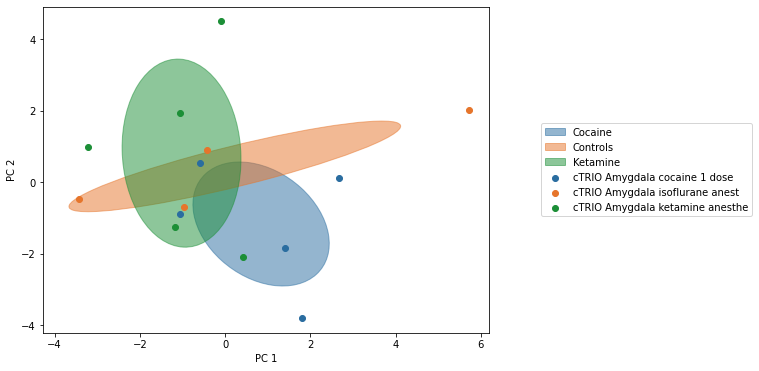

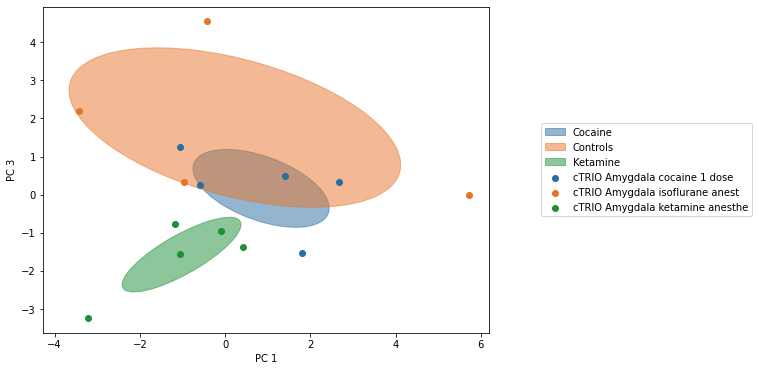

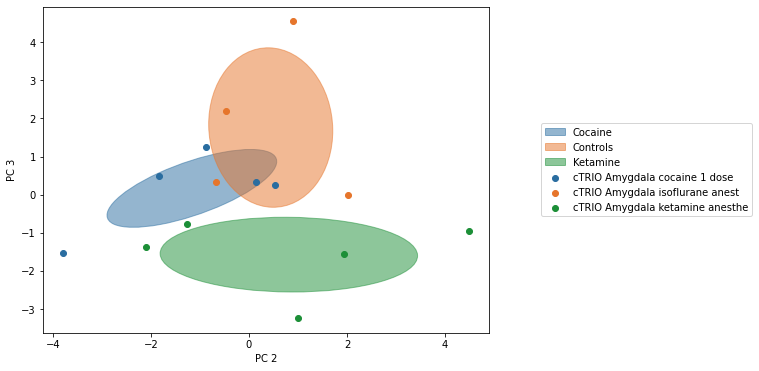

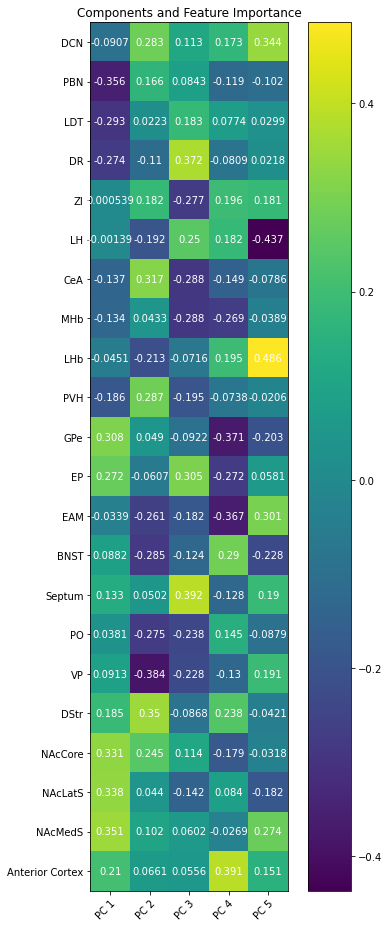

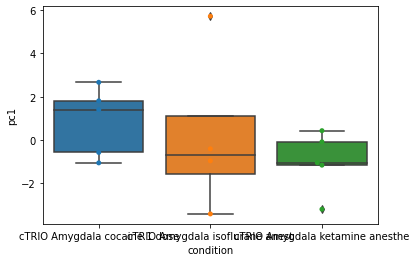

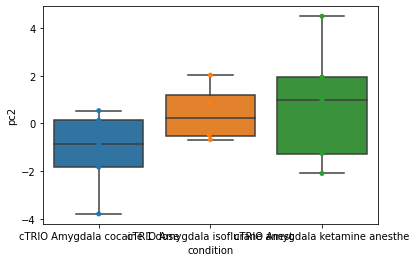

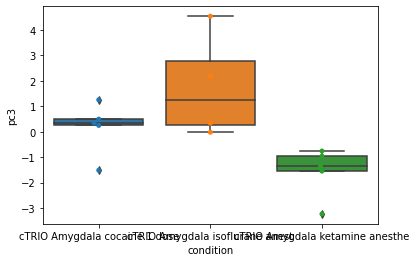

C:\Users\Kat\anaconda3\lib\site-packages\bioinfokit\analys.py:421: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  mult_group[ele] = df[df[xfac_var] == ele].mean().loc[res_var]


In [135]:
pc1=principalDf['principal component 1']
pc2=principalDf['principal component 2']
pc3=principalDf['principal component 3']
group = condition_nums 
make_pca_plots(pc1,pc2,pc3,group,labels,figname1='figures/PCA-stats/PC2-3_figure4/Amygd1.svg',figname2='figures/PCA-stats/PC2-3_figure4/Amygd2.svg',figname3='figures/PCA-stats/PC2-3_figure4/Amygd3.svg')
plot_components(region_components,figname4='figures/note0-in125-4.svg')
align_embed= pd.DataFrame({'pc1': pc1.values,'pc2': pc2.values,'pc3': pc3.values},index=labels)
value=align_embed['pc1']
treatments=align_embed.index
ax = sns.boxplot(x=treatments, y=value)
ax = sns.swarmplot(x=treatments, y=value) #  4g-Amyg      4m-mPFC
plt.savefig('figures/PCA-stats/figure 4/4g-Amyg-PC1-boxplot.svg')
plt.show()
value=align_embed['pc2']
ax = sns.boxplot(x=treatments, y=value)
ax = sns.swarmplot(x=treatments, y=value)
plt.savefig('figures/PCA-stats/figure 4/4g-Amyg-PC2-boxplot.svg')
plt.show()
value=align_embed['pc3']
ax = sns.boxplot(x=treatments, y=value)
ax = sns.swarmplot(x=treatments, y=value)
plt.savefig('figures/PCA-stats/figure 4/4g-Amyg-PC3-boxplot.svg')
plt.show()

df_melt= pd.DataFrame({'value':align_embed['pc1'],'treatments': align_embed.index})
#!pip install bioinfokit
from bioinfokit.analys import stat
res = stat()
res.tukey_hsd(df=df_melt, res_var='value', xfac_var='treatments', anova_model='value ~ C(treatments)')
res.tukey_summary.to_csv('figures/PCA-stats/figure 4/4g-Amyg-PC1-stat.csv')

df_melt= pd.DataFrame({'value':align_embed['pc2'],'treatments': align_embed.index})
#!pip install bioinfokit 
res = stat()
res.tukey_hsd(df=df_melt, res_var='value', xfac_var='treatments', anova_model='value ~ C(treatments)')
res.tukey_summary.to_csv('figures/PCA-stats/figure 4/4g-Amyg-PC2-stat.csv')

df_melt= pd.DataFrame({'value':align_embed['pc3'],'treatments': align_embed.index})
#!pip install bioinfokit 
res = stat()
res.tukey_hsd(df=df_melt, res_var='value', xfac_var='treatments', anova_model='value ~ C(treatments)')
res.tukey_summary.to_csv('figures/PCA-stats/figure 4/4g-Amyg-PC3-stat.csv')


df_melt= pd.DataFrame({'pc1':align_embed['pc1'],'pc2':align_embed['pc2'],'pc3':align_embed['pc3'],'treatments': treatments})
df_melt.to_csv('figures/PCA-stats/PC-values-for-Kevin/Figure_4G_PC1-3.csv')

C:\Users\Kat\anaconda3\lib\site-packages\seaborn\matrix.py:619: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  linkage = hierarchy.linkage(self.array, method=self.method,


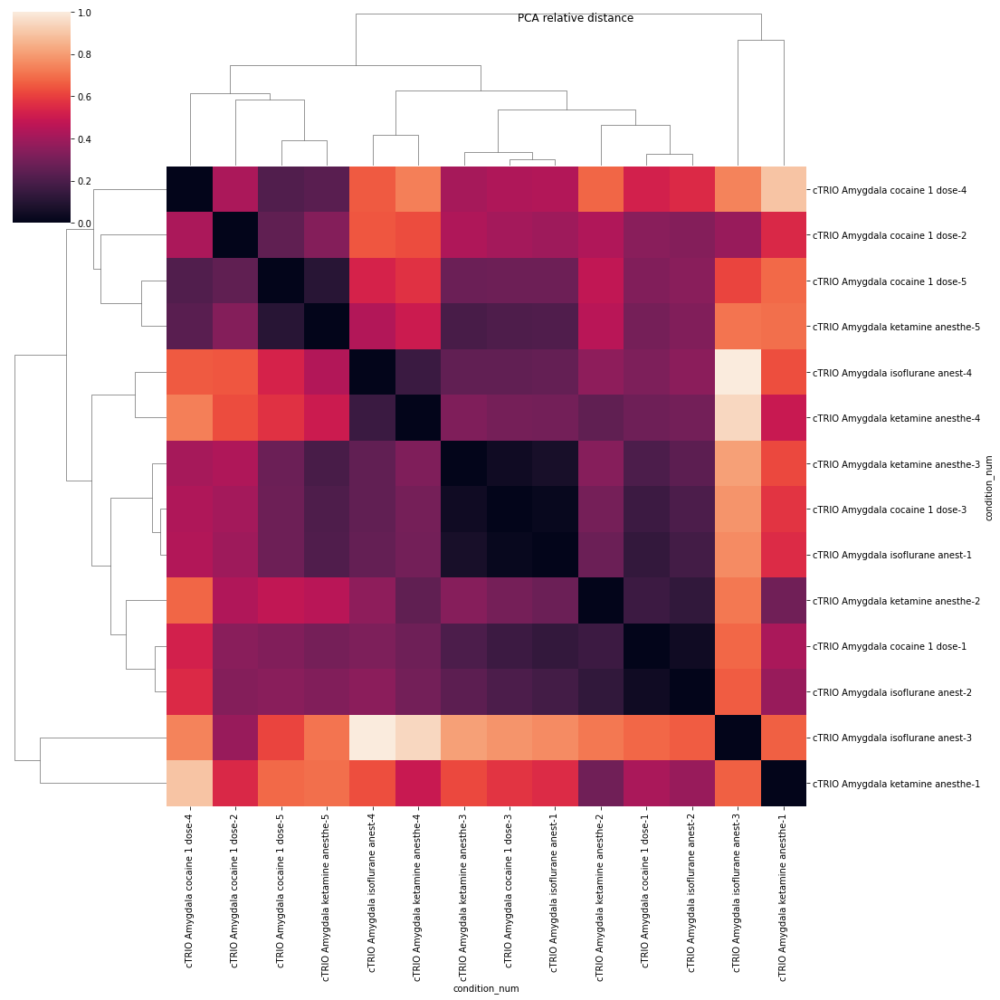

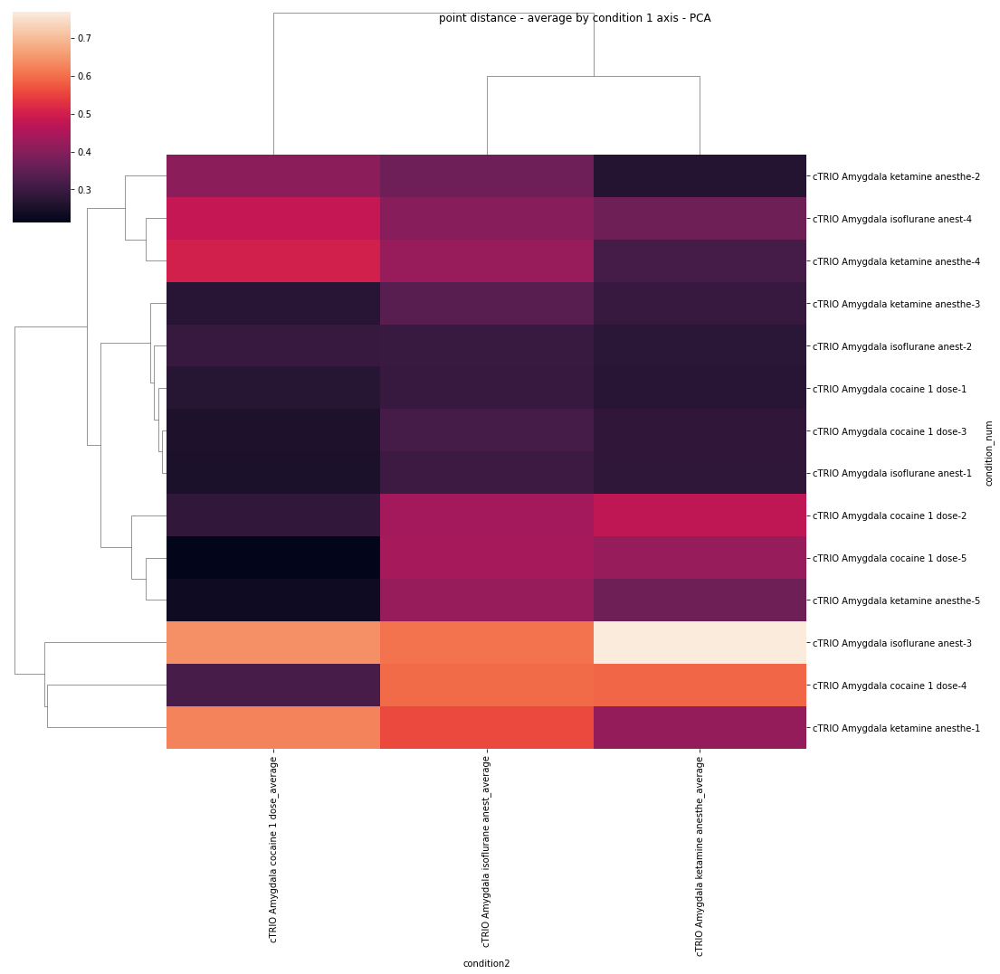

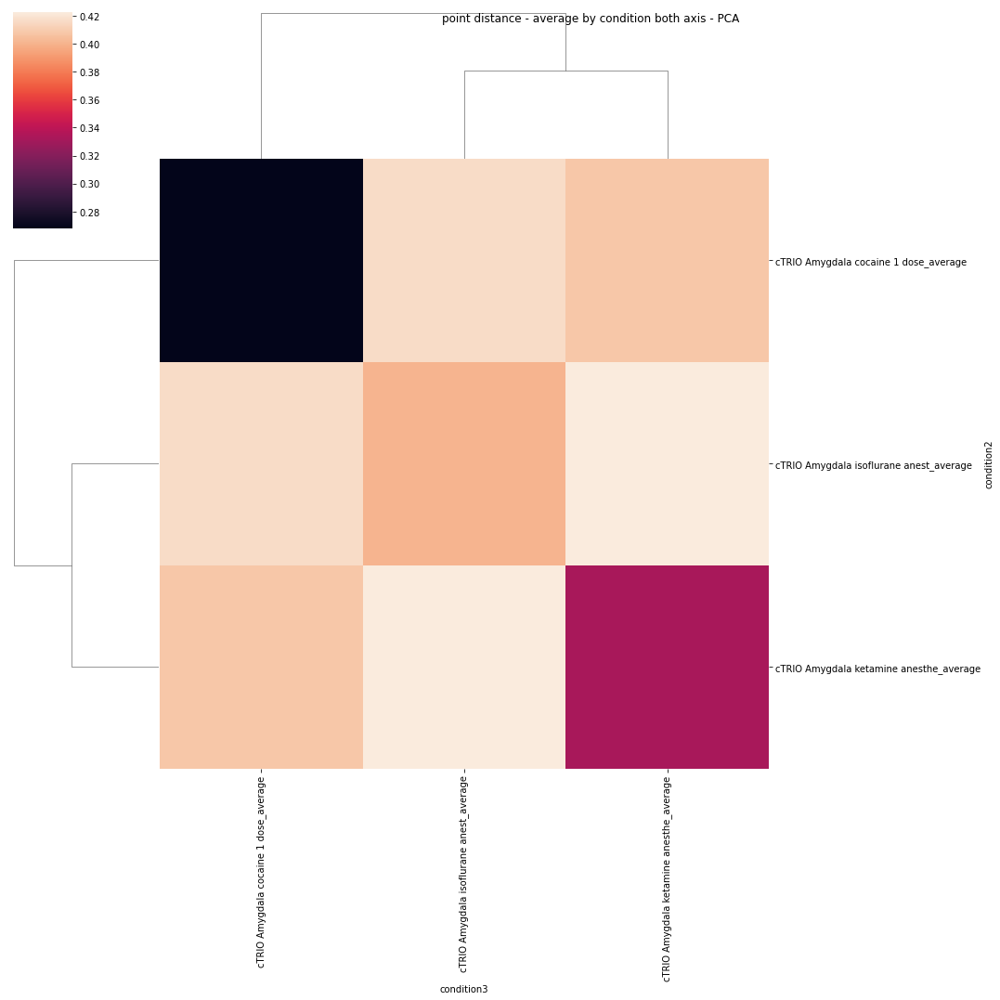

In [136]:
pca_dist=pca_distance(X_scaled,labels)
heatmapdf = pd.DataFrame(pca_dist,index=condition_nums,columns=condition_nums)
cm = sns.clustermap(heatmapdf,yticklabels=True)
cm.fig.suptitle("PCA relative distance")
cm.fig.set_size_inches(18, 18)
plt.show()
distance_to_other_points(pca_dist,labels,condition_nums,' - PCA') # pca 

### UMAP

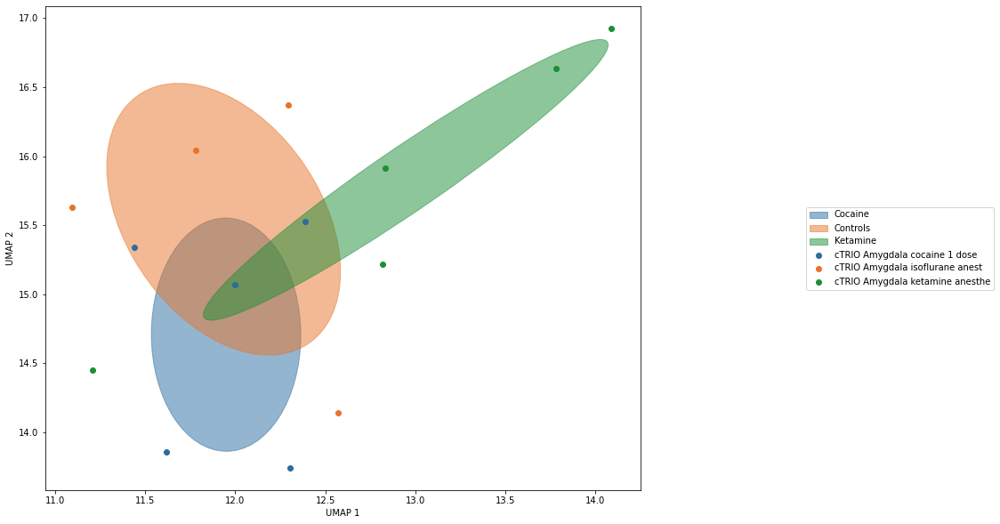

C:\Users\Kat\anaconda3\lib\site-packages\seaborn\matrix.py:619: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  linkage = hierarchy.linkage(self.array, method=self.method,


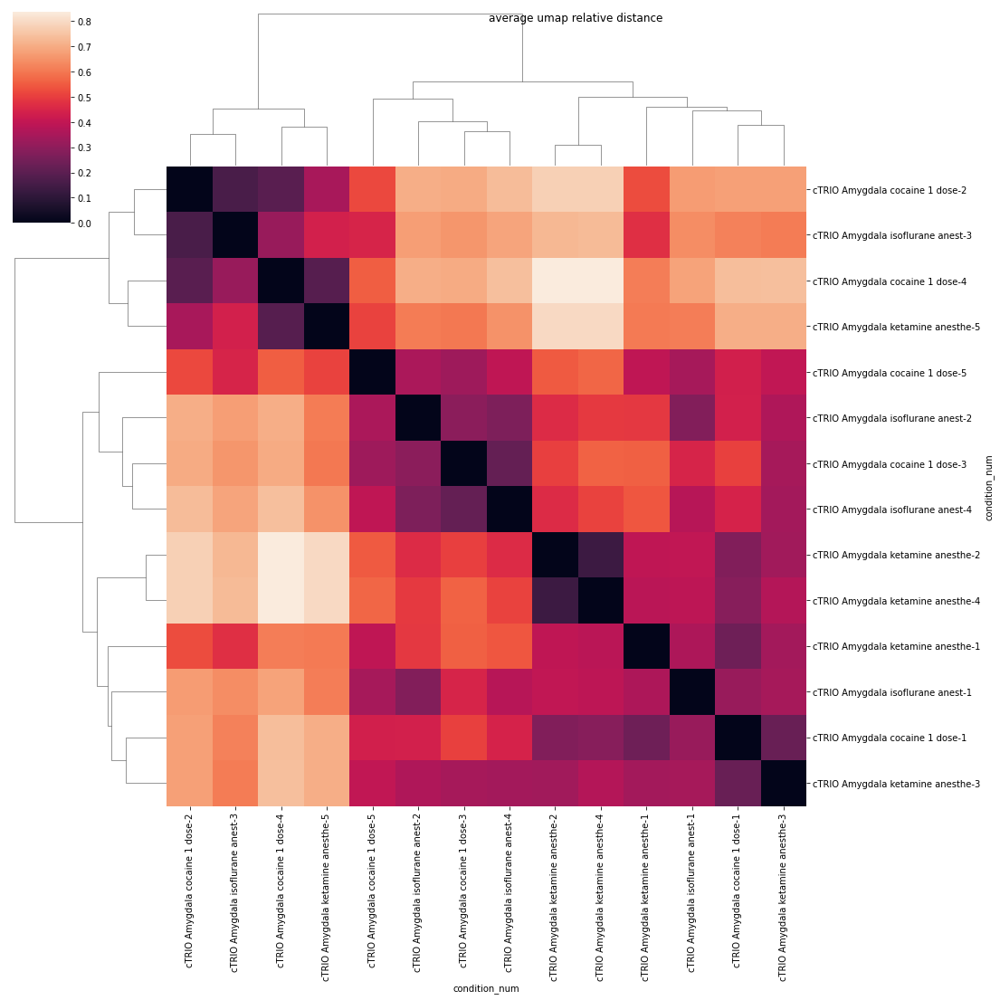

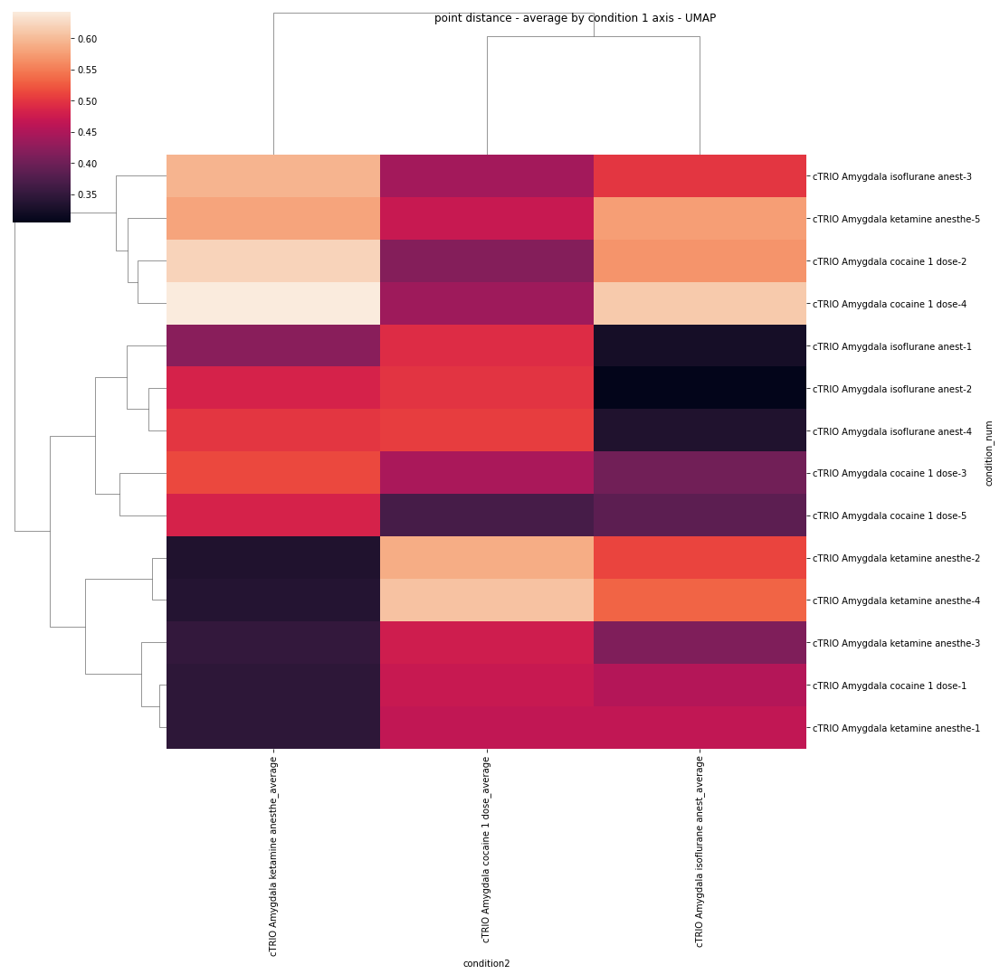

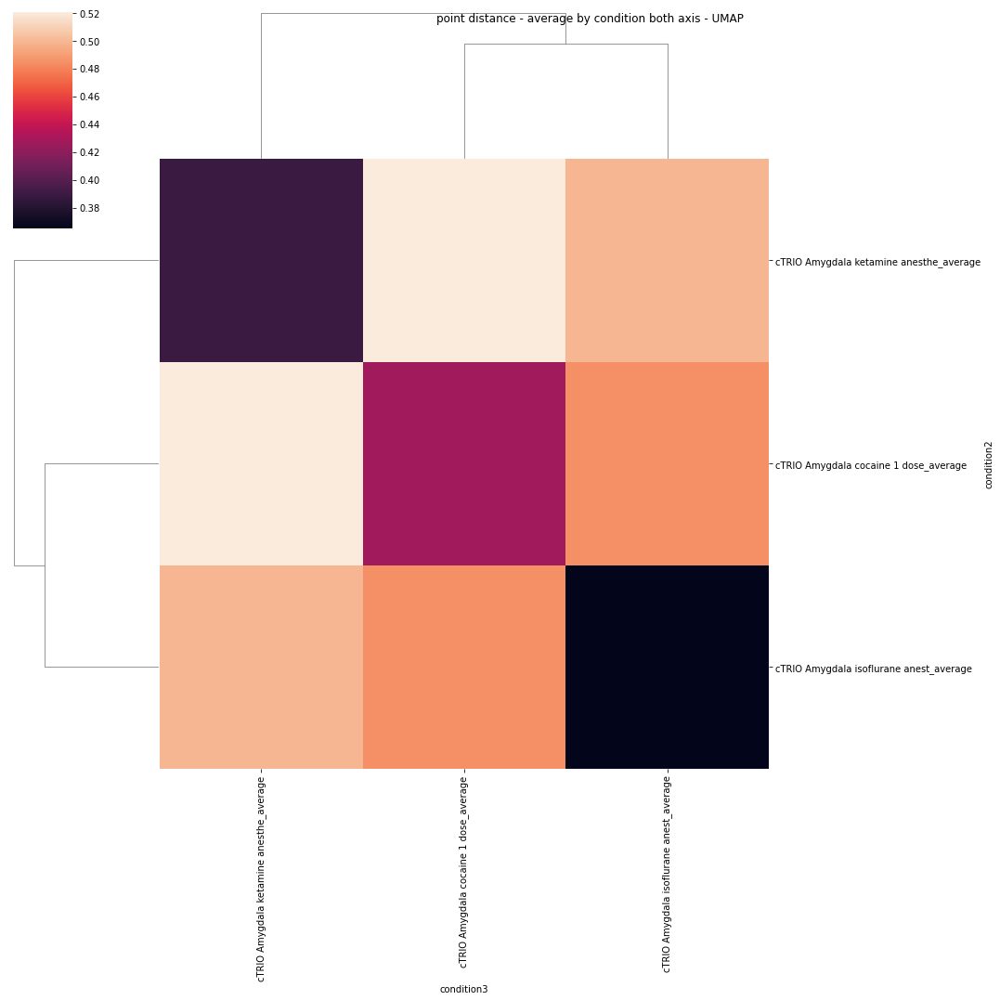

In [137]:
umap_and_heatmap(X_scaled,labels,condition_nums,figname1='figures/note0-in127-1.svg',figname2='figures/note0-in127-2.svg',figname3='figures/note0-in127-3.svg',figname4='figures/note0-in127-4.svg')

# mPFC (below)

In [138]:
def get_feats_and_labels(dataframe):
    labels=dataframe['condition']
    condition_nums=dataframe['condition_num']
    features=dataframe.iloc[: , 2:24]
    if scrambled == 'yes':
        features = features.sample(frac=1).reset_index(drop=True)
    regions=features.columns
    return features, labels, condition_nums, regions

In [139]:
mPFC_data.reset_index(inplace=True)

In [140]:
features, labels, condition_nums, regions = get_feats_and_labels(mPFC_data)

In [141]:
#scale X 
X=features.to_numpy().astype(float)
#get rid of NAs before scaling
X_scaled=zscore(X,axis=0)

In [142]:
#can change n_components to more if you want to visualize in 3D 
pca = PCA(n_components=5)
#PCA using the scaled drug data array made earlier
principalComponents = pca.fit_transform(X_scaled)
#make into dataframe if you want to view with labels
principalDf = pd.DataFrame(data = principalComponents
             , columns = ['principal component 1', 'principal component 2', 'principal component 3', 'principal component 4', 'principal component 5'])
region_components=pd.DataFrame(data = pca.components_ , columns = regions)
#view df
print('Explained variance for each PC: 1, 2, 3')
print(pca.explained_variance_)
principalDf

Explained variance for each PC: 1, 2, 3
[5.59551573 3.87476998 2.86047876 2.28299577 2.25802762]


,principal component 1,principal component 2,principal component 3,principal component 4,principal component 5
0,1.549338,-2.712509,-0.690232,-1.425806,-1.320716
1,-0.482636,-1.576720,3.600533,-1.005082,-0.966818
2,5.249015,2.178388,2.855469,1.386705,0.613494
3,-2.219045,-0.522162,0.312779,-0.723081,-0.652605
4,1.615279,1.164221,1.592778,-0.369763,-0.894683
5,0.047319,0.280836,0.360851,0.726382,-2.082406
6,-1.324129,1.765344,-0.434153,0.918883,-0.226920
7,0.937748,0.128841,-3.165922,3.019495,-1.483093
8,1.327769,-1.431936,-1.967958,-1.566101,1.225394
9,-2.241354,-0.408306,1.015858,-1.223697,0.363833


### PCA plots

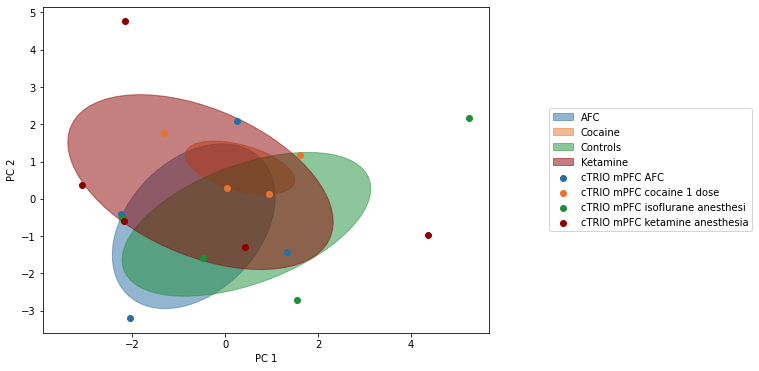

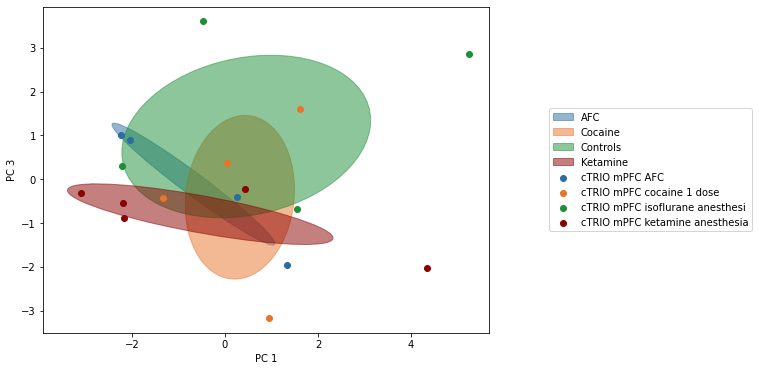

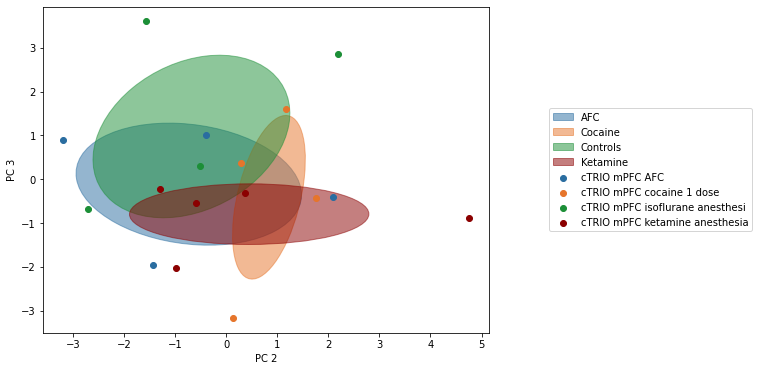

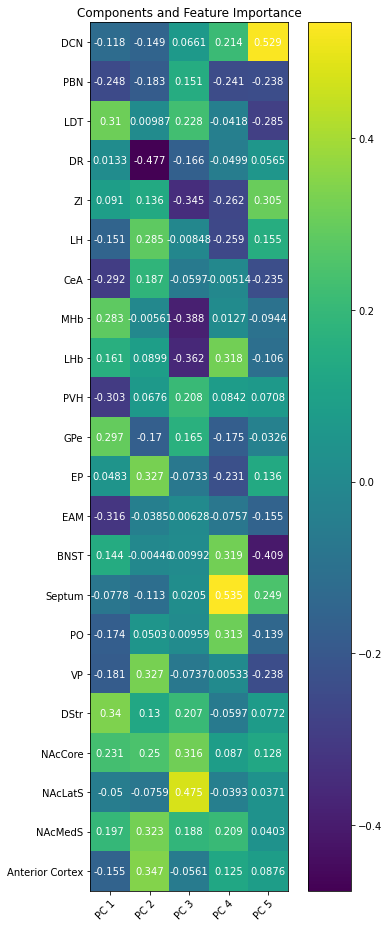

In [143]:
pc1=principalDf['principal component 1']
pc2=principalDf['principal component 2']
pc3=principalDf['principal component 3']
group = condition_nums 
make_pca_plots(pc1,pc2,pc3,group,labels,figname1='figures/note0-in133-1.svg',figname2='figures/note0-in133-2.svg',figname3='figures/note0-in133-3.svg')
plot_components(region_components,figname4='figures/note0-in133-4.svg')

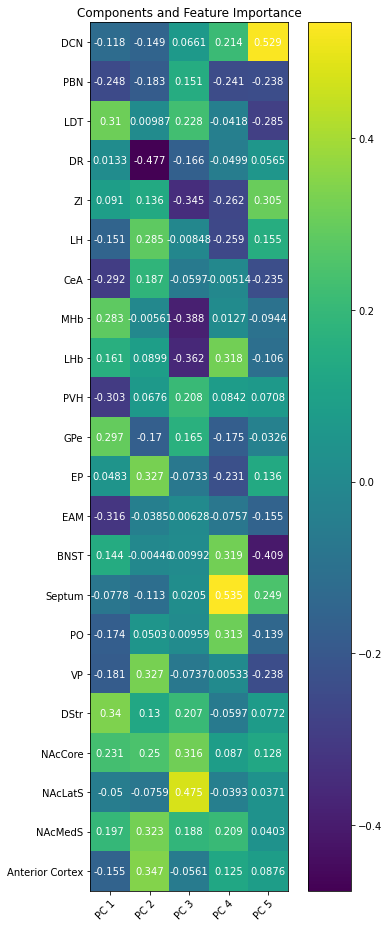

In [144]:
plot_components(region_components,figname4='figures/fig4mpfcb_note0in134.svg')

C:\Users\Kat\anaconda3\lib\site-packages\seaborn\matrix.py:619: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  linkage = hierarchy.linkage(self.array, method=self.method,


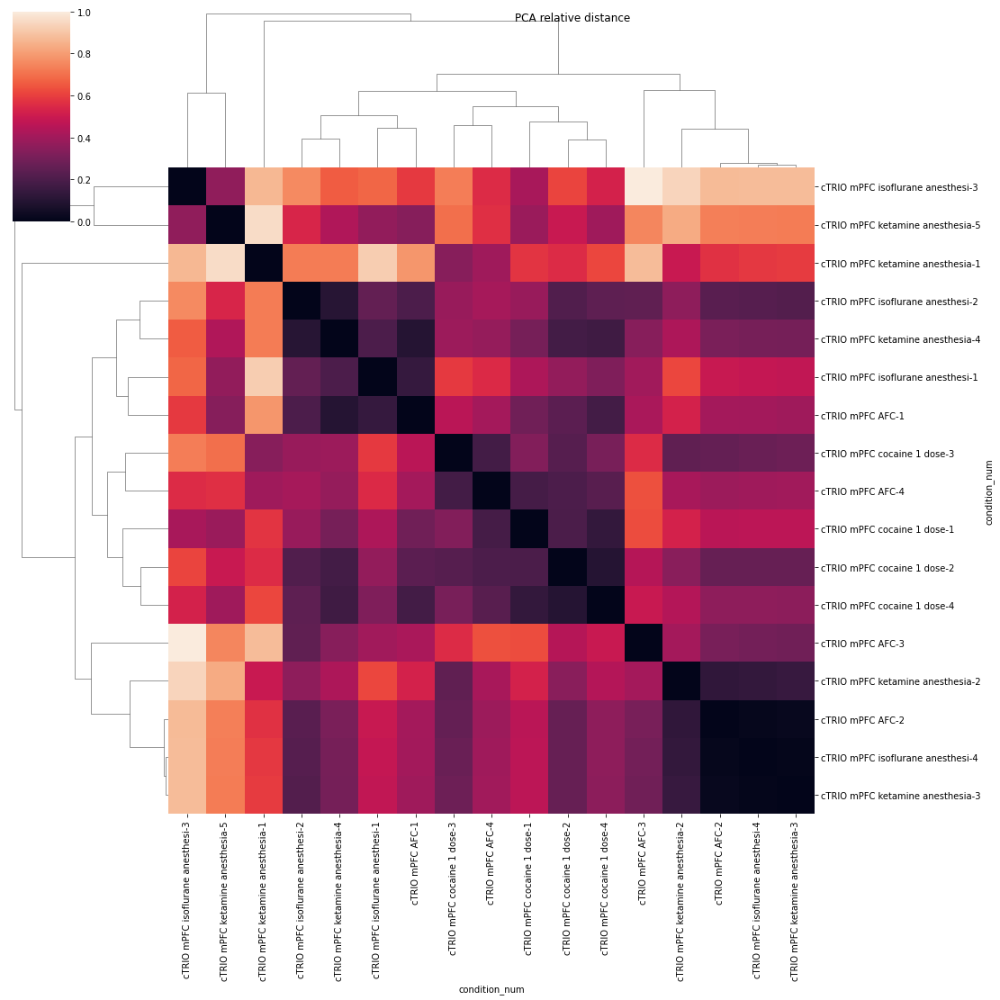

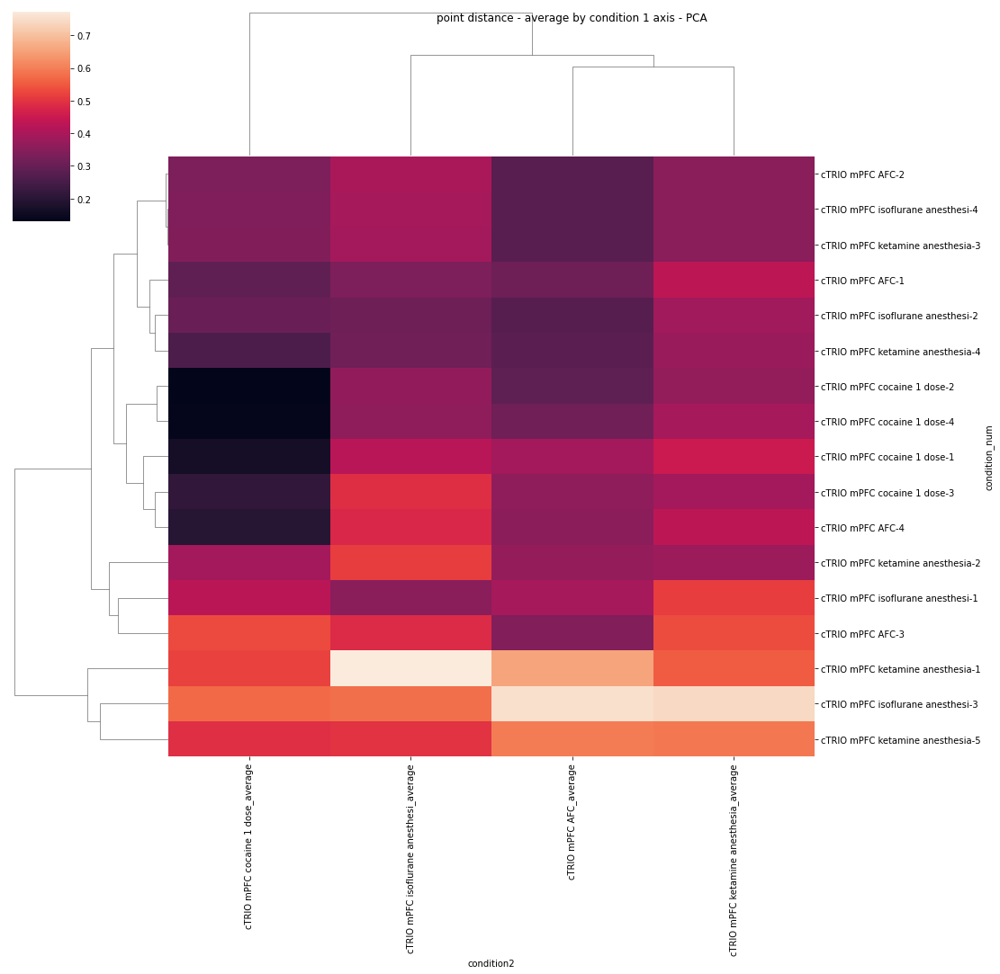

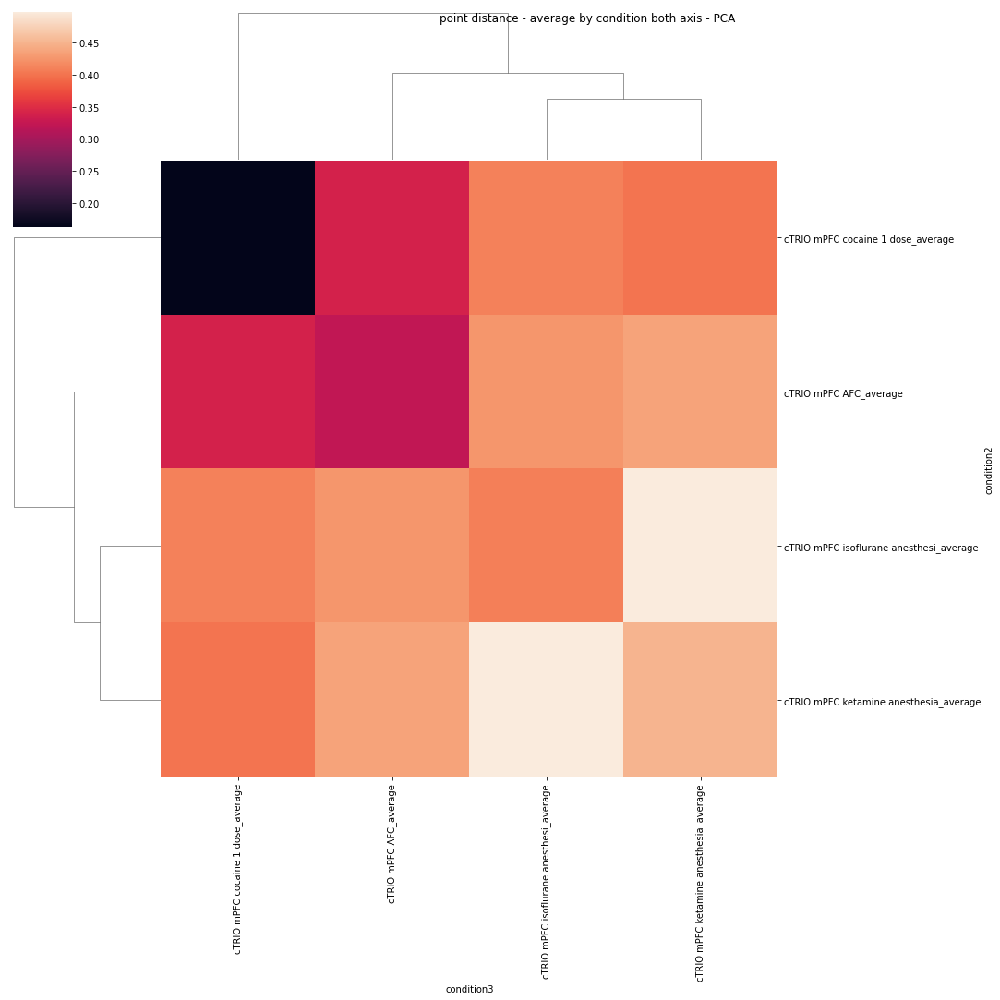

In [145]:
pca_dist=pca_distance(X_scaled,labels)
heatmapdf = pd.DataFrame(pca_dist,index=condition_nums,columns=condition_nums)
cm = sns.clustermap(heatmapdf,yticklabels=True)
cm.fig.suptitle("PCA relative distance")
cm.fig.set_size_inches(18, 18)
plt.show()
distance_to_other_points(pca_dist,labels,condition_nums,' - PCA') # pca 

### UMAP

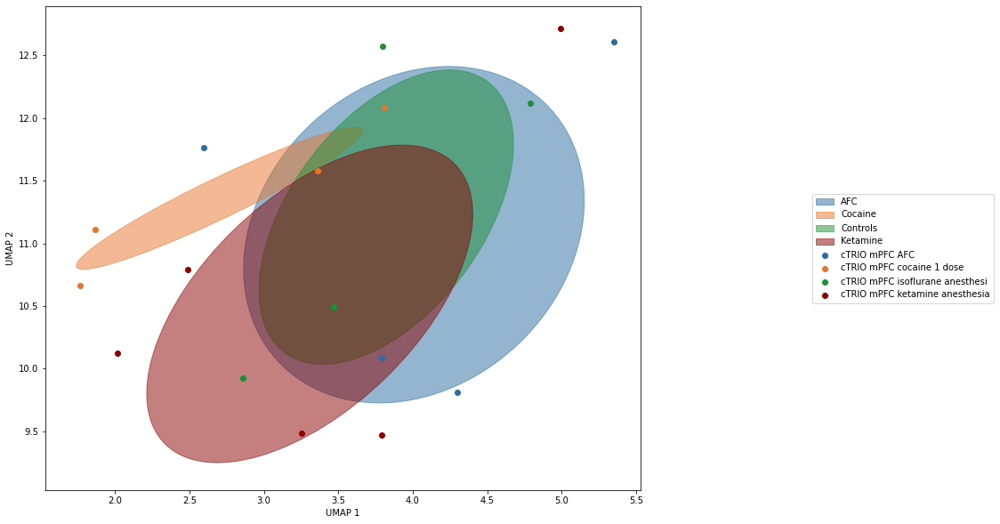

C:\Users\Kat\anaconda3\lib\site-packages\seaborn\matrix.py:619: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  linkage = hierarchy.linkage(self.array, method=self.method,


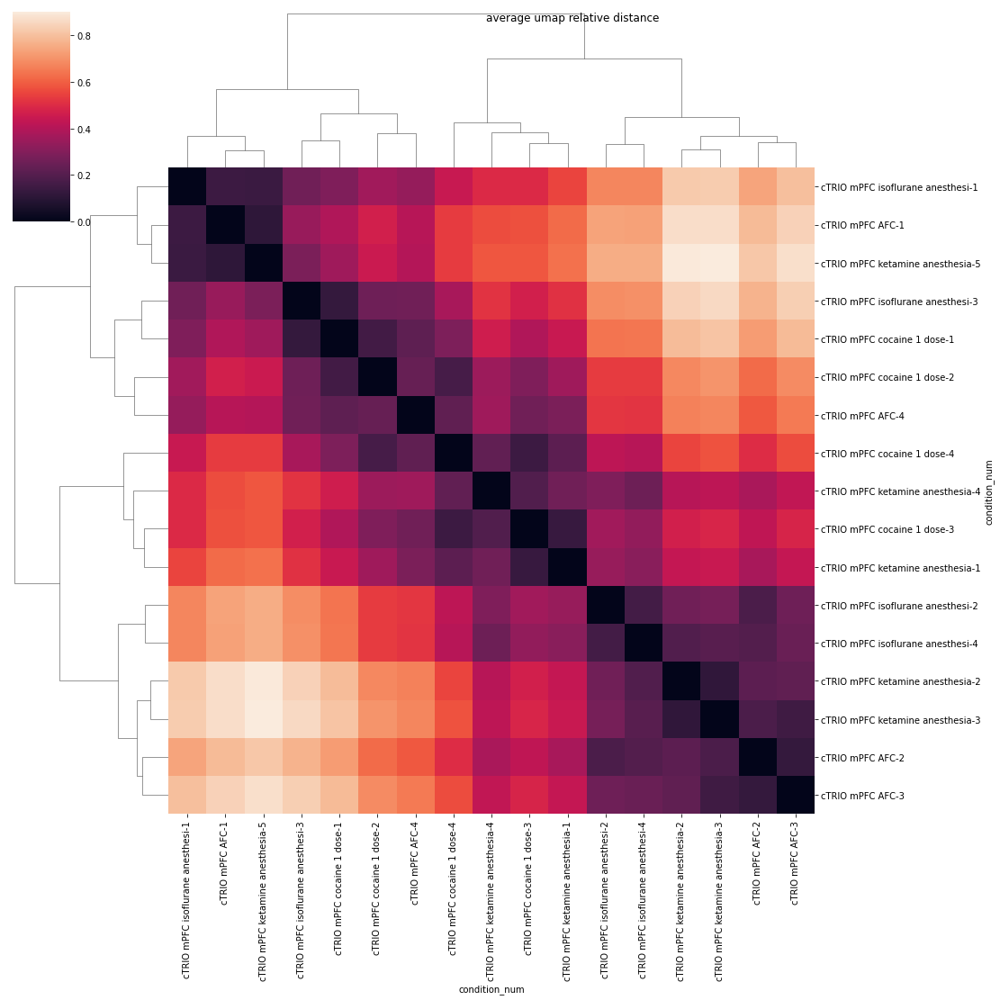

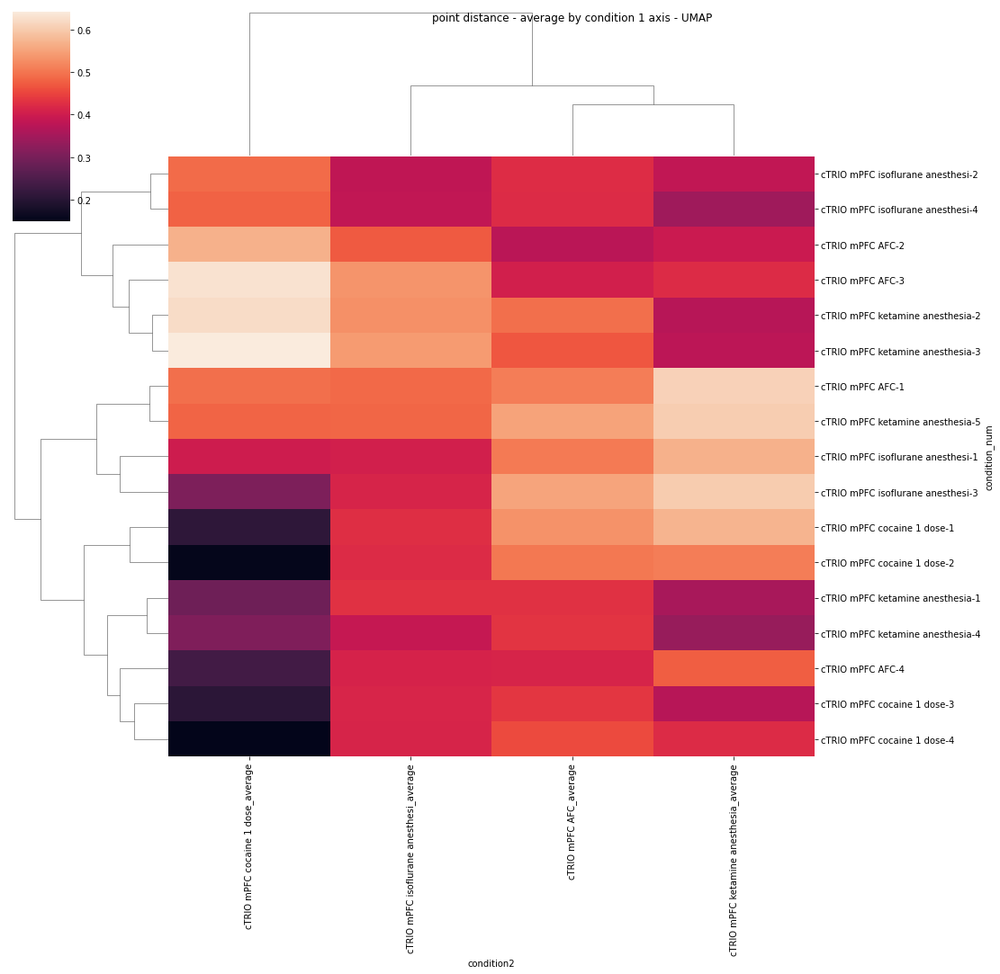

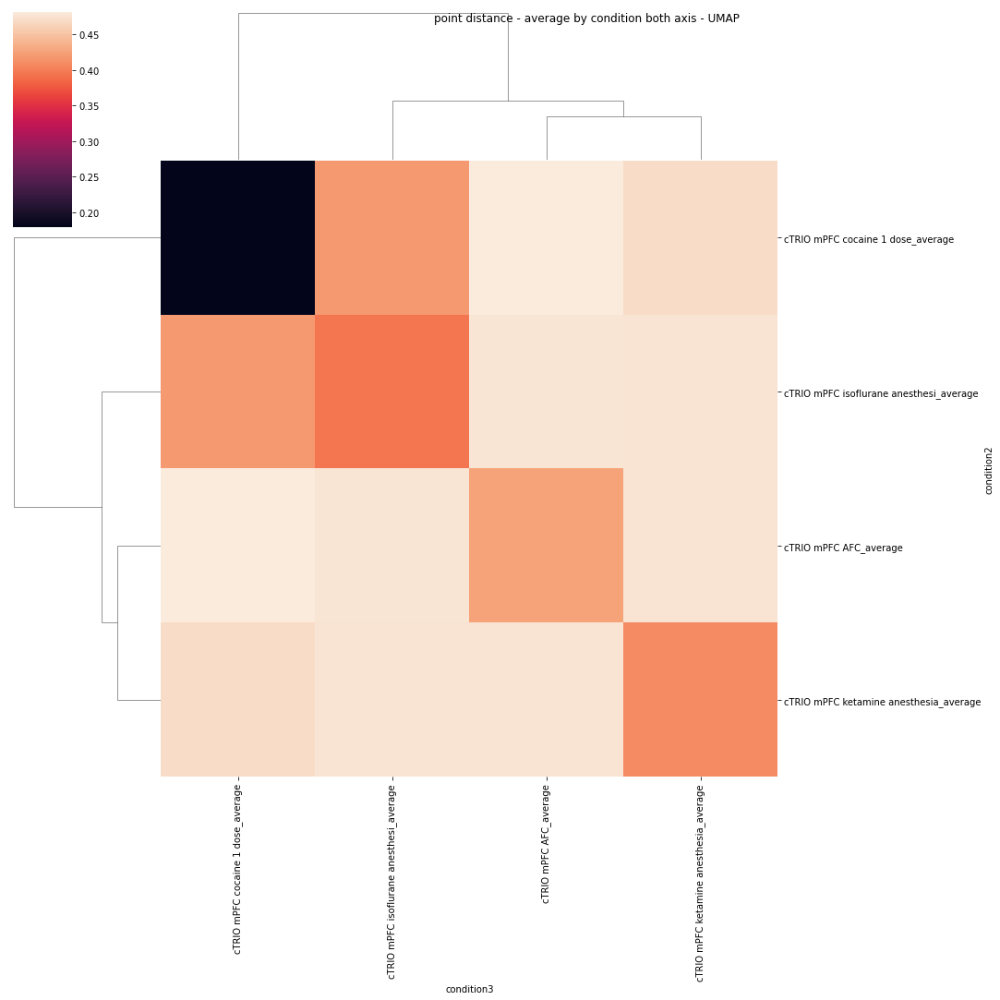

In [146]:
umap_and_heatmap(X_scaled,labels,condition_nums,figname1='figures/fig4mpfcc_note0in136.svg',figname4='figures/fig4mpfcd_note0in136.svg')

# mPFC cocaine v saline

Explained variance for each PC: 1, 2, 3
[8.48911457 5.70807107 4.43058331 2.52669557 2.35748593]


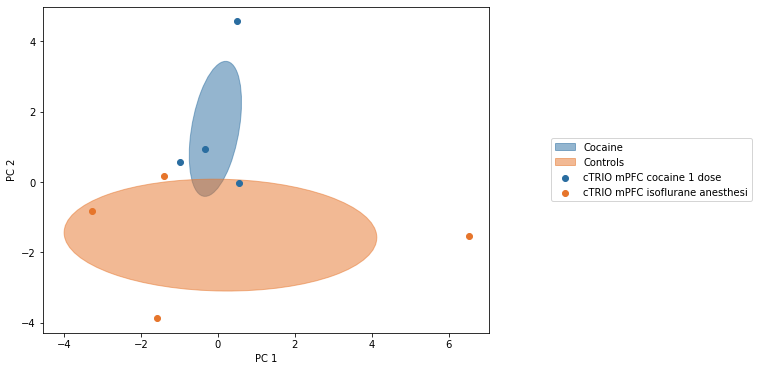

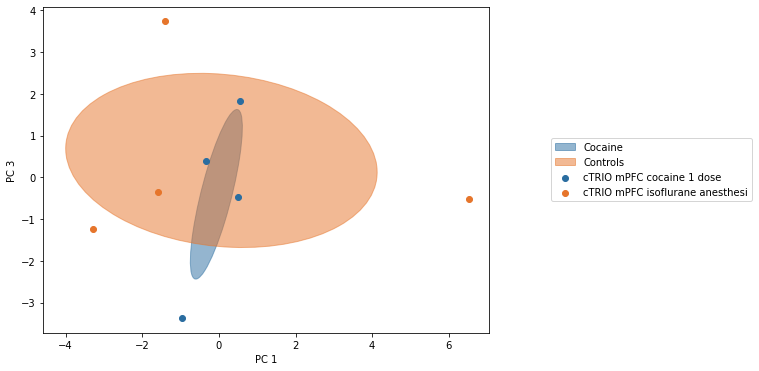

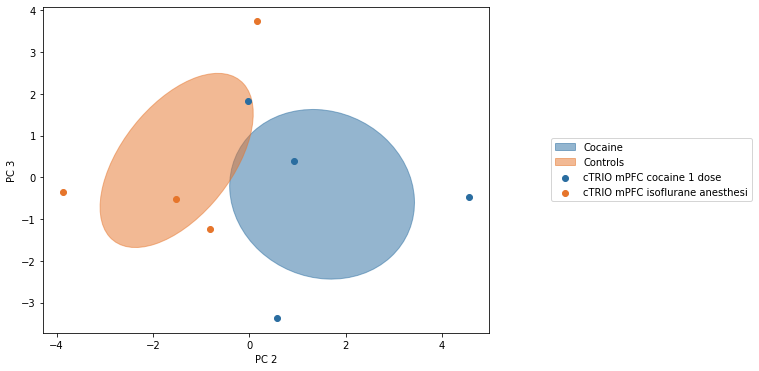

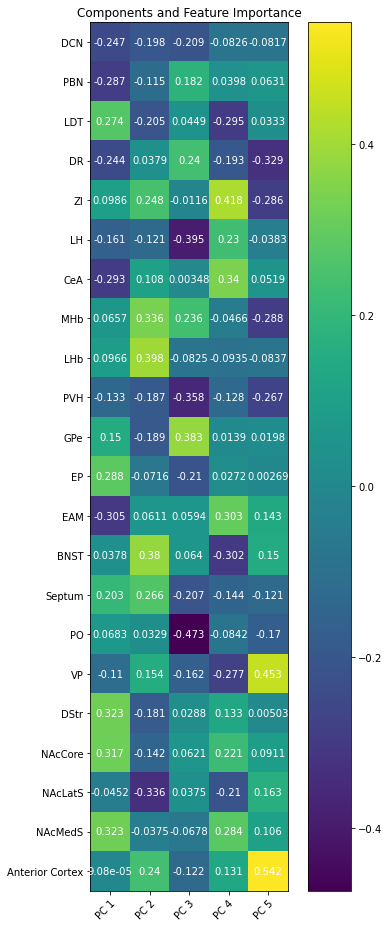

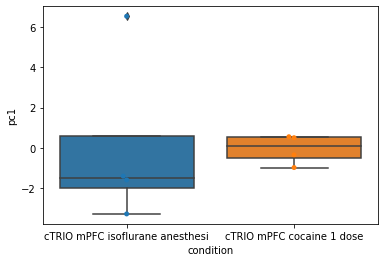

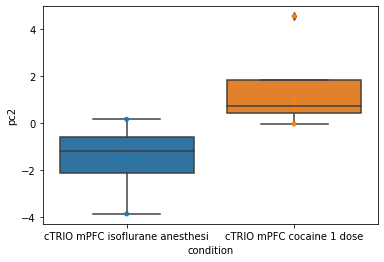

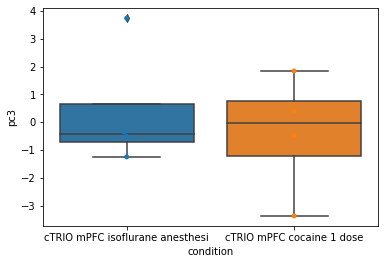

In [149]:
#make proper dataframe here!
mPFC_data2=mPFC_data[(mPFC_data["condition"] == 'cTRIO mPFC cocaine 1 dose')| 
                (mPFC_data["condition"] == 'cTRIO mPFC isoflurane anesthesi')]
features, labels, condition_nums, regions = get_feats_and_labels(mPFC_data2)
X=features.to_numpy( dtype=np.float64)
#get rid of NAs before scaling
X_scaled=zscore(X,axis=0)

#can change n_components to more if you want to visualize in 3D 
pca = PCA(n_components=5)
#PCA using the scaled drug data array made earlier
principalComponents = pca.fit_transform(X_scaled)
#make into dataframe if you want to view with labels
principalDf = pd.DataFrame(data = principalComponents
             , columns = ['principal component 1', 'principal component 2', 'principal component 3', 'principal component 4', 'principal component 5'])
region_components=pd.DataFrame(data = pca.components_ , columns = regions)
#view df
print('Explained variance for each PC: 1, 2, 3')
print(pca.explained_variance_)

pc1=principalDf['principal component 1']
pc2=principalDf['principal component 2']
pc3=principalDf['principal component 3']
group = condition_nums 
make_pca_plots(pc1,pc2,pc3,group,labels,grouped_elipse='yes',figname1='figures/cocaine-v-saline/mPFC-M-pc1.svg',figname2='figures/temp.svg',figname3='figures/temp.svg')
plot_components(region_components,figname4='figures/cocaine-v-saline/mPFC-M-comps.svg')
align_embed= pd.DataFrame({'pc1': pc1.values,'pc2': pc2.values,'pc3': pc3.values},index=labels)
value=align_embed['pc1']
treatments=align_embed.index
ax = sns.boxplot(x=treatments, y=value)
ax = sns.swarmplot(x=treatments, y=value) #4d-NAcLat  4g-Amyg   4j-NAcMed   4m-mPFC
plt.savefig('figures/temp.svg')
plt.show()
value=align_embed['pc2']
ax = sns.boxplot(x=treatments, y=value)
ax = sns.swarmplot(x=treatments, y=value)
plt.savefig('figures/temp.svg')
plt.show()
value=align_embed['pc3']
ax = sns.boxplot(x=treatments, y=value)
ax = sns.swarmplot(x=treatments, y=value)
plt.savefig('figures/temp.svg')
plt.show()
 

# mPFC 
# No FC condition (below)

In [ ]:
#make proper dataframe here!
mPFC_data2=mPFC_data[(mPFC_data["condition"] == 'cTRIO mPFC ketamine anesthesia') |
                (mPFC_data["condition"] == 'cTRIO mPFC cocaine 1 dose')| 
                (mPFC_data["condition"] == 'cTRIO mPFC isoflurane anesthesi')]
features, labels, condition_nums, regions = get_feats_and_labels(mPFC_data2)

In [ ]:
#make proper dataframe here!
mPFC_data2=mPFC_data[(mPFC_data["condition"] == 'cTRIO mPFC cocaine 1 dose')| 
                (mPFC_data["condition"] == 'cTRIO mPFC isoflurane anesthesi')]
featuresmPFC, labelsmPFC, condition_numsmPFC, regionsmPFC = get_feats_and_labels(mPFC_data2)
print(labelsmPFC)
print(condition_numsmPFC)
print(len(condition_numsmPFC))

In [ ]:
#scale X 
X=features.to_numpy().astype(float)
#get rid of NAs before scaling
X_scaled=zscore(X,axis=0)

In [ ]:
#can change n_components to more if you want to visualize in 3D 
pca = PCA(n_components=5)
#PCA using the scaled drug data array made earlier
principalComponents = pca.fit_transform(X_scaled)
#make into dataframe if you want to view with labels
principalDf = pd.DataFrame(data = principalComponents
             , columns = ['principal component 1', 'principal component 2', 'principal component 3', 'principal component 4', 'principal component 5'])
region_components=pd.DataFrame(data = pca.components_ , columns = regions)
#view df
print('Explained variance for each PC: 1, 2, 3')
print(pca.explained_variance_)
principalDf

### PCA plots

In [ ]:
pc1=principalDf['principal component 1']
pc2=principalDf['principal component 2']
pc3=principalDf['principal component 3']
group = condition_nums 
make_pca_plots(pc1,pc2,pc3,group,labels,figname1='figures/PCA-stats/PC2-3_figure4/mPFC1.svg',figname2='figures/PCA-stats/PC2-3_figure4/mPFC2.svg',figname3='figures/PCA-stats/PC2-3_figure4/mPFC3.svg')
plot_components(region_components,figname4='figures/note0-in141-4.svg')
align_embed= pd.DataFrame({'pc1': pc1.values,'pc2': pc2.values,'pc3': pc3.values},index=labels)
value=align_embed['pc1']
treatments=align_embed.index
ax = sns.boxplot(x=treatments, y=value)
ax = sns.swarmplot(x=treatments, y=value) # 
plt.savefig('figures/PCA-stats/figure 4/4m-mPFC-PC1-boxplot.svg')
plt.show()
value=align_embed['pc2']
ax = sns.boxplot(x=treatments, y=value)
ax = sns.swarmplot(x=treatments, y=value)
plt.savefig('figures/PCA-stats/figure 4/4m-mPFC-PC2-boxplot.svg')
plt.show()
value=align_embed['pc3']
ax = sns.boxplot(x=treatments, y=value)
ax = sns.swarmplot(x=treatments, y=value)
plt.savefig('figures/PCA-stats/figure 4/4m-mPFC-PC3-boxplot.svg')
plt.show()

df_melt= pd.DataFrame({'value':align_embed['pc1'],'treatments': align_embed.index})
#!pip install bioinfokit
from bioinfokit.analys import stat
res = stat()
res.tukey_hsd(df=df_melt, res_var='value', xfac_var='treatments', anova_model='value ~ C(treatments)')
res.tukey_summary.to_csv('figures/PCA-stats/figure 4/4m-mPFC-PC1-stat.csv')

df_melt= pd.DataFrame({'value':align_embed['pc2'],'treatments': align_embed.index})
#!pip install bioinfokit 
res = stat()
res.tukey_hsd(df=df_melt, res_var='value', xfac_var='treatments', anova_model='value ~ C(treatments)')
res.tukey_summary.to_csv('figures/PCA-stats/figure 4/4m-mPFC-PC2-stat.csv')

df_melt= pd.DataFrame({'value':align_embed['pc3'],'treatments': align_embed.index})
#!pip install bioinfokit 
res = stat()
res.tukey_hsd(df=df_melt, res_var='value', xfac_var='treatments', anova_model='value ~ C(treatments)')
res.tukey_summary.to_csv('figures/PCA-stats/figure 4/4m-mPFC-PC3-stat.csv')


df_melt= pd.DataFrame({'pc1':align_embed['pc1'],'pc2':align_embed['pc2'],'pc3':align_embed['pc3'],'treatments': treatments})
df_melt.to_csv('figures/PCA-stats/PC-values-for-Kevin/Figure_4M_PC1-3.csv')

In [ ]:
pca_dist=pca_distance(X_scaled,labels)
heatmapdf = pd.DataFrame(pca_dist,index=condition_nums,columns=condition_nums)
cm = sns.clustermap(heatmapdf,yticklabels=True)
cm.fig.suptitle("PCA relative distance")
cm.fig.set_size_inches(18, 18)
plt.show()
distance_to_other_points(pca_dist,labels,condition_nums,' - PCA') # pca 

### UMAP

In [ ]:
umap_and_heatmap(X_scaled,labels,condition_nums,figname1='figures/note0-in143-1.svg',figname2='figures/note0-in143-2.svg',figname3='figures/note0-in143-3.svg',figname4='figures/note0-in143-4.svg')

# DAT-cre and 66T (8 brains)

In [ ]:
def get_feats_and_labels(dataframe):
    labels=dataframe['Experimental condition']
    condition_nums=dataframe['condition_nums']
    features=dataframe.iloc[: , 1:23]
    if scrambled == 'yes':
        features = features.sample(frac=1).reset_index(drop=True)
    regions=features.columns
    return features, labels, condition_nums, regions

In [ ]:
features_datcre66t, labels_datcre66t, condition_nums_datcre66t, regions_datcre66t = get_feats_and_labels(DATcre66T)
features, labels, condition_nums, regions = features_datcre66t, list(labels_datcre66t), condition_nums_datcre66t, regions_datcre66t
#scale X 
X=features.to_numpy().astype(float)
#get rid of NAs before scaling

X_scaled=zscore(X,axis=0)

In [ ]:
#can change n_components to more if you want to visualize in 3D 
pca = PCA(n_components=5)
#PCA using the scaled drug data array made earlier
principalComponents = pca.fit_transform(X_scaled)
#make into dataframe if you want to view with labels
principalDf = pd.DataFrame(data = principalComponents
             , columns = ['principal component 1', 'principal component 2', 'principal component 3', 'principal component 4', 'principal component 5'])
region_components=pd.DataFrame(data = pca.components_ , columns = regions)
#view df
print('Explained variance for each PC: 1, 2, 3')
print(pca.explained_variance_)
principalDf

### PCA Plots

In [ ]:
pc1=principalDf['principal component 1']
pc2=principalDf['principal component 2']
pc3=principalDf['principal component 3']
group = condition_nums 
make_pca_plots(pc1,pc2,pc3,group,labels,grouped_elipse='no',figname1='figures/note0-in147-1.svg',figname2='figures/note0-in147-2.svg',figname3='figures/note0-in147-3.svg')
plot_components(region_components,figname4='figures/note0-in147-4.svg')

In [ ]:
pca_dist=pca_distance(X_scaled,labels)
heatmapdf = pd.DataFrame(pca_dist,index=condition_nums,columns=condition_nums)
cm = sns.clustermap(heatmapdf,yticklabels=True)
cm.fig.suptitle("PCA relative distance")
cm.fig.set_size_inches(18, 18)
plt.show()
distance_to_other_points(pca_dist,labels,condition_nums,' - PCA') # pca 

### UMAP

In [ ]:
umap_and_heatmap(X_scaled,labels,condition_nums,grouped_elipse='no',figname1='figures/note0-in149-1.svg',figname2='figures/note0-in149-2.svg',figname3='figures/note0-in149-3.svg',figname4='figures/note0-in149-4.svg')

# DAT-cre and 66T and Gad2Cre (no drugs)

In [ ]:
features, labels, condition_nums, regions = get_feats_and_labels(DATcre66T_gad2)
labels=list(labels)+list(labels3)
condition_nums=list(condition_nums)+list(condition_nums3)
#scale X 
X=features.to_numpy().astype(float)
X2=features3.to_numpy().astype(float)
X=np.vstack((X, X2))
#get rid of NAs before scaling

X_scaled=zscore(X,axis=0)

In [ ]:
#can change n_components to more if you want to visualize in 3D 
pca = PCA(n_components=5)
#PCA using the scaled drug data array made earlier
principalComponents = pca.fit_transform(X_scaled)
#make into dataframe if you want to view with labels
principalDf = pd.DataFrame(data = principalComponents
             , columns = ['principal component 1', 'principal component 2', 'principal component 3', 'principal component 4', 'principal component 5'])
region_components=pd.DataFrame(data = pca.components_ , columns = regions)
#view df
print('Explained variance for each PC: 1, 2, 3')
print(pca.explained_variance_)
principalDf

### PCA Plots

In [ ]:
pc1=principalDf['principal component 1']
pc2=principalDf['principal component 2']
pc3=principalDf['principal component 3']
make_pca_plots(pc1,pc2,pc3,condition_nums ,labels,grouped_elipse='no',figname1='figures/note0-in152-1.svg',figname2='figures/note0-in152-2.svg',figname3='figures/note0-in152-3.svg')
plot_components(region_components,figname4='figures/note0-in152-4.svg')

In [ ]:
pca_dist=pca_distance(X_scaled,labels)
heatmapdf = pd.DataFrame(pca_dist,index=condition_nums,columns=condition_nums)
cm = sns.clustermap(heatmapdf,yticklabels=True)
cm.fig.suptitle("PCA relative distance")
cm.fig.set_size_inches(18, 18)
plt.show()
distance_to_other_points(pca_dist,labels,condition_nums,' - PCA') # pca 

### UMAP

In [ ]:
umap_and_heatmap(X_scaled,labels,condition_nums,grouped_elipse='no',figname1='figures/note0-in154-1.svg',figname2='figures/note0-in154-2.svg',figname3='figures/note0-in154-3.svg',figname4='figures/note0-in154-4.svg')

# DAT-Cre vs GAD2-Cre vs GluT2-Cre

In [ ]:
features2, labels2, condition_nums2, regions2 = get_feats_and_labels(DATcre66T_gad2)
features3, labels3, condition_nums3, regions3 = get_feats_and_labels(VGlut2_cre)
labels=list(labels2)+list(labels4)+list(labels3)
condition_nums=list(condition_nums2)+list(condition_nums4)+list(condition_nums3)
#scale X 

X2=features2.to_numpy().astype(float)
X3=features3.to_numpy().astype(float)
X4=features4.to_numpy().astype(float)
#features4, labels4, condition_nums4, regions4
X=np.vstack((X2, X4))
X=np.vstack((X, X3))
#get rid of NAs before scaling

X_scaled=zscore(X,axis=0)
print(condition_nums)
print(len)

In [ ]:
#can change n_components to more if you want to visualize in 3D 
pca = PCA(n_components=5)
#PCA using the scaled drug data array made earlier
principalComponents = pca.fit_transform(X_scaled)
#make into dataframe if you want to view with labels
principalDf = pd.DataFrame(data = principalComponents
             , columns = ['principal component 1', 'principal component 2', 'principal component 3', 'principal component 4', 'principal component 5'])
region_components=pd.DataFrame(data = pca.components_ , columns = regions)
#view df
print('Explained variance for each PC: 1, 2, 3')
print(pca.explained_variance_)
principalDf

### PCA Plots

In [ ]:
pc1=principalDf['principal component 1']
pc2=principalDf['principal component 2']
pc3=principalDf['principal component 3']
make_pca_plots(pc1,pc2,pc3,condition_nums ,labels,grouped_elipse='no',figname1='figures/note0-in157-1.svg',figname2='figures/note0-in157-2.svg',figname3='figures/note0-in157-3.svg')
plot_components(region_components,figname4='figures/note0-in157-4.svg')
align_embed= pd.DataFrame({'pc1': pc1.values,'pc2': pc2.values,'pc3': pc3.values},index=labels)
align_embed

In [ ]:
align_embed= pd.DataFrame({'pc1': pc1.values,'pc2': pc2.values,'pc3': pc3.values},index=labels)
value=align_embed['pc1'] ## need to run - restart and run all
treatments=align_embed.index
ax = sns.boxplot(x=treatments, y=value)
ax = sns.swarmplot(x=treatments, y=value)
plt.savefig('figures/PCA-stats/figure 1/dat-gad-glut-PC1-boxplot.svg')
plt.show()
value=align_embed['pc2']
ax = sns.boxplot(x=treatments, y=value)
ax = sns.swarmplot(x=treatments, y=value)
plt.savefig('figures/PCA-stats/figure 1/dat-gad-glut-PC2-boxplot.svg')
plt.show()
value=align_embed['pc3']
ax = sns.boxplot(x=treatments, y=value)
ax = sns.swarmplot(x=treatments, y=value)
plt.savefig('figures/PCA-stats/figure 1/dat-gad-glut-PC3-boxplot.svg')
plt.show()

df_melt= pd.DataFrame({'value':align_embed['pc1'],'treatments': align_embed.index})
#!pip install bioinfokit
from bioinfokit.analys import stat
res = stat()
res.tukey_hsd(df=df_melt, res_var='value', xfac_var='treatments', anova_model='value ~ C(treatments)')
res.tukey_summary.to_csv('figures/PCA-stats/figure 1/dat-gad-glut-PC1-stat.csv')

df_melt= pd.DataFrame({'value':align_embed['pc2'],'treatments': align_embed.index})
#!pip install bioinfokit 
res = stat()
res.tukey_hsd(df=df_melt, res_var='value', xfac_var='treatments', anova_model='value ~ C(treatments)')
res.tukey_summary.to_csv('figures/PCA-stats/figure 1/dat-gad-glut-PC2-stat.csv')

df_melt= pd.DataFrame({'value':align_embed['pc3'],'treatments': align_embed.index})
#!pip install bioinfokit 
res = stat()
res.tukey_hsd(df=df_melt, res_var='value', xfac_var='treatments', anova_model='value ~ C(treatments)')
res.tukey_summary.to_csv('figures/PCA-stats/figure 1/dat-gad-glut-PC3-stat.csv')
print(res.tukey_summary)
df_melt= pd.DataFrame({'pc1':align_embed['pc1'],'pc2':align_embed['pc2'],'pc3':align_embed['pc3'],'treatments': treatments})
df_melt.to_csv('figures/PCA-stats/PC-values-for-Kevin/Figure_1E_PC1-3.csv')

In [ ]:
pca_dist=pca_distance(X_scaled,labels)
heatmapdf = pd.DataFrame(pca_dist,index=condition_nums,columns=condition_nums)
cm = sns.clustermap(heatmapdf,yticklabels=True)
cm.fig.suptitle("PCA relative distance")
cm.fig.set_size_inches(18, 18)
plt.show()
distance_to_other_points(pca_dist,labels,condition_nums,' - PCA') # pca 

### UMAP

In [ ]:
umap_and_heatmap(X_scaled,labels,condition_nums,grouped_elipse='no',figname1='figures/fig1c_note0in159.svg',figname4='figures/fig1d_note0in159.svg')

# DMS

In [ ]:
features=featuresDMS
labels=labelsDMS
condition_nums=condition_numsDMS
regions=regionsDMS

X=features.to_numpy().astype(float)

X_scaled=zscore(X,axis=0)
#can change n_components to more if you want to visualize in 3D 
pca = PCA(n_components=5)
#PCA using the scaled drug data array made earlier
principalComponents = pca.fit_transform(X_scaled)
#make into dataframe if you want to view with labels
principalDf = pd.DataFrame(data = principalComponents
             , columns = ['principal component 1', 'principal component 2', 'principal component 3', 'principal component 4', 'principal component 5'])
region_components=pd.DataFrame(data = pca.components_ , columns = regions)
#view df
print('Explained variance for each PC: 1, 2, 3')
print(pca.explained_variance_)
principalDf

### PCA Plots

In [ ]:
pc1=principalDf['principal component 1']
pc2=principalDf['principal component 2']
pc3=principalDf['principal component 3']
make_pca_plots(pc1,pc2,pc3,condition_nums ,labels,grouped_elipse='yes',figname1='figures/note0-in161-1.svg',figname2='figures/note0-in161-2.svg',figname3='figures/note0-in161-3.svg')
plot_components(region_components,figname4='figures/note0-in161-4.svg')

In [ ]:
pca_dist=pca_distance(X_scaled,labels)
heatmapdf = pd.DataFrame(pca_dist,index=condition_nums,columns=condition_nums)
cm = sns.clustermap(heatmapdf,yticklabels=True)
cm.fig.suptitle("PCA relative distance")
cm.fig.set_size_inches(18, 18)
plt.show()
distance_to_other_points(pca_dist,labels,condition_nums,' - PCA') # pca 

### UMAP

In [ ]:
umap_and_heatmap(X_scaled,labels,condition_nums,figname1='figures/note0-in163-1.svg',figname2='figures/note0-in163-2.svg',figname3='figures/note0-in163-3.svg',figname4='figures/note0-in163-4.svg')

# Controls vs cocaine - all conditions

for coc vs saline, it should be all of the conditions. for saline, it should be DAT-Cre, 66T, plus all the DAT-Cre cTRIO saline conditions (there should be about 20 of them). then a roughly equal number of cocaine conditions. so it should be approx a 20 x 20 comparison

Cocaine includes:

-cTRIO DMS cocaine

-cTRIO NAcLat cocaine

-mPFC cocaine

-Amygdala cocaine

-DLS cocaine

-Nacmed cocaine

Controls includes:

-cTRIO DMS saline

-NAcLat iso saline controls

-DAT-Cre

-DAT-Cre 66T

-mPFC saline

-Amygdala saline

-DLS saline
 
-Nacmed saline

In [ ]:

#DLSs = ['DLS_sal','DLS_coc1x','DLS_FC']
categories= pd.DataFrame({'group_name':['Psychostimulants','Ketamine','Controls',
                          'Psychostimulants','Other','Other','Fluoxetine','Other',
                          'Other','GAD2-Cre','GAD2-Cre','GAD2-Cre','Other','Other','Psychostimulants'],'condition5':all_DA_cells})
categories2= pd.DataFrame({'group_name':['Cocaine','Controls',
                          'FC','Ketamine'],'condition5':NAcMeds})
categories3= pd.DataFrame({'group_name':['Cocaine','Controls',
                          'FC','Ketamine'],'condition5':NAcLats})
categories4= pd.DataFrame({'group_name':['Cocaine','Controls','AFC',
                          'Ketamine'],'condition5':['cTRIO Amygdala cocaine 1 dose','cTRIO Amygdala isoflurane anest','cTRIO Amygdala AFC','cTRIO Amygdala ketamine anesthe']})
categories5= pd.DataFrame({'group_name':['Controls','Cocaine',
                          'AFC','Ketamine'],'condition5':['cTRIO mPFC isoflurane anesthesi','cTRIO mPFC cocaine 1 dose','cTRIO mPFC AFC','cTRIO mPFC ketamine anesthesia']})
categories6= pd.DataFrame({'group_name':['Controls','Controls','GAD2-Cre'],'condition5':['DAT-Cre', 'DAT-Cre 66T','Gad2-Cre']})
categories7= pd.DataFrame({'group_name':['Controls'],'condition5':['vGluT2-Cre']})
categories8= pd.DataFrame({'group_name':['Controls','Cocaine','Controls','Psychostimulants','Controls','Cocaine','Controls','Cocaine','Controls','Ketamine'],'condition5':['DLS_sal','DLS_coc1x','DLS_FC','Caffeine','cTRIO DMS saline','cTRIO DMS cocaine','cTRIO mPFC isoflurane anesthesi','cTRIO mPFC cocaine 1 dose','cTRIO mPFC AFC','cTRIO mPFC ketamine anesthesia']})

categories=pd.concat([categories,categories2,categories3,categories4,categories5,categories6,categories7,categories8])

In [ ]:
uniq_colors2=['slateblue','peru','darkorange',
             'magenta','cyan','lightcoral','lawngreen',
             'burlywood','red','mediumorchid','gray','royalblue','darkred','hotpink',
             'khaki','palegreen','seagreen','orange','lavender',
             'steelblue','navy','dodgerblue','thistle','violet',
             'deeppink','pink'] # to use later
def get_feats_and_labels(dataframe): #gets features and conditions (drugs) and brain regions
    labels=dataframe['condition'].values
    condition_nums=dataframe['condition_num'].values
    features=dataframe.iloc[: , 2:24]
    if scrambled == 'yes':
        features = features.sample(frac=1).reset_index(drop=True)
    regions=features.columns
    return features, labels, condition_nums, regions

In [ ]:
# NAcLat_data 'cTRIO NAcLat cocaine','NAcLat iso saline controls'
NAcLat_data2=NAcLat_data[(NAcLat_data["condition"] == 'cTRIO NAcLat cocaine')| 
                (NAcLat_data["condition"] == 'NAcLat iso saline controls')]
features, labels, condition_nums, regions= get_feats_and_labels(NAcLat_data2)

In [ ]:
regions=sorted(regions_datcre66t)

In [ ]:
#features_nacmed, labels_nacmed, condition_nums_nacmed, regions_nacmed 
labels=list(labels)+list(labelsDMS)+list(labels_datcre66t)+list(labelsmPFC)+list(labels_amyg)+list(labels_DLS)+list(labels_nacmed)
condition_nums=list(condition_nums)+list(condition_numsDMS)+list(condition_nums_datcre66t)+list(condition_numsmPFC)+list(condition_nums_amyg)+list(condition_nums_DLS)+list(condition_nums_nacmed)

X1=features.sort_index(axis=1).to_numpy().astype(float)
X2=featuresDMS.sort_index(axis=1).to_numpy().astype(float)
X3=features_datcre66t.sort_index(axis=1).to_numpy().astype(float)
X4=featuresmPFC.sort_index(axis=1).to_numpy().astype(float)
X_amyg=features_amyg.sort_index(axis=1).to_numpy().astype(float)
X_DLS=features_DLS.sort_index(axis=1).to_numpy().astype(float)
X_nacmed=features_nacmed.sort_index(axis=1).to_numpy().astype(float)
X5=np.vstack((X1, X2))
X6=np.vstack((X5, X3))
X7=np.vstack((X6, X4))
X8=np.vstack((X7, X_amyg))
X9=np.vstack((X8, X_DLS))
X=np.vstack((X9, X_nacmed))
X_scaled=zscore(X,axis=0)

#can change n_components to more if you want to visualize in 3D 
pca = PCA(n_components=5)
#PCA using the scaled drug data array made earlier
principalComponents = pca.fit_transform(X_scaled)
#make into dataframe if you want to view with labels
principalDf = pd.DataFrame(data = principalComponents
             , columns = ['principal component 1', 'principal component 2', 'principal component 3', 'principal component 4', 'principal component 5'])
region_components=pd.DataFrame(data = pca.components_ , columns = regions)
#view df
print('Explained variance for each PC: 1, 2, 3')
print(pca.explained_variance_)
principalDf

### PCA Plots

In [ ]:
pc1=principalDf['principal component 1']
pc2=principalDf['principal component 2']
pc3=principalDf['principal component 3']
make_pca_plots(pc1,pc2,pc3,condition_nums ,labels,grouped_elipse='yes',figname1='figures/note0-in169-1.svg',figname2='figures/note0-in169-2.svg',figname3='figures/note0-in169-3.svg')
plot_components(region_components,figname4='figures/note0-in169-4.svg')

In [ ]:
pca_dist=pca_distance(X_scaled,labels)
heatmapdf = pd.DataFrame(pca_dist,index=condition_nums,columns=condition_nums)
cm = sns.clustermap(heatmapdf,yticklabels=True)
cm.fig.suptitle("PCA relative distance")
cm.fig.set_size_inches(18, 18)
plt.show()
distance_to_other_points(pca_dist,labels,condition_nums,' - PCA') # pca 

### UMAP

In [ ]:
umap_and_heatmap(X_scaled,labels,condition_nums,grouped_elipse='yes',figname1='figures/note0-in171-1.svg',figname2='figures/note0-in171-2.svg',figname3='figures/note0-in171-3.svg',figname4='figures/note0-in171-4.svg')